<a href="https://colab.research.google.com/github/TomerShimshi/DeepLearning-course-Final-Project-Brats-challenge/blob/main/OurProjectipynb_resnet10_seg_4_%2Bunet_with_grad.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import argparse
!git clone https://github.com/Tencent/MedicalNet
%load MedicalNet/setting.py


Cloning into 'MedicalNet'...
remote: Enumerating objects: 114, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 114 (delta 3), reused 3 (delta 0), pack-reused 105
Receiving objects: 100% (114/114), 47.63 MiB | 31.57 MiB/s, done.
Resolving deltas: 100% (46/46), done.


load all relevent libs

In [ ]:


import math
import os
import random
import matplotlib.pyplot as plt
import torch, fastai, sys
sys.path.insert(0, './exp')
from sklearn.preprocessing import Binarizer
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

!pip install medpy
from medpy import metric

import numpy as np
from torch.utils.data import Dataset
import nibabel
from scipy import ndimage
import h5py
from torchvision import transforms

import torch, fastai, sys, os
!pip install antspyx
from fastai.vision import *
#import ants
import pathlib
#from ants.core.ants_image import ANTsImage
!pip install jupyterthemes
from jupyterthemes import jtplot
sys.path.insert(0, './exp')
jtplot.style(theme='gruvboxd')

     |████████████████████████████████| 151 kB 5.3 MB/s 
     |████████████████████████████████| 48.4 MB 6.5 kB/s 
  Created wheel for medpy: filename=MedPy-0.4.0-cp37-cp37m-linux_x86_64.whl size=754477 sha256=2db3f893e50de3290b856a1d13cdcf810c8e555850e4a84c5358068411e5bd56
  Stored in directory: /root/.cache/pip/wheels/b0/57/3a/da1183f22a6afb42e11138daa6a759de233fd977a984333602
Successfully built medpy
     |████████████████████████████████| 300.4 MB 11 kB/s 
     |████████████████████████████████| 64 kB 2.9 MB/s 
     |████████████████████████████████| 7.0 MB 4.3 MB/s 
     |████████████████████████████████| 9.9 MB 36.0 MB/s 
     |████████████████████████████████| 46 kB 4.0 MB/s 
     |████████████████████████████████| 49 kB 5.9 MB/s 
     |████████████████████████████████| 428 kB 35.0 MB/s 
  Attempting uninstall: tornado
    Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:
      Successfully uninstalled tornado-5.1.1
  Attempting uninstall: notebook
    F

mount to drive

In [ ]:

from google.colab import drive
drive.mount('/content/drive')
path = Path('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training')
print(path)


Mounted at /content/drive
drive  MedicalNet  sample_data
/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training


patch added the settings.py file

In [ ]:
#@title argparser
'''
Configs for training & testing
Written by Whalechen
'''

import argparse

#parser = argparse.ArgumentParser()

def parse_opts():
    
    parser = argparse.ArgumentParser()
    
    parser.add_argument(
        '--data_root',
        default='/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training',
        type=str,
        help='Root directory path of data')
    parser.add_argument(
        '--input_patch_size',
        default='120, 136, 120',
        type=str,
        help='Root directory path of data')
    parser.add_argument(
        '--orig_patch_size',
        default='120, 136, 120',
        type=str,
        help='list of HWD of input')
    parser.add_argument(
        '--img_list',
        default='/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training/test.txt',
        type=str,
        help='Path for image list file')
    parser.add_argument(
        '--img_name',
        default='Null',
        type=str,
        help='Path for image current img')
    parser.add_argument('--iters', type=str,  default='11000,10000', help='checkpoint iteration(s)')
    parser.add_argument(
        '--n_seg_classes',
        default=3,
        type=int,
        help="Number of segmentation classes"
    )
    #print('finished 1 method')
    parser.add_argument(
        '--learning_rate',  # set to 0.001 when finetune
        default=0.001,
        type=float,
        help=
        'Initial learning rate (divided by 10 while training by lr scheduler)')
    
    parser.add_argument(
        '--num_workers',
        default=4,
        type=int,
        help='Number of jobs')
    parser.add_argument(
        '--batch_size', default=1, type=int, help='Batch Size')
    parser.add_argument(
        '--phase', default='train', type=str, help='Phase of train or test')
    parser.add_argument(
        '--save_intervals',
        default=10,
        type=int,
        help='Interation for saving model')
    parser.add_argument(
        '--n_epochs',
        default=200,
        type=int,
        help='Number of total epochs to run')
    parser.add_argument(
        '--input_D',
    default=56,
        type=int,
        help='Input size of depth')
    parser.add_argument(
        '--input_H',
        default=448,
        type=int,
        help='Input size of height')
    parser.add_argument(
        '--input_W',
        default=448,
        type=int,
        help='Input size of width')
    parser.add_argument(
        '--resume_path',
        default='',
        type=str,
        help=
        'Path for resume model.'
    )
    
    #print('finished 2 method')
    parser.add_argument(
        '--bce_weight',
        default='[0., 3, 1, 1.75]',
        type=list,
        help=
        'not sure, somthing for the loss func.'
    )
    parser.add_argument(
        '--new_layer_names',
        #default=['upsample1', 'cmp_layer3', 'upsample2', 'cmp_layer2', 'upsample3', 'cmp_layer1', 'upsample4', 'cmp_conv1', 'conv_seg'],
        default=['conv_seg'],
        type=list,
        help='New layer except for backbone')
    parser.add_argument(
        '--no_cuda', action='store_true', help='If true, cuda is not used.')
    parser.set_defaults(no_cuda=False)
    parser.add_argument(
        '--gpu_id',
        nargs='+',
        type=int,              
        help='Gpu id lists')
    parser.add_argument(
        '--model',
        default='resnet',
        type=str,
        help='(resnet | preresnet | wideresnet | resnext | densenet | ')
    parser.add_argument(
        '--model_depth',
        default=50,
        type=int,
        help='Depth of resnet (10 | 18 | 34 | 50 | 101)')
    
    parser.add_argument(
        '--resnet_shortcut',
        default='B',
        type=str,
        help='Shortcut type of resnet (A | B)')
    
    #print('finished 3 method')
    
    parser.add_argument(
        '--manual_seed', default=1, type=int, help='Manually set random seed')
    
    #print('finished 4 method')

    #!python3 parsing.py 5 "arg2"      

    #parser.add_argument(
     #   '--ci_test', action='store_true', help='If true, ci testing is used.')
    parser.add_argument(
        '--ci_test', action='store_true', help='If true, ci testing is used.')
    args = parser.parse_args(args=[])
    #args = parser.parse_args()
    
    #print('finished 5 method')
    !python3 parsing.py 5
    #for avi
    #args.save_folder = "/content/drive/My Drive/Deep Learning Final Project/trails/models/{}_{}".format(args.model, args.model_depth)
    #for shimshi
    args.save_folder = "/content/drive/My Drive/Deep Learning Final Project/trails/models/{}_{}".format( args.model,  args.model_depth )
    print('finished last method')
    return args

sets =parse_opts()  

print('passed sets argparaser')

sets.img_list = path/'test.txt' #'./toy_data/test_ci.txt' 
sets.n_epochs = 1
sets.no_cuda = True
sets.data_root = path # './toy_data'
sets.pretrain_path =  path/'pretrain/resnet_50.pth'
sets.num_workers = 0
sets.model_depth = 50
sets.resnet_shortcut = 'A'
sets.input_D = 14
sets.input_H = 28
sets.input_W = 28

print('finished sets')

#BrainS18Dataset(sets.data_root, sets.img_list, sets)
#BrainS18Dataset(path,loadtxt_str(path/'test.txt'))

python3: can't open file 'parsing.py': [Errno 2] No such file or directory
finished last method
passed sets argparaser
finished sets


trying a new data loader

In [ ]:


from tqdm import tqdm


#----- this is the new brats map label

def brats_map_label(labels, num_classes):
    if type(labels) == torch.Tensor and torch.cuda.is_available():
        labels_nhot = torch.zeros((num_classes,) + labels.shape, device='cuda')
    else:
        labels_nhot = np.zeros((num_classes,) + labels.shape, dtype=int)
    #https://www.med.upenn.edu/cbica/brats2019/data.html and https://arxiv.org/pdf/1811.02629.pdf here is the mapping  page 10
    labels_nhot[0, labels==0] = 1
    labels_nhot[1,(labels==2)|(labels==3) |(labels==1)] = 1     #WT: Segmenting the whole tumor extent (Union of all labels)   # P(WT) = P(1)+P(2)+P(3)      
    labels_nhot[2,labels==3] = 1    # P(ET) = P(3)
    labels_nhot[3,(labels==1)|(labels==3)] = 1  #TC: Segmenting the gross tumor core outline # P(TC) = P(1)+P(3) 
    return labels_nhot




def label_stats(root,img_list):
    with open(img_list, 'r') as f:
            img_dirs = [line.strip() for line in f]
    
    cls_total_counts = np.zeros(4, dtype=int)
        
    for img_dir in tqdm(img_dirs):
        
        img_path= str(root)+'/'+str(img_dir)+'/'+img_dir[3:] +  ".h5"
        
        image_h5 = h5py.File(img_path)
        labels = np.array(image_h5['label']).astype(int)
        labels -= (labels == 4)
        labels_nhot = brats_map_label(labels, 4)
        cls_counts = labels_nhot.reshape(4, -1).sum(axis=1)
        print('cls_counts={}'.format(cls_counts))
        cls_total_counts += cls_counts

        tempL = np.nonzero(labels_nhot[2] == 1)
        # Find the boundary of non-zero labels
        minx, maxx = np.min(tempL[0]), np.max(tempL[0])
        miny, maxy = np.min(tempL[1]), np.max(tempL[1])
        minz, maxz = np.min(tempL[2]), np.max(tempL[2])
        H, W, D = maxx - minx, maxy - miny, maxz - minz
        
        print("%s => %s, %.2f%%" %(labels.shape, (H, W, D), (100*H*W*D/labels.size)))
                
    print(cls_total_counts)
    print(cls_total_counts / cls_total_counts.sum())
    
def covert_h5(root,img_list):
    do_localization = False
    
    if 'val' in str(img_list.stem):
        is_training = False
    else:
        print('training')
        is_training = True
     
    
    with open(img_list, 'r') as f:
            img_dirs = [line.strip() for line in f]
    
    print('img_dirs = {}'.format(img_dirs))
    modalities = [ 'flair', 't1ce', 't1', 't2' ]
    if is_training:
        print('added seg')
        modalities.append('seg')
        
    for img_dir in tqdm(img_dirs):
        image_mods = []
        for mod in modalities:
            
            img_path= str(root)+'/'+str(img_dir)+'/'+img_dir[3:] + "_%s.nii.gz" %mod
            image_obj = nibabel .load(img_path)
            print('imge after load = {}'.format(image_obj))
            image = image_obj.get_fdata()
            image = image.astype(np.float32)
            
            image_mods.append(image)
        
        if is_training:
            # image_mods contains five modalities, including 'seg'.
            # Avoid putting 'seg' into 'image'.
            image_mm = np.stack(image_mods[:-1], axis=0)
            print('imge after np.stack = {}'.format(image_mm))
            MOD, H, W, D = image_shape = image_mm.shape
            # 'seg' => labels
            labels = image_mods[-1].astype(np.uint8)
            print(' labels ={}'.format(labels))
        else:
            # image_mods contains four modalities
            image_mm = np.stack(image_mods, axis=0)
            MOD, H, W, D = image_shape = image_mm.shape
            # Save fake labels
            labels = np.zeros_like(image_mods[0]).astype(np.uint8)
            
        if is_training and do_localization:
            tempL = np.nonzero(labels)
            # Find the boundary of non-zero labels
            minx, maxx = np.min(tempL[1]), np.max(tempL[1])
            miny, maxy = np.min(tempL[2]), np.max(tempL[2])
            minz, maxz = np.min(tempL[3]), np.max(tempL[3])

            # px, py, pz ensure the output image is at least of output_size
            px = max(output_size[0] - (maxx - minx), 0) // 2
            py = max(output_size[1] - (maxy - miny), 0) // 2
            pz = max(output_size[2] - (maxz - minz), 0) // 2
            # randint(10, 20) lets randomly-sized zero margins included in the output image
            minx = max(minx - np.random.randint(10, 20) - px, 0)
            maxx = min(maxx + np.random.randint(10, 20) + px, H)
            miny = max(miny - np.random.randint(10, 20) - py, 0)
            maxy = min(maxy + np.random.randint(10, 20) + py, W)
            minz = max(minz - np.random.randint(5, 10) - pz, 0)
            maxz = min(maxz + np.random.randint(5, 10) + pz, D)
        # Do not crop black margins of validation images.
        else:
            tempL = np.nonzero(image_mm)
            # Find the boundary of non-zero voxels
            minx, maxx = np.min(tempL[1]), np.max(tempL[1])
            miny, maxy = np.min(tempL[2]), np.max(tempL[2])
            minz, maxz = np.min(tempL[3]), np.max(tempL[3])
            
        # On validation data, use image_crop to compute mean and std, and normalize image_mm.
        image_crop = image_mm[:, minx:maxx, miny:maxy, minz:maxz]
        if is_training:
            image_mm = image_crop
            labels = labels[minx:maxx, miny:maxy, minz:maxz]

        nonzero_mask = (image_mm > 0)
        for m in range(MOD):
            image_mod      = image_mm[m, :, :, :]
            image_mod_crop = image_crop[m, :, :, :]
            nonzero_voxels = image_mod_crop[image_mod_crop > 0]
            mean = nonzero_voxels.mean()
            std  = nonzero_voxels.std()
            image_mm[m, :, :, :] = (image_mod - mean) / std
        
        # Set voxels back to 0 if they are 0 before normalization.
        image_mm *= nonzero_mask
        print("\n%s: %s => %s, %s" %(img_dir, image_shape, image_mm.shape, labels.shape))

        #h5_path = os.path.join(root, img_dir, img_dir + ".h5")
        h5_path = str(root)+'/'+str(img_dir)+'/'+img_dir[3:] + ".h5"
        f = h5py.File(h5_path, 'w')
        f.create_dataset('image', data=image_mm, compression="gzip")
        f.create_dataset('label', data=labels,   compression="gzip")
        f.close()




if __name__ == '__main__':

    sets.img_list =   path/'train.txt'# path/'toy_data/test_ci.txt'
    sets.n_epochs = 10
    sets.no_cuda = True
    sets.gpu_id = [0]
    sets.data_root = path #/'toy_data'
    sets.pretrain_path =  path/'pretrain/resnet_50.pth'
    sets.num_workers = 0
    sets.n_seg_classes = 3
    sets.model_depth = 50
    sets.resnet_shortcut = 'B'
    sets.ci_test = False
    sets.save_intervals=50
    sets.n_epochs=15
    #sets.resume_path= 'sets.resume_path=/content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_50_epoch_9_batch_299.pth.tar'
    sets.input_D = 14
    sets.input_H = 28
    sets.input_W = 28
    convert = False
    if convert:
      covert_h5(path,sets.img_list)
    
    if sys.argv[1] == 'h5':
        covert_h5(sys.argv[2])
    elif sys.argv[1] == 'label':
        label_stats(sys.argv[2])

#the new dataloader

In [ ]:
class BratsSet(Dataset):
    """ Annual Brats challenges dataset """
    # binarize: whether to binarize mask (do whole-tumor segmentation)
    # modality: if the image has multiple modalities, 
    # choose which modality to output (-1 to output all).
    # If mode == 'train' and train_loc_prob > 0, then min_output_size is necessary.
  
    def __init__(self,sets, base_dir, img_list, sample_num=None, 
                 ds_weight=1.,
                 xyz_permute=None, transform=None, 
                 chosen_modality=-1, binarize=False,
                 train_loc_prob=0, min_output_size=None):
        #super(BratsSet, self).__init__()
        super(BratsSet, self).__init__()
        self._base_dir = base_dir
        self.split = sets.phase
        self.mode = sets.phase
        self.xyz_permute = xyz_permute
        self.ds_weight = ds_weight
        
        self.transform = transform
        self.chosen_modality = chosen_modality
        self.binarize    = binarize
        self.train_loc_prob = train_loc_prob
        self.min_output_size = min_output_size
        
        if self.split == 'train':
          trainlist_filepath = sets.img_list
          with open(trainlist_filepath, 'r') as f:
            self.train_image_list = f.readlines()
        elif self.split == 'test':
          testlist_filepath  = sets.img_list
          with open(testlist_filepath,  'r') as f:
            self.test_image_list = f.readlines()

        

        if self.split == 'train':
            self.image_list = self.train_image_list
        elif self.split == 'test':
            self.image_list = self.test_image_list
        elif self.split == 'all':
            self.image_list = self.all_image_list

        self.image_list = [ item.replace('\n', '') for item in self.image_list ]
        print('self.image_list ={}'.format(self.image_list))
        if sample_num is not None:
            self.image_list = self.image_list[:sample_num]
                
        self.num_modalities = 0
        # Fetch image 0 to get num_modalities.
        sample0 = self.__getitem__(0, do_transform=False)
        if len(sample0['image'].shape) == 4:
            self.num_modalities = sample0['image'].shape[0]
        
        print("'{}' {} samples, num_modalities: {}, chosen: {}".format(self.split, 
                len(self.image_list), self.num_modalities, self.chosen_modality))

    def __len__(self):
        return len(self.image_list)
        
    def __getitem__(self, idx, do_transform=True):
        image_name = self.image_list[idx]
        
        image_path = str(self._base_dir)+ '/'+str(image_name)+ '/'+image_name[3:] + ".h5"
        
        try:
           h5f = h5py.File(image_path, 'r')
        except:
          print('the pat {} is bad'.format(image_path))
          return
        image = h5f['image'][:]
      
        mask  = h5f['label'][:]

      
        if self.num_modalities > 0 and self.chosen_modality != -1:
            image = image[self.chosen_modality, :, :, :]
        if self.binarize:
            print('binarize')
            mask = (mask >= 1).astype(np.uint8)
        else:
            # Map 4 to 3, and keep 0,1,2 unchanged.
            mask -= (mask == 4)

        if self.mode == 'train' and self.train_loc_prob > 0 \
          and np.random.random() < self.train_loc_prob:
            print('localize')
            image, mask = localize(image, mask, self.min_output_size)

        # xyz_permute by default is None.
        if do_transform and self.xyz_permute is not None:
            print('do_transform')
            image = image.transpose(self.xyz_permute)
            mask  = mask.transpose(self.xyz_permute)

        if self.mode == 'train':
          print('randome and randome noise')
          k = np.random.randint(0, 4)

          # Image has multiple modalities. First dimension is the modality.
          # Only rotate along the x,y (0,1) plane.
          if image.ndim == mask.ndim + 1:
              image = np.rot90(image, k, axes=(1,2))
          else:
              image = np.rot90(image, k, axes=(0,1))

          mask = np.rot90(mask, k, axes=(0,1))

          # Flip along a random dimension. It doesn't change the shape of a tensor.
          
          axis = np.random.randint(0, 3)
          if image.ndim == mask.ndim + 1:
              image = np.flip(image, axis=axis+1).copy()
          else:
              image = np.flip(image, axis=axis).copy()

          mask = np.flip(mask, axis=axis).copy()
          ####### randome noise##############
         
        sample = { 'image': image, 'mask': mask }
        
        
        
       
        if do_transform and self.transform:
            sample = self.transform(sample)
        
        sample['image_path'] = image_name
        sample['weight'] = self.ds_weight
       
        return sample

    def create_file_list(self, train_test_split):
        img_dirs = [ d for d in listdir(self._base_dir) if isdir(join(self._base_dir, d)) ]

        # Randomize the file list, then split. Not to use the official testing set 
        # since we don't have ground truth masks for this.
        num_files = len(img_dirs)
        idxList = np.arange(num_files)  # List of file indices
        self.imgFiles = {}
        for idx in idxList:
            self.imgFiles[idx] = join(img_dirs[idx], img_dirs[idx] + ".h5")

        with open( join(self._base_dir, 'all.list'), "w" ) as allFile:
            for img_idx in idxList:
                allFile.write("%s\n" %self.imgFiles[img_idx])
        allFile.close()
                
        idxList = np.random.permutation(idxList)  # Randomize list
        train_len = int(np.floor(num_files * train_test_split)) # Number of training files
        train_indices = idxList[0:train_len]  # List of training indices
        test_indices  = idxList[train_len:]  # List of testing indices

        with open( join(self._base_dir, 'train.list'), "w" ) as trainFile:
            for img_idx in sorted(train_indices):
                trainFile.write("%s\n" %self.imgFiles[img_idx])
        trainFile.close()
        
        with open( join(self._base_dir, 'test.list'),  "w" ) as testFile:
            for img_idx in sorted(test_indices):
                testFile.write("%s\n"  %self.imgFiles[img_idx])
        testFile.close()
        
        print("%d files are split to %d training, %d test" %(num_files, train_len, len(test_indices)))
            
class CenterCrop(object):
    def __init__(self, output_size):
        self.output_size = output_size

    def __call__(self, sample):
        image, mask = sample['image'], sample['mask']
        
        # pad the sample if necessary
        if mask.shape[0] <= self.output_size[0] or mask.shape[1] <= self.output_size[1] or mask.shape[2] <= \
                self.output_size[2]:
            ph = max((self.output_size[0] - mask.shape[0]) // 2 + 3, 0)
            pw = max((self.output_size[1] - mask.shape[1]) // 2 + 3, 0)
            pd = max((self.output_size[2] - mask.shape[2]) // 2 + 3, 0)
            mask_padding = [(ph, ph), (pw, pw), (pd, pd)]
            print('padddd')
            image_padding = mask_padding
            if len(image.shape) == 4:
                image_padding = [(0, 0)] + image_padding

            image = np.pad(image, image_padding, mode='constant', constant_values=0)
            mask  = np.pad(mask,  mask_padding,  mode='constant', constant_values=0)

        (h, w, d) = image.shape[:3]

        h1 = int(round((h - self.output_size[0]) / 2.))
        w1 = int(round((w - self.output_size[1]) / 2.))
        d1 = int(round((d - self.output_size[2]) / 2.))

        mask  = mask[h1:h1  + self.output_size[0], w1:w1 + self.output_size[1], d1:d1 + self.output_size[2]]
        if len(image.shape) == 4:
            image = image[:, h1:h1 + self.output_size[0], w1:w1 + self.output_size[1], d1:d1 + self.output_size[2]]
        else:
            image = image[h1:h1 + self.output_size[0], w1:w1 + self.output_size[1], d1:d1 + self.output_size[2]]
                
        return {'image': image, 'mask': mask}

class RandomCrop(object):
    """
    Crop randomly the image in a sample
    Args:
    output_size (int): Desired output size
    """

    def __init__(self, output_size):
        self.output_size = output_size

    def __call__(self, sample):
        image, mask = sample['image'], sample['mask']
        orig_mask_shape = list(mask.shape)
        
        # pad the sample if necessary
        if mask.shape[0] <= self.output_size[0] or mask.shape[1] <= self.output_size[1] or mask.shape[2] <= \
                self.output_size[2]:
            ph = max((self.output_size[0] - mask.shape[0]) // 2 + 3, 0)
            pw = max((self.output_size[1] - mask.shape[1]) // 2 + 3, 0)
            pd = max((self.output_size[2] - mask.shape[2]) // 2 + 3, 0)
            mask_padding = [(ph, ph), (pw, pw), (pd, pd)]
            image_padding = mask_padding
            # the modality dimension.
            if len(image.shape) == 4:
                image_padding = [(0, 0)] + image_padding
            
            try:
                image = np.pad(image, image_padding, mode='constant', constant_values=0)
                mask  = np.pad(mask,  mask_padding,  mode='constant', constant_values=0)
            except:
                pdb.set_trace()
        else:
            image_padding = 0
            
        
        (h, w, d) = image.shape[-3:]
        # if np.random.uniform() > 0.33:
        #     w1 = np.random.randint((w - self.output_size[0])//4, 3*(w - self.output_size[0])//4)
        #     h1 = np.random.randint((h - self.output_size[1])//4, 3*(h - self.output_size[1])//4)
        # else:
        h1 = np.random.randint(0, h - self.output_size[0])
        w1 = np.random.randint(0, w - self.output_size[1])
        d1 = np.random.randint(0, d - self.output_size[2])
        # print(h1, h1 + self.output_size[0], w1, w1 + self.output_size[1], d1, d1 + self.output_size[2])
            
        mask  = mask[h1:h1 + self.output_size[0], w1:w1 + self.output_size[1], d1:d1 + self.output_size[2]]
        # image: (118, 118, 102). mask: (118, 118, 102) => (112, 112, 96)
        if image.ndim == 4:
            # For a 4D image, the first dimension is modality.
            image = image[:, h1:h1 + self.output_size[0], w1:w1 + self.output_size[1], d1:d1 + self.output_size[2]]
        else:
            image = image[h1:h1 + self.output_size[0], w1:w1 + self.output_size[1], d1:d1 + self.output_size[2]]

        return {'image': image, 'mask': mask}


class RandomRotFlip(object):
    """
    Crop randomly flip the dataset in a sample
    Args:
    output_size (int): Desired output size
    """

    def __call__(self, sample):
        image, mask = sample['image'], sample['mask']
        assert (image.ndim == mask.ndim) or (image.ndim == mask.ndim + 1)
        # Rotate by k*90. k is not the axis.
        k = np.random.randint(0, 4)

        # Image has multiple modalities. First dimension is the modality.
        # Only rotate along the x,y (0,1) plane.
        if image.ndim == mask.ndim + 1:
            image = np.rot90(image, k, axes=(1,2))
        else:
            image = np.rot90(image, k, axes=(0,1))
            
        mask = np.rot90(mask, k, axes=(0,1))
        
        # Flip along a random dimension. It doesn't change the shape of a tensor.
        axis = np.random.randint(0, 3)
        if image.ndim == mask.ndim + 1:
            image = np.flip(image, axis=axis+1).copy()
        else:
            image = np.flip(image, axis=axis).copy()
            
        mask = np.flip(mask, axis=axis).copy()

        return { 'image': image, 'mask': mask }


class RandomNoise(object):
    def __init__(self, mu=0, sigma=0.1, nonzero_only=True):
        self.mu = mu
        self.sigma = sigma
        self.nonzero_only = nonzero_only
        
    def __call__(self, sample):
        image, mask = sample['image'], sample['mask']
        noise = np.clip(self.sigma * np.random.randn(*image.shape), -2*self.sigma, 2*self.sigma)
        noise = noise + self.mu
        if self.nonzero_only:
            # Only add noise to non-zero voxels
            image = image + noise * (image != 0)
        else:
            image = image + noise
            
        return {'image': image, 'mask': mask}

class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        image = sample['image']
        mask  = sample['mask']
        if image.ndim == 3:
            image = image.reshape((1,) + image.shape)
        return { 'image': torch.from_numpy(image), 
                 'mask':  torch.from_numpy(mask) }

# mask should be one-hot. shape: Batch, Class, H, W, D
def RandomResizedCrop(volume, mask, out_size, crop_percents, isotropic=True):
    H, W, D = volume.shape[-3:]
    min_crop, max_crop = crop_percents  # -0.1, 0.1
    min_scale = 1 + min_crop            # 0.9
    max_scale = 1 + max_crop            # 1.1
    
    if not isotropic:
        scale_H = torch.rand(1) * (max_scale - min_scale) + min_scale
        scale_W = torch.rand(1) * (max_scale - min_scale) + min_scale
        scale_D = torch.rand(1) * (max_scale - min_scale) + min_scale
    else:
        # scale_H is uniform between [min_scale, max_scale]
        scale_H = torch.rand(1) * (max_scale - min_scale) + min_scale
        scale_W = scale_D = scale_H

    H2 = int(H * scale_H)
    W2 = int(W * scale_W)
    D2 = int(D * scale_D)
    
    # volume: [4, 1, 112, 112, 96]. mask: [4, 4, 112, 112, 96]
    volume2 = F.interpolate(volume, size=(H2, W2, D2), mode='trilinear', align_corners=False)
    mask2   = F.interpolate(mask,   size=(H2, W2, D2), mode='trilinear', align_corners=False)
    
    # out_size: (112, 112, 96)
    H_out, W_out, D_out = out_size
    if H2 < H_out or W2 < W_out or D2 < D_out:
        pad_h  = max(H_out - H2, 0)
        pad_h1 = pad_h // 2
        pad_h2 = pad_h - pad_h1
        pad_w  = max(W_out - W2, 0)
        pad_w1 = pad_w // 2
        pad_w2 = pad_w - pad_w1
        pad_d  = max(D_out - D2, 0)
        pad_d1 = pad_d // 2
        pad_d2 = pad_d - pad_d1
        
        pads = (pad_d1, pad_d2, pad_w1, pad_w2, pad_h1, pad_h2)
        
        volume2 = F.pad(volume2, pads, "constant", 0)
        mask2   = F.pad(mask2,   pads, "constant", 0)
    
    H2, W2, D2 = volume2.shape[2:] 
    h_start = torch.randint(H2 - H_out + 1, (1,))
    h_end   = h_start + H_out
    w_start = torch.randint(W2 - W_out + 1, (1,))
    w_end   = w_start + W_out
    d_start = torch.randint(D2 - D_out + 1, (1,))
    d_end   = d_start + D_out
        
    volume3 = volume2[:, :, h_start:h_end, w_start:w_end, d_start:d_end].clone()
    mask3   = mask2[:,   :, h_start:h_end, w_start:w_end, d_start:d_end].clone()
    # If converting the continuous mask values (produced by interpolation) to one-hot, performance drops. So keep the cont
    # mask3   = (mask3 >= 0.5).type(mask.dtype)
    
    return volume3, mask3





if __name__ == '__main__':
      # settting
      sets =parse_opts() 
      sets.img_list =   path/'train.txt'# path/'toy_data/test_ci.txt'
      sets.n_epochs = 10
      sets.no_cuda = False
      sets.gpu_id = [0]
      sets.data_root = path #/'toy_data'
      sets.pretrain_path =  path/'pretrain/resnet_50.pth'
      sets.num_workers = 0
      sets.n_seg_classes = 3
      sets.model_depth = 50
      sets.resnet_shortcut = 'B'
      sets.phase = 'train'
      sets.ci_test = False
      sets.save_intervals=50
      sets.n_epochs=15
      sets.input_D = 14
      sets.input_H = 28
      sets.input_W = 28
      sets.save_folder = "/content/drive/My Drive/Deep Learning Final Project/trails/models/{}_{}".format( sets.model,  sets.model_depth )


      training_dataset = BratsSet(sets,sets.data_root, sets.img_list )

python3: can't open file 'parsing.py': [Errno 2] No such file or directory
finished last method
self.image_list =['HGG/BraTS19_2013_10_1', 'HGG/BraTS19_2013_19_1', 'HGG/BraTS19_2013_12_1', 'HGG/BraTS19_2013_13_1', 'HGG/BraTS19_2013_11_1', 'HGG/BraTS19_2013_17_1', 'HGG/BraTS19_2013_18_1', 'HGG/BraTS19_2013_14_1', 'HGG/BraTS19_2013_21_1', 'HGG/BraTS19_2013_27_1', 'HGG/BraTS19_2013_2_1', 'HGG/BraTS19_2013_22_1', 'HGG/BraTS19_2013_20_1', 'HGG/BraTS19_2013_23_1', 'HGG/BraTS19_2013_25_1', 'HGG/BraTS19_2013_4_1', 'HGG/BraTS19_2013_3_1', 'HGG/BraTS19_CBICA_ABB_1', 'HGG/BraTS19_2013_5_1', 'HGG/BraTS19_CBICA_AAL_1', 'HGG/BraTS19_CBICA_AAG_1', 'HGG/BraTS19_CBICA_ABE_1', 'HGG/BraTS19_CBICA_AAB_1', 'HGG/BraTS19_CBICA_AAP_1', 'HGG/BraTS19_2013_7_1', 'HGG/BraTS19_CBICA_ABM_1', 'HGG/BraTS19_CBICA_ABN_1', 'HGG/BraTS19_CBICA_ABO_1', 'HGG/BraTS19_CBICA_AMH_1', 'HGG/BraTS19_CBICA_ALU_1', 'HGG/BraTS19_CBICA_ALX_1', 'HGG/BraTS19_CBICA_ABY_1', 'HGG/BraTS19_CBICA_AME_1', 'HGG/BraTS19_CBICA_ALN_1', 'HGG/BraTS1

the dataloader code

trying to load it from the drive



***vizualizing the loaded data:***

randome and randome noise
vizualiztion demo: volumes.shape =  torch.Size([1, 4, 124, 168, 144])
vizualiztion demo: mask.shape =  torch.Size([1, 124, 168, 144])
vizualiztion: display_img.shape  =  torch.Size([124, 168, 144])
vizualiztion: display_label.shape  =  torch.Size([124, 168, 144])
vizualiztion: display_img.shape  =  (240, 240, 155)
vizualiztion: display_label.shape  =  (240, 240, 155)


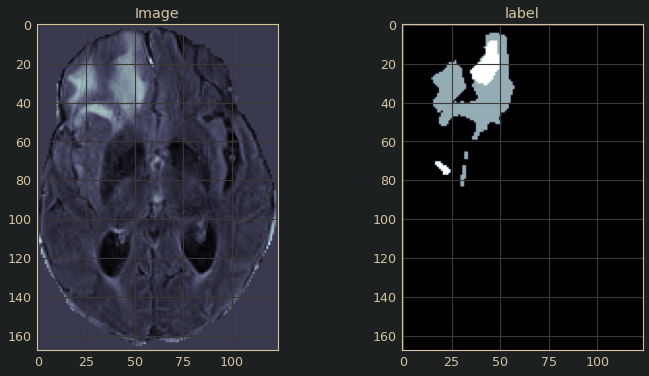

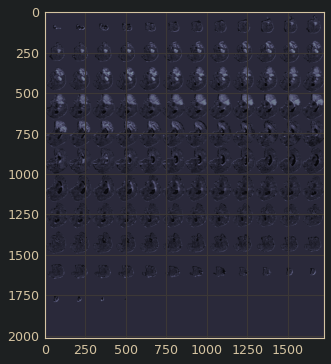

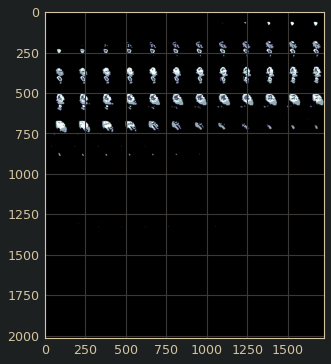

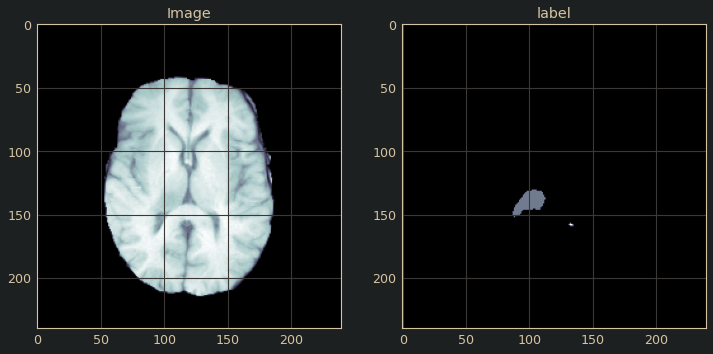

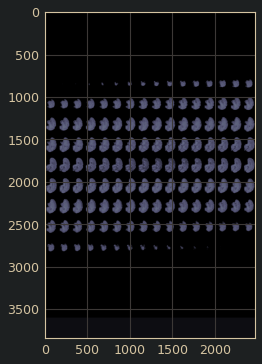

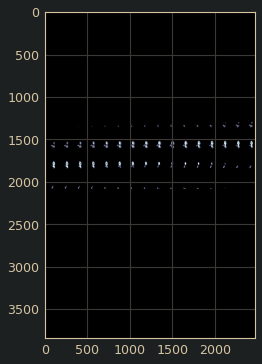

In [ ]:
#@title vizualizing the loaded data
from skimage.util import montage as montage2d
from torch.utils.data import DataLoader
# getting data
data_loader = DataLoader(training_dataset, batch_size=sets.batch_size, shuffle=True, num_workers=sets.num_workers)

dataset_iter = iter(data_loader)
batch_data = next(dataset_iter)

volumes, mask = batch_data['image'], batch_data['mask']
print('vizualiztion demo: volumes.shape =  {}'.format(volumes.shape))
print('vizualiztion demo: mask.shape =  {}'.format(mask.shape))

display_img_demo = volumes[0,0] #need to cheek if its T1,flair...
display_label_demo = mask[0] #this is target for all

img_vizualization_demo_path = Path('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training/HGG/BraTS19_2013_2_1/BraTS19_2013_2_1_t1.nii.gz')
label_vizualization_demo_path = Path('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training/HGG/BraTS19_2013_2_1/BraTS19_2013_2_1_seg.nii.gz')

img_vizualization_demo_without_data_procesing = nibabel.load(img_vizualization_demo_path)
label_vizualization_demo_without_data_procesing = nibabel.load(label_vizualization_demo_path)

img_vizualization_demo_without_data_procesing = img_vizualization_demo_without_data_procesing.get_fdata()
label_vizualization_demo_without_data_procesing = label_vizualization_demo_without_data_procesing.get_fdata()


def vizualize_a_single_img_and_its_lable(display_img, display_label, montage_display = False):
    #exceptts img opened in nibibil that have gone throw get fdata

    print('vizualiztion: display_img.shape  =  {}'.format(display_img.shape))
    print('vizualiztion: display_label.shape  =  {}'.format(display_label.shape))

    #picking a particular slice of display img here we used display_img.shape[2]//2 (intger divsion)
    #needs to be changed depending on our implamataion of T1,flair.. or all of them combined as 4 channels
    #displaying one image (T1 or flair or..) and its totall lable of a slice:
    fig, (ax1, ax2) = plt.subplots(1,2, figsize = (12, 6))
    ax1.imshow(display_img[:, :,display_img.shape[2]//2].T,cmap ='bone') #needs to be changed depending on our implamataion of T1,flair.. or all of them combined as 4 channels
    ax1.set_title('Image')
    ax2.imshow(display_label[:, :,display_label.shape[2]//2].T,cmap ='bone')
    ax2.set_title('label')
    
    if (montage_display == True):
      #displaying the 3d display_img as a montage:
      fig, ax1 = plt.subplots(1, 1, figsize = (12, 6))
      ax1.imshow(montage2d(display_img), cmap ='bone')
      

      #displaying the 3d display_label as a montage:
      fig, ax1 = plt.subplots(1,1, figsize = (12, 6))
      ax1.imshow(montage2d(display_label), cmap ='bone')
      #fig.savefig('') #saving the label

vizualize_a_single_img_and_its_lable(display_img_demo,display_label_demo,True)
vizualize_a_single_img_and_its_lable(img_vizualization_demo_without_data_procesing,label_vizualization_demo_without_data_procesing,True)

**add the resnet models**

In [ ]:
#@title resnet models
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import math
from functools import partial

__all__ = [
    'ResNet', 'resnet10', 'resnet18', 'resnet34', 'resnet50', 'resnet101',
    'resnet152', 'resnet200'
]
# https://www.youtube.com/watch?v=DkNIBBBvcPs&list=PLhhyoLH6IjfxeoooqP9rhU3HJIAVAJ3Vz&index=19 resnet video

def conv3x3x3(in_planes, out_planes, stride=1, dilation=1):
    # 3x3x3 convolution with padding
    return nn.Conv3d(
        in_planes,
        out_planes,
        kernel_size=3,
        dilation=dilation,
        stride=stride,
        padding=dilation,
        bias=False)


def downsample_basic_block(x, planes, stride, no_cuda=False):
    out = F.avg_pool3d(x, kernel_size=1, stride=stride)
    zero_pads = torch.Tensor(
        out.size(0), planes - out.size(1), out.size(2), out.size(3),
        out.size(4)).zero_()
    if not no_cuda:
        if isinstance(out.data, torch.cuda.FloatTensor):
            zero_pads = zero_pads.cuda()

    out = Variable(torch.cat([out.data, zero_pads], dim=1))

    return out


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, dilation=1, downsample=None):
        super(BasicBlock, self).__init__()
        self.conv1 = conv3x3x3(inplanes, planes, stride=stride, dilation=dilation)
        self.bn1 = nn.BatchNorm3d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3x3(planes, planes, dilation=dilation)
        self.bn2 = nn.BatchNorm3d(planes)
        self.downsample = downsample #identity_downsample in resnet video
        self.stride = stride
        self.dilation = dilation

    def forward(self, x):
        residual = x #identity in resnet video

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            residual = self.downsample(x) #idnetity_downsample if we need to change the shape

        out += residual
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, dilation=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv3d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm3d(planes)
        self.conv2 = nn.Conv3d(
            planes, planes, kernel_size=3, stride=stride, dilation=dilation, padding=dilation, bias=False)
        self.bn2 = nn.BatchNorm3d(planes)
        self.conv3 = nn.Conv3d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm3d(planes * 4)
        
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride
        self.dilation = dilation

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:# add identity
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class ResNet(nn.Module):

    def __init__(self,
                 block,    #the block
                 layers,      #list of how many times we want to use the block
                 sample_input_D,
                 sample_input_H,
                 sample_input_W,
                 num_seg_classes,
                 shortcut_type='B',
                 no_cuda = False):
        self.inplanes = 64
        self.no_cuda = no_cuda
        super(ResNet, self).__init__()
        self.conv1 = nn.Conv3d(
            1,
            64,
            kernel_size=7,
            stride=(2, 2, 2),
            padding=(3, 3, 3),
            bias=False) #intial layers (we havint done any resnet layers yet)
            
        self.bn1 = nn.BatchNorm3d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool3d(kernel_size=(3, 3, 3), stride=2, padding=1)

        # from here we do resnet layers:
        self.layer1 = self._make_layer(block, 64, layers[0], shortcut_type) #make layer defined a few lines down / 256 at end
        self.layer2 = self._make_layer(
            block, 128, layers[1], shortcut_type, stride=2) #512 at end
        self.layer3 = self._make_layer(
            block, 256, layers[2], shortcut_type, stride=1, dilation=2) #1024
        self.layer4 = self._make_layer(
            block, 512, layers[3], shortcut_type, stride=1, dilation=4) #2048

        print('num_seg_classes= {}'.format(num_seg_classes))

        self.conv_seg = nn.Sequential( # this is the specific implamantation for our segmentation problam
                                        nn.ConvTranspose3d(
                                        512 * block.expansion,
                                        32,
                                        2,
                                        stride=2
                                        ),
                                        nn.BatchNorm3d(32),
                                        nn.ReLU(inplace=True),
                                        nn.Conv3d(
                                        32,
                                        32,
                                        kernel_size=3,
                                        stride=(1, 1, 1),
                                        padding=(1, 1, 1),
                                        bias=False), 
                                        nn.BatchNorm3d(32),
                                        nn.ReLU(inplace=True),
                                        nn.Conv3d(
                                        32,
                                        num_seg_classes,
                                        kernel_size=1,
                                        stride=(1, 1, 1),
                                        bias=False) )
                                        
        
                                      
                                       

        for m in self.modules():
            if isinstance(m, nn.Conv3d):
                m.weight = nn.init.kaiming_normal(m.weight, mode='fan_out')
            elif isinstance(m, nn.BatchNorm3d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_layer(self, block, planes, blocks, shortcut_type, stride=1, dilation=1):# blocks = num of times we use the block, plans=out channels.
        downsample = None #identity downsample
        if stride != 1 or self.inplanes != planes * block.expansion: # when do we do identity downsample ie when conv layer change the identity (the input size changed)
            if shortcut_type == 'A':
                downsample = partial(
                    downsample_basic_block,
                    planes=planes * block.expansion,
                    stride=stride,
                    no_cuda=self.no_cuda)
            else:
                downsample = nn.Sequential(
                    nn.Conv3d(
                        self.inplanes,
                        planes * block.expansion,
                        kernel_size=1,
                        stride=stride,
                        bias=False), nn.BatchNorm3d(planes * block.expansion))# here we implemented the identity down sample

        layers = []
        layers.append(block(self.inplanes, planes, stride=stride, dilation=dilation, downsample=downsample))#this layer changes the number of channels firs layer changes to 256 at the end of the block (here changes stride or/and num of channels)
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes, dilation=dilation)) #256->64, 64*4(256 again) so no identity down sample in this case

        return nn.Sequential(*layers) # unpack the list

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.conv_seg(x)
        

        return x

def resnet10(**kwargs):
    """Constructs a ResNet-18 model.
    """
    model = ResNet(BasicBlock, [1, 1, 1, 1], **kwargs)
    return model


def resnet18(**kwargs):
    """Constructs a ResNet-18 model.
    """
    model = ResNet(BasicBlock, [2, 2, 2, 2], **kwargs)
    return model


def resnet34(**kwargs):
    """Constructs a ResNet-34 model.
    """
    model = ResNet(BasicBlock, [3, 4, 6, 3], **kwargs)
    return model


def resnet50(**kwargs):
    """Constructs a ResNet-50 model.
    """
    model = ResNet(Bottleneck, [3, 4, 6, 3], **kwargs)
    return model


def resnet101(**kwargs):
    """Constructs a ResNet-101 model.
    """
    model = ResNet(Bottleneck, [3, 4, 23, 3], **kwargs)
    return model


def resnet152(**kwargs):
    """Constructs a ResNet-101 model.
    """
    model = ResNet(Bottleneck, [3, 8, 36, 3], **kwargs)
    return model


def resnet200(**kwargs):
    """Constructs a ResNet-101 model.
    """
    model = ResNet(Bottleneck, [3, 24, 36, 3], **kwargs)
    return model

# def test():
#   net = resnet50() try all of the resnets
#   x=torch.randn(2,image_dim needs to be cheeked channels and 3d dim)
#   y =net(x).to('cuda')
#   print (y.shape)
#test()

**add the model creating code**

In [ ]:

import torch
from torch import nn



def generate_model(opt):
    assert opt.model in [
        'resnet'
    ]

    if opt.model == 'resnet':
        assert opt.model_depth in [10, 18, 34, 50, 101, 152, 200]
        
        if opt.model_depth == 10:
            model = resnet10(
                sample_input_W=opt.input_W,
                sample_input_H=opt.input_H,
                sample_input_D=opt.input_D,
                shortcut_type=opt.resnet_shortcut,
                no_cuda=opt.no_cuda,
                num_seg_classes=opt.n_seg_classes)
        elif opt.model_depth == 18:
            model = resnet18(
                sample_input_W=opt.input_W,
                sample_input_H=opt.input_H,
                sample_input_D=opt.input_D,
                shortcut_type=opt.resnet_shortcut,
                no_cuda=opt.no_cuda,
                num_seg_classes=opt.n_seg_classes)
        elif opt.model_depth == 34:
            model = resnet34(
                sample_input_W=opt.input_W,
                sample_input_H=opt.input_H,
                sample_input_D=opt.input_D,
                shortcut_type=opt.resnet_shortcut,
                no_cuda=opt.no_cuda,
                num_seg_classes=opt.n_seg_classes)
        elif opt.model_depth == 50:
            model = resnet50(
                sample_input_W=opt.input_W,
                sample_input_H=opt.input_H,
                sample_input_D=opt.input_D,
                shortcut_type=opt.resnet_shortcut,
                no_cuda=opt.no_cuda,
                num_seg_classes=opt.n_seg_classes)
        elif opt.model_depth == 101:
            model = resnet.resnet101(
                sample_input_W=opt.input_W,
                sample_input_H=opt.input_H,
                sample_input_D=opt.input_D,
                shortcut_type=opt.resnet_shortcut,
                no_cuda=opt.no_cuda,
                num_seg_classes=opt.n_seg_classes)
        elif opt.model_depth == 152:
            model = resnet.resnet152(
                sample_input_W=opt.input_W,
                sample_input_H=opt.input_H,
                sample_input_D=opt.input_D,
                shortcut_type=opt.resnet_shortcut,
                no_cuda=opt.no_cuda,
                num_seg_classes=opt.n_seg_classes)
        elif opt.model_depth == 200:
            model = resnet.resnet200(
                sample_input_W=opt.input_W,
                sample_input_H=opt.input_H,
                sample_input_D=opt.input_D,
                shortcut_type=opt.resnet_shortcut,
                no_cuda=opt.no_cuda,
                num_seg_classes=opt.n_seg_classes)
    
    if not opt.no_cuda:
        if len(opt.gpu_id) > 1:
            model = model.cuda() 
            model = nn.DataParallel(model, device_ids=opt.gpu_id)
            net_dict = model.state_dict() 
        else:
            import os
            
            print('running with cuda')
            os.environ["CUDA_VISIBLE_DEVICES"]=str(opt.gpu_id[0])
            model = model.cuda() 
            model = nn.DataParallel(model, device_ids=None)
            net_dict = model.state_dict()
    else:
       
        net_dict = model.state_dict()
    
    # load pretrain
    #if opt.phase != 'test' and opt.pretrain_path:
    if  opt.pretrain_path:
        print ('loading pretrained model {}'.format(opt.pretrain_path))
        print('test otzi')
        if not opt.no_cuda:
          pretrain = torch.load(opt.pretrain_path)
        else:
          pretrain = torch.load(opt.pretrain_path, map_location='cpu')
        pretrain_dict = {k: v for k, v in pretrain['state_dict'].items() if k in net_dict.keys()}
         
        net_dict.update(pretrain_dict)
        model.load_state_dict(net_dict)

        new_parameters = [] 
        for pname, p in model.named_parameters():
            for layer_name in opt.new_layer_names:
                if pname.find(layer_name) >= 0:
                    new_parameters.append(p)
                    break
        
        new_parameters_id = list(map(id, new_parameters))
        base_parameters = list(filter(lambda p: id(p) not in new_parameters_id, model.parameters()))
        parameters = {'base_parameters': base_parameters, 
                      'new_parameters': new_parameters}
        '''
        for param in parameters:
           param.requires_grad = False  ### moved here by avi insteed of in training methode
        '''
        print('returned parameters')
        return model, parameters

    print('returned model.parameter')
    return model, model.parameters()

adding a utils func

In [ ]:

class SmoothDiceLoss(nn.Module):
    # Set momentum = 1 to disable smoothing.
    def __init__(self, momentum=0.1):
        super(SmoothDiceLoss, self).__init__()
        self.momentum = momentum
        self.running_denom = -1
        self.eps = 1e-5
        
    def forward(self, score, gt_mask):
        score = score.view(score.shape[0], -1)
        gt_mask = gt_mask.float().view(gt_mask.shape[0], -1)        
        intersect = torch.sum(score * gt_mask, dim=1)
        y_sum = torch.sum(gt_mask * gt_mask, dim=1)
        z_sum = torch.sum(score * score, dim=1)
        denom = z_sum + y_sum + self.eps
        mean_denom = denom.mean()
        
        if self.running_denom == -1:
            self.running_denom = mean_denom.item()
            dyn_offset = torch.zeros(1, device='cuda')
        else:
            # Update the running average of the denominator.
            self.running_denom = self.running_denom * (1 - self.momentum) \
                                 + mean_denom.item() * self.momentum
            # dyn_offset is a tensor of length nBatch.
            dyn_offset = self.running_denom - denom.data
        # Make denom + dyn_offset = self.running_denom.
        smooth_dice = (2 * intersect + self.eps + dyn_offset) / (denom + dyn_offset)
        smooth_loss = 1 - smooth_dice
        # odice: original dice. oloss: original loss.
        orig_dice = (2 * intersect + self.eps) / denom
        orig_loss = 1 - orig_dice
        
        smooth_loss = smooth_loss.mean()
        orig_loss   = orig_loss.mean()
        #print("r-denom: %.1f, denom: %s, offset: %s" % \
        #        (self.running_denom, str(denom.data.cpu().numpy()), str(dyn_offset.data.cpu().numpy())))
        return smooth_loss, orig_loss

# Compute each example's dice loss in a batch, and average them                
def dice_loss_indiv(score, gt_mask, weight=None):
    score = score.view(score.shape[0], -1)
    gt_mask = gt_mask.float().view(gt_mask.shape[0], -1)
    smooth = 1e-5
    intersect = torch.sum(score * gt_mask, dim=1)
    y_sum = torch.sum(gt_mask * gt_mask, dim=1)
    z_sum = torch.sum(score * score, dim=1)
    dice = (2 * intersect + smooth) / (z_sum + y_sum + smooth)
    loss = 1 - dice
    if weight is not None:
        loss = (loss * weight).mean()
    else:
        loss = loss.mean()
    return loss

# Treat the whole batch as one big example, and compute the dice loss.
def dice_loss_mix(score, gt_mask):
    gt_mask = gt_mask.float()
    smooth = 1e-5
    intersect = torch.sum(score * gt_mask)
    y_sum = torch.sum(gt_mask)
    z_sum = torch.sum(score)
    loss = (2 * intersect + smooth) / (z_sum + y_sum + smooth)
    loss = 1 - loss
    return loss

# vcdr: vertical cup/disc ratio (non-differentiable).
# mask_nhot_soft: [B, C, H, W]. 
# mask_nhot_soft can also be a hard (groundtruth) mask, as threadholding doesn't change it.

                    


**OuerNewModel:** **bold text**

In [ ]:
#@title OuerNewModel
class DoubleConvdown(nn.Module):
    """(convolution => [IN] => leakyReLU) * 2"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.down_scale=nn.Sequential(nn.Conv3d(in_channels,out_channels,kernel_size=3, stride=1),
			    nn.InstanceNorm3d(3),
			    nn.LeakyReLU(),
        	nn.Conv3d(out_channels,out_channels, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
          nn.LeakyReLU())
        
    def forward(self, x):
        return self.down_scale(x)
class OuerNewModel(nn.Module):
    
    def __init__(self, my_pretrained_model,sets):
      
        
        super(OuerNewModel, self).__init__()
        self.my_new_layers = nn.Sequential(nn.Conv3d(4, 3, 3, stride=2),
                                           nn.ReLU(),nn.Conv3d(3, 2, 3, stride=2),
                                           nn.Conv3d(2, 1, 3, stride=1),
                                           nn.ReLU())
        self.pretrained = my_pretrained_model
        

        
        self.pool3d = nn.MaxPool3d(kernel_size=2, stride=2)
        
        # up the sys from ConvTranspose3d to half the channels and do 2 conv3d one from in_ch to out_ch and one out_ch to out_ch
        self.up_scale1=nn.Sequential(
			    nn.ConvTranspose3d(4*sets.n_seg_classes,2*sets.n_seg_classes,kernel_size=2, stride=2),
			    # should be feat_in*2 or feat_in
			    nn.Conv3d(2*sets.n_seg_classes, sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
			    nn.LeakyReLU(),
        	nn.Conv3d(sets.n_seg_classes, sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
          nn.LeakyReLU())
        #self.up_scale2=norm_lrelu_upscale_conv_norm_lrelu()
        
        self.up_scale2=nn.Sequential(
			    nn.ConvTranspose3d(sets.n_seg_classes,sets.n_seg_classes,kernel_size=3, stride=2),
			    # should be feat_in*2 or feat_in
			    nn.Conv3d(sets.n_seg_classes, sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(sets.n_seg_classes),
			    nn.LeakyReLU(),
          nn.Conv3d(sets.n_seg_classes, sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
          nn.LeakyReLU())
      
        self.after_cat = nn.Sequential( nn.ConvTranspose3d(sets.n_seg_classes*2,sets.n_seg_classes,kernel_size=1, stride=1),  nn.Conv3d(sets.n_seg_classes, sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(sets.n_seg_classes),
			    nn.LeakyReLU(),
          nn.Conv3d(sets.n_seg_classes, sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
          nn.LeakyReLU(),
          nn.Conv3d(sets.n_seg_classes, sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
          nn.LeakyReLU())
        
        self.up_scale3=nn.Sequential(
			    nn.ConvTranspose3d(8*sets.n_seg_classes,4*sets.n_seg_classes,kernel_size=2, stride=2),
			    # should be feat_in*2 or feat_in
			    nn.Conv3d(4*sets.n_seg_classes, 2*sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
			    nn.LeakyReLU(),
        	nn.Conv3d(2*sets.n_seg_classes, 2*sets.n_seg_classes, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(3),
          nn.LeakyReLU())
          
        
       
        self.MaxPool3d =  nn.MaxPool3d(kernel_size=2, stride=2)
        self.down1 =  DoubleConvdown(sets.n_seg_classes, 2*sets.n_seg_classes)
        self.down2 =  DoubleConvdown(2*sets.n_seg_classes, 4*sets.n_seg_classes)
        self.down3 = DoubleConvdown(4*sets.n_seg_classes, 8*sets.n_seg_classes)
   
    def forward(self, x):
        print('x.shape before entry to my new layers:{} '.format(x.shape))
        print('x1_img1.shape before entry to my new layers:{} '.format(x[:,0,:,:,:].unsqueeze(1).shape))
        x1_img1 = self.pretrained(x[:,0,:,:,:].unsqueeze(1))
        print('x1_img1.shape in fowerd pass of till entry to pretrained resnet:{} '.format(x1_img1.shape))
        x1_img2 = self.pretrained(x[:,1,:,:,:].unsqueeze(1))
        print('x1_img2.shape in fowerd pass of till entry to pretrained resnet:{} '.format(x1_img2.shape))
        x1_img3 = self.pretrained(x[:,2,:,:,:].unsqueeze(1))
        print('x1_img3.shape in fowerd pass of till entry to pretrained resnet:{} '.format(x1_img3.shape))
        x1_img4 = self.pretrained(x[:,3,:,:,:].unsqueeze(1))
        print('x1_img4.shape in fowerd pass of till entry to pretrained resnet:{} '.format(x1_img4.shape))
        
        x2 =torch.cat((x1_img1, x1_img2), dim=1)
        x2 = torch.cat((x2, x1_img3), dim=1)
        x2 = torch.cat((x2, x1_img4), dim=1)
        print('x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: {}'.format(x2.shape))
        x2_conv = self.down3(x2)
        
        print('x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: {}'.format(x2_conv.shape))


        x_downsized1 =  self.down1(x)
        x_downsized1 = self.MaxPool3d(x_downsized1)
        print('x_downsized1.shape : {}'.format(x_downsized1.shape))

        x_downsized2 =  self.down2(x_downsized1)
        x_downsized2 = self.MaxPool3d(x_downsized2)
       
        print('x_downsized2.shape : {}'.format(x_downsized2.shape))
        
        x_downsized3 =  self.down3(x_downsized2)
        
        print('x_downsized3.shape : {}'.format(x_downsized3.shape))
        
        #concatinting x_downsized2 to x2:
        x_downsized2_reshaped = torch.nn.functional.interpolate(x_downsized2,x2.shape[2:], scale_factor=None, mode='nearest')
        print('x_downsized2_reshaped.shape : {}'.format(x_downsized2_reshaped.shape))
        x_downsized2_concatinted = torch.cat((x_downsized2_reshaped,x2),dim=1)
        print('x_downsized2_concatinted.shape : {}'.format(x_downsized2_concatinted.shape))
        x_downsized2_concatinted_up3 = self.up_scale3(x_downsized2_concatinted)
        print('x_downsized2_concatinted_up3.shape : {}'.format(x_downsized2_concatinted_up3.shape))

        #concatinting x_downsized1 to x_downsized2_concatinted_up3:
        x_downsized1_reshaped = torch.nn.functional.interpolate(x_downsized1,x_downsized2_concatinted_up3.shape[2:], scale_factor=None, mode='nearest')
        print('x_downsized1_reshaped.shape : {}'.format(x_downsized1_reshaped.shape))
        x_downsized1_concatinted = torch.cat((x_downsized1_reshaped,x_downsized2_concatinted_up3),dim=1)
        print('x_downsized1_concatinted.shape : {}'.format(x_downsized1_concatinted.shape))
        x_downsized1_concatinted_up1 = self.up_scale1(x_downsized1_concatinted)
        print('x_downsized1_concatinted_up1.shape : {}'.format(x_downsized1_concatinted_up1.shape))


        #concatinting x to x_downsized1_concatinted_up1:
        x_downsized1_concatinted_up1_reshaped = torch.nn.functional.interpolate(x_downsized1_concatinted_up1,x.shape[2:], scale_factor=None, mode='nearest')
        print('x_downsized1_concatinted_up1_reshaped.shape : {}'.format(x_downsized1_concatinted_up1_reshaped.shape))
        x_reshaped_concatinted = torch.cat((x,x_downsized1_concatinted_up1_reshaped),dim=1)
        print('x_reshaped_concatinted.shape : {}'.format(x_reshaped_concatinted.shape))
        x_reshaped_concatinted_up1 = self.after_cat(x_reshaped_concatinted)
        print('x_reshaped_concatinted_up1 ,aftercat.shape after the last conv  : {}'.format(x_reshaped_concatinted_up1.shape))
        #x_out_reshped_to_x =torch.nn.functional.interpolate(x_reshaped_concatinted_up1,x.shape[2:], scale_factor=None, mode='nearest')
        #print('x_out_reshped_to_x .shape  : {}'.format(x_out_reshped_to_x.shape))


       
        return x_reshaped_concatinted_up1


    
    
def norm_lrelu_upscale_conv_norm_lrelu(self, size):
        
		    return nn.Sequential(
			    nn.InstanceNorm3d(feat_in),
			    nn.LeakyReLU(),
			    nn.Upsample(size, mode='nearest'),
			    # should be feat_in*2 or feat_in
			    nn.Conv3d(feat_in, feat_out, kernel_size=3, stride=1, padding=1, bias=False),
			    nn.InstanceNorm3d(feat_out),
			    nn.LeakyReLU())

  

**test the model**

In [ ]:
#model, parameters = generate_model(sets) 

**add Utils**

In [ ]:
#@title load_lines



import logging

logging.basicConfig(
    format='%(asctime)s %(levelname)-8s [%(filename)s:%(lineno)d] %(message)s',
    datefmt='%Y-%m-%d %H:%M:%S',
    level=logging.DEBUG)

log = logging.getLogger()

import os
import os.path as osp

def load_lines(file_path):
    """Read file into a list of lines.
    Input
      file_path: file path
    Output
      lines: an array of lines
    """
    with open(file_path, 'r') as fio:
        lines = fio.read().splitlines()
    return lines

**check the train code**

python3: can't open file 'parsing.py': [Errno 2] No such file or directory
finished last method
passed sets
num_seg_classes= 4


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:182: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.


running with cuda
loading pretrained model /content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training/pretrain/resnet_10.pth
test otzi
returned parameters
self.image_list =['HGG/BraTS19_2013_10_1', 'HGG/BraTS19_2013_19_1', 'HGG/BraTS19_2013_12_1', 'HGG/BraTS19_2013_13_1', 'HGG/BraTS19_2013_11_1', 'HGG/BraTS19_2013_17_1', 'HGG/BraTS19_2013_18_1', 'HGG/BraTS19_2013_14_1', 'HGG/BraTS19_2013_21_1', 'HGG/BraTS19_2013_27_1', 'HGG/BraTS19_2013_2_1', 'HGG/BraTS19_2013_22_1', 'HGG/BraTS19_2013_20_1', 'HGG/BraTS19_2013_23_1', 'HGG/BraTS19_2013_25_1', 'HGG/BraTS19_2013_4_1', 'HGG/BraTS19_2013_3_1', 'HGG/BraTS19_CBICA_ABB_1', 'HGG/BraTS19_2013_5_1', 'HGG/BraTS19_CBICA_AAL_1', 'HGG/BraTS19_CBICA_AAG_1', 'HGG/BraTS19_CBICA_ABE_1', 'HGG/BraTS19_CBICA_AAB_1', 'HGG/BraTS19_CBICA_AAP_1', 'HGG/BraTS19_2013_7_1', 'HGG/BraTS19_CBICA_ABM_1', 'HGG/BraTS19_CBICA_ABN_1', 'HGG/BraTS19_CBICA_ABO_1', 'HGG/BraTS19_CBICA_AMH_1', 'HGG/BraTS19_CBICA_ALU_1', 'HGG/BraTS19_CBICA_ALX_1', 'HGG/Bra

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:354: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 32, 42, 34, 36])
x_downsized1.shape : torch.Size([1, 8, 86, 69, 71])
x_downsized2.shape : torch.Size([1, 16, 42, 33, 34])
x_downsized3.shape : torch.Size([1, 32, 40, 31, 32])
x_downsized2_reshaped.shape : torch.Size([1, 16, 44, 36, 38])
x_downsized2_concatinted.shape : torch.Size([1, 32, 44, 36, 38])
x_downsized2_concatinted_up3.shape : torch.Size([1, 8, 88, 72, 76])
x_downsized1_reshaped.shape : torch.Size([1, 8, 88, 72, 76])
x_downsized1_concatinted.shape : torch.Size([1, 16, 8

2021-10-03 02:37:59 INFO     [<ipython-input-15-164dd6e05e7f>:17] 10 epochs in total, 334 batches per epoch
2021-10-03 02:37:59 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 0
/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:449: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
2021-10-03 02:37:59 INFO     [<ipython-input-

x_reshaped_concatinted_up1 ,aftercat.shape after the last conv  : torch.Size([1, 4, 175, 141, 145])
out_masks.shape =torch.Size([1, 4, 175, 141, 145])
/content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10
Current setting is:
Namespace(batch_size=1, bce_weight=tensor([0.0000, 1.5652, 0.5217, 0.9130]), ci_test=False, data_root=PosixPath('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training'), gpu_id=[0], img_list=PosixPath('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training/train.txt'), img_name='Null', input_D=120, input_H=130, input_W=130, input_patch_size='120, 136, 120', iters='11000,10000', learning_rate=0.001, manual_seed=1, model='resnet', model_depth=10, n_epochs=10, n_seg_classes=4, new_layer_names=['conv_seg'], no_cuda=False, num_workers=0, orig_patch_size='152,160,152', phase='train', pin_memory=True, pretrain_path=PosixPath('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 32, 38, 32, 32])
x_downsized1.shape : torch.Size([1, 8, 76, 64, 67])
x_downsized2.shape : torch.Size([1, 16, 37, 31, 32])
x_downsized3.shape : torch.Size([1, 32, 35, 29, 30])
x_downsized2_reshaped.shape : torch.Size([1, 16, 40, 34, 34])
x_downsized2_concatinted.shape : torch.Size([1, 32, 40, 34, 34])
x_downsized2_concatinted_up3.shape : torch.Size([1, 8, 80, 68, 68])
x_downsized1_reshaped.shape : torch.Size([1, 8, 80, 68, 68])
x_downsized1_concatinted.shape : torch.Size([1, 16, 8

2021-10-03 02:38:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-0 (0), loss = 0.728, loss_seg = 0.728, avg_batch_time = 4.223


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 135])
mask.shape =torch.Size([1, 139, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 135])
mask.shape after premute =torch.Size([1, 4, 139, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-1 (0), loss = 0.717, loss_seg = 0.717, avg_batch_time = 8.805


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 131, 135])
mask.shape =torch.Size([1, 168, 131, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 131, 135])
mask.shape after premute =torch.Size([1, 4, 168, 131, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 131, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 131, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-2 (0), loss = 0.718, loss_seg = 0.718, avg_batch_time = 13.887


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 147, 145])
mask.shape =torch.Size([1, 175, 147, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 147, 145])
mask.shape after premute =torch.Size([1, 4, 175, 147, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 147, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 147, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-3 (0), loss = 0.707, loss_seg = 0.707, avg_batch_time = 19.443


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 139])
mask.shape =torch.Size([1, 130, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 139])
mask.shape after premute =torch.Size([1, 4, 130, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-4 (0), loss = 0.699, loss_seg = 0.699, avg_batch_time = 24.258


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-5 (0), loss = 0.704, loss_seg = 0.704, avg_batch_time = 29.003


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 169, 133])
mask.shape =torch.Size([1, 132, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 169, 133])
mask.shape after premute =torch.Size([1, 4, 132, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-6 (0), loss = 0.698, loss_seg = 0.698, avg_batch_time = 33.567


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 133])
mask.shape =torch.Size([1, 158, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 133])
mask.shape after premute =torch.Size([1, 4, 158, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-7 (0), loss = 0.685, loss_seg = 0.685, avg_batch_time = 37.897


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 134])
mask.shape =torch.Size([1, 140, 173, 134])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 134])
mask.shape after premute =torch.Size([1, 4, 140, 173, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-8 (0), loss = 0.694, loss_seg = 0.694, avg_batch_time = 43.331


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 140])
mask.shape =torch.Size([1, 139, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 140])
mask.shape after premute =torch.Size([1, 4, 139, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:38:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-9 (0), loss = 0.683, loss_seg = 0.683, avg_batch_time = 48.173
2021-10-03 02:38:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 9


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_9.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 185, 139])
mask.shape =torch.Size([1, 135, 185, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 185, 139])
mask.shape after premute =torch.Size([1, 4, 135, 185, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 185, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 185, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 02:38:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-10 (0), loss = 0.685, loss_seg = 0.685, avg_batch_time = 57.950


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 168, 139])
mask.shape =torch.Size([1, 141, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 141, 168, 139])
mask.shape after premute =torch.Size([1, 4, 141, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-11 (0), loss = 0.684, loss_seg = 0.684, avg_batch_time = 62.754


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 140])
mask.shape =torch.Size([1, 140, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 140])
mask.shape after premute =torch.Size([1, 4, 140, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-12 (0), loss = 0.673, loss_seg = 0.673, avg_batch_time = 68.648


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 138, 143])
mask.shape =torch.Size([1, 167, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 138, 143])
mask.shape after premute =torch.Size([1, 4, 167, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-13 (0), loss = 0.656, loss_seg = 0.656, avg_batch_time = 73.501


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 140])
mask.shape =torch.Size([1, 159, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 140])
mask.shape after premute =torch.Size([1, 4, 159, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-14 (0), loss = 0.673, loss_seg = 0.673, avg_batch_time = 78.842


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 130])
mask.shape =torch.Size([1, 138, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 130])
mask.shape after premute =torch.Size([1, 4, 138, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-15 (0), loss = 0.665, loss_seg = 0.665, avg_batch_time = 83.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 137])
mask.shape =torch.Size([1, 169, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 137])
mask.shape after premute =torch.Size([1, 4, 169, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-16 (0), loss = 0.661, loss_seg = 0.661, avg_batch_time = 88.679


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 137, 139])
mask.shape =torch.Size([1, 174, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 137, 139])
mask.shape after premute =torch.Size([1, 4, 174, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-17 (0), loss = 0.666, loss_seg = 0.666, avg_batch_time = 94.289


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 135, 138])
mask.shape =torch.Size([1, 163, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 135, 138])
mask.shape after premute =torch.Size([1, 4, 163, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-18 (0), loss = 0.656, loss_seg = 0.656, avg_batch_time = 99.034


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 155, 129])
mask.shape =torch.Size([1, 128, 155, 129])
mask.shape after brats map label=torch.Size([4, 1, 128, 155, 129])
mask.shape after premute =torch.Size([1, 4, 128, 155, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 155, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 155, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-19 (0), loss = 0.649, loss_seg = 0.649, avg_batch_time = 103.669
2021-10-03 02:39:43 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 19


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_19.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 138])
mask.shape =torch.Size([1, 130, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 138])
mask.shape after premute =torch.Size([1, 4, 130, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:39:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-20 (0), loss = 0.647, loss_seg = 0.647, avg_batch_time = 110.778


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 141])
mask.shape =torch.Size([1, 172, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 141])
mask.shape after premute =torch.Size([1, 4, 172, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:39:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-21 (0), loss = 0.642, loss_seg = 0.642, avg_batch_time = 115.597


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 135, 137])
mask.shape =torch.Size([1, 173, 135, 137])
mask.shape after brats map label=torch.Size([4, 1, 173, 135, 137])
mask.shape after premute =torch.Size([1, 4, 173, 135, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 135, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 135, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-22 (0), loss = 0.651, loss_seg = 0.651, avg_batch_time = 120.896


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 143, 141])
mask.shape =torch.Size([1, 178, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 178, 143, 141])
mask.shape after premute =torch.Size([1, 4, 178, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-23 (0), loss = 0.605, loss_seg = 0.605, avg_batch_time = 126.691


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 130])
mask.shape =torch.Size([1, 168, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 130])
mask.shape after premute =torch.Size([1, 4, 168, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-24 (0), loss = 0.642, loss_seg = 0.642, avg_batch_time = 131.441


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 132, 132])
mask.shape =torch.Size([1, 181, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 181, 132, 132])
mask.shape after premute =torch.Size([1, 4, 181, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-25 (0), loss = 0.634, loss_seg = 0.634, avg_batch_time = 136.978


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 146, 138])
mask.shape =torch.Size([1, 164, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 146, 138])
mask.shape after premute =torch.Size([1, 4, 164, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-26 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 141.909


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 136])
mask.shape =torch.Size([1, 162, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 136])
mask.shape after premute =torch.Size([1, 4, 162, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-27 (0), loss = 0.587, loss_seg = 0.587, avg_batch_time = 147.309


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-28 (0), loss = 0.602, loss_seg = 0.602, avg_batch_time = 152.679


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 137, 138])
mask.shape =torch.Size([1, 151, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 151, 137, 138])
mask.shape after premute =torch.Size([1, 4, 151, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-29 (0), loss = 0.641, loss_seg = 0.641, avg_batch_time = 156.958
2021-10-03 02:40:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 29


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_29.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 169, 139])
mask.shape =torch.Size([1, 125, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 125, 169, 139])
mask.shape after premute =torch.Size([1, 4, 125, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:40:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-30 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 164.658


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 134])
mask.shape =torch.Size([1, 172, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 134])
mask.shape after premute =torch.Size([1, 4, 172, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-31 (0), loss = 0.649, loss_seg = 0.649, avg_batch_time = 169.242


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-32 (0), loss = 0.658, loss_seg = 0.658, avg_batch_time = 174.240


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:40:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-33 (0), loss = 0.592, loss_seg = 0.592, avg_batch_time = 179.565


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 133, 139])
mask.shape =torch.Size([1, 165, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 165, 133, 139])
mask.shape after premute =torch.Size([1, 4, 165, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-34 (0), loss = 0.644, loss_seg = 0.644, avg_batch_time = 184.330


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 188, 138])
mask.shape =torch.Size([1, 145, 188, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 188, 138])
mask.shape after premute =torch.Size([1, 4, 145, 188, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 188, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 188, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-35 (0), loss = 0.636, loss_seg = 0.636, avg_batch_time = 190.267


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 124, 121])
mask.shape =torch.Size([1, 159, 124, 121])
mask.shape after brats map label=torch.Size([4, 1, 159, 124, 121])
mask.shape after premute =torch.Size([1, 4, 159, 124, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 124, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 124, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-36 (0), loss = 0.631, loss_seg = 0.631, avg_batch_time = 194.586


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-37 (0), loss = 0.630, loss_seg = 0.630, avg_batch_time = 199.781


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-38 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 205.187


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-39 (0), loss = 0.642, loss_seg = 0.642, avg_batch_time = 210.212
2021-10-03 02:41:30 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 39


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_39.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 140])
mask.shape =torch.Size([1, 166, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 140])
mask.shape after premute =torch.Size([1, 4, 166, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:41:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-40 (0), loss = 0.564, loss_seg = 0.564, avg_batch_time = 217.580


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 163, 134])
mask.shape =torch.Size([1, 143, 163, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 163, 134])
mask.shape after premute =torch.Size([1, 4, 143, 163, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 163, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 163, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-41 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 222.217


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-42 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 227.366


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 137, 130])
mask.shape =torch.Size([1, 158, 137, 130])
mask.shape after brats map label=torch.Size([4, 1, 158, 137, 130])
mask.shape after premute =torch.Size([1, 4, 158, 137, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 137, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 137, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-43 (0), loss = 0.629, loss_seg = 0.629, avg_batch_time = 231.737


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 138, 138])
mask.shape =torch.Size([1, 157, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 138, 138])
mask.shape after premute =torch.Size([1, 4, 157, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:41:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-44 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 236.658


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 137])
mask.shape =torch.Size([1, 171, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 137])
mask.shape after premute =torch.Size([1, 4, 171, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-45 (0), loss = 0.643, loss_seg = 0.643, avg_batch_time = 242.036


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 152, 142])
mask.shape =torch.Size([1, 175, 152, 142])
mask.shape after brats map label=torch.Size([4, 1, 175, 152, 142])
mask.shape after premute =torch.Size([1, 4, 175, 152, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 152, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 152, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-46 (0), loss = 0.604, loss_seg = 0.604, avg_batch_time = 247.752


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 186, 142])
mask.shape =torch.Size([1, 137, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 186, 142])
mask.shape after premute =torch.Size([1, 4, 137, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-47 (0), loss = 0.624, loss_seg = 0.624, avg_batch_time = 253.363


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 129])
mask.shape =torch.Size([1, 139, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 129])
mask.shape after premute =torch.Size([1, 4, 139, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-48 (0), loss = 0.709, loss_seg = 0.709, avg_batch_time = 258.702


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 141])
mask.shape =torch.Size([1, 167, 137, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 141])
mask.shape after premute =torch.Size([1, 4, 167, 137, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-49 (0), loss = 0.631, loss_seg = 0.631, avg_batch_time = 263.846
2021-10-03 02:42:23 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 49


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_49.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 162, 143])
mask.shape =torch.Size([1, 132, 162, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 162, 143])
mask.shape after premute =torch.Size([1, 4, 132, 162, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 162, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 162, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:42:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-50 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 271.115


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 134, 139])
mask.shape =torch.Size([1, 181, 134, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 134, 139])
mask.shape after premute =torch.Size([1, 4, 181, 134, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 134, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 134, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-51 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 275.932


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-52 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 281.491


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 164, 135])
mask.shape =torch.Size([1, 145, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 145, 164, 135])
mask.shape after premute =torch.Size([1, 4, 145, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-53 (0), loss = 0.619, loss_seg = 0.619, avg_batch_time = 286.513


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 135])
mask.shape =torch.Size([1, 134, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 135])
mask.shape after premute =torch.Size([1, 4, 134, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-54 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 291.117


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 140, 138])
mask.shape =torch.Size([1, 159, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 140, 138])
mask.shape after premute =torch.Size([1, 4, 159, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:42:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-55 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 296.439


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 140])
mask.shape =torch.Size([1, 164, 142, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 140])
mask.shape after premute =torch.Size([1, 4, 164, 142, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-56 (0), loss = 0.635, loss_seg = 0.635, avg_batch_time = 301.502


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 131])
mask.shape =torch.Size([1, 134, 161, 131])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 131])
mask.shape after premute =torch.Size([1, 4, 134, 161, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-57 (0), loss = 0.637, loss_seg = 0.637, avg_batch_time = 305.952


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-58 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 311.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 128, 139])
mask.shape =torch.Size([1, 170, 128, 139])
mask.shape after brats map label=torch.Size([4, 1, 170, 128, 139])
mask.shape after premute =torch.Size([1, 4, 170, 128, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 128, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 128, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-59 (0), loss = 0.596, loss_seg = 0.596, avg_batch_time = 315.778
2021-10-03 02:43:15 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 59


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_59.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 134])
mask.shape =torch.Size([1, 129, 169, 134])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 134])
mask.shape after premute =torch.Size([1, 4, 129, 169, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:43:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-60 (0), loss = 0.620, loss_seg = 0.620, avg_batch_time = 323.019


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 137, 135])
mask.shape =torch.Size([1, 166, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 137, 135])
mask.shape after premute =torch.Size([1, 4, 166, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-61 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 327.463


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 137, 136])
mask.shape =torch.Size([1, 168, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 137, 136])
mask.shape after premute =torch.Size([1, 4, 168, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-62 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 332.674


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 138])
mask.shape =torch.Size([1, 135, 169, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 138])
mask.shape after premute =torch.Size([1, 4, 135, 169, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-63 (0), loss = 0.640, loss_seg = 0.640, avg_batch_time = 337.626


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 171, 136])
mask.shape =torch.Size([1, 134, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 134, 171, 136])
mask.shape after premute =torch.Size([1, 4, 134, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-64 (0), loss = 0.595, loss_seg = 0.595, avg_batch_time = 342.112


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 130, 145])
mask.shape =torch.Size([1, 171, 130, 145])
mask.shape after brats map label=torch.Size([4, 1, 171, 130, 145])
mask.shape after premute =torch.Size([1, 4, 171, 130, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 130, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 130, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-65 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 347.111


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 176, 140])
mask.shape =torch.Size([1, 140, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 176, 140])
mask.shape after premute =torch.Size([1, 4, 140, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-66 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 352.182


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 126, 146])
mask.shape =torch.Size([1, 167, 126, 146])
mask.shape after brats map label=torch.Size([4, 1, 167, 126, 146])
mask.shape after premute =torch.Size([1, 4, 167, 126, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 126, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 126, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:43:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-67 (0), loss = 0.587, loss_seg = 0.587, avg_batch_time = 356.457


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 174, 140])
mask.shape =torch.Size([1, 138, 174, 140])
mask.shape after brats map label=torch.Size([4, 1, 138, 174, 140])
mask.shape after premute =torch.Size([1, 4, 138, 174, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 174, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 174, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-68 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 361.657


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 141])
mask.shape =torch.Size([1, 135, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 141])
mask.shape after premute =torch.Size([1, 4, 135, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-69 (0), loss = 0.630, loss_seg = 0.630, avg_batch_time = 366.421
2021-10-03 02:44:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 69


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_69.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 134, 135])
mask.shape =torch.Size([1, 162, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 162, 134, 135])
mask.shape after premute =torch.Size([1, 4, 162, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:44:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-70 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 374.084


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 140])
mask.shape =torch.Size([1, 175, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 140])
mask.shape after premute =torch.Size([1, 4, 175, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-71 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 379.002


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 139, 139])
mask.shape =torch.Size([1, 167, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 139, 139])
mask.shape after premute =torch.Size([1, 4, 167, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-72 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 383.657


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-73 (0), loss = 0.601, loss_seg = 0.601, avg_batch_time = 388.884


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 186, 139])
mask.shape =torch.Size([1, 133, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 186, 139])
mask.shape after premute =torch.Size([1, 4, 133, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-74 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 394.484


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 136])
mask.shape =torch.Size([1, 172, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 136])
mask.shape after premute =torch.Size([1, 4, 172, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-75 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 399.875


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 168, 129])
mask.shape =torch.Size([1, 127, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 127, 168, 129])
mask.shape after premute =torch.Size([1, 4, 127, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-76 (0), loss = 0.651, loss_seg = 0.651, avg_batch_time = 404.630


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 168, 136])
mask.shape =torch.Size([1, 142, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 142, 168, 136])
mask.shape after premute =torch.Size([1, 4, 142, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-77 (0), loss = 0.578, loss_seg = 0.578, avg_batch_time = 409.457


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 140])
mask.shape =torch.Size([1, 170, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 140])
mask.shape after premute =torch.Size([1, 4, 170, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:44:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-78 (0), loss = 0.608, loss_seg = 0.608, avg_batch_time = 415.041


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 177, 140])
mask.shape =torch.Size([1, 139, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 177, 140])
mask.shape after premute =torch.Size([1, 4, 139, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-79 (0), loss = 0.617, loss_seg = 0.617, avg_batch_time = 420.805
2021-10-03 02:45:00 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 79


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_79.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 163, 130])
mask.shape =torch.Size([1, 149, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 149, 163, 130])
mask.shape after premute =torch.Size([1, 4, 149, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:45:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-80 (0), loss = 0.597, loss_seg = 0.597, avg_batch_time = 428.425


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 133, 141])
mask.shape =torch.Size([1, 173, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 173, 133, 141])
mask.shape after premute =torch.Size([1, 4, 173, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-81 (0), loss = 0.618, loss_seg = 0.618, avg_batch_time = 433.106


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 179, 145])
mask.shape =torch.Size([1, 131, 179, 145])
mask.shape after brats map label=torch.Size([4, 1, 131, 179, 145])
mask.shape after premute =torch.Size([1, 4, 131, 179, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 179, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 179, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-82 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 438.306


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 184, 141])
mask.shape =torch.Size([1, 131, 184, 141])
mask.shape after brats map label=torch.Size([4, 1, 131, 184, 141])
mask.shape after premute =torch.Size([1, 4, 131, 184, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 184, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 184, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-83 (0), loss = 0.619, loss_seg = 0.619, avg_batch_time = 443.765


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 142, 118])
mask.shape =torch.Size([1, 162, 142, 118])
mask.shape after brats map label=torch.Size([4, 1, 162, 142, 118])
mask.shape after premute =torch.Size([1, 4, 162, 142, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 142, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 142, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-84 (0), loss = 0.630, loss_seg = 0.630, avg_batch_time = 449.125


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 179, 141])
mask.shape =torch.Size([1, 143, 179, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 179, 141])
mask.shape after premute =torch.Size([1, 4, 143, 179, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 179, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 179, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-85 (0), loss = 0.636, loss_seg = 0.636, avg_batch_time = 454.414


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 136, 139])
mask.shape =torch.Size([1, 175, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 136, 139])
mask.shape after premute =torch.Size([1, 4, 175, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-86 (0), loss = 0.631, loss_seg = 0.631, avg_batch_time = 459.638


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 147, 129])
mask.shape =torch.Size([1, 166, 147, 129])
mask.shape after brats map label=torch.Size([4, 1, 166, 147, 129])
mask.shape after premute =torch.Size([1, 4, 166, 147, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 147, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 147, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-87 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 464.507


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-88 (0), loss = 0.570, loss_seg = 0.570, avg_batch_time = 469.413


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 162, 139])
mask.shape =torch.Size([1, 138, 162, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 162, 139])
mask.shape after premute =torch.Size([1, 4, 138, 162, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 162, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 162, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:45:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-89 (0), loss = 0.642, loss_seg = 0.642, avg_batch_time = 474.684
2021-10-03 02:45:54 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 89


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_89.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 140])
mask.shape =torch.Size([1, 168, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 140])
mask.shape after premute =torch.Size([1, 4, 168, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:46:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-90 (0), loss = 0.633, loss_seg = 0.633, avg_batch_time = 482.435


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 132, 137])
mask.shape =torch.Size([1, 160, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 132, 137])
mask.shape after premute =torch.Size([1, 4, 160, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-91 (0), loss = 0.643, loss_seg = 0.643, avg_batch_time = 486.825


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 168, 141])
mask.shape =torch.Size([1, 129, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 129, 168, 141])
mask.shape after premute =torch.Size([1, 4, 129, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-92 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 491.515


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 178, 142])
mask.shape =torch.Size([1, 140, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 140, 178, 142])
mask.shape after premute =torch.Size([1, 4, 140, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-93 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 496.862


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 142])
mask.shape =torch.Size([1, 179, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 142])
mask.shape after premute =torch.Size([1, 4, 179, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-94 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 502.217


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 136])
mask.shape =torch.Size([1, 133, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 136])
mask.shape after premute =torch.Size([1, 4, 133, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-95 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 507.048


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 177, 140])
mask.shape =torch.Size([1, 134, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 177, 140])
mask.shape after premute =torch.Size([1, 4, 134, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-96 (0), loss = 0.598, loss_seg = 0.598, avg_batch_time = 512.950


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 135])
mask.shape =torch.Size([1, 172, 130, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 135])
mask.shape after premute =torch.Size([1, 4, 172, 130, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-97 (0), loss = 0.581, loss_seg = 0.581, avg_batch_time = 517.470


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 135])
mask.shape =torch.Size([1, 172, 140, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 135])
mask.shape after premute =torch.Size([1, 4, 172, 140, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-98 (0), loss = 0.579, loss_seg = 0.579, avg_batch_time = 522.650


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 136])
mask.shape =torch.Size([1, 137, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 136])
mask.shape after premute =torch.Size([1, 4, 137, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:46:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-99 (0), loss = 0.582, loss_seg = 0.582, avg_batch_time = 528.414
2021-10-03 02:46:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 99


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_99.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 130, 142])
mask.shape =torch.Size([1, 175, 130, 142])
mask.shape after brats map label=torch.Size([4, 1, 175, 130, 142])
mask.shape after premute =torch.Size([1, 4, 175, 130, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 130, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 130, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 02:46:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-100 (0), loss = 0.555, loss_seg = 0.555, avg_batch_time = 535.860


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-101 (0), loss = 0.605, loss_seg = 0.605, avg_batch_time = 540.258


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 134])
mask.shape =torch.Size([1, 161, 134, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 134])
mask.shape after premute =torch.Size([1, 4, 161, 134, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-102 (0), loss = 0.607, loss_seg = 0.607, avg_batch_time = 545.773


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 139])
mask.shape =torch.Size([1, 171, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 139])
mask.shape after premute =torch.Size([1, 4, 171, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-103 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 551.190


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 146])
mask.shape =torch.Size([1, 172, 136, 146])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 146])
mask.shape after premute =torch.Size([1, 4, 172, 136, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-104 (0), loss = 0.675, loss_seg = 0.675, avg_batch_time = 556.793


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 136])
mask.shape =torch.Size([1, 166, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 136])
mask.shape after premute =torch.Size([1, 4, 166, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-105 (0), loss = 0.588, loss_seg = 0.588, avg_batch_time = 561.746


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 144])
mask.shape =torch.Size([1, 139, 171, 144])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 144])
mask.shape after premute =torch.Size([1, 4, 139, 171, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-106 (0), loss = 0.604, loss_seg = 0.604, avg_batch_time = 569.227


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 142])
mask.shape =torch.Size([1, 142, 164, 142])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 142])
mask.shape after premute =torch.Size([1, 4, 142, 164, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-107 (0), loss = 0.655, loss_seg = 0.655, avg_batch_time = 574.211


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-108 (0), loss = 0.666, loss_seg = 0.666, avg_batch_time = 579.360


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 179, 143])
mask.shape =torch.Size([1, 132, 179, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 179, 143])
mask.shape after premute =torch.Size([1, 4, 132, 179, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 179, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 179, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-109 (0), loss = 0.633, loss_seg = 0.633, avg_batch_time = 584.623
2021-10-03 02:47:44 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 109


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_109.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 142])
mask.shape =torch.Size([1, 159, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 142])
mask.shape after premute =torch.Size([1, 4, 159, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:47:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-110 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 591.858


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:47:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-111 (0), loss = 0.641, loss_seg = 0.641, avg_batch_time = 596.564


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-112 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 601.780


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 168, 139])
mask.shape =torch.Size([1, 126, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 126, 168, 139])
mask.shape after premute =torch.Size([1, 4, 126, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-113 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 606.490


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 164, 141])
mask.shape =torch.Size([1, 138, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 164, 141])
mask.shape after premute =torch.Size([1, 4, 138, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-114 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 611.221


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 165, 133])
mask.shape =torch.Size([1, 140, 165, 133])
mask.shape after brats map label=torch.Size([4, 1, 140, 165, 133])
mask.shape after premute =torch.Size([1, 4, 140, 165, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 165, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 165, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-115 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 616.267


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 139])
mask.shape =torch.Size([1, 166, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 139])
mask.shape after premute =torch.Size([1, 4, 166, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-116 (0), loss = 0.634, loss_seg = 0.634, avg_batch_time = 620.900


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 159, 138])
mask.shape =torch.Size([1, 146, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 159, 138])
mask.shape after premute =torch.Size([1, 4, 146, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-117 (0), loss = 0.629, loss_seg = 0.629, avg_batch_time = 626.200


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 124, 146])
mask.shape =torch.Size([1, 166, 124, 146])
mask.shape after brats map label=torch.Size([4, 1, 166, 124, 146])
mask.shape after premute =torch.Size([1, 4, 166, 124, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 124, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 124, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-118 (0), loss = 0.605, loss_seg = 0.605, avg_batch_time = 630.450


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 135])
mask.shape =torch.Size([1, 170, 143, 135])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 135])
mask.shape after premute =torch.Size([1, 4, 170, 143, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-119 (0), loss = 0.588, loss_seg = 0.588, avg_batch_time = 635.439
2021-10-03 02:48:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 119


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_119.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 138])
mask.shape =torch.Size([1, 137, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 138])
mask.shape after premute =torch.Size([1, 4, 137, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:48:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-120 (0), loss = 0.611, loss_seg = 0.611, avg_batch_time = 643.839


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-121 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 648.302


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 166, 137])
mask.shape =torch.Size([1, 134, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 166, 137])
mask.shape after premute =torch.Size([1, 4, 134, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-122 (0), loss = 0.562, loss_seg = 0.562, avg_batch_time = 653.120


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 169, 143])
mask.shape =torch.Size([1, 137, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 137, 169, 143])
mask.shape after premute =torch.Size([1, 4, 137, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:48:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-123 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 658.418


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 133, 134])
mask.shape =torch.Size([1, 160, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 160, 133, 134])
mask.shape after premute =torch.Size([1, 4, 160, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-124 (0), loss = 0.620, loss_seg = 0.620, avg_batch_time = 663.724


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 178, 142])
mask.shape =torch.Size([1, 147, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 147, 178, 142])
mask.shape after premute =torch.Size([1, 4, 147, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-125 (0), loss = 0.598, loss_seg = 0.598, avg_batch_time = 669.618


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 131, 137])
mask.shape =torch.Size([1, 151, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 151, 131, 137])
mask.shape after premute =torch.Size([1, 4, 151, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-126 (0), loss = 0.595, loss_seg = 0.595, avg_batch_time = 674.180


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 139])
mask.shape =torch.Size([1, 138, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 139])
mask.shape after premute =torch.Size([1, 4, 138, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-127 (0), loss = 0.579, loss_seg = 0.579, avg_batch_time = 679.773


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 143])
mask.shape =torch.Size([1, 138, 166, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 143])
mask.shape after premute =torch.Size([1, 4, 138, 166, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-128 (0), loss = 0.602, loss_seg = 0.602, avg_batch_time = 684.652


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 174, 145])
mask.shape =torch.Size([1, 128, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 128, 174, 145])
mask.shape after premute =torch.Size([1, 4, 128, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-129 (0), loss = 0.641, loss_seg = 0.641, avg_batch_time = 689.819
2021-10-03 02:49:29 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 129


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_129.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 140, 140])
mask.shape =torch.Size([1, 175, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 140, 140])
mask.shape after premute =torch.Size([1, 4, 175, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:49:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-130 (0), loss = 0.593, loss_seg = 0.593, avg_batch_time = 697.555


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 162, 138])
mask.shape =torch.Size([1, 145, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 162, 138])
mask.shape after premute =torch.Size([1, 4, 145, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-131 (0), loss = 0.598, loss_seg = 0.598, avg_batch_time = 702.392


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 136, 129])
mask.shape =torch.Size([1, 161, 136, 129])
mask.shape after brats map label=torch.Size([4, 1, 161, 136, 129])
mask.shape after premute =torch.Size([1, 4, 161, 136, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 136, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 136, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-132 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 707.334


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 159, 145])
mask.shape =torch.Size([1, 126, 159, 145])
mask.shape after brats map label=torch.Size([4, 1, 126, 159, 145])
mask.shape after premute =torch.Size([1, 4, 126, 159, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 159, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 159, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-133 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 711.783


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 143, 136])
mask.shape =torch.Size([1, 154, 143, 136])
mask.shape after brats map label=torch.Size([4, 1, 154, 143, 136])
mask.shape after premute =torch.Size([1, 4, 154, 143, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 143, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 143, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:49:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-134 (0), loss = 0.637, loss_seg = 0.637, avg_batch_time = 716.311


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 140])
mask.shape =torch.Size([1, 139, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 140])
mask.shape after premute =torch.Size([1, 4, 139, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-135 (0), loss = 0.618, loss_seg = 0.618, avg_batch_time = 721.391


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 177, 139])
mask.shape =torch.Size([1, 133, 177, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 177, 139])
mask.shape after premute =torch.Size([1, 4, 133, 177, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 177, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 177, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-136 (0), loss = 0.596, loss_seg = 0.596, avg_batch_time = 727.112


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 142])
mask.shape =torch.Size([1, 171, 128, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 142])
mask.shape after premute =torch.Size([1, 4, 171, 128, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-137 (0), loss = 0.589, loss_seg = 0.589, avg_batch_time = 731.915


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 171, 142])
mask.shape =torch.Size([1, 144, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 144, 171, 142])
mask.shape after premute =torch.Size([1, 4, 144, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-138 (0), loss = 0.613, loss_seg = 0.613, avg_batch_time = 737.117


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 136])
mask.shape =torch.Size([1, 136, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 136])
mask.shape after premute =torch.Size([1, 4, 136, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-139 (0), loss = 0.676, loss_seg = 0.676, avg_batch_time = 742.282
2021-10-03 02:50:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 139


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_139.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 160, 137])
mask.shape =torch.Size([1, 138, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 160, 137])
mask.shape after premute =torch.Size([1, 4, 138, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:50:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-140 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 749.205


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 140, 144])
mask.shape =torch.Size([1, 148, 140, 144])
mask.shape after brats map label=torch.Size([4, 1, 148, 140, 144])
mask.shape after premute =torch.Size([1, 4, 148, 140, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 140, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 140, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-141 (0), loss = 0.583, loss_seg = 0.583, avg_batch_time = 753.448


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 132, 127])
mask.shape =torch.Size([1, 157, 132, 127])
mask.shape after brats map label=torch.Size([4, 1, 157, 132, 127])
mask.shape after premute =torch.Size([1, 4, 157, 132, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 132, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 132, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-142 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 758.304


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 121, 161, 135])
mask.shape =torch.Size([1, 121, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 121, 161, 135])
mask.shape after premute =torch.Size([1, 4, 121, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 121, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 121, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-143 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 762.581


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 156, 133])
mask.shape =torch.Size([1, 125, 156, 133])
mask.shape after brats map label=torch.Size([4, 1, 125, 156, 133])
mask.shape after premute =torch.Size([1, 4, 125, 156, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 156, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 156, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-144 (0), loss = 0.620, loss_seg = 0.620, avg_batch_time = 766.617


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 146, 137])
mask.shape =torch.Size([1, 165, 146, 137])
mask.shape after brats map label=torch.Size([4, 1, 165, 146, 137])
mask.shape after premute =torch.Size([1, 4, 165, 146, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 146, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 146, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-145 (0), loss = 0.621, loss_seg = 0.621, avg_batch_time = 771.817


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 168, 129])
mask.shape =torch.Size([1, 151, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 151, 168, 129])
mask.shape after premute =torch.Size([1, 4, 151, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:50:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-146 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 777.323


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-147 (0), loss = 0.593, loss_seg = 0.593, avg_batch_time = 782.035


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 175, 134])
mask.shape =torch.Size([1, 144, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 144, 175, 134])
mask.shape after premute =torch.Size([1, 4, 144, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-148 (0), loss = 0.606, loss_seg = 0.606, avg_batch_time = 787.441


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 143])
mask.shape =torch.Size([1, 140, 172, 143])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 143])
mask.shape after premute =torch.Size([1, 4, 140, 172, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-149 (0), loss = 0.592, loss_seg = 0.592, avg_batch_time = 792.585
2021-10-03 02:51:12 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 149


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_149.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 139, 138])
mask.shape =torch.Size([1, 179, 139, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 139, 138])
mask.shape after premute =torch.Size([1, 4, 179, 139, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 139, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 139, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:51:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-150 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 800.418


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 163, 137])
mask.shape =torch.Size([1, 141, 163, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 163, 137])
mask.shape after premute =torch.Size([1, 4, 141, 163, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 163, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 163, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-151 (0), loss = 0.624, loss_seg = 0.624, avg_batch_time = 805.158


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 175, 134])
mask.shape =torch.Size([1, 133, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 175, 134])
mask.shape after premute =torch.Size([1, 4, 133, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-152 (0), loss = 0.620, loss_seg = 0.620, avg_batch_time = 810.329


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-153 (0), loss = 0.604, loss_seg = 0.604, avg_batch_time = 815.638


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 139, 132])
mask.shape =torch.Size([1, 161, 139, 132])
mask.shape after brats map label=torch.Size([4, 1, 161, 139, 132])
mask.shape after premute =torch.Size([1, 4, 161, 139, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 139, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 139, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-154 (0), loss = 0.637, loss_seg = 0.637, avg_batch_time = 820.636


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 131, 138])
mask.shape =torch.Size([1, 174, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 174, 131, 138])
mask.shape after premute =torch.Size([1, 4, 174, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-155 (0), loss = 0.633, loss_seg = 0.633, avg_batch_time = 826.117


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 169, 137])
mask.shape =torch.Size([1, 144, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 169, 137])
mask.shape after premute =torch.Size([1, 4, 144, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-156 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 831.812


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 138])
mask.shape =torch.Size([1, 135, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 138])
mask.shape after premute =torch.Size([1, 4, 135, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:51:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-157 (0), loss = 0.604, loss_seg = 0.604, avg_batch_time = 837.237


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 139])
mask.shape =torch.Size([1, 137, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 139])
mask.shape after premute =torch.Size([1, 4, 137, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-158 (0), loss = 0.629, loss_seg = 0.629, avg_batch_time = 842.078


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 127, 128])
mask.shape =torch.Size([1, 174, 127, 128])
mask.shape after brats map label=torch.Size([4, 1, 174, 127, 128])
mask.shape after premute =torch.Size([1, 4, 174, 127, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 127, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 127, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-159 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 847.165
2021-10-03 02:52:07 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 159


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_159.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 145, 143])
mask.shape =torch.Size([1, 167, 145, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 145, 143])
mask.shape after premute =torch.Size([1, 4, 167, 145, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 145, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 145, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:52:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-160 (0), loss = 0.606, loss_seg = 0.606, avg_batch_time = 854.803


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 146, 134])
mask.shape =torch.Size([1, 171, 146, 134])
mask.shape after brats map label=torch.Size([4, 1, 171, 146, 134])
mask.shape after premute =torch.Size([1, 4, 171, 146, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 146, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 146, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-161 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 859.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-162 (0), loss = 0.589, loss_seg = 0.589, avg_batch_time = 865.020


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 140])
mask.shape =torch.Size([1, 130, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 140])
mask.shape after premute =torch.Size([1, 4, 130, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-163 (0), loss = 0.589, loss_seg = 0.589, avg_batch_time = 869.620


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 137, 137])
mask.shape =torch.Size([1, 160, 137, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 137, 137])
mask.shape after premute =torch.Size([1, 4, 160, 137, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 137, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 137, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-164 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 874.345


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-165 (0), loss = 0.613, loss_seg = 0.613, avg_batch_time = 879.391


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 168, 126])
mask.shape =torch.Size([1, 132, 168, 126])
mask.shape after brats map label=torch.Size([4, 1, 132, 168, 126])
mask.shape after premute =torch.Size([1, 4, 132, 168, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 168, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 168, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-166 (0), loss = 0.619, loss_seg = 0.619, avg_batch_time = 884.370


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 184, 139])
mask.shape =torch.Size([1, 144, 184, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 184, 139])
mask.shape after premute =torch.Size([1, 4, 144, 184, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 184, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 184, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-167 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 890.659


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 132, 139])
mask.shape =torch.Size([1, 174, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 132, 139])
mask.shape after premute =torch.Size([1, 4, 174, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:52:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-168 (0), loss = 0.582, loss_seg = 0.582, avg_batch_time = 896.056


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 138])
mask.shape =torch.Size([1, 133, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 138])
mask.shape after premute =torch.Size([1, 4, 133, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-169 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 900.552
2021-10-03 02:53:00 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 169


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_169.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 128, 134])
mask.shape =torch.Size([1, 162, 128, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 128, 134])
mask.shape after premute =torch.Size([1, 4, 162, 128, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 128, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 128, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:53:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-170 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 907.645


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 179, 136])
mask.shape =torch.Size([1, 140, 179, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 179, 136])
mask.shape after premute =torch.Size([1, 4, 140, 179, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 179, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 179, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-171 (0), loss = 0.567, loss_seg = 0.567, avg_batch_time = 912.530


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 162, 136])
mask.shape =torch.Size([1, 144, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 162, 136])
mask.shape after premute =torch.Size([1, 4, 144, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-172 (0), loss = 0.633, loss_seg = 0.633, avg_batch_time = 918.426


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 178, 137])
mask.shape =torch.Size([1, 139, 178, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 178, 137])
mask.shape after premute =torch.Size([1, 4, 139, 178, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 178, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 178, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-173 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 923.791


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 170, 144])
mask.shape =torch.Size([1, 130, 170, 144])
mask.shape after brats map label=torch.Size([4, 1, 130, 170, 144])
mask.shape after premute =torch.Size([1, 4, 130, 170, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 170, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 170, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-174 (0), loss = 0.606, loss_seg = 0.606, avg_batch_time = 928.554


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 165, 141])
mask.shape =torch.Size([1, 148, 165, 141])
mask.shape after brats map label=torch.Size([4, 1, 148, 165, 141])
mask.shape after premute =torch.Size([1, 4, 148, 165, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 165, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 165, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-175 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 933.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 136])
mask.shape =torch.Size([1, 138, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 136])
mask.shape after premute =torch.Size([1, 4, 138, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-176 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 939.374


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 146, 135])
mask.shape =torch.Size([1, 168, 146, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 146, 135])
mask.shape after premute =torch.Size([1, 4, 168, 146, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 146, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 146, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-177 (0), loss = 0.624, loss_seg = 0.624, avg_batch_time = 944.420


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 126, 116])
mask.shape =torch.Size([1, 144, 126, 116])
mask.shape after brats map label=torch.Size([4, 1, 144, 126, 116])
mask.shape after premute =torch.Size([1, 4, 144, 126, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 126, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 126, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 32, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-178 (0), loss = 0.633, loss_seg = 0.633, avg_batch_time = 948.299


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 139])
mask.shape =torch.Size([1, 172, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 139])
mask.shape after premute =torch.Size([1, 4, 172, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:53:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-179 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 953.726
2021-10-03 02:53:53 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 179


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_179.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 138])
mask.shape =torch.Size([1, 157, 136, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 138])
mask.shape after premute =torch.Size([1, 4, 157, 136, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:54:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-180 (0), loss = 0.581, loss_seg = 0.581, avg_batch_time = 961.044


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-181 (0), loss = 0.630, loss_seg = 0.630, avg_batch_time = 965.569


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 154, 137])
mask.shape =torch.Size([1, 138, 154, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 154, 137])
mask.shape after premute =torch.Size([1, 4, 138, 154, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 154, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 154, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-182 (0), loss = 0.596, loss_seg = 0.596, avg_batch_time = 971.172


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 168, 134])
mask.shape =torch.Size([1, 143, 168, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 168, 134])
mask.shape after premute =torch.Size([1, 4, 143, 168, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 168, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 168, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-183 (0), loss = 0.643, loss_seg = 0.643, avg_batch_time = 976.487


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 131])
mask.shape =torch.Size([1, 141, 165, 131])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 131])
mask.shape after premute =torch.Size([1, 4, 141, 165, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-184 (0), loss = 0.618, loss_seg = 0.618, avg_batch_time = 981.742


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 139, 134])
mask.shape =torch.Size([1, 175, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 139, 134])
mask.shape after premute =torch.Size([1, 4, 175, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-185 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 987.639


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 173, 140])
mask.shape =torch.Size([1, 137, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 173, 140])
mask.shape after premute =torch.Size([1, 4, 137, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-186 (0), loss = 0.581, loss_seg = 0.581, avg_batch_time = 993.219


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 137])
mask.shape =torch.Size([1, 142, 172, 137])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 137])
mask.shape after premute =torch.Size([1, 4, 142, 172, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-187 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 998.424


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 141, 137])
mask.shape =torch.Size([1, 176, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 176, 141, 137])
mask.shape after premute =torch.Size([1, 4, 176, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-188 (0), loss = 0.607, loss_seg = 0.607, avg_batch_time = 1004.228


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 136, 131])
mask.shape =torch.Size([1, 158, 136, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 136, 131])
mask.shape after premute =torch.Size([1, 4, 158, 136, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 136, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 136, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:54:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-189 (0), loss = 0.618, loss_seg = 0.618, avg_batch_time = 1009.126
2021-10-03 02:54:49 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 189


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_189.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:54:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-190 (0), loss = 0.599, loss_seg = 0.599, avg_batch_time = 1016.632


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 166, 138])
mask.shape =torch.Size([1, 144, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 144, 166, 138])
mask.shape after premute =torch.Size([1, 4, 144, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-191 (0), loss = 0.598, loss_seg = 0.598, avg_batch_time = 1021.413


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 149, 135])
mask.shape =torch.Size([1, 129, 149, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 149, 135])
mask.shape after premute =torch.Size([1, 4, 129, 149, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 149, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 149, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-192 (0), loss = 0.594, loss_seg = 0.594, avg_batch_time = 1026.417


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 137, 138])
mask.shape =torch.Size([1, 164, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 137, 138])
mask.shape after premute =torch.Size([1, 4, 164, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-193 (0), loss = 0.595, loss_seg = 0.595, avg_batch_time = 1031.442


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 145])
mask.shape =torch.Size([1, 175, 141, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 145])
mask.shape after premute =torch.Size([1, 4, 175, 141, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-194 (0), loss = 0.588, loss_seg = 0.588, avg_batch_time = 1036.026


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 132, 135])
mask.shape =torch.Size([1, 156, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 156, 132, 135])
mask.shape after premute =torch.Size([1, 4, 156, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-195 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1040.574


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 171, 129])
mask.shape =torch.Size([1, 135, 171, 129])
mask.shape after brats map label=torch.Size([4, 1, 135, 171, 129])
mask.shape after premute =torch.Size([1, 4, 135, 171, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 171, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 171, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-196 (0), loss = 0.608, loss_seg = 0.608, avg_batch_time = 1045.677


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 161, 143])
mask.shape =torch.Size([1, 127, 161, 143])
mask.shape after brats map label=torch.Size([4, 1, 127, 161, 143])
mask.shape after premute =torch.Size([1, 4, 127, 161, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 161, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 161, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-197 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 1050.439


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 137])
mask.shape =torch.Size([1, 138, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 137])
mask.shape after premute =torch.Size([1, 4, 138, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-198 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1055.338


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-199 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1060.651
2021-10-03 02:55:40 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 199


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_199.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 142])
mask.shape =torch.Size([1, 173, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 142])
mask.shape after premute =torch.Size([1, 4, 173, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:55:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-200 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 1067.894


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 167, 137])
mask.shape =torch.Size([1, 127, 167, 137])
mask.shape after brats map label=torch.Size([4, 1, 127, 167, 137])
mask.shape after premute =torch.Size([1, 4, 127, 167, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 167, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 167, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-201 (0), loss = 0.611, loss_seg = 0.611, avg_batch_time = 1072.231


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 172, 139])
mask.shape =torch.Size([1, 129, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 129, 172, 139])
mask.shape after premute =torch.Size([1, 4, 129, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:55:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-202 (0), loss = 0.597, loss_seg = 0.597, avg_batch_time = 1077.474


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 133])
mask.shape =torch.Size([1, 138, 176, 133])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 133])
mask.shape after premute =torch.Size([1, 4, 138, 176, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-203 (0), loss = 0.605, loss_seg = 0.605, avg_batch_time = 1082.612


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 174, 137])
mask.shape =torch.Size([1, 144, 174, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 174, 137])
mask.shape after premute =torch.Size([1, 4, 144, 174, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 174, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 174, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-204 (0), loss = 0.617, loss_seg = 0.617, avg_batch_time = 1088.132


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 136])
mask.shape =torch.Size([1, 175, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 136])
mask.shape after premute =torch.Size([1, 4, 175, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-205 (0), loss = 0.579, loss_seg = 0.579, avg_batch_time = 1093.533


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 141, 137])
mask.shape =torch.Size([1, 158, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 158, 141, 137])
mask.shape after premute =torch.Size([1, 4, 158, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-206 (0), loss = 0.611, loss_seg = 0.611, avg_batch_time = 1098.018


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 170, 141])
mask.shape =torch.Size([1, 132, 170, 141])
mask.shape after brats map label=torch.Size([4, 1, 132, 170, 141])
mask.shape after premute =torch.Size([1, 4, 132, 170, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 170, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 170, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-207 (0), loss = 0.583, loss_seg = 0.583, avg_batch_time = 1103.201


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 167, 139])
mask.shape =torch.Size([1, 150, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 150, 167, 139])
mask.shape after premute =torch.Size([1, 4, 150, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-208 (0), loss = 0.605, loss_seg = 0.605, avg_batch_time = 1108.377


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 138])
mask.shape =torch.Size([1, 164, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 138])
mask.shape after premute =torch.Size([1, 4, 164, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-209 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 1113.498
2021-10-03 02:56:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 209


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_209.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 174, 142])
mask.shape =torch.Size([1, 133, 174, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 174, 142])
mask.shape after premute =torch.Size([1, 4, 133, 174, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 174, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 174, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:56:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-210 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 1119.556


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-211 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1124.125


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-212 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1129.830


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:56:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-213 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1135.258


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 182, 140])
mask.shape =torch.Size([1, 136, 182, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 182, 140])
mask.shape after premute =torch.Size([1, 4, 136, 182, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 182, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 182, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-214 (0), loss = 0.619, loss_seg = 0.619, avg_batch_time = 1141.380


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 134, 130])
mask.shape =torch.Size([1, 164, 134, 130])
mask.shape after brats map label=torch.Size([4, 1, 164, 134, 130])
mask.shape after premute =torch.Size([1, 4, 164, 134, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 134, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 134, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-215 (0), loss = 0.655, loss_seg = 0.655, avg_batch_time = 1146.454


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 165, 140])
mask.shape =torch.Size([1, 143, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 165, 140])
mask.shape after premute =torch.Size([1, 4, 143, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-216 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1152.465


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 134, 135])
mask.shape =torch.Size([1, 152, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 152, 134, 135])
mask.shape after premute =torch.Size([1, 4, 152, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-217 (0), loss = 0.619, loss_seg = 0.619, avg_batch_time = 1157.162


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 138])
mask.shape =torch.Size([1, 141, 165, 138])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 138])
mask.shape after premute =torch.Size([1, 4, 141, 165, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-218 (0), loss = 0.612, loss_seg = 0.612, avg_batch_time = 1162.316


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 160, 135])
mask.shape =torch.Size([1, 129, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 160, 135])
mask.shape after premute =torch.Size([1, 4, 129, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-219 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1167.451
2021-10-03 02:57:27 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 219


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_219.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 186, 139])
mask.shape =torch.Size([1, 136, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 186, 139])
mask.shape after premute =torch.Size([1, 4, 136, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:57:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-220 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 1174.213


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 141, 128])
mask.shape =torch.Size([1, 178, 141, 128])
mask.shape after brats map label=torch.Size([4, 1, 178, 141, 128])
mask.shape after premute =torch.Size([1, 4, 178, 141, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 141, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 141, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-221 (0), loss = 0.621, loss_seg = 0.621, avg_batch_time = 1178.927


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 135, 131])
mask.shape =torch.Size([1, 175, 135, 131])
mask.shape after brats map label=torch.Size([4, 1, 175, 135, 131])
mask.shape after premute =torch.Size([1, 4, 175, 135, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 135, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 135, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-222 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 1183.142


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 143])
mask.shape =torch.Size([1, 169, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 143])
mask.shape after premute =torch.Size([1, 4, 169, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-223 (0), loss = 0.618, loss_seg = 0.618, avg_batch_time = 1188.568


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 144, 139])
mask.shape =torch.Size([1, 163, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 163, 144, 139])
mask.shape after premute =torch.Size([1, 4, 163, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-224 (0), loss = 0.598, loss_seg = 0.598, avg_batch_time = 1193.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 140])
mask.shape =torch.Size([1, 143, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 140])
mask.shape after premute =torch.Size([1, 4, 143, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:57:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-225 (0), loss = 0.570, loss_seg = 0.570, avg_batch_time = 1199.414


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 139])
mask.shape =torch.Size([1, 169, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 139])
mask.shape after premute =torch.Size([1, 4, 169, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-226 (0), loss = 0.564, loss_seg = 0.564, avg_batch_time = 1204.059


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 178, 140])
mask.shape =torch.Size([1, 134, 178, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 178, 140])
mask.shape after premute =torch.Size([1, 4, 134, 178, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 178, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 178, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-227 (0), loss = 0.599, loss_seg = 0.599, avg_batch_time = 1209.125


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 135, 141])
mask.shape =torch.Size([1, 174, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 174, 135, 141])
mask.shape after premute =torch.Size([1, 4, 174, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-228 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 1213.903


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 177, 142])
mask.shape =torch.Size([1, 137, 177, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 177, 142])
mask.shape after premute =torch.Size([1, 4, 137, 177, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 177, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 177, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-229 (0), loss = 0.586, loss_seg = 0.586, avg_batch_time = 1219.350
2021-10-03 02:58:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 229


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_229.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 123, 136])
mask.shape =torch.Size([1, 166, 123, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 123, 136])
mask.shape after premute =torch.Size([1, 4, 166, 123, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 123, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 123, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:58:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-230 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 1225.256


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 169, 137])
mask.shape =torch.Size([1, 143, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 169, 137])
mask.shape after premute =torch.Size([1, 4, 143, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-231 (0), loss = 0.601, loss_seg = 0.601, avg_batch_time = 1230.152


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 140])
mask.shape =torch.Size([1, 143, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 140])
mask.shape after premute =torch.Size([1, 4, 143, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-232 (0), loss = 0.608, loss_seg = 0.608, avg_batch_time = 1235.672


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-233 (0), loss = 0.604, loss_seg = 0.604, avg_batch_time = 1240.597


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 167, 142])
mask.shape =torch.Size([1, 136, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 167, 142])
mask.shape after premute =torch.Size([1, 4, 136, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-234 (0), loss = 0.598, loss_seg = 0.598, avg_batch_time = 1245.464


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 136])
mask.shape =torch.Size([1, 175, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 136])
mask.shape after premute =torch.Size([1, 4, 175, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-235 (0), loss = 0.594, loss_seg = 0.594, avg_batch_time = 1251.458


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:58:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-236 (0), loss = 0.618, loss_seg = 0.618, avg_batch_time = 1256.538


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 133, 138])
mask.shape =torch.Size([1, 170, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 170, 133, 138])
mask.shape after premute =torch.Size([1, 4, 170, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-237 (0), loss = 0.608, loss_seg = 0.608, avg_batch_time = 1261.313


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-238 (0), loss = 0.607, loss_seg = 0.607, avg_batch_time = 1265.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 141, 137])
mask.shape =torch.Size([1, 166, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 141, 137])
mask.shape after premute =torch.Size([1, 4, 166, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-239 (0), loss = 0.607, loss_seg = 0.607, avg_batch_time = 1271.153
2021-10-03 02:59:11 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 239


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_239.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 02:59:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-240 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1277.370


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 136])
mask.shape =torch.Size([1, 140, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 136])
mask.shape after premute =torch.Size([1, 4, 140, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-241 (0), loss = 0.607, loss_seg = 0.607, avg_batch_time = 1282.153


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 129])
mask.shape =torch.Size([1, 137, 170, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 129])
mask.shape after premute =torch.Size([1, 4, 137, 170, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-242 (0), loss = 0.596, loss_seg = 0.596, avg_batch_time = 1286.911


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 141])
mask.shape =torch.Size([1, 141, 162, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 141])
mask.shape after premute =torch.Size([1, 4, 141, 162, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-243 (0), loss = 0.606, loss_seg = 0.606, avg_batch_time = 1291.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-244 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1296.468


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 139])
mask.shape =torch.Size([1, 175, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 139])
mask.shape after premute =torch.Size([1, 4, 175, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-245 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 1301.204


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 136, 140])
mask.shape =torch.Size([1, 169, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 169, 136, 140])
mask.shape after premute =torch.Size([1, 4, 169, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-246 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 1306.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 159, 141])
mask.shape =torch.Size([1, 151, 159, 141])
mask.shape after brats map label=torch.Size([4, 1, 151, 159, 141])
mask.shape after premute =torch.Size([1, 4, 151, 159, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 159, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 159, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-247 (0), loss = 0.583, loss_seg = 0.583, avg_batch_time = 1311.943


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 168, 144])
mask.shape =torch.Size([1, 124, 168, 144])
mask.shape after brats map label=torch.Size([4, 1, 124, 168, 144])
mask.shape after premute =torch.Size([1, 4, 124, 168, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 168, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 168, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 02:59:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-248 (0), loss = 0.611, loss_seg = 0.611, avg_batch_time = 1315.765


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 183, 140, 141])
mask.shape =torch.Size([1, 183, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 183, 140, 141])
mask.shape after premute =torch.Size([1, 4, 183, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 183, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 183, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-249 (0), loss = 0.620, loss_seg = 0.620, avg_batch_time = 1321.622
2021-10-03 03:00:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 249


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_249.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 180, 139])
mask.shape =torch.Size([1, 131, 180, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 180, 139])
mask.shape after premute =torch.Size([1, 4, 131, 180, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 180, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 180, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:00:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-250 (0), loss = 0.621, loss_seg = 0.621, avg_batch_time = 1328.149


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-251 (0), loss = 0.583, loss_seg = 0.583, avg_batch_time = 1332.795


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 143, 132])
mask.shape =torch.Size([1, 166, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 166, 143, 132])
mask.shape after premute =torch.Size([1, 4, 166, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-252 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 1338.703


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 138, 136])
mask.shape =torch.Size([1, 173, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 138, 136])
mask.shape after premute =torch.Size([1, 4, 173, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-253 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1343.933


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-254 (0), loss = 0.584, loss_seg = 0.584, avg_batch_time = 1349.354


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 133, 143])
mask.shape =torch.Size([1, 164, 133, 143])
mask.shape after brats map label=torch.Size([4, 1, 164, 133, 143])
mask.shape after premute =torch.Size([1, 4, 164, 133, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 133, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 133, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-255 (0), loss = 0.601, loss_seg = 0.601, avg_batch_time = 1354.121


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 138])
mask.shape =torch.Size([1, 168, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 138])
mask.shape after premute =torch.Size([1, 4, 168, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-256 (0), loss = 0.605, loss_seg = 0.605, avg_batch_time = 1359.454


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 141])
mask.shape =torch.Size([1, 138, 163, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 141])
mask.shape after premute =torch.Size([1, 4, 138, 163, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-257 (0), loss = 0.584, loss_seg = 0.584, avg_batch_time = 1364.298


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 136])
mask.shape =torch.Size([1, 167, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 136])
mask.shape after premute =torch.Size([1, 4, 167, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-258 (0), loss = 0.602, loss_seg = 0.602, avg_batch_time = 1369.799


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 171, 136])
mask.shape =torch.Size([1, 132, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 171, 136])
mask.shape after premute =torch.Size([1, 4, 132, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:00:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-259 (0), loss = 0.621, loss_seg = 0.621, avg_batch_time = 1375.233
2021-10-03 03:00:55 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 259


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_259.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 132, 137])
mask.shape =torch.Size([1, 159, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 159, 132, 137])
mask.shape after premute =torch.Size([1, 4, 159, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:01:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-260 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1381.049


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-261 (0), loss = 0.641, loss_seg = 0.641, avg_batch_time = 1385.867


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-262 (0), loss = 0.593, loss_seg = 0.593, avg_batch_time = 1391.131


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 144, 139])
mask.shape =torch.Size([1, 181, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 144, 139])
mask.shape after premute =torch.Size([1, 4, 181, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-263 (0), loss = 0.571, loss_seg = 0.571, avg_batch_time = 1396.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 133, 135])
mask.shape =torch.Size([1, 167, 133, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 133, 135])
mask.shape after premute =torch.Size([1, 4, 167, 133, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 133, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 133, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-264 (0), loss = 0.607, loss_seg = 0.607, avg_batch_time = 1401.473


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-265 (0), loss = 0.578, loss_seg = 0.578, avg_batch_time = 1406.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 126, 136])
mask.shape =torch.Size([1, 171, 126, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 126, 136])
mask.shape after premute =torch.Size([1, 4, 171, 126, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 126, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 126, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-266 (0), loss = 0.595, loss_seg = 0.595, avg_batch_time = 1411.409


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-267 (0), loss = 0.593, loss_seg = 0.593, avg_batch_time = 1416.578


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 177, 145])
mask.shape =torch.Size([1, 138, 177, 145])
mask.shape after brats map label=torch.Size([4, 1, 138, 177, 145])
mask.shape after premute =torch.Size([1, 4, 138, 177, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 177, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 177, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-268 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 1422.068


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 169, 139])
mask.shape =torch.Size([1, 146, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 146, 169, 139])
mask.shape after premute =torch.Size([1, 4, 146, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:01:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-269 (0), loss = 0.575, loss_seg = 0.575, avg_batch_time = 1427.787
2021-10-03 03:01:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 269


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_269.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 161, 134])
mask.shape =torch.Size([1, 141, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 141, 161, 134])
mask.shape after premute =torch.Size([1, 4, 141, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:01:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-270 (0), loss = 0.620, loss_seg = 0.620, avg_batch_time = 1435.652


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 137])
mask.shape =torch.Size([1, 168, 140, 137])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 137])
mask.shape after premute =torch.Size([1, 4, 168, 140, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-271 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 1440.443


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 145, 139])
mask.shape =torch.Size([1, 176, 145, 139])
mask.shape after brats map label=torch.Size([4, 1, 176, 145, 139])
mask.shape after premute =torch.Size([1, 4, 176, 145, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 145, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 145, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-272 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 1446.529


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 138])
mask.shape =torch.Size([1, 137, 175, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 138])
mask.shape after premute =torch.Size([1, 4, 137, 175, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-273 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 1451.911


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 136])
mask.shape =torch.Size([1, 139, 165, 136])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 136])
mask.shape after premute =torch.Size([1, 4, 139, 165, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-274 (0), loss = 0.591, loss_seg = 0.591, avg_batch_time = 1457.157


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 125, 131])
mask.shape =torch.Size([1, 158, 125, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 125, 131])
mask.shape after premute =torch.Size([1, 4, 158, 125, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 125, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 125, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-275 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1461.562


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-276 (0), loss = 0.629, loss_seg = 0.629, avg_batch_time = 1467.372


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-277 (0), loss = 0.601, loss_seg = 0.601, avg_batch_time = 1472.277


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 170, 137])
mask.shape =torch.Size([1, 134, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 170, 137])
mask.shape after premute =torch.Size([1, 4, 134, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-278 (0), loss = 0.606, loss_seg = 0.606, avg_batch_time = 1477.644


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 137])
mask.shape =torch.Size([1, 128, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 137])
mask.shape after premute =torch.Size([1, 4, 128, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-279 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1482.203
2021-10-03 03:02:42 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 279


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_279.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 131, 138])
mask.shape =torch.Size([1, 163, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 131, 138])
mask.shape after premute =torch.Size([1, 4, 163, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:02:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-280 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1488.010


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 135])
mask.shape =torch.Size([1, 176, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 135])
mask.shape after premute =torch.Size([1, 4, 176, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-281 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 1492.724


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 135, 134])
mask.shape =torch.Size([1, 157, 135, 134])
mask.shape after brats map label=torch.Size([4, 1, 157, 135, 134])
mask.shape after premute =torch.Size([1, 4, 157, 135, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 135, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 135, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:02:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-282 (0), loss = 0.619, loss_seg = 0.619, avg_batch_time = 1497.199


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-283 (0), loss = 0.621, loss_seg = 0.621, avg_batch_time = 1502.322


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-284 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1507.460


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 156, 143])
mask.shape =torch.Size([1, 134, 156, 143])
mask.shape after brats map label=torch.Size([4, 1, 134, 156, 143])
mask.shape after premute =torch.Size([1, 4, 134, 156, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 156, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 156, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-285 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1512.261


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 129])
mask.shape =torch.Size([1, 140, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 129])
mask.shape after premute =torch.Size([1, 4, 140, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-286 (0), loss = 0.614, loss_seg = 0.614, avg_batch_time = 1516.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 133, 142])
mask.shape =torch.Size([1, 168, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 168, 133, 142])
mask.shape after premute =torch.Size([1, 4, 168, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-287 (0), loss = 0.628, loss_seg = 0.628, avg_batch_time = 1521.851


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 133])
mask.shape =torch.Size([1, 132, 166, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 133])
mask.shape after premute =torch.Size([1, 4, 132, 166, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-288 (0), loss = 0.600, loss_seg = 0.600, avg_batch_time = 1526.536


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-289 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1531.769
2021-10-03 03:03:31 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 289


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_289.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 140])
mask.shape =torch.Size([1, 136, 157, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 140])
mask.shape after premute =torch.Size([1, 4, 136, 157, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:03:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-290 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1537.573


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 135])
mask.shape =torch.Size([1, 167, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 135])
mask.shape after premute =torch.Size([1, 4, 167, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-291 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1542.180


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 130])
mask.shape =torch.Size([1, 130, 166, 130])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 130])
mask.shape after premute =torch.Size([1, 4, 130, 166, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-292 (0), loss = 0.593, loss_seg = 0.593, avg_batch_time = 1547.131


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 182, 143])
mask.shape =torch.Size([1, 144, 182, 143])
mask.shape after brats map label=torch.Size([4, 1, 144, 182, 143])
mask.shape after premute =torch.Size([1, 4, 144, 182, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 182, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 182, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-293 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 1553.066


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 137, 138])
mask.shape =torch.Size([1, 152, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 152, 137, 138])
mask.shape after premute =torch.Size([1, 4, 152, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:03:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-294 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 1557.519


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 135, 136])
mask.shape =torch.Size([1, 158, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 158, 135, 136])
mask.shape after premute =torch.Size([1, 4, 158, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-295 (0), loss = 0.594, loss_seg = 0.594, avg_batch_time = 1563.316


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 135, 140])
mask.shape =torch.Size([1, 164, 135, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 135, 140])
mask.shape after premute =torch.Size([1, 4, 164, 135, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 135, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 135, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-296 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1568.462


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 144])
mask.shape =torch.Size([1, 176, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 144])
mask.shape after premute =torch.Size([1, 4, 176, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-297 (0), loss = 0.610, loss_seg = 0.610, avg_batch_time = 1573.588


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-298 (0), loss = 0.587, loss_seg = 0.587, avg_batch_time = 1578.727


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-299 (0), loss = 0.607, loss_seg = 0.607, avg_batch_time = 1583.444
2021-10-03 03:04:23 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 299


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_299.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 149, 139])
mask.shape =torch.Size([1, 159, 149, 139])
mask.shape after brats map label=torch.Size([4, 1, 159, 149, 139])
mask.shape after premute =torch.Size([1, 4, 159, 149, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 149, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 149, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:04:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-300 (0), loss = 0.627, loss_seg = 0.627, avg_batch_time = 1589.716


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 145])
mask.shape =torch.Size([1, 145, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 145])
mask.shape after premute =torch.Size([1, 4, 145, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-301 (0), loss = 0.623, loss_seg = 0.623, avg_batch_time = 1594.887


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 132])
mask.shape =torch.Size([1, 132, 158, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 132])
mask.shape after premute =torch.Size([1, 4, 132, 158, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-302 (0), loss = 0.606, loss_seg = 0.606, avg_batch_time = 1599.328


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 133])
mask.shape =torch.Size([1, 142, 172, 133])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 133])
mask.shape after premute =torch.Size([1, 4, 142, 172, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-303 (0), loss = 0.596, loss_seg = 0.596, avg_batch_time = 1604.282


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 137, 144])
mask.shape =torch.Size([1, 180, 137, 144])
mask.shape after brats map label=torch.Size([4, 1, 180, 137, 144])
mask.shape after premute =torch.Size([1, 4, 180, 137, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 137, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 137, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-304 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 1610.442


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 136])
mask.shape =torch.Size([1, 133, 159, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 136])
mask.shape after premute =torch.Size([1, 4, 133, 159, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:04:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-305 (0), loss = 0.624, loss_seg = 0.624, avg_batch_time = 1615.233


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 170, 140])
mask.shape =torch.Size([1, 129, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 129, 170, 140])
mask.shape after premute =torch.Size([1, 4, 129, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-306 (0), loss = 0.592, loss_seg = 0.592, avg_batch_time = 1620.708


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 162, 138])
mask.shape =torch.Size([1, 127, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 127, 162, 138])
mask.shape after premute =torch.Size([1, 4, 127, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-307 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1625.199


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 145, 138])
mask.shape =torch.Size([1, 172, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 145, 138])
mask.shape after premute =torch.Size([1, 4, 172, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-308 (0), loss = 0.597, loss_seg = 0.597, avg_batch_time = 1631.141


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 140, 138])
mask.shape =torch.Size([1, 167, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 167, 140, 138])
mask.shape after premute =torch.Size([1, 4, 167, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-309 (0), loss = 0.603, loss_seg = 0.603, avg_batch_time = 1636.118
2021-10-03 03:05:16 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 309


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_309.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 181, 139])
mask.shape =torch.Size([1, 131, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 181, 139])
mask.shape after premute =torch.Size([1, 4, 131, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:05:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-310 (0), loss = 0.629, loss_seg = 0.629, avg_batch_time = 1643.291


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 160, 132])
mask.shape =torch.Size([1, 148, 160, 132])
mask.shape after brats map label=torch.Size([4, 1, 148, 160, 132])
mask.shape after premute =torch.Size([1, 4, 148, 160, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 160, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 160, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-311 (0), loss = 0.602, loss_seg = 0.602, avg_batch_time = 1648.031


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 163, 138])
mask.shape =torch.Size([1, 156, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 156, 163, 138])
mask.shape after premute =torch.Size([1, 4, 156, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-312 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 1653.284


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 141])
mask.shape =torch.Size([1, 168, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 141])
mask.shape after premute =torch.Size([1, 4, 168, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-313 (0), loss = 0.617, loss_seg = 0.617, avg_batch_time = 1658.697


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 129, 133])
mask.shape =torch.Size([1, 159, 129, 133])
mask.shape after brats map label=torch.Size([4, 1, 159, 129, 133])
mask.shape after premute =torch.Size([1, 4, 159, 129, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 129, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 129, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-314 (0), loss = 0.632, loss_seg = 0.632, avg_batch_time = 1663.149


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 137])
mask.shape =torch.Size([1, 143, 175, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 137])
mask.shape after premute =torch.Size([1, 4, 143, 175, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-315 (0), loss = 0.635, loss_seg = 0.635, avg_batch_time = 1668.294


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 156, 130])
mask.shape =torch.Size([1, 141, 156, 130])
mask.shape after brats map label=torch.Size([4, 1, 141, 156, 130])
mask.shape after premute =torch.Size([1, 4, 141, 156, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 156, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 156, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-316 (0), loss = 0.626, loss_seg = 0.626, avg_batch_time = 1673.265


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 134, 135])
mask.shape =torch.Size([1, 173, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 173, 134, 135])
mask.shape after premute =torch.Size([1, 4, 173, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:05:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-317 (0), loss = 0.635, loss_seg = 0.635, avg_batch_time = 1678.974


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 137, 129])
mask.shape =torch.Size([1, 165, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 165, 137, 129])
mask.shape after premute =torch.Size([1, 4, 165, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-318 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 1683.777


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 141])
mask.shape =torch.Size([1, 171, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 141])
mask.shape after premute =torch.Size([1, 4, 171, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-319 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1688.905
2021-10-03 03:06:08 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 319


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_319.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 142, 148])
mask.shape =torch.Size([1, 175, 142, 148])
mask.shape after brats map label=torch.Size([4, 1, 175, 142, 148])
mask.shape after premute =torch.Size([1, 4, 175, 142, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 142, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 142, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:06:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-320 (0), loss = 0.600, loss_seg = 0.600, avg_batch_time = 1695.511


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 132])
mask.shape =torch.Size([1, 170, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 132])
mask.shape after premute =torch.Size([1, 4, 170, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-321 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 1700.465


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 133])
mask.shape =torch.Size([1, 139, 168, 133])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 133])
mask.shape after premute =torch.Size([1, 4, 139, 168, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-322 (0), loss = 0.609, loss_seg = 0.609, avg_batch_time = 1706.028


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 142])
mask.shape =torch.Size([1, 172, 135, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 142])
mask.shape after premute =torch.Size([1, 4, 172, 135, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-323 (0), loss = 0.619, loss_seg = 0.619, avg_batch_time = 1711.232


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 138])
mask.shape =torch.Size([1, 172, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 138])
mask.shape after premute =torch.Size([1, 4, 172, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-324 (0), loss = 0.616, loss_seg = 0.616, avg_batch_time = 1717.112


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 174, 136])
mask.shape =torch.Size([1, 140, 174, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 174, 136])
mask.shape after premute =torch.Size([1, 4, 140, 174, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 174, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 174, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-325 (0), loss = 0.608, loss_seg = 0.608, avg_batch_time = 1721.999


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 141, 141])
mask.shape =torch.Size([1, 164, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 141, 141])
mask.shape after premute =torch.Size([1, 4, 164, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-326 (0), loss = 0.613, loss_seg = 0.613, avg_batch_time = 1726.999


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 132])
mask.shape =torch.Size([1, 143, 175, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 132])
mask.shape after premute =torch.Size([1, 4, 143, 175, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-327 (0), loss = 0.602, loss_seg = 0.602, avg_batch_time = 1732.461


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 160, 133])
mask.shape =torch.Size([1, 134, 160, 133])
mask.shape after brats map label=torch.Size([4, 1, 134, 160, 133])
mask.shape after premute =torch.Size([1, 4, 134, 160, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 160, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 160, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:06:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-328 (0), loss = 0.613, loss_seg = 0.613, avg_batch_time = 1737.492


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 143])
mask.shape =torch.Size([1, 129, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 143])
mask.shape after premute =torch.Size([1, 4, 129, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-329 (0), loss = 0.617, loss_seg = 0.617, avg_batch_time = 1742.702
2021-10-03 03:07:02 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 0, batch_id = 329


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_0_batch_329.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 131, 142])
mask.shape =torch.Size([1, 186, 131, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 131, 142])
mask.shape after premute =torch.Size([1, 4, 186, 131, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 131, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 131, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:07:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-330 (0), loss = 0.601, loss_seg = 0.601, avg_batch_time = 1749.222


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 135, 136])
mask.shape =torch.Size([1, 162, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 135, 136])
mask.shape after premute =torch.Size([1, 4, 162, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-331 (0), loss = 0.615, loss_seg = 0.615, avg_batch_time = 1753.625


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 172, 140])
mask.shape =torch.Size([1, 133, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 172, 140])
mask.shape after premute =torch.Size([1, 4, 133, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-332 (0), loss = 0.617, loss_seg = 0.617, avg_batch_time = 1759.142


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 0-333 (0), loss = 0.622, loss_seg = 0.622, avg_batch_time = 1764.546
2021-10-03 03:07:24 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 1
2021-10-03 03:07:24 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.000970299]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 159, 139])
mask.shape =torch.Size([1, 149, 159, 139])
mask.shape after brats map label=torch.Size([4, 1, 149, 159, 139])
mask.shape after premute =torch.Size([1, 4, 149, 159, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 159, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 159, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 03:07:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-0 (334), loss = 0.631, loss_seg = 0.631, avg_batch_time = 5.280


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 168, 144])
mask.shape =torch.Size([1, 124, 168, 144])
mask.shape after brats map label=torch.Size([4, 1, 124, 168, 144])
mask.shape after premute =torch.Size([1, 4, 124, 168, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 168, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 168, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-1 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.292


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 142])
mask.shape =torch.Size([1, 128, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 142])
mask.shape after premute =torch.Size([1, 4, 128, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-2 (334), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.304


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 141, 131])
mask.shape =torch.Size([1, 165, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 165, 141, 131])
mask.shape after premute =torch.Size([1, 4, 165, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-3 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.317


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-4 (334), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.329


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 125, 133])
mask.shape =torch.Size([1, 156, 125, 133])
mask.shape after brats map label=torch.Size([4, 1, 156, 125, 133])
mask.shape after premute =torch.Size([1, 4, 156, 125, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 125, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 125, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-5 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.340
2021-10-03 03:07:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 5


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_5.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 136])
mask.shape =torch.Size([1, 170, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 136])
mask.shape after premute =torch.Size([1, 4, 170, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 03:07:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-6 (334), loss = 0.596, loss_seg = 0.596, avg_batch_time = 5.355


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 142])
mask.shape =torch.Size([1, 159, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 142])
mask.shape after premute =torch.Size([1, 4, 159, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:07:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-7 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.367


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 137])
mask.shape =torch.Size([1, 138, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 137])
mask.shape after premute =torch.Size([1, 4, 138, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-8 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.380


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 133])
mask.shape =torch.Size([1, 142, 172, 133])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 133])
mask.shape after premute =torch.Size([1, 4, 142, 172, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-9 (334), loss = 0.589, loss_seg = 0.589, avg_batch_time = 5.393


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 137, 130])
mask.shape =torch.Size([1, 158, 137, 130])
mask.shape after brats map label=torch.Size([4, 1, 158, 137, 130])
mask.shape after premute =torch.Size([1, 4, 158, 137, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 137, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 137, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-10 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.405


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 140])
mask.shape =torch.Size([1, 137, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 140])
mask.shape after premute =torch.Size([1, 4, 137, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-11 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.419


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 162, 138])
mask.shape =torch.Size([1, 145, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 162, 138])
mask.shape after premute =torch.Size([1, 4, 145, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-12 (334), loss = 0.589, loss_seg = 0.589, avg_batch_time = 5.432


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 137])
mask.shape =torch.Size([1, 168, 140, 137])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 137])
mask.shape after premute =torch.Size([1, 4, 168, 140, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-13 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.445


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 151, 129])
mask.shape =torch.Size([1, 168, 151, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 151, 129])
mask.shape after premute =torch.Size([1, 4, 168, 151, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 151, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 151, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-14 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.458


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 160, 135])
mask.shape =torch.Size([1, 129, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 160, 135])
mask.shape after premute =torch.Size([1, 4, 129, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-15 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.470
2021-10-03 03:08:32 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 15


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_15.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 133, 139])
mask.shape =torch.Size([1, 186, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 133, 139])
mask.shape after premute =torch.Size([1, 4, 186, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:08:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-16 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.486


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 174, 142])
mask.shape =torch.Size([1, 133, 174, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 174, 142])
mask.shape after premute =torch.Size([1, 4, 133, 174, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 174, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 174, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-17 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.499


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 132, 137])
mask.shape =torch.Size([1, 160, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 132, 137])
mask.shape after premute =torch.Size([1, 4, 160, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-18 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.511


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 133, 138])
mask.shape =torch.Size([1, 170, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 170, 133, 138])
mask.shape after premute =torch.Size([1, 4, 170, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-19 (334), loss = 0.588, loss_seg = 0.588, avg_batch_time = 5.523


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 141])
mask.shape =torch.Size([1, 162, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 141])
mask.shape after premute =torch.Size([1, 4, 162, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-20 (334), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.536


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 179, 141])
mask.shape =torch.Size([1, 143, 179, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 179, 141])
mask.shape after premute =torch.Size([1, 4, 143, 179, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 179, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 179, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:08:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-21 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.550


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 138])
mask.shape =torch.Size([1, 135, 169, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 138])
mask.shape after premute =torch.Size([1, 4, 135, 169, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-22 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.563


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 132, 137])
mask.shape =torch.Size([1, 159, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 159, 132, 137])
mask.shape after premute =torch.Size([1, 4, 159, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-23 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.574


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 137, 142])
mask.shape =torch.Size([1, 177, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 177, 137, 142])
mask.shape after premute =torch.Size([1, 4, 177, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-24 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 5.588


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 140])
mask.shape =torch.Size([1, 166, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 140])
mask.shape after premute =torch.Size([1, 4, 166, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-25 (334), loss = 0.578, loss_seg = 0.578, avg_batch_time = 5.600
2021-10-03 03:09:16 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 25


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_25.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 160, 134])
mask.shape =torch.Size([1, 133, 160, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 160, 134])
mask.shape after premute =torch.Size([1, 4, 133, 160, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 160, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 160, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:09:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-26 (334), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.615


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-27 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.627


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-28 (334), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.639


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 125, 131])
mask.shape =torch.Size([1, 158, 125, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 125, 131])
mask.shape after premute =torch.Size([1, 4, 158, 125, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 125, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 125, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-29 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.651


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 140, 133])
mask.shape =torch.Size([1, 165, 140, 133])
mask.shape after brats map label=torch.Size([4, 1, 165, 140, 133])
mask.shape after premute =torch.Size([1, 4, 165, 140, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 140, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 140, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-30 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.664


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-31 (334), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.677


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 143])
mask.shape =torch.Size([1, 138, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 143])
mask.shape after premute =torch.Size([1, 4, 138, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-32 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.690


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 134])
mask.shape =torch.Size([1, 133, 166, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 134])
mask.shape after premute =torch.Size([1, 4, 133, 166, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-33 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.702


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 128, 145])
mask.shape =torch.Size([1, 174, 128, 145])
mask.shape after brats map label=torch.Size([4, 1, 174, 128, 145])
mask.shape after premute =torch.Size([1, 4, 174, 128, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 128, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 128, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-34 (334), loss = 0.635, loss_seg = 0.635, avg_batch_time = 5.715


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 138, 138])
mask.shape =torch.Size([1, 157, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 138, 138])
mask.shape after premute =torch.Size([1, 4, 157, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:09:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-35 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.727
2021-10-03 03:09:58 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 35


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_35.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 140])
mask.shape =torch.Size([1, 157, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 140])
mask.shape after premute =torch.Size([1, 4, 157, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:10:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-36 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.741


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-37 (334), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.754


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 138, 141])
mask.shape =torch.Size([1, 164, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 138, 141])
mask.shape after premute =torch.Size([1, 4, 164, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-38 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.767


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-39 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.780


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 165, 137])
mask.shape =torch.Size([1, 146, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 146, 165, 137])
mask.shape after premute =torch.Size([1, 4, 146, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-40 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.793


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 171, 136])
mask.shape =torch.Size([1, 134, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 134, 171, 136])
mask.shape after premute =torch.Size([1, 4, 134, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-41 (334), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.806


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 140, 138])
mask.shape =torch.Size([1, 159, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 140, 138])
mask.shape after premute =torch.Size([1, 4, 159, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-42 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.818


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 171, 145])
mask.shape =torch.Size([1, 130, 171, 145])
mask.shape after brats map label=torch.Size([4, 1, 130, 171, 145])
mask.shape after premute =torch.Size([1, 4, 130, 171, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 171, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 171, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-43 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.831


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 133, 141])
mask.shape =torch.Size([1, 173, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 173, 133, 141])
mask.shape after premute =torch.Size([1, 4, 173, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-44 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.843


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 139, 138])
mask.shape =torch.Size([1, 179, 139, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 139, 138])
mask.shape after premute =torch.Size([1, 4, 179, 139, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 139, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 139, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-45 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.857
2021-10-03 03:10:42 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 45


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_45.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 130])
mask.shape =torch.Size([1, 138, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 130])
mask.shape after premute =torch.Size([1, 4, 138, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:10:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-46 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.873


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 182, 140])
mask.shape =torch.Size([1, 136, 182, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 182, 140])
mask.shape after premute =torch.Size([1, 4, 136, 182, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 182, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 182, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-47 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.886


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 179, 143])
mask.shape =torch.Size([1, 132, 179, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 179, 143])
mask.shape after premute =torch.Size([1, 4, 132, 179, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 179, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 179, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:10:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-48 (334), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.899


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 134])
mask.shape =torch.Size([1, 161, 134, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 134])
mask.shape after premute =torch.Size([1, 4, 161, 134, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-49 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.911


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 160, 133])
mask.shape =torch.Size([1, 134, 160, 133])
mask.shape after brats map label=torch.Size([4, 1, 134, 160, 133])
mask.shape after premute =torch.Size([1, 4, 134, 160, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 160, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 160, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-50 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.923


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 137])
mask.shape =torch.Size([1, 142, 172, 137])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 137])
mask.shape after premute =torch.Size([1, 4, 142, 172, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-51 (334), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.936


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 164, 141])
mask.shape =torch.Size([1, 141, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 164, 141])
mask.shape after premute =torch.Size([1, 4, 141, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-52 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.949


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 162, 136])
mask.shape =torch.Size([1, 144, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 162, 136])
mask.shape after premute =torch.Size([1, 4, 144, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-53 (334), loss = 0.630, loss_seg = 0.630, avg_batch_time = 5.961


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 143])
mask.shape =torch.Size([1, 169, 129, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 143])
mask.shape after premute =torch.Size([1, 4, 169, 129, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-54 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.974


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 136])
mask.shape =torch.Size([1, 137, 172, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 136])
mask.shape after premute =torch.Size([1, 4, 137, 172, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-55 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.986
2021-10-03 03:11:25 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 55


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_55.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 141, 139])
mask.shape =torch.Size([1, 168, 141, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 141, 139])
mask.shape after premute =torch.Size([1, 4, 168, 141, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 141, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 141, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:11:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-56 (334), loss = 0.600, loss_seg = 0.600, avg_batch_time = 6.004


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 131, 141])
mask.shape =torch.Size([1, 184, 131, 141])
mask.shape after brats map label=torch.Size([4, 1, 184, 131, 141])
mask.shape after premute =torch.Size([1, 4, 184, 131, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 131, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 131, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-57 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.019


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 137])
mask.shape =torch.Size([1, 175, 143, 137])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 137])
mask.shape after premute =torch.Size([1, 4, 175, 143, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-58 (334), loss = 0.632, loss_seg = 0.632, avg_batch_time = 6.033


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 131, 139])
mask.shape =torch.Size([1, 181, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 131, 139])
mask.shape after premute =torch.Size([1, 4, 181, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-59 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.046


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-60 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.058


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 146])
mask.shape =torch.Size([1, 172, 136, 146])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 146])
mask.shape after premute =torch.Size([1, 4, 172, 136, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-61 (334), loss = 0.634, loss_seg = 0.634, avg_batch_time = 6.071


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 133, 140])
mask.shape =torch.Size([1, 172, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 133, 140])
mask.shape after premute =torch.Size([1, 4, 172, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:11:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-62 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.084


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 169, 139])
mask.shape =torch.Size([1, 125, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 125, 169, 139])
mask.shape after premute =torch.Size([1, 4, 125, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-63 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.096


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 133])
mask.shape =torch.Size([1, 166, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 133])
mask.shape after premute =torch.Size([1, 4, 166, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-64 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 6.108


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 135, 138])
mask.shape =torch.Size([1, 163, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 135, 138])
mask.shape after premute =torch.Size([1, 4, 163, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-65 (334), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.120
2021-10-03 03:12:10 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 65


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_65.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 181, 139])
mask.shape =torch.Size([1, 144, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 181, 139])
mask.shape after premute =torch.Size([1, 4, 144, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:12:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-66 (334), loss = 0.570, loss_seg = 0.570, avg_batch_time = 6.139


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-67 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.151


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 165, 141])
mask.shape =torch.Size([1, 148, 165, 141])
mask.shape after brats map label=torch.Size([4, 1, 148, 165, 141])
mask.shape after premute =torch.Size([1, 4, 148, 165, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 165, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 165, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-68 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.165


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-69 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.178


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-70 (334), loss = 0.598, loss_seg = 0.598, avg_batch_time = 6.190


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 132])
mask.shape =torch.Size([1, 143, 175, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 132])
mask.shape after premute =torch.Size([1, 4, 143, 175, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-71 (334), loss = 0.597, loss_seg = 0.597, avg_batch_time = 6.203


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 139])
mask.shape =torch.Size([1, 139, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 139])
mask.shape after premute =torch.Size([1, 4, 139, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-72 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.216


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 136])
mask.shape =torch.Size([1, 136, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 136])
mask.shape after premute =torch.Size([1, 4, 136, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-73 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.229


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 175, 139])
mask.shape =torch.Size([1, 136, 175, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 175, 139])
mask.shape after premute =torch.Size([1, 4, 136, 175, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 175, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 175, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-74 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.242


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 132, 142])
mask.shape =torch.Size([1, 167, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 167, 132, 142])
mask.shape after premute =torch.Size([1, 4, 167, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:12:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-75 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.254
2021-10-03 03:12:55 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 75


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_75.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 145, 145])
mask.shape =torch.Size([1, 174, 145, 145])
mask.shape after brats map label=torch.Size([4, 1, 174, 145, 145])
mask.shape after premute =torch.Size([1, 4, 174, 145, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 145, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 145, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:13:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-76 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 6.271


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 140])
mask.shape =torch.Size([1, 164, 142, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 140])
mask.shape after premute =torch.Size([1, 4, 164, 142, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-77 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.284


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 141])
mask.shape =torch.Size([1, 167, 137, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 141])
mask.shape after premute =torch.Size([1, 4, 167, 137, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-78 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.297


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 146, 138])
mask.shape =torch.Size([1, 164, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 146, 138])
mask.shape after premute =torch.Size([1, 4, 164, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-79 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 6.310


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 139])
mask.shape =torch.Size([1, 175, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 139])
mask.shape after premute =torch.Size([1, 4, 175, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-80 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.323


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 129, 133])
mask.shape =torch.Size([1, 159, 129, 133])
mask.shape after brats map label=torch.Size([4, 1, 159, 129, 133])
mask.shape after premute =torch.Size([1, 4, 159, 129, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 129, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 129, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-81 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.334


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 143, 136])
mask.shape =torch.Size([1, 154, 143, 136])
mask.shape after brats map label=torch.Size([4, 1, 154, 143, 136])
mask.shape after premute =torch.Size([1, 4, 154, 143, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 143, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 143, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-82 (334), loss = 0.629, loss_seg = 0.629, avg_batch_time = 6.346


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 178, 137])
mask.shape =torch.Size([1, 139, 178, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 178, 137])
mask.shape after premute =torch.Size([1, 4, 139, 178, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 178, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 178, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-83 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 6.360


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 129, 139])
mask.shape =torch.Size([1, 172, 129, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 129, 139])
mask.shape after premute =torch.Size([1, 4, 172, 129, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 129, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 129, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-84 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.373


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 166, 138])
mask.shape =torch.Size([1, 144, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 144, 166, 138])
mask.shape after premute =torch.Size([1, 4, 144, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-85 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.386
2021-10-03 03:13:39 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 85


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_85.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 140, 144])
mask.shape =torch.Size([1, 148, 140, 144])
mask.shape after brats map label=torch.Size([4, 1, 148, 140, 144])
mask.shape after premute =torch.Size([1, 4, 148, 140, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 140, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 140, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:13:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-86 (334), loss = 0.591, loss_seg = 0.591, avg_batch_time = 6.402


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 167, 139])
mask.shape =torch.Size([1, 139, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 167, 139])
mask.shape after premute =torch.Size([1, 4, 139, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-87 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.415


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 173, 135])
mask.shape =torch.Size([1, 134, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 173, 135])
mask.shape after premute =torch.Size([1, 4, 134, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-88 (334), loss = 0.628, loss_seg = 0.628, avg_batch_time = 6.428


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:13:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-89 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.440


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 163, 138])
mask.shape =torch.Size([1, 131, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 163, 138])
mask.shape after premute =torch.Size([1, 4, 131, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-90 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.452


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-91 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.465


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 179, 145])
mask.shape =torch.Size([1, 131, 179, 145])
mask.shape after brats map label=torch.Size([4, 1, 131, 179, 145])
mask.shape after premute =torch.Size([1, 4, 131, 179, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 179, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 179, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-92 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.478


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 136])
mask.shape =torch.Size([1, 133, 159, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 136])
mask.shape after premute =torch.Size([1, 4, 133, 159, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-93 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.490


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 137, 140])
mask.shape =torch.Size([1, 173, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 137, 140])
mask.shape after premute =torch.Size([1, 4, 173, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-94 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.503


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 138])
mask.shape =torch.Size([1, 138, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 138])
mask.shape after premute =torch.Size([1, 4, 138, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-95 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 6.516
2021-10-03 03:14:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 95


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_95.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 138, 137])
mask.shape =torch.Size([1, 154, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 154, 138, 137])
mask.shape after premute =torch.Size([1, 4, 154, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:14:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-96 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.533


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 175, 134])
mask.shape =torch.Size([1, 144, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 144, 175, 134])
mask.shape after premute =torch.Size([1, 4, 144, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-97 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.546


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 138])
mask.shape =torch.Size([1, 136, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 138])
mask.shape after premute =torch.Size([1, 4, 136, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-98 (334), loss = 0.593, loss_seg = 0.593, avg_batch_time = 6.558


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 166, 146])
mask.shape =torch.Size([1, 124, 166, 146])
mask.shape after brats map label=torch.Size([4, 1, 124, 166, 146])
mask.shape after premute =torch.Size([1, 4, 124, 166, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 166, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 166, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-99 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.570


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 137, 135])
mask.shape =torch.Size([1, 166, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 137, 135])
mask.shape after premute =torch.Size([1, 4, 166, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-100 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.582


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 132])
mask.shape =torch.Size([1, 158, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 132])
mask.shape after premute =torch.Size([1, 4, 158, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-101 (334), loss = 0.601, loss_seg = 0.601, avg_batch_time = 6.593


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 133])
mask.shape =torch.Size([1, 158, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 133])
mask.shape after premute =torch.Size([1, 4, 158, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-102 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 6.605


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:14:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-103 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.617


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 135, 136])
mask.shape =torch.Size([1, 158, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 158, 135, 136])
mask.shape after premute =torch.Size([1, 4, 158, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-104 (334), loss = 0.596, loss_seg = 0.596, avg_batch_time = 6.629


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 140, 140])
mask.shape =torch.Size([1, 175, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 140, 140])
mask.shape after premute =torch.Size([1, 4, 175, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-105 (334), loss = 0.590, loss_seg = 0.590, avg_batch_time = 6.642
2021-10-03 03:15:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 105


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_105.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:15:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-106 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.661


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 124, 121])
mask.shape =torch.Size([1, 159, 124, 121])
mask.shape after brats map label=torch.Size([4, 1, 159, 124, 121])
mask.shape after premute =torch.Size([1, 4, 159, 124, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 124, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 124, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-107 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.672


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 133, 134])
mask.shape =torch.Size([1, 175, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 133, 134])
mask.shape after premute =torch.Size([1, 4, 175, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-108 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.684


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 171, 136])
mask.shape =torch.Size([1, 126, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 126, 171, 136])
mask.shape after premute =torch.Size([1, 4, 126, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-109 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 6.696


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 151, 138])
mask.shape =torch.Size([1, 137, 151, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 151, 138])
mask.shape after premute =torch.Size([1, 4, 137, 151, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 151, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 151, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-110 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.708


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 135, 137])
mask.shape =torch.Size([1, 173, 135, 137])
mask.shape after brats map label=torch.Size([4, 1, 173, 135, 137])
mask.shape after premute =torch.Size([1, 4, 173, 135, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 135, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 135, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-111 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 6.721


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 167, 135])
mask.shape =torch.Size([1, 133, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 133, 167, 135])
mask.shape after premute =torch.Size([1, 4, 133, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-112 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 6.733


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 135])
mask.shape =torch.Size([1, 140, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 135])
mask.shape after premute =torch.Size([1, 4, 140, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-113 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 6.746


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 164, 138])
mask.shape =torch.Size([1, 137, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 164, 138])
mask.shape after premute =torch.Size([1, 4, 137, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-114 (334), loss = 0.586, loss_seg = 0.586, avg_batch_time = 6.759


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 135])
mask.shape =torch.Size([1, 172, 130, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 135])
mask.shape after premute =torch.Size([1, 4, 172, 130, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-115 (334), loss = 0.585, loss_seg = 0.585, avg_batch_time = 6.771
2021-10-03 03:15:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 115


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_115.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 144])
mask.shape =torch.Size([1, 171, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 144])
mask.shape after premute =torch.Size([1, 4, 171, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:15:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-116 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.789


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 137, 143])
mask.shape =torch.Size([1, 169, 137, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 137, 143])
mask.shape after premute =torch.Size([1, 4, 169, 137, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 137, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 137, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:15:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-117 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 6.802


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 140, 138])
mask.shape =torch.Size([1, 167, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 167, 140, 138])
mask.shape after premute =torch.Size([1, 4, 167, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-118 (334), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.815


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 178, 141])
mask.shape =torch.Size([1, 143, 178, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 178, 141])
mask.shape after premute =torch.Size([1, 4, 143, 178, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 178, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 178, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-119 (334), loss = 0.581, loss_seg = 0.581, avg_batch_time = 6.829


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-120 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 6.841


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 129])
mask.shape =torch.Size([1, 170, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 129])
mask.shape after premute =torch.Size([1, 4, 170, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-121 (334), loss = 0.601, loss_seg = 0.601, avg_batch_time = 6.854


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 166, 137])
mask.shape =torch.Size([1, 134, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 166, 137])
mask.shape after premute =torch.Size([1, 4, 134, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-122 (334), loss = 0.566, loss_seg = 0.566, avg_batch_time = 6.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 163, 139])
mask.shape =torch.Size([1, 144, 163, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 163, 139])
mask.shape after premute =torch.Size([1, 4, 144, 163, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 163, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 163, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-123 (334), loss = 0.602, loss_seg = 0.602, avg_batch_time = 6.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 137, 142])
mask.shape =torch.Size([1, 186, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 137, 142])
mask.shape after premute =torch.Size([1, 4, 186, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-124 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.894


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 152, 135])
mask.shape =torch.Size([1, 134, 152, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 152, 135])
mask.shape after premute =torch.Size([1, 4, 134, 152, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 152, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 152, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-125 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.905
2021-10-03 03:16:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 125


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_125.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 135, 131])
mask.shape =torch.Size([1, 175, 135, 131])
mask.shape after brats map label=torch.Size([4, 1, 175, 135, 131])
mask.shape after premute =torch.Size([1, 4, 175, 135, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 135, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 135, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:16:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-126 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.920


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 141, 137])
mask.shape =torch.Size([1, 158, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 158, 141, 137])
mask.shape after premute =torch.Size([1, 4, 158, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-127 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.933


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 178, 142])
mask.shape =torch.Size([1, 140, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 140, 178, 142])
mask.shape after premute =torch.Size([1, 4, 140, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-128 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-129 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.959


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 134])
mask.shape =torch.Size([1, 129, 169, 134])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 134])
mask.shape after premute =torch.Size([1, 4, 129, 169, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-130 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.971


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 133])
mask.shape =torch.Size([1, 176, 138, 133])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 133])
mask.shape after premute =torch.Size([1, 4, 176, 138, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:16:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-131 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.984


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 139, 140])
mask.shape =torch.Size([1, 177, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 139, 140])
mask.shape after premute =torch.Size([1, 4, 177, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-132 (334), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.998


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 138])
mask.shape =torch.Size([1, 172, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 138])
mask.shape after premute =torch.Size([1, 4, 172, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-133 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 7.011


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 180, 139])
mask.shape =torch.Size([1, 131, 180, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 180, 139])
mask.shape after premute =torch.Size([1, 4, 131, 180, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 180, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 180, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-134 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 7.024


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 159, 138])
mask.shape =torch.Size([1, 146, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 159, 138])
mask.shape after premute =torch.Size([1, 4, 146, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-135 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 7.037
2021-10-03 03:17:17 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 135


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_135.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 141, 128])
mask.shape =torch.Size([1, 178, 141, 128])
mask.shape after brats map label=torch.Size([4, 1, 178, 141, 128])
mask.shape after premute =torch.Size([1, 4, 178, 141, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 141, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 141, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:17:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-136 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 7.053


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 171, 129])
mask.shape =torch.Size([1, 135, 171, 129])
mask.shape after brats map label=torch.Size([4, 1, 135, 171, 129])
mask.shape after premute =torch.Size([1, 4, 135, 171, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 171, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 171, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-137 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 7.065


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 161, 134])
mask.shape =torch.Size([1, 141, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 141, 161, 134])
mask.shape after premute =torch.Size([1, 4, 141, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-138 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 7.078


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-139 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 7.091


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 137, 137])
mask.shape =torch.Size([1, 160, 137, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 137, 137])
mask.shape after premute =torch.Size([1, 4, 160, 137, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 137, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 137, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-140 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 7.103


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 138])
mask.shape =torch.Size([1, 140, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 138])
mask.shape after premute =torch.Size([1, 4, 140, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-141 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 7.116


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 167, 136])
mask.shape =torch.Size([1, 144, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 167, 136])
mask.shape after premute =torch.Size([1, 4, 144, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-142 (334), loss = 0.596, loss_seg = 0.596, avg_batch_time = 7.129


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-143 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 7.141


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 149, 130])
mask.shape =torch.Size([1, 163, 149, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 149, 130])
mask.shape after premute =torch.Size([1, 4, 163, 149, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 149, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 149, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:17:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-144 (334), loss = 0.602, loss_seg = 0.602, avg_batch_time = 7.154


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 169, 140])
mask.shape =torch.Size([1, 136, 169, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 169, 140])
mask.shape after premute =torch.Size([1, 4, 136, 169, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 169, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 169, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-145 (334), loss = 0.624, loss_seg = 0.624, avg_batch_time = 7.166
2021-10-03 03:18:00 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 145


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_145.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 170, 141])
mask.shape =torch.Size([1, 132, 170, 141])
mask.shape after brats map label=torch.Size([4, 1, 132, 170, 141])
mask.shape after premute =torch.Size([1, 4, 132, 170, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 170, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 170, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:18:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-146 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 7.182


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 161, 132])
mask.shape =torch.Size([1, 139, 161, 132])
mask.shape after brats map label=torch.Size([4, 1, 139, 161, 132])
mask.shape after premute =torch.Size([1, 4, 139, 161, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 161, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 161, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-147 (334), loss = 0.630, loss_seg = 0.630, avg_batch_time = 7.195


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-148 (334), loss = 0.574, loss_seg = 0.574, avg_batch_time = 7.208


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 140])
mask.shape =torch.Size([1, 140, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 140])
mask.shape after premute =torch.Size([1, 4, 140, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-149 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 7.221


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 168, 135])
mask.shape =torch.Size([1, 131, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 131, 168, 135])
mask.shape after premute =torch.Size([1, 4, 131, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-150 (334), loss = 0.606, loss_seg = 0.606, avg_batch_time = 7.234


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 131])
mask.shape =torch.Size([1, 161, 134, 131])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 131])
mask.shape after premute =torch.Size([1, 4, 161, 134, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-151 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 7.245


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 143, 140])
mask.shape =torch.Size([1, 165, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 143, 140])
mask.shape after premute =torch.Size([1, 4, 165, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-152 (334), loss = 0.606, loss_seg = 0.606, avg_batch_time = 7.258


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 140])
mask.shape =torch.Size([1, 139, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 140])
mask.shape after premute =torch.Size([1, 4, 139, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-153 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 7.271


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 142])
mask.shape =torch.Size([1, 179, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 142])
mask.shape after premute =torch.Size([1, 4, 179, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-154 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 7.285


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 174, 140])
mask.shape =torch.Size([1, 138, 174, 140])
mask.shape after brats map label=torch.Size([4, 1, 138, 174, 140])
mask.shape after premute =torch.Size([1, 4, 138, 174, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 174, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 174, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-155 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 7.298
2021-10-03 03:18:44 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 155


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_155.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 161, 129])
mask.shape =torch.Size([1, 136, 161, 129])
mask.shape after brats map label=torch.Size([4, 1, 136, 161, 129])
mask.shape after premute =torch.Size([1, 4, 136, 161, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 161, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 161, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:18:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-156 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 7.313


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 130])
mask.shape =torch.Size([1, 166, 130, 130])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 130])
mask.shape after premute =torch.Size([1, 4, 166, 130, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-157 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 7.325


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 133, 139])
mask.shape =torch.Size([1, 165, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 165, 133, 139])
mask.shape after premute =torch.Size([1, 4, 165, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:18:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-158 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 7.338


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 137])
mask.shape =torch.Size([1, 139, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 137])
mask.shape after premute =torch.Size([1, 4, 139, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-159 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 7.351


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 174, 138])
mask.shape =torch.Size([1, 131, 174, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 174, 138])
mask.shape after premute =torch.Size([1, 4, 131, 174, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 174, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 174, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-160 (334), loss = 0.626, loss_seg = 0.626, avg_batch_time = 7.364


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 126, 139])
mask.shape =torch.Size([1, 168, 126, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 126, 139])
mask.shape after premute =torch.Size([1, 4, 168, 126, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 126, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 126, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-161 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 7.375


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 134])
mask.shape =torch.Size([1, 172, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 134])
mask.shape after premute =torch.Size([1, 4, 172, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-162 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 7.388


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 169, 137])
mask.shape =torch.Size([1, 144, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 169, 137])
mask.shape after premute =torch.Size([1, 4, 144, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-163 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 7.401


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 177, 145])
mask.shape =torch.Size([1, 138, 177, 145])
mask.shape after brats map label=torch.Size([4, 1, 138, 177, 145])
mask.shape after premute =torch.Size([1, 4, 138, 177, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 177, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 177, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-164 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 7.415


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 178, 140])
mask.shape =torch.Size([1, 134, 178, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 178, 140])
mask.shape after premute =torch.Size([1, 4, 134, 178, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 178, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 178, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-165 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 7.428
2021-10-03 03:19:28 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 165


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_165.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 140])
mask.shape =torch.Size([1, 140, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 140])
mask.shape after premute =torch.Size([1, 4, 140, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:19:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-166 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 7.446


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-167 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 7.458


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 145])
mask.shape =torch.Size([1, 141, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 145])
mask.shape after premute =torch.Size([1, 4, 141, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-168 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 7.472


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 141, 137])
mask.shape =torch.Size([1, 163, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 163, 141, 137])
mask.shape after premute =torch.Size([1, 4, 163, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-169 (334), loss = 0.630, loss_seg = 0.630, avg_batch_time = 7.485


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 144, 116])
mask.shape =torch.Size([1, 126, 144, 116])
mask.shape after brats map label=torch.Size([4, 1, 126, 144, 116])
mask.shape after premute =torch.Size([1, 4, 126, 144, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 144, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 144, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 36, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-170 (334), loss = 0.626, loss_seg = 0.626, avg_batch_time = 7.494


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 132])
mask.shape =torch.Size([1, 170, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 132])
mask.shape after premute =torch.Size([1, 4, 170, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-171 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 7.508


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 144, 143])
mask.shape =torch.Size([1, 182, 144, 143])
mask.shape after brats map label=torch.Size([4, 1, 182, 144, 143])
mask.shape after premute =torch.Size([1, 4, 182, 144, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 144, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 144, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:19:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-172 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 7.522


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-173 (334), loss = 0.627, loss_seg = 0.627, avg_batch_time = 7.534


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 138, 139])
mask.shape =torch.Size([1, 162, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 162, 138, 139])
mask.shape after premute =torch.Size([1, 4, 162, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-174 (334), loss = 0.626, loss_seg = 0.626, avg_batch_time = 7.547


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-175 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 7.559
2021-10-03 03:20:12 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 175


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_175.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 136, 139])
mask.shape =torch.Size([1, 186, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 136, 139])
mask.shape after premute =torch.Size([1, 4, 186, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:20:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-176 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 7.576


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-177 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 7.590


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 183, 141])
mask.shape =torch.Size([1, 140, 183, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 183, 141])
mask.shape after premute =torch.Size([1, 4, 140, 183, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 183, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 183, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-178 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 7.606


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 147, 131])
mask.shape =torch.Size([1, 152, 147, 131])
mask.shape after brats map label=torch.Size([4, 1, 152, 147, 131])
mask.shape after premute =torch.Size([1, 4, 152, 147, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 147, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 147, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-179 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 7.619


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 175, 142])
mask.shape =torch.Size([1, 152, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 152, 175, 142])
mask.shape after premute =torch.Size([1, 4, 152, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-180 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 7.633


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 132, 135])
mask.shape =torch.Size([1, 156, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 156, 132, 135])
mask.shape after premute =torch.Size([1, 4, 156, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-181 (334), loss = 0.628, loss_seg = 0.628, avg_batch_time = 7.645


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 139])
mask.shape =torch.Size([1, 166, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 139])
mask.shape after premute =torch.Size([1, 4, 166, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-182 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 7.658


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 131, 137])
mask.shape =torch.Size([1, 151, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 151, 131, 137])
mask.shape after premute =torch.Size([1, 4, 151, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-183 (334), loss = 0.602, loss_seg = 0.602, avg_batch_time = 7.669


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 162, 143])
mask.shape =torch.Size([1, 132, 162, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 162, 143])
mask.shape after premute =torch.Size([1, 4, 132, 162, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 162, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 162, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-184 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 7.681


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 174, 141])
mask.shape =torch.Size([1, 135, 174, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 174, 141])
mask.shape after premute =torch.Size([1, 4, 135, 174, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 174, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 174, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:20:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-185 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 7.694
2021-10-03 03:20:57 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 185


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_185.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 136])
mask.shape =torch.Size([1, 162, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 136])
mask.shape after premute =torch.Size([1, 4, 162, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:21:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-186 (334), loss = 0.587, loss_seg = 0.587, avg_batch_time = 7.708


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-187 (334), loss = 0.632, loss_seg = 0.632, avg_batch_time = 7.722


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 136])
mask.shape =torch.Size([1, 166, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 136])
mask.shape after premute =torch.Size([1, 4, 166, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-188 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 7.734


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 138])
mask.shape =torch.Size([1, 179, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 138])
mask.shape after premute =torch.Size([1, 4, 179, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-189 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 7.748


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 135, 134])
mask.shape =torch.Size([1, 157, 135, 134])
mask.shape after brats map label=torch.Size([4, 1, 157, 135, 134])
mask.shape after premute =torch.Size([1, 4, 157, 135, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 135, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 135, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-190 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 7.760


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 167, 136])
mask.shape =torch.Size([1, 144, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 167, 136])
mask.shape after premute =torch.Size([1, 4, 144, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-191 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 7.773


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-192 (334), loss = 0.637, loss_seg = 0.637, avg_batch_time = 7.786


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-193 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 7.799


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 136])
mask.shape =torch.Size([1, 133, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 136])
mask.shape after premute =torch.Size([1, 4, 133, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-194 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 7.811


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 177, 140])
mask.shape =torch.Size([1, 134, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 177, 140])
mask.shape after premute =torch.Size([1, 4, 134, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-195 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 7.824
2021-10-03 03:21:40 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 195


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_195.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 142, 118])
mask.shape =torch.Size([1, 162, 142, 118])
mask.shape after brats map label=torch.Size([4, 1, 162, 142, 118])
mask.shape after premute =torch.Size([1, 4, 162, 142, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 142, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 142, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:21:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-196 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 7.839


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 135])
mask.shape =torch.Size([1, 167, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 135])
mask.shape after premute =torch.Size([1, 4, 167, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-197 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 7.852


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 132, 126])
mask.shape =torch.Size([1, 168, 132, 126])
mask.shape after brats map label=torch.Size([4, 1, 168, 132, 126])
mask.shape after premute =torch.Size([1, 4, 168, 132, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 132, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 132, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-198 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 7.864


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 188, 145, 138])
mask.shape =torch.Size([1, 188, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 188, 145, 138])
mask.shape after premute =torch.Size([1, 4, 188, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 188, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 188, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:21:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-199 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 7.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-200 (334), loss = 0.607, loss_seg = 0.607, avg_batch_time = 7.893


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 176, 137])
mask.shape =torch.Size([1, 141, 176, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 176, 137])
mask.shape after premute =torch.Size([1, 4, 141, 176, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 176, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 176, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-201 (334), loss = 0.607, loss_seg = 0.607, avg_batch_time = 7.907


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 170, 137])
mask.shape =torch.Size([1, 134, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 170, 137])
mask.shape after premute =torch.Size([1, 4, 134, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-202 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 7.920


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 137])
mask.shape =torch.Size([1, 169, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 137])
mask.shape after premute =torch.Size([1, 4, 169, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-203 (334), loss = 0.597, loss_seg = 0.597, avg_batch_time = 7.933


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 161, 143])
mask.shape =torch.Size([1, 127, 161, 143])
mask.shape after brats map label=torch.Size([4, 1, 127, 161, 143])
mask.shape after premute =torch.Size([1, 4, 127, 161, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 161, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 161, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-204 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 7.944


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 144, 137])
mask.shape =torch.Size([1, 174, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 174, 144, 137])
mask.shape after premute =torch.Size([1, 4, 174, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-205 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 7.958
2021-10-03 03:22:25 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 205


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_205.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 160, 137])
mask.shape =torch.Size([1, 138, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 160, 137])
mask.shape after premute =torch.Size([1, 4, 138, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:22:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-206 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 7.975


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 140])
mask.shape =torch.Size([1, 159, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 140])
mask.shape after premute =torch.Size([1, 4, 159, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-207 (334), loss = 0.593, loss_seg = 0.593, avg_batch_time = 7.987


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 138])
mask.shape =torch.Size([1, 134, 168, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 138])
mask.shape after premute =torch.Size([1, 4, 134, 168, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-208 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 8.000


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 172, 138])
mask.shape =torch.Size([1, 145, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 172, 138])
mask.shape after premute =torch.Size([1, 4, 145, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-209 (334), loss = 0.593, loss_seg = 0.593, avg_batch_time = 8.014


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 155, 136])
mask.shape =torch.Size([1, 131, 155, 136])
mask.shape after brats map label=torch.Size([4, 1, 131, 155, 136])
mask.shape after premute =torch.Size([1, 4, 131, 155, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 155, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 155, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-210 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 8.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 136])
mask.shape =torch.Size([1, 138, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 136])
mask.shape after premute =torch.Size([1, 4, 138, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-211 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 8.038


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 134])
mask.shape =torch.Size([1, 140, 173, 134])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 134])
mask.shape after premute =torch.Size([1, 4, 140, 173, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:22:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-212 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 8.052


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 167, 143])
mask.shape =torch.Size([1, 138, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 167, 143])
mask.shape after premute =torch.Size([1, 4, 138, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-213 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 8.064


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 168, 134])
mask.shape =torch.Size([1, 143, 168, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 168, 134])
mask.shape after premute =torch.Size([1, 4, 143, 168, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 168, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 168, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-214 (334), loss = 0.639, loss_seg = 0.639, avg_batch_time = 8.077


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 140, 140])
mask.shape =torch.Size([1, 176, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 140, 140])
mask.shape after premute =torch.Size([1, 4, 176, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-215 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 8.091
2021-10-03 03:23:10 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 215


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_215.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 136])
mask.shape =torch.Size([1, 165, 139, 136])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 136])
mask.shape after premute =torch.Size([1, 4, 165, 139, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:23:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-216 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 8.106


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 142])
mask.shape =torch.Size([1, 173, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 142])
mask.shape after premute =torch.Size([1, 4, 173, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-217 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 8.119


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 141, 137])
mask.shape =torch.Size([1, 166, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 141, 137])
mask.shape after premute =torch.Size([1, 4, 166, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-218 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 8.132


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 168, 141])
mask.shape =torch.Size([1, 140, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 168, 141])
mask.shape after premute =torch.Size([1, 4, 140, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-219 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 8.145


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 134, 138])
mask.shape =torch.Size([1, 172, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 134, 138])
mask.shape after premute =torch.Size([1, 4, 172, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-220 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 8.158


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 134, 130])
mask.shape =torch.Size([1, 164, 134, 130])
mask.shape after brats map label=torch.Size([4, 1, 164, 134, 130])
mask.shape after premute =torch.Size([1, 4, 164, 134, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 134, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 134, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-221 (334), loss = 0.635, loss_seg = 0.635, avg_batch_time = 8.170


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 135])
mask.shape =torch.Size([1, 161, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 135])
mask.shape after premute =torch.Size([1, 4, 161, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-222 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 8.182


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 133])
mask.shape =torch.Size([1, 139, 168, 133])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 133])
mask.shape after premute =torch.Size([1, 4, 139, 168, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-223 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 8.195


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 171, 134])
mask.shape =torch.Size([1, 146, 171, 134])
mask.shape after brats map label=torch.Size([4, 1, 146, 171, 134])
mask.shape after premute =torch.Size([1, 4, 146, 171, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 171, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 171, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-224 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 8.209


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 170, 144])
mask.shape =torch.Size([1, 130, 170, 144])
mask.shape after brats map label=torch.Size([4, 1, 130, 170, 144])
mask.shape after premute =torch.Size([1, 4, 130, 170, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 170, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 170, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:23:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-225 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 8.221
2021-10-03 03:23:54 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 225


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_225.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 176, 135])
mask.shape =torch.Size([1, 132, 176, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 176, 135])
mask.shape after premute =torch.Size([1, 4, 132, 176, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 176, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 176, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:23:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-226 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 8.236


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 158, 131])
mask.shape =torch.Size([1, 136, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 136, 158, 131])
mask.shape after premute =torch.Size([1, 4, 136, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-227 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 8.248


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 141, 130])
mask.shape =torch.Size([1, 156, 141, 130])
mask.shape after brats map label=torch.Size([4, 1, 156, 141, 130])
mask.shape after premute =torch.Size([1, 4, 156, 141, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 141, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 141, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-228 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 8.260


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 175, 142])
mask.shape =torch.Size([1, 130, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 175, 142])
mask.shape after premute =torch.Size([1, 4, 130, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-229 (334), loss = 0.569, loss_seg = 0.569, avg_batch_time = 8.273


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-230 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 8.286


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-231 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 8.297


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 126, 145])
mask.shape =torch.Size([1, 159, 126, 145])
mask.shape after brats map label=torch.Size([4, 1, 159, 126, 145])
mask.shape after premute =torch.Size([1, 4, 159, 126, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 126, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 126, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-232 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 8.308


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-233 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 8.321


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 181, 139])
mask.shape =torch.Size([1, 134, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 134, 181, 139])
mask.shape after premute =torch.Size([1, 4, 134, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-234 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 8.334


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 147, 142])
mask.shape =torch.Size([1, 178, 147, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 147, 142])
mask.shape after premute =torch.Size([1, 4, 178, 147, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 147, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 147, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-235 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 8.349
2021-10-03 03:24:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 235


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_235.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 137, 144])
mask.shape =torch.Size([1, 180, 137, 144])
mask.shape after brats map label=torch.Size([4, 1, 180, 137, 144])
mask.shape after premute =torch.Size([1, 4, 180, 137, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 137, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 137, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:24:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-236 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 8.366


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 138])
mask.shape =torch.Size([1, 175, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 138])
mask.shape after premute =torch.Size([1, 4, 175, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-237 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 8.380


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-238 (334), loss = 0.597, loss_seg = 0.597, avg_batch_time = 8.393


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 148, 132])
mask.shape =torch.Size([1, 160, 148, 132])
mask.shape after brats map label=torch.Size([4, 1, 160, 148, 132])
mask.shape after premute =torch.Size([1, 4, 160, 148, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 148, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 148, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:24:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-239 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 8.406


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-240 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 8.419


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 129])
mask.shape =torch.Size([1, 164, 139, 129])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 129])
mask.shape after premute =torch.Size([1, 4, 164, 139, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-241 (334), loss = 0.629, loss_seg = 0.629, avg_batch_time = 8.431


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-242 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 8.444


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 166, 132])
mask.shape =torch.Size([1, 143, 166, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 166, 132])
mask.shape after premute =torch.Size([1, 4, 143, 166, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 166, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 166, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-243 (334), loss = 0.623, loss_seg = 0.623, avg_batch_time = 8.457


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 133, 143])
mask.shape =torch.Size([1, 164, 133, 143])
mask.shape after brats map label=torch.Size([4, 1, 164, 133, 143])
mask.shape after premute =torch.Size([1, 4, 164, 133, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 133, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 133, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-244 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 8.469


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 141])
mask.shape =torch.Size([1, 133, 171, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 141])
mask.shape after premute =torch.Size([1, 4, 133, 171, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-245 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 8.482
2021-10-03 03:25:21 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 245


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_245.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 145, 139])
mask.shape =torch.Size([1, 176, 145, 139])
mask.shape after brats map label=torch.Size([4, 1, 176, 145, 139])
mask.shape after premute =torch.Size([1, 4, 176, 145, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 145, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 145, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:25:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-246 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 8.498


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 137])
mask.shape =torch.Size([1, 171, 128, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 137])
mask.shape after premute =torch.Size([1, 4, 171, 128, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-247 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 8.511


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 138])
mask.shape =torch.Size([1, 159, 130, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 138])
mask.shape after premute =torch.Size([1, 4, 159, 130, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-248 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 8.522


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 141])
mask.shape =torch.Size([1, 167, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 141])
mask.shape after premute =torch.Size([1, 4, 167, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-249 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 8.535


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 169, 133])
mask.shape =torch.Size([1, 132, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 169, 133])
mask.shape after premute =torch.Size([1, 4, 132, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-250 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 8.547


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 143, 134])
mask.shape =torch.Size([1, 163, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 163, 143, 134])
mask.shape after premute =torch.Size([1, 4, 163, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-251 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 8.560


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 166, 129])
mask.shape =torch.Size([1, 147, 166, 129])
mask.shape after brats map label=torch.Size([4, 1, 147, 166, 129])
mask.shape after premute =torch.Size([1, 4, 147, 166, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 166, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 166, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-252 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 8.573


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 185, 135, 139])
mask.shape =torch.Size([1, 185, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 185, 135, 139])
mask.shape after premute =torch.Size([1, 4, 185, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 185, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 185, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:25:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-253 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 8.588


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-254 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 8.600


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 174, 136])
mask.shape =torch.Size([1, 140, 174, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 174, 136])
mask.shape after premute =torch.Size([1, 4, 140, 174, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 174, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 174, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-255 (334), loss = 0.607, loss_seg = 0.607, avg_batch_time = 8.613
2021-10-03 03:26:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 255


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_255.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:26:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-256 (334), loss = 0.626, loss_seg = 0.626, avg_batch_time = 8.631


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 135])
mask.shape =torch.Size([1, 143, 170, 135])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 135])
mask.shape after premute =torch.Size([1, 4, 143, 170, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-257 (334), loss = 0.599, loss_seg = 0.599, avg_batch_time = 8.644


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 162, 136])
mask.shape =torch.Size([1, 135, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 162, 136])
mask.shape after premute =torch.Size([1, 4, 135, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-258 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 8.656


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 143])
mask.shape =torch.Size([1, 172, 140, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 143])
mask.shape after premute =torch.Size([1, 4, 172, 140, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-259 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 8.670


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 140])
mask.shape =torch.Size([1, 175, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 140])
mask.shape after premute =torch.Size([1, 4, 175, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-260 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 8.683


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 142])
mask.shape =torch.Size([1, 135, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 142])
mask.shape after premute =torch.Size([1, 4, 135, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-261 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 8.696


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 143])
mask.shape =torch.Size([1, 166, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 143])
mask.shape after premute =torch.Size([1, 4, 166, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-262 (334), loss = 0.606, loss_seg = 0.606, avg_batch_time = 8.709


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 144])
mask.shape =torch.Size([1, 176, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 144])
mask.shape after premute =torch.Size([1, 4, 176, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-263 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 8.722


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 168, 135])
mask.shape =torch.Size([1, 146, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 146, 168, 135])
mask.shape after premute =torch.Size([1, 4, 146, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-264 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 8.736


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 167, 142])
mask.shape =torch.Size([1, 136, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 167, 142])
mask.shape after premute =torch.Size([1, 4, 136, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:26:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-265 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 8.750
2021-10-03 03:26:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 265


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_265.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 141])
mask.shape =torch.Size([1, 163, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 141])
mask.shape after premute =torch.Size([1, 4, 163, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:26:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-266 (334), loss = 0.588, loss_seg = 0.588, avg_batch_time = 8.765


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 121, 161, 135])
mask.shape =torch.Size([1, 121, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 121, 161, 135])
mask.shape after premute =torch.Size([1, 4, 121, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 121, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 121, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-267 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 8.776


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 139])
mask.shape =torch.Size([1, 166, 130, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 139])
mask.shape after premute =torch.Size([1, 4, 166, 130, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-268 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 8.789


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 136])
mask.shape =torch.Size([1, 141, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 136])
mask.shape after premute =torch.Size([1, 4, 141, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-269 (334), loss = 0.583, loss_seg = 0.583, avg_batch_time = 8.802


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 136])
mask.shape =torch.Size([1, 167, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 136])
mask.shape after premute =torch.Size([1, 4, 167, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-270 (334), loss = 0.602, loss_seg = 0.602, avg_batch_time = 8.814


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 168, 129])
mask.shape =torch.Size([1, 127, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 127, 168, 129])
mask.shape after premute =torch.Size([1, 4, 127, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-271 (334), loss = 0.628, loss_seg = 0.628, avg_batch_time = 8.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 136])
mask.shape =torch.Size([1, 170, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 136])
mask.shape after premute =torch.Size([1, 4, 170, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-272 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 8.839


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 170, 140])
mask.shape =torch.Size([1, 129, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 129, 170, 140])
mask.shape after premute =torch.Size([1, 4, 129, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-273 (334), loss = 0.578, loss_seg = 0.578, avg_batch_time = 8.852


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-274 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 8.865


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 167, 139])
mask.shape =torch.Size([1, 150, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 150, 167, 139])
mask.shape after premute =torch.Size([1, 4, 150, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-275 (334), loss = 0.608, loss_seg = 0.608, avg_batch_time = 8.879
2021-10-03 03:27:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 275


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_275.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 136])
mask.shape =torch.Size([1, 175, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 136])
mask.shape after premute =torch.Size([1, 4, 175, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:27:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-276 (334), loss = 0.598, loss_seg = 0.598, avg_batch_time = 8.894


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 141])
mask.shape =torch.Size([1, 138, 172, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 141])
mask.shape after premute =torch.Size([1, 4, 138, 172, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-277 (334), loss = 0.620, loss_seg = 0.620, avg_batch_time = 8.908


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 128, 129])
mask.shape =torch.Size([1, 155, 128, 129])
mask.shape after brats map label=torch.Size([4, 1, 155, 128, 129])
mask.shape after premute =torch.Size([1, 4, 155, 128, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 128, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 128, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-278 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 8.919


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 144, 142])
mask.shape =torch.Size([1, 171, 144, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 144, 142])
mask.shape after premute =torch.Size([1, 4, 171, 144, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 144, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 144, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-279 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 8.932


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 164, 135])
mask.shape =torch.Size([1, 145, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 145, 164, 135])
mask.shape after premute =torch.Size([1, 4, 145, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:27:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-280 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 8.945


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 127, 138])
mask.shape =torch.Size([1, 162, 127, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 127, 138])
mask.shape after premute =torch.Size([1, 4, 162, 127, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 127, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 127, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-281 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 8.957


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 146, 139])
mask.shape =torch.Size([1, 169, 146, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 146, 139])
mask.shape after premute =torch.Size([1, 4, 169, 146, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 146, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 146, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-282 (334), loss = 0.584, loss_seg = 0.584, avg_batch_time = 8.971


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 168, 141])
mask.shape =torch.Size([1, 129, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 129, 168, 141])
mask.shape after premute =torch.Size([1, 4, 129, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-283 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 8.983


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 139])
mask.shape =torch.Size([1, 135, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 139])
mask.shape after premute =torch.Size([1, 4, 135, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-284 (334), loss = 0.563, loss_seg = 0.563, avg_batch_time = 8.996


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 130])
mask.shape =torch.Size([1, 168, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 130])
mask.shape after premute =torch.Size([1, 4, 168, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-285 (334), loss = 0.619, loss_seg = 0.619, avg_batch_time = 9.008
2021-10-03 03:28:17 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 285


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_285.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 162, 135])
mask.shape =torch.Size([1, 134, 162, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 162, 135])
mask.shape after premute =torch.Size([1, 4, 134, 162, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 162, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 162, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:28:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-286 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 9.024


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 142])
mask.shape =torch.Size([1, 164, 142, 142])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 142])
mask.shape after premute =torch.Size([1, 4, 164, 142, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-287 (334), loss = 0.628, loss_seg = 0.628, avg_batch_time = 9.037


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 144, 139])
mask.shape =torch.Size([1, 184, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 184, 144, 139])
mask.shape after premute =torch.Size([1, 4, 184, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-288 (334), loss = 0.618, loss_seg = 0.618, avg_batch_time = 9.052


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 134, 143])
mask.shape =torch.Size([1, 156, 134, 143])
mask.shape after brats map label=torch.Size([4, 1, 156, 134, 143])
mask.shape after premute =torch.Size([1, 4, 156, 134, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 134, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 134, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-289 (334), loss = 0.627, loss_seg = 0.627, avg_batch_time = 9.064


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 167, 146])
mask.shape =torch.Size([1, 126, 167, 146])
mask.shape after brats map label=torch.Size([4, 1, 126, 167, 146])
mask.shape after premute =torch.Size([1, 4, 126, 167, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 167, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 167, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-290 (334), loss = 0.596, loss_seg = 0.596, avg_batch_time = 9.076


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 139])
mask.shape =torch.Size([1, 172, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 139])
mask.shape after premute =torch.Size([1, 4, 172, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-291 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 9.089


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 168, 142])
mask.shape =torch.Size([1, 133, 168, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 168, 142])
mask.shape after premute =torch.Size([1, 4, 133, 168, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 168, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 168, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-292 (334), loss = 0.630, loss_seg = 0.630, avg_batch_time = 9.102


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 152, 138])
mask.shape =torch.Size([1, 137, 152, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 152, 138])
mask.shape after premute =torch.Size([1, 4, 137, 152, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 152, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 152, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-293 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 9.113


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 151, 141])
mask.shape =torch.Size([1, 159, 151, 141])
mask.shape after brats map label=torch.Size([4, 1, 159, 151, 141])
mask.shape after premute =torch.Size([1, 4, 159, 151, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 151, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 151, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:28:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-294 (334), loss = 0.583, loss_seg = 0.583, avg_batch_time = 9.127


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 174, 128])
mask.shape =torch.Size([1, 127, 174, 128])
mask.shape after brats map label=torch.Size([4, 1, 127, 174, 128])
mask.shape after premute =torch.Size([1, 4, 127, 174, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 174, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 174, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-295 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 9.139
2021-10-03 03:29:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 295


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_295.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:29:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-296 (334), loss = 0.577, loss_seg = 0.577, avg_batch_time = 9.155


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-297 (334), loss = 0.631, loss_seg = 0.631, avg_batch_time = 9.170


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 175, 148])
mask.shape =torch.Size([1, 142, 175, 148])
mask.shape after brats map label=torch.Size([4, 1, 142, 175, 148])
mask.shape after premute =torch.Size([1, 4, 142, 175, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 175, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 175, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-298 (334), loss = 0.605, loss_seg = 0.605, avg_batch_time = 9.187


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 169, 137])
mask.shape =torch.Size([1, 143, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 169, 137])
mask.shape after premute =torch.Size([1, 4, 143, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-299 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 9.202


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-300 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 9.214


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 144, 135])
mask.shape =torch.Size([1, 160, 144, 135])
mask.shape after brats map label=torch.Size([4, 1, 160, 144, 135])
mask.shape after premute =torch.Size([1, 4, 160, 144, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 144, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 144, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-301 (334), loss = 0.614, loss_seg = 0.614, avg_batch_time = 9.227


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 179, 136])
mask.shape =torch.Size([1, 140, 179, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 179, 136])
mask.shape after premute =torch.Size([1, 4, 140, 179, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 179, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 179, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-302 (334), loss = 0.601, loss_seg = 0.601, avg_batch_time = 9.241


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 170, 139])
mask.shape =torch.Size([1, 128, 170, 139])
mask.shape after brats map label=torch.Size([4, 1, 128, 170, 139])
mask.shape after premute =torch.Size([1, 4, 128, 170, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 170, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 170, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-303 (334), loss = 0.604, loss_seg = 0.604, avg_batch_time = 9.253


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 139, 134])
mask.shape =torch.Size([1, 175, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 139, 134])
mask.shape after premute =torch.Size([1, 4, 175, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-304 (334), loss = 0.617, loss_seg = 0.617, avg_batch_time = 9.266


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 140])
mask.shape =torch.Size([1, 130, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 140])
mask.shape after premute =torch.Size([1, 4, 130, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-305 (334), loss = 0.592, loss_seg = 0.592, avg_batch_time = 9.279
2021-10-03 03:29:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 305


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_305.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 132, 127])
mask.shape =torch.Size([1, 157, 132, 127])
mask.shape after brats map label=torch.Size([4, 1, 157, 132, 127])
mask.shape after premute =torch.Size([1, 4, 157, 132, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 132, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 132, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:29:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-306 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 9.295


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 129])
mask.shape =torch.Size([1, 164, 140, 129])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 129])
mask.shape after premute =torch.Size([1, 4, 164, 140, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:29:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-307 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 9.307


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 139])
mask.shape =torch.Size([1, 138, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 139])
mask.shape after premute =torch.Size([1, 4, 138, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-308 (334), loss = 0.590, loss_seg = 0.590, avg_batch_time = 9.320


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 167, 143])
mask.shape =torch.Size([1, 145, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 145, 167, 143])
mask.shape after premute =torch.Size([1, 4, 145, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-309 (334), loss = 0.600, loss_seg = 0.600, avg_batch_time = 9.334


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 140])
mask.shape =torch.Size([1, 143, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 140])
mask.shape after premute =torch.Size([1, 4, 143, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-310 (334), loss = 0.580, loss_seg = 0.580, avg_batch_time = 9.348


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 140])
mask.shape =torch.Size([1, 165, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 140])
mask.shape after premute =torch.Size([1, 4, 165, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-311 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 9.361


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 177, 139])
mask.shape =torch.Size([1, 133, 177, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 177, 139])
mask.shape after premute =torch.Size([1, 4, 133, 177, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 177, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 177, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-312 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 9.374


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 137, 129])
mask.shape =torch.Size([1, 165, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 165, 137, 129])
mask.shape after premute =torch.Size([1, 4, 165, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-313 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 9.386


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 163, 138])
mask.shape =torch.Size([1, 156, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 156, 163, 138])
mask.shape after premute =torch.Size([1, 4, 156, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-314 (334), loss = 0.625, loss_seg = 0.625, avg_batch_time = 9.400


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 175, 145])
mask.shape =torch.Size([1, 147, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 147, 175, 145])
mask.shape after premute =torch.Size([1, 4, 147, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-315 (334), loss = 0.639, loss_seg = 0.639, avg_batch_time = 9.415
2021-10-03 03:30:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 315


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_315.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 168, 136])
mask.shape =torch.Size([1, 137, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 168, 136])
mask.shape after premute =torch.Size([1, 4, 137, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:30:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-316 (334), loss = 0.597, loss_seg = 0.597, avg_batch_time = 9.430


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 129, 135])
mask.shape =torch.Size([1, 149, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 149, 129, 135])
mask.shape after premute =torch.Size([1, 4, 149, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-317 (334), loss = 0.603, loss_seg = 0.603, avg_batch_time = 9.441


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 141, 138])
mask.shape =torch.Size([1, 165, 141, 138])
mask.shape after brats map label=torch.Size([4, 1, 165, 141, 138])
mask.shape after premute =torch.Size([1, 4, 165, 141, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 141, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 141, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-318 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 9.454


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 132, 132])
mask.shape =torch.Size([1, 181, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 181, 132, 132])
mask.shape after premute =torch.Size([1, 4, 181, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-319 (334), loss = 0.615, loss_seg = 0.615, avg_batch_time = 9.467


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:30:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-320 (334), loss = 0.594, loss_seg = 0.594, avg_batch_time = 9.481


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 131, 142])
mask.shape =torch.Size([1, 186, 131, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 131, 142])
mask.shape after premute =torch.Size([1, 4, 186, 131, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 131, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 131, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-321 (334), loss = 0.609, loss_seg = 0.609, avg_batch_time = 9.495


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-322 (334), loss = 0.602, loss_seg = 0.602, avg_batch_time = 9.508


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 168, 136])
mask.shape =torch.Size([1, 142, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 142, 168, 136])
mask.shape after premute =torch.Size([1, 4, 142, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-323 (334), loss = 0.600, loss_seg = 0.600, avg_batch_time = 9.521


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 140])
mask.shape =torch.Size([1, 134, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 140])
mask.shape after premute =torch.Size([1, 4, 134, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-324 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 9.533


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 162, 134])
mask.shape =torch.Size([1, 128, 162, 134])
mask.shape after brats map label=torch.Size([4, 1, 128, 162, 134])
mask.shape after premute =torch.Size([1, 4, 128, 162, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 162, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 162, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-325 (334), loss = 0.622, loss_seg = 0.622, avg_batch_time = 9.545
2021-10-03 03:31:17 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 1, batch_id = 325


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_1_batch_325.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 123, 166, 136])
mask.shape =torch.Size([1, 123, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 123, 166, 136])
mask.shape after premute =torch.Size([1, 4, 123, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 123, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 123, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:31:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-326 (334), loss = 0.616, loss_seg = 0.616, avg_batch_time = 9.561


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 138])
mask.shape =torch.Size([1, 140, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 138])
mask.shape after premute =torch.Size([1, 4, 140, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-327 (334), loss = 0.612, loss_seg = 0.612, avg_batch_time = 9.574


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 138])
mask.shape =torch.Size([1, 133, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 138])
mask.shape after premute =torch.Size([1, 4, 133, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-328 (334), loss = 0.613, loss_seg = 0.613, avg_batch_time = 9.587


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 174, 139])
mask.shape =torch.Size([1, 137, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 174, 139])
mask.shape after premute =torch.Size([1, 4, 137, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-329 (334), loss = 0.621, loss_seg = 0.621, avg_batch_time = 9.600


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 132, 139])
mask.shape =torch.Size([1, 174, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 132, 139])
mask.shape after premute =torch.Size([1, 4, 174, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-330 (334), loss = 0.596, loss_seg = 0.596, avg_batch_time = 9.613


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 139])
mask.shape =torch.Size([1, 172, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 139])
mask.shape after premute =torch.Size([1, 4, 172, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-331 (334), loss = 0.625, loss_seg = 0.625, avg_batch_time = 9.626


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 138, 136])
mask.shape =torch.Size([1, 173, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 138, 136])
mask.shape after premute =torch.Size([1, 4, 173, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-332 (334), loss = 0.611, loss_seg = 0.611, avg_batch_time = 9.639


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 139, 134])
mask.shape =torch.Size([1, 170, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 170, 139, 134])
mask.shape after premute =torch.Size([1, 4, 170, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:31:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 1-333 (334), loss = 0.610, loss_seg = 0.610, avg_batch_time = 9.652
2021-10-03 03:31:53 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 2
2021-10-03 03:31:53 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.0009605960099999999]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 139])
mask.shape =torch.Size([1, 138, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 139])
mask.shape after premute =torch.Size([1, 4, 138, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 03:31:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-0 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.840


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 126, 136])
mask.shape =torch.Size([1, 171, 126, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 126, 136])
mask.shape after premute =torch.Size([1, 4, 171, 126, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 126, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 126, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-1 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.846
2021-10-03 03:32:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 1


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_1.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 131, 145])
mask.shape =torch.Size([1, 179, 131, 145])
mask.shape after brats map label=torch.Size([4, 1, 179, 131, 145])
mask.shape after premute =torch.Size([1, 4, 179, 131, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 131, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 131, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 03:32:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-2 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.854


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 139, 134])
mask.shape =torch.Size([1, 175, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 139, 134])
mask.shape after premute =torch.Size([1, 4, 175, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-3 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.861


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 143])
mask.shape =torch.Size([1, 129, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 143])
mask.shape after premute =torch.Size([1, 4, 129, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-4 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.867


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 127, 143])
mask.shape =torch.Size([1, 161, 127, 143])
mask.shape after brats map label=torch.Size([4, 1, 161, 127, 143])
mask.shape after premute =torch.Size([1, 4, 161, 127, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 127, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 127, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-5 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.873


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 142])
mask.shape =torch.Size([1, 135, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 142])
mask.shape after premute =torch.Size([1, 4, 135, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-6 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 174, 140])
mask.shape =torch.Size([1, 138, 174, 140])
mask.shape after brats map label=torch.Size([4, 1, 138, 174, 140])
mask.shape after premute =torch.Size([1, 4, 138, 174, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 174, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 174, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-7 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.886


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-8 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.892


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 138])
mask.shape =torch.Size([1, 166, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 138])
mask.shape after premute =torch.Size([1, 4, 166, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-9 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.898


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 159, 141])
mask.shape =torch.Size([1, 151, 159, 141])
mask.shape after brats map label=torch.Size([4, 1, 151, 159, 141])
mask.shape after premute =torch.Size([1, 4, 151, 159, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 159, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 159, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-10 (668), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.905


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 160, 137])
mask.shape =torch.Size([1, 132, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 160, 137])
mask.shape after premute =torch.Size([1, 4, 132, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-11 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.911
2021-10-03 03:32:45 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 11


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_11.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 159, 137])
mask.shape =torch.Size([1, 132, 159, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 159, 137])
mask.shape after premute =torch.Size([1, 4, 132, 159, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 159, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 159, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:32:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-12 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.918


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 133, 135])
mask.shape =torch.Size([1, 167, 133, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 133, 135])
mask.shape after premute =torch.Size([1, 4, 167, 133, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 133, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 133, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-13 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.924


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 133])
mask.shape =torch.Size([1, 166, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 133])
mask.shape after premute =torch.Size([1, 4, 166, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:32:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-14 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.930


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 165, 129])
mask.shape =torch.Size([1, 137, 165, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 165, 129])
mask.shape after premute =torch.Size([1, 4, 137, 165, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 165, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 165, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-15 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.937


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 179, 143])
mask.shape =torch.Size([1, 132, 179, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 179, 143])
mask.shape after premute =torch.Size([1, 4, 132, 179, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 179, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 179, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-16 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.943


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 140])
mask.shape =torch.Size([1, 164, 142, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 140])
mask.shape after premute =torch.Size([1, 4, 164, 142, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-17 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.950


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 136])
mask.shape =torch.Size([1, 138, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 136])
mask.shape after premute =torch.Size([1, 4, 138, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-18 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.956


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 144, 143])
mask.shape =torch.Size([1, 182, 144, 143])
mask.shape after brats map label=torch.Size([4, 1, 182, 144, 143])
mask.shape after premute =torch.Size([1, 4, 182, 144, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 144, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 144, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-19 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 140, 140])
mask.shape =torch.Size([1, 176, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 140, 140])
mask.shape after premute =torch.Size([1, 4, 176, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-20 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.970


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-21 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.976
2021-10-03 03:33:29 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 21


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_21.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 136])
mask.shape =torch.Size([1, 166, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 136])
mask.shape after premute =torch.Size([1, 4, 166, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:33:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-22 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.984


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 156, 135])
mask.shape =torch.Size([1, 132, 156, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 156, 135])
mask.shape after premute =torch.Size([1, 4, 132, 156, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 156, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 156, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-23 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.990


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 177, 140])
mask.shape =torch.Size([1, 134, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 177, 140])
mask.shape after premute =torch.Size([1, 4, 134, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-24 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.997


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 138, 143])
mask.shape =torch.Size([1, 167, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 138, 143])
mask.shape after premute =torch.Size([1, 4, 167, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-25 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.004


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 178, 142])
mask.shape =torch.Size([1, 140, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 140, 178, 142])
mask.shape after premute =torch.Size([1, 4, 140, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-26 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.011


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 148, 144])
mask.shape =torch.Size([1, 140, 148, 144])
mask.shape after brats map label=torch.Size([4, 1, 140, 148, 144])
mask.shape after premute =torch.Size([1, 4, 140, 148, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 148, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 148, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:33:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-27 (668), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.017


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-28 (668), loss = 0.587, loss_seg = 0.587, avg_batch_time = 5.023


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 132, 132])
mask.shape =torch.Size([1, 181, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 181, 132, 132])
mask.shape after premute =torch.Size([1, 4, 181, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-29 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.030


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 152, 138])
mask.shape =torch.Size([1, 137, 152, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 152, 138])
mask.shape after premute =torch.Size([1, 4, 137, 152, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 152, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 152, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-30 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.036


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 140])
mask.shape =torch.Size([1, 159, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 140])
mask.shape after premute =torch.Size([1, 4, 159, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-31 (668), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.041
2021-10-03 03:34:12 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 31


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_31.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 147, 129])
mask.shape =torch.Size([1, 166, 147, 129])
mask.shape after brats map label=torch.Size([4, 1, 166, 147, 129])
mask.shape after premute =torch.Size([1, 4, 166, 147, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 147, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 147, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:34:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-32 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.050


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 142])
mask.shape =torch.Size([1, 137, 179, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 142])
mask.shape after premute =torch.Size([1, 4, 137, 179, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-33 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.057


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 141])
mask.shape =torch.Size([1, 167, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 141])
mask.shape after premute =torch.Size([1, 4, 167, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-34 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.064


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 169, 140])
mask.shape =torch.Size([1, 136, 169, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 169, 140])
mask.shape after premute =torch.Size([1, 4, 136, 169, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 169, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 169, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-35 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-36 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.077


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 129, 140])
mask.shape =torch.Size([1, 170, 129, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 129, 140])
mask.shape after premute =torch.Size([1, 4, 170, 129, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 129, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 129, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-37 (668), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.083


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 140])
mask.shape =torch.Size([1, 140, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 140])
mask.shape after premute =torch.Size([1, 4, 140, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-38 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.090


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 175, 142])
mask.shape =torch.Size([1, 130, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 175, 142])
mask.shape after premute =torch.Size([1, 4, 130, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-39 (668), loss = 0.586, loss_seg = 0.586, avg_batch_time = 5.096


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 144])
mask.shape =torch.Size([1, 176, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 144])
mask.shape after premute =torch.Size([1, 4, 176, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-40 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.103


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 140])
mask.shape =torch.Size([1, 172, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 140])
mask.shape after premute =torch.Size([1, 4, 172, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:34:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-41 (668), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.109
2021-10-03 03:34:58 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 41


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_41.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 144, 116])
mask.shape =torch.Size([1, 126, 144, 116])
mask.shape after brats map label=torch.Size([4, 1, 126, 144, 116])
mask.shape after premute =torch.Size([1, 4, 126, 144, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 144, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 144, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:35:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-42 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.116


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 137])
mask.shape =torch.Size([1, 171, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 137])
mask.shape after premute =torch.Size([1, 4, 171, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-43 (668), loss = 0.641, loss_seg = 0.641, avg_batch_time = 5.122


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 177, 140])
mask.shape =torch.Size([1, 139, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 177, 140])
mask.shape after premute =torch.Size([1, 4, 139, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-44 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.129


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 141, 137])
mask.shape =torch.Size([1, 166, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 141, 137])
mask.shape after premute =torch.Size([1, 4, 166, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-45 (668), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.136


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 139])
mask.shape =torch.Size([1, 138, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 139])
mask.shape after premute =torch.Size([1, 4, 138, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-46 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.143


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-47 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.149


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-48 (668), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.155


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 138])
mask.shape =torch.Size([1, 130, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 138])
mask.shape after premute =torch.Size([1, 4, 130, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-49 (668), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.161


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 146, 139])
mask.shape =torch.Size([1, 169, 146, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 146, 139])
mask.shape after premute =torch.Size([1, 4, 169, 146, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 146, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 146, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-50 (668), loss = 0.579, loss_seg = 0.579, avg_batch_time = 5.168


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 140])
mask.shape =torch.Size([1, 175, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 140])
mask.shape after premute =torch.Size([1, 4, 175, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-51 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.175
2021-10-03 03:35:42 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 51


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_51.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 162, 143])
mask.shape =torch.Size([1, 132, 162, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 162, 143])
mask.shape after premute =torch.Size([1, 4, 132, 162, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 162, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 162, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:35:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-52 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.183


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 142, 136])
mask.shape =torch.Size([1, 168, 142, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 142, 136])
mask.shape after premute =torch.Size([1, 4, 168, 142, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 142, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 142, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-53 (668), loss = 0.570, loss_seg = 0.570, avg_batch_time = 5.189


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 133])
mask.shape =torch.Size([1, 176, 138, 133])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 133])
mask.shape after premute =torch.Size([1, 4, 176, 138, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:35:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-54 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.196


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 163, 139])
mask.shape =torch.Size([1, 144, 163, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 163, 139])
mask.shape after premute =torch.Size([1, 4, 144, 163, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 163, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 163, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-55 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.203


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 141, 137])
mask.shape =torch.Size([1, 158, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 158, 141, 137])
mask.shape after premute =torch.Size([1, 4, 158, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-56 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.209


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 132, 139])
mask.shape =torch.Size([1, 174, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 132, 139])
mask.shape after premute =torch.Size([1, 4, 174, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-57 (668), loss = 0.584, loss_seg = 0.584, avg_batch_time = 5.215


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 136])
mask.shape =torch.Size([1, 136, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 136])
mask.shape after premute =torch.Size([1, 4, 136, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-58 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.222


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 134])
mask.shape =torch.Size([1, 136, 172, 134])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 134])
mask.shape after premute =torch.Size([1, 4, 136, 172, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-59 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.228


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 164, 143])
mask.shape =torch.Size([1, 133, 164, 143])
mask.shape after brats map label=torch.Size([4, 1, 133, 164, 143])
mask.shape after premute =torch.Size([1, 4, 133, 164, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 164, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 164, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-60 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.234


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 134, 138])
mask.shape =torch.Size([1, 172, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 134, 138])
mask.shape after premute =torch.Size([1, 4, 172, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-61 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.241
2021-10-03 03:36:26 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 61


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_61.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 171, 129])
mask.shape =torch.Size([1, 135, 171, 129])
mask.shape after brats map label=torch.Size([4, 1, 135, 171, 129])
mask.shape after premute =torch.Size([1, 4, 135, 171, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 171, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 171, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:36:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-62 (668), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.249


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 145, 139])
mask.shape =torch.Size([1, 176, 145, 139])
mask.shape after brats map label=torch.Size([4, 1, 176, 145, 139])
mask.shape after premute =torch.Size([1, 4, 176, 145, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 145, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 145, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-63 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.256


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 178, 128])
mask.shape =torch.Size([1, 141, 178, 128])
mask.shape after brats map label=torch.Size([4, 1, 141, 178, 128])
mask.shape after premute =torch.Size([1, 4, 141, 178, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 178, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 178, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-64 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.263


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 136])
mask.shape =torch.Size([1, 170, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 136])
mask.shape after premute =torch.Size([1, 4, 170, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-65 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.269


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 144, 137])
mask.shape =torch.Size([1, 169, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 144, 137])
mask.shape after premute =torch.Size([1, 4, 169, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-66 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.276


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 180, 144])
mask.shape =torch.Size([1, 137, 180, 144])
mask.shape after brats map label=torch.Size([4, 1, 137, 180, 144])
mask.shape after premute =torch.Size([1, 4, 137, 180, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 180, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 180, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-67 (668), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.283


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 134, 137])
mask.shape =torch.Size([1, 166, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 134, 137])
mask.shape after premute =torch.Size([1, 4, 166, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:36:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-68 (668), loss = 0.581, loss_seg = 0.581, avg_batch_time = 5.289


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 173, 141])
mask.shape =torch.Size([1, 133, 173, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 173, 141])
mask.shape after premute =torch.Size([1, 4, 133, 173, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 173, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 173, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-69 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.296


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-70 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.302


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 150, 139])
mask.shape =torch.Size([1, 167, 150, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 150, 139])
mask.shape after premute =torch.Size([1, 4, 167, 150, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 150, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 150, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-71 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.309
2021-10-03 03:37:11 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 71


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_71.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 183, 141])
mask.shape =torch.Size([1, 140, 183, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 183, 141])
mask.shape after premute =torch.Size([1, 4, 140, 183, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 183, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 183, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:37:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-72 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.318


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 139, 138])
mask.shape =torch.Size([1, 179, 139, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 139, 138])
mask.shape after premute =torch.Size([1, 4, 179, 139, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 139, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 139, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-73 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.325


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 168, 126])
mask.shape =torch.Size([1, 132, 168, 126])
mask.shape after brats map label=torch.Size([4, 1, 132, 168, 126])
mask.shape after premute =torch.Size([1, 4, 132, 168, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 168, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 168, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-74 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.331


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-75 (668), loss = 0.630, loss_seg = 0.630, avg_batch_time = 5.338


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-76 (668), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.344


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 138])
mask.shape =torch.Size([1, 168, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 138])
mask.shape after premute =torch.Size([1, 4, 168, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-77 (668), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.350


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 134, 133])
mask.shape =torch.Size([1, 160, 134, 133])
mask.shape after brats map label=torch.Size([4, 1, 160, 134, 133])
mask.shape after premute =torch.Size([1, 4, 160, 134, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 134, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 134, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-78 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.356


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 138])
mask.shape =torch.Size([1, 140, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 138])
mask.shape after premute =torch.Size([1, 4, 140, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-79 (668), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.362


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 141, 131])
mask.shape =torch.Size([1, 165, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 165, 141, 131])
mask.shape after premute =torch.Size([1, 4, 165, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-80 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.369


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 136, 140])
mask.shape =torch.Size([1, 182, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 182, 136, 140])
mask.shape after premute =torch.Size([1, 4, 182, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:37:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-81 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.376
2021-10-03 03:37:56 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 81


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_81.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 138])
mask.shape =torch.Size([1, 135, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 138])
mask.shape after premute =torch.Size([1, 4, 135, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:38:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-82 (668), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.384


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 132])
mask.shape =torch.Size([1, 158, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 132])
mask.shape after premute =torch.Size([1, 4, 158, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-83 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.391


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 143, 136])
mask.shape =torch.Size([1, 154, 143, 136])
mask.shape after brats map label=torch.Size([4, 1, 154, 143, 136])
mask.shape after premute =torch.Size([1, 4, 154, 143, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 143, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 143, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-84 (668), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.398


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-85 (668), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.406


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 162, 134])
mask.shape =torch.Size([1, 128, 162, 134])
mask.shape after brats map label=torch.Size([4, 1, 128, 162, 134])
mask.shape after premute =torch.Size([1, 4, 128, 162, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 162, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 162, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-86 (668), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.412


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 141])
mask.shape =torch.Size([1, 172, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 141])
mask.shape after premute =torch.Size([1, 4, 172, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-87 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.418


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 133])
mask.shape =torch.Size([1, 139, 168, 133])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 133])
mask.shape after premute =torch.Size([1, 4, 139, 168, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-88 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.425


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 129])
mask.shape =torch.Size([1, 170, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 129])
mask.shape after premute =torch.Size([1, 4, 170, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-89 (668), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.431


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 141, 138])
mask.shape =torch.Size([1, 165, 141, 138])
mask.shape after brats map label=torch.Size([4, 1, 165, 141, 138])
mask.shape after premute =torch.Size([1, 4, 165, 141, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 141, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 141, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-90 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.438


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 167, 138])
mask.shape =torch.Size([1, 140, 167, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 167, 138])
mask.shape after premute =torch.Size([1, 4, 140, 167, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 167, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 167, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-91 (668), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.444
2021-10-03 03:38:42 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 91


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_91.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 130])
mask.shape =torch.Size([1, 138, 168, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 130])
mask.shape after premute =torch.Size([1, 4, 138, 168, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:38:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-92 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.453


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 136])
mask.shape =torch.Size([1, 159, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 136])
mask.shape after premute =torch.Size([1, 4, 159, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-93 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.459


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 171, 142])
mask.shape =torch.Size([1, 144, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 144, 171, 142])
mask.shape after premute =torch.Size([1, 4, 144, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:38:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-94 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.466


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 144, 135])
mask.shape =torch.Size([1, 160, 144, 135])
mask.shape after brats map label=torch.Size([4, 1, 160, 144, 135])
mask.shape after premute =torch.Size([1, 4, 160, 144, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 144, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 144, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-95 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.472


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 142])
mask.shape =torch.Size([1, 128, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 142])
mask.shape after premute =torch.Size([1, 4, 128, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-96 (668), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.478


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 137, 138])
mask.shape =torch.Size([1, 164, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 137, 138])
mask.shape after premute =torch.Size([1, 4, 164, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-97 (668), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.485


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-98 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.491


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 129, 135])
mask.shape =torch.Size([1, 160, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 160, 129, 135])
mask.shape after premute =torch.Size([1, 4, 160, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-99 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.497


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 136])
mask.shape =torch.Size([1, 137, 172, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 136])
mask.shape after premute =torch.Size([1, 4, 137, 172, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-100 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.503


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 151, 129])
mask.shape =torch.Size([1, 168, 151, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 151, 129])
mask.shape after premute =torch.Size([1, 4, 168, 151, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 151, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 151, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-101 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.510
2021-10-03 03:39:26 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 101


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_101.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 141])
mask.shape =torch.Size([1, 162, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 141])
mask.shape after premute =torch.Size([1, 4, 162, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:39:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-102 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.518


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 167, 136])
mask.shape =torch.Size([1, 144, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 167, 136])
mask.shape after premute =torch.Size([1, 4, 144, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-103 (668), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.525


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 175, 145])
mask.shape =torch.Size([1, 147, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 147, 175, 145])
mask.shape after premute =torch.Size([1, 4, 147, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-104 (668), loss = 0.635, loss_seg = 0.635, avg_batch_time = 5.532


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-105 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.538


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 139, 134])
mask.shape =torch.Size([1, 170, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 170, 139, 134])
mask.shape after premute =torch.Size([1, 4, 170, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-106 (668), loss = 0.646, loss_seg = 0.646, avg_batch_time = 5.545


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-107 (668), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.550


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 168, 135])
mask.shape =torch.Size([1, 131, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 131, 168, 135])
mask.shape after premute =torch.Size([1, 4, 131, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:39:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-108 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.557


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 142])
mask.shape =torch.Size([1, 173, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 142])
mask.shape after premute =torch.Size([1, 4, 173, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-109 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.563


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 128, 129])
mask.shape =torch.Size([1, 155, 128, 129])
mask.shape after brats map label=torch.Size([4, 1, 155, 128, 129])
mask.shape after premute =torch.Size([1, 4, 155, 128, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 128, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 128, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-110 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.569


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 138])
mask.shape =torch.Size([1, 169, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 138])
mask.shape after premute =torch.Size([1, 4, 169, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-111 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.575
2021-10-03 03:40:09 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 111


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_111.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 124, 146])
mask.shape =torch.Size([1, 166, 124, 146])
mask.shape after brats map label=torch.Size([4, 1, 166, 124, 146])
mask.shape after premute =torch.Size([1, 4, 166, 124, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 124, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 124, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:40:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-112 (668), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.583


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 167, 143])
mask.shape =torch.Size([1, 145, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 145, 167, 143])
mask.shape after premute =torch.Size([1, 4, 145, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-113 (668), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.590


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 136])
mask.shape =torch.Size([1, 132, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 136])
mask.shape after premute =torch.Size([1, 4, 132, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-114 (668), loss = 0.584, loss_seg = 0.584, avg_batch_time = 5.597


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 137, 140])
mask.shape =torch.Size([1, 173, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 137, 140])
mask.shape after premute =torch.Size([1, 4, 173, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-115 (668), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.604


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 160, 132])
mask.shape =torch.Size([1, 148, 160, 132])
mask.shape after brats map label=torch.Size([4, 1, 148, 160, 132])
mask.shape after premute =torch.Size([1, 4, 148, 160, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 160, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 160, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-116 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.611


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 162, 118])
mask.shape =torch.Size([1, 142, 162, 118])
mask.shape after brats map label=torch.Size([4, 1, 142, 162, 118])
mask.shape after premute =torch.Size([1, 4, 142, 162, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 162, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 162, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-117 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.617


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-118 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.623


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 141, 137])
mask.shape =torch.Size([1, 163, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 163, 141, 137])
mask.shape after premute =torch.Size([1, 4, 163, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-119 (668), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.629


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 134])
mask.shape =torch.Size([1, 134, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 134])
mask.shape after premute =torch.Size([1, 4, 134, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-120 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.636


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 134, 143])
mask.shape =torch.Size([1, 156, 134, 143])
mask.shape after brats map label=torch.Size([4, 1, 156, 134, 143])
mask.shape after premute =torch.Size([1, 4, 156, 134, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 134, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 134, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:40:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-121 (668), loss = 0.631, loss_seg = 0.631, avg_batch_time = 5.642
2021-10-03 03:40:54 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 121


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_121.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 137])
mask.shape =torch.Size([1, 142, 172, 137])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 137])
mask.shape after premute =torch.Size([1, 4, 142, 172, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:40:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-122 (668), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.650


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 134, 130])
mask.shape =torch.Size([1, 164, 134, 130])
mask.shape after brats map label=torch.Size([4, 1, 164, 134, 130])
mask.shape after premute =torch.Size([1, 4, 164, 134, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 134, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 134, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-123 (668), loss = 0.644, loss_seg = 0.644, avg_batch_time = 5.656


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 178, 137])
mask.shape =torch.Size([1, 139, 178, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 178, 137])
mask.shape after premute =torch.Size([1, 4, 139, 178, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 178, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 178, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-124 (668), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.663


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 144, 136])
mask.shape =torch.Size([1, 162, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 144, 136])
mask.shape after premute =torch.Size([1, 4, 162, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-125 (668), loss = 0.633, loss_seg = 0.633, avg_batch_time = 5.669


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 163, 134])
mask.shape =torch.Size([1, 143, 163, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 163, 134])
mask.shape after premute =torch.Size([1, 4, 143, 163, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 163, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 163, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-126 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 137, 143])
mask.shape =torch.Size([1, 169, 137, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 137, 143])
mask.shape after premute =torch.Size([1, 4, 169, 137, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 137, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 137, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-127 (668), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.682


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 133, 139])
mask.shape =torch.Size([1, 165, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 165, 133, 139])
mask.shape after premute =torch.Size([1, 4, 165, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-128 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 124, 121])
mask.shape =torch.Size([1, 159, 124, 121])
mask.shape after brats map label=torch.Size([4, 1, 159, 124, 121])
mask.shape after premute =torch.Size([1, 4, 159, 124, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 124, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 124, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-129 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.694


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 141])
mask.shape =torch.Size([1, 137, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 141])
mask.shape after premute =torch.Size([1, 4, 137, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-130 (668), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.701


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 135])
mask.shape =torch.Size([1, 137, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 135])
mask.shape after premute =torch.Size([1, 4, 137, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-131 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.707
2021-10-03 03:41:38 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 131


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_131.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 158, 130])
mask.shape =torch.Size([1, 137, 158, 130])
mask.shape after brats map label=torch.Size([4, 1, 137, 158, 130])
mask.shape after premute =torch.Size([1, 4, 137, 158, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 158, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 158, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:41:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-132 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.715


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-133 (668), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.721


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 158, 131])
mask.shape =torch.Size([1, 136, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 136, 158, 131])
mask.shape after premute =torch.Size([1, 4, 136, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-134 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.727


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 132])
mask.shape =torch.Size([1, 143, 170, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 132])
mask.shape after premute =torch.Size([1, 4, 143, 170, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-135 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.733


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 135, 136])
mask.shape =torch.Size([1, 162, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 135, 136])
mask.shape after premute =torch.Size([1, 4, 162, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:41:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-136 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.740


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 137, 135])
mask.shape =torch.Size([1, 166, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 137, 135])
mask.shape after premute =torch.Size([1, 4, 166, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-137 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.746


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 171, 136])
mask.shape =torch.Size([1, 134, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 134, 171, 136])
mask.shape after premute =torch.Size([1, 4, 134, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-138 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.752


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 141])
mask.shape =torch.Size([1, 133, 171, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 141])
mask.shape after premute =torch.Size([1, 4, 133, 171, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-139 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.759


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 166, 132])
mask.shape =torch.Size([1, 143, 166, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 166, 132])
mask.shape after premute =torch.Size([1, 4, 143, 166, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 166, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 166, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-140 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.765


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 168, 139])
mask.shape =torch.Size([1, 126, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 126, 168, 139])
mask.shape after premute =torch.Size([1, 4, 126, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-141 (668), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.771
2021-10-03 03:42:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 141


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_141.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 129])
mask.shape =torch.Size([1, 139, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 129])
mask.shape after premute =torch.Size([1, 4, 139, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:42:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-142 (668), loss = 0.629, loss_seg = 0.629, avg_batch_time = 5.779


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 170, 137])
mask.shape =torch.Size([1, 134, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 170, 137])
mask.shape after premute =torch.Size([1, 4, 134, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-143 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.786


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 149, 130])
mask.shape =torch.Size([1, 163, 149, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 149, 130])
mask.shape after premute =torch.Size([1, 4, 163, 149, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 149, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 149, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-144 (668), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.794


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 135])
mask.shape =torch.Size([1, 140, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 135])
mask.shape after premute =torch.Size([1, 4, 140, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-145 (668), loss = 0.594, loss_seg = 0.594, avg_batch_time = 5.801


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 143])
mask.shape =torch.Size([1, 172, 140, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 143])
mask.shape after premute =torch.Size([1, 4, 172, 140, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-146 (668), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.808


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 149, 135])
mask.shape =torch.Size([1, 129, 149, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 149, 135])
mask.shape after premute =torch.Size([1, 4, 129, 149, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 149, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 149, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-147 (668), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.813


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 134, 140])
mask.shape =torch.Size([1, 178, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 178, 134, 140])
mask.shape after premute =torch.Size([1, 4, 178, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-148 (668), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.820


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 136])
mask.shape =torch.Size([1, 135, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 136])
mask.shape after premute =torch.Size([1, 4, 135, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:42:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-149 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 140])
mask.shape =torch.Size([1, 140, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 140])
mask.shape after premute =torch.Size([1, 4, 140, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-150 (668), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.833


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-151 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.839
2021-10-03 03:43:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 151


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_151.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 133, 139])
mask.shape =torch.Size([1, 177, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 177, 133, 139])
mask.shape after premute =torch.Size([1, 4, 177, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:43:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-152 (668), loss = 0.596, loss_seg = 0.596, avg_batch_time = 5.847


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 168, 144])
mask.shape =torch.Size([1, 124, 168, 144])
mask.shape after brats map label=torch.Size([4, 1, 124, 168, 144])
mask.shape after premute =torch.Size([1, 4, 124, 168, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 168, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 168, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-153 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.853


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 145, 138])
mask.shape =torch.Size([1, 162, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 145, 138])
mask.shape after premute =torch.Size([1, 4, 162, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-154 (668), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.860


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 139, 139])
mask.shape =torch.Size([1, 167, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 139, 139])
mask.shape after premute =torch.Size([1, 4, 167, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-155 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 131])
mask.shape =torch.Size([1, 134, 161, 131])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 131])
mask.shape after premute =torch.Size([1, 4, 134, 161, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-156 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.872


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 129])
mask.shape =torch.Size([1, 140, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 129])
mask.shape after premute =torch.Size([1, 4, 140, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-157 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.878


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 121, 135])
mask.shape =torch.Size([1, 161, 121, 135])
mask.shape after brats map label=torch.Size([4, 1, 161, 121, 135])
mask.shape after premute =torch.Size([1, 4, 161, 121, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 121, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 121, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-158 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.884


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 137])
mask.shape =torch.Size([1, 143, 175, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 137])
mask.shape after premute =torch.Size([1, 4, 143, 175, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-159 (668), loss = 0.630, loss_seg = 0.630, avg_batch_time = 5.891


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-160 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.897


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 164, 138])
mask.shape =torch.Size([1, 146, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 164, 138])
mask.shape after premute =torch.Size([1, 4, 146, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-161 (668), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.904
2021-10-03 03:43:49 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 161


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_161.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 143])
mask.shape =torch.Size([1, 138, 166, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 143])
mask.shape after premute =torch.Size([1, 4, 138, 166, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:43:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-162 (668), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.913


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 128, 139])
mask.shape =torch.Size([1, 170, 128, 139])
mask.shape after brats map label=torch.Size([4, 1, 170, 128, 139])
mask.shape after premute =torch.Size([1, 4, 170, 128, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 128, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 128, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:43:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-163 (668), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.919


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 131, 141])
mask.shape =torch.Size([1, 184, 131, 141])
mask.shape after brats map label=torch.Size([4, 1, 184, 131, 141])
mask.shape after premute =torch.Size([1, 4, 184, 131, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 131, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 131, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-164 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.926


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 165, 141])
mask.shape =torch.Size([1, 148, 165, 141])
mask.shape after brats map label=torch.Size([4, 1, 148, 165, 141])
mask.shape after premute =torch.Size([1, 4, 148, 165, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 165, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 165, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-165 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.933


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 137, 139])
mask.shape =torch.Size([1, 174, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 137, 139])
mask.shape after premute =torch.Size([1, 4, 174, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-166 (668), loss = 0.643, loss_seg = 0.643, avg_batch_time = 5.939


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-167 (668), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.946


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 173, 135])
mask.shape =torch.Size([1, 134, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 173, 135])
mask.shape after premute =torch.Size([1, 4, 134, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-168 (668), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.952


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 163, 138])
mask.shape =torch.Size([1, 135, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 163, 138])
mask.shape after premute =torch.Size([1, 4, 135, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-169 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.958


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 133, 139])
mask.shape =torch.Size([1, 186, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 133, 139])
mask.shape after premute =torch.Size([1, 4, 186, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-170 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.966


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 123, 166, 136])
mask.shape =torch.Size([1, 123, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 123, 166, 136])
mask.shape after premute =torch.Size([1, 4, 123, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 123, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 123, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-171 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.971
2021-10-03 03:44:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 171


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_171.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 131, 137])
mask.shape =torch.Size([1, 151, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 151, 131, 137])
mask.shape after premute =torch.Size([1, 4, 151, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:44:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-172 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.978


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 188, 138])
mask.shape =torch.Size([1, 145, 188, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 188, 138])
mask.shape after premute =torch.Size([1, 4, 145, 188, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 188, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 188, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-173 (668), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.986


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 168, 134])
mask.shape =torch.Size([1, 143, 168, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 168, 134])
mask.shape after premute =torch.Size([1, 4, 143, 168, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 168, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 168, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-174 (668), loss = 0.641, loss_seg = 0.641, avg_batch_time = 5.993


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 133])
mask.shape =torch.Size([1, 172, 142, 133])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 133])
mask.shape after premute =torch.Size([1, 4, 172, 142, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-175 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.999


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 135])
mask.shape =torch.Size([1, 130, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 135])
mask.shape after premute =torch.Size([1, 4, 130, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:44:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-176 (668), loss = 0.599, loss_seg = 0.599, avg_batch_time = 6.006


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-177 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.012


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 125, 139])
mask.shape =torch.Size([1, 169, 125, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 125, 139])
mask.shape after premute =torch.Size([1, 4, 169, 125, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 125, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 125, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-178 (668), loss = 0.587, loss_seg = 0.587, avg_batch_time = 6.018


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 144, 137])
mask.shape =torch.Size([1, 174, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 174, 144, 137])
mask.shape after premute =torch.Size([1, 4, 174, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-179 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 140])
mask.shape =torch.Size([1, 168, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 140])
mask.shape after premute =torch.Size([1, 4, 168, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-180 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.031


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 134])
mask.shape =torch.Size([1, 169, 129, 134])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 134])
mask.shape after premute =torch.Size([1, 4, 169, 129, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-181 (668), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.038
2021-10-03 03:45:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 181


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_181.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 135, 136])
mask.shape =torch.Size([1, 158, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 158, 135, 136])
mask.shape after premute =torch.Size([1, 4, 158, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:45:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-182 (668), loss = 0.576, loss_seg = 0.576, avg_batch_time = 6.045


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-183 (668), loss = 0.575, loss_seg = 0.575, avg_batch_time = 6.052


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 136, 129])
mask.shape =torch.Size([1, 161, 136, 129])
mask.shape after brats map label=torch.Size([4, 1, 161, 136, 129])
mask.shape after premute =torch.Size([1, 4, 161, 136, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 136, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 136, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-184 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.058


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 146, 138])
mask.shape =torch.Size([1, 159, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 146, 138])
mask.shape after premute =torch.Size([1, 4, 159, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-185 (668), loss = 0.610, loss_seg = 0.610, avg_batch_time = 6.064


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 161, 134])
mask.shape =torch.Size([1, 141, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 141, 161, 134])
mask.shape after premute =torch.Size([1, 4, 141, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-186 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.071


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 175, 139])
mask.shape =torch.Size([1, 136, 175, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 175, 139])
mask.shape after premute =torch.Size([1, 4, 136, 175, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 175, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 175, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-187 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.077


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 147, 142])
mask.shape =torch.Size([1, 178, 147, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 147, 142])
mask.shape after premute =torch.Size([1, 4, 178, 147, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 147, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 147, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-188 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 6.085


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 126, 145])
mask.shape =torch.Size([1, 159, 126, 145])
mask.shape after brats map label=torch.Size([4, 1, 159, 126, 145])
mask.shape after premute =torch.Size([1, 4, 159, 126, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 126, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 126, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-189 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.091


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 134])
mask.shape =torch.Size([1, 173, 140, 134])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 134])
mask.shape after premute =torch.Size([1, 4, 173, 140, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:45:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-190 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.097


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 162, 135])
mask.shape =torch.Size([1, 134, 162, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 162, 135])
mask.shape after premute =torch.Size([1, 4, 134, 162, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 162, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 162, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-191 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.104
2021-10-03 03:46:03 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 191


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_191.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 177, 142])
mask.shape =torch.Size([1, 137, 177, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 177, 142])
mask.shape after premute =torch.Size([1, 4, 137, 177, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 177, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 177, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:46:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-192 (668), loss = 0.583, loss_seg = 0.583, avg_batch_time = 6.112


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 140])
mask.shape =torch.Size([1, 139, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 140])
mask.shape after premute =torch.Size([1, 4, 139, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-193 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 6.118


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 160, 137])
mask.shape =torch.Size([1, 138, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 160, 137])
mask.shape after premute =torch.Size([1, 4, 138, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-194 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.125


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 181, 139])
mask.shape =torch.Size([1, 144, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 181, 139])
mask.shape after premute =torch.Size([1, 4, 144, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-195 (668), loss = 0.594, loss_seg = 0.594, avg_batch_time = 6.132


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 145, 135])
mask.shape =torch.Size([1, 164, 145, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 145, 135])
mask.shape after premute =torch.Size([1, 4, 164, 145, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 145, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 145, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-196 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.139


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 139])
mask.shape =torch.Size([1, 171, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 139])
mask.shape after premute =torch.Size([1, 4, 171, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-197 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.145


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 175, 134])
mask.shape =torch.Size([1, 144, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 144, 175, 134])
mask.shape after premute =torch.Size([1, 4, 144, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-198 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.152


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 135, 141])
mask.shape =torch.Size([1, 174, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 174, 135, 141])
mask.shape after premute =torch.Size([1, 4, 174, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-199 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.159


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 186, 139])
mask.shape =torch.Size([1, 136, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 186, 139])
mask.shape after premute =torch.Size([1, 4, 136, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-200 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.166


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 168, 139])
mask.shape =torch.Size([1, 141, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 141, 168, 139])
mask.shape after premute =torch.Size([1, 4, 141, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-201 (668), loss = 0.590, loss_seg = 0.590, avg_batch_time = 6.173
2021-10-03 03:46:49 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 201


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_201.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 140])
mask.shape =torch.Size([1, 157, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 140])
mask.shape after premute =torch.Size([1, 4, 157, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:46:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-202 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.180


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 136, 142])
mask.shape =torch.Size([1, 167, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 167, 136, 142])
mask.shape after premute =torch.Size([1, 4, 167, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:46:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-203 (668), loss = 0.594, loss_seg = 0.594, avg_batch_time = 6.186


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-204 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.193


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 138, 136])
mask.shape =torch.Size([1, 173, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 138, 136])
mask.shape after premute =torch.Size([1, 4, 173, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-205 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.200


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-206 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 6.206


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-207 (668), loss = 0.569, loss_seg = 0.569, avg_batch_time = 6.213


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 130])
mask.shape =torch.Size([1, 138, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 130])
mask.shape after premute =torch.Size([1, 4, 138, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-208 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.219


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-209 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.226


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 136])
mask.shape =torch.Size([1, 175, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 136])
mask.shape after premute =torch.Size([1, 4, 175, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-210 (668), loss = 0.586, loss_seg = 0.586, avg_batch_time = 6.232


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-211 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.239
2021-10-03 03:47:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 211


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_211.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 175, 142])
mask.shape =torch.Size([1, 152, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 152, 175, 142])
mask.shape after premute =torch.Size([1, 4, 152, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:47:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-212 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.248


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-213 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.254


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 141, 130])
mask.shape =torch.Size([1, 156, 141, 130])
mask.shape after brats map label=torch.Size([4, 1, 156, 141, 130])
mask.shape after premute =torch.Size([1, 4, 156, 141, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 141, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 141, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-214 (668), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.260


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 138])
mask.shape =torch.Size([1, 175, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 138])
mask.shape after premute =torch.Size([1, 4, 175, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-215 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 6.267


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:47:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-216 (668), loss = 0.603, loss_seg = 0.603, avg_batch_time = 6.273


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 149, 139])
mask.shape =torch.Size([1, 159, 149, 139])
mask.shape after brats map label=torch.Size([4, 1, 159, 149, 139])
mask.shape after premute =torch.Size([1, 4, 159, 149, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 149, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 149, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-217 (668), loss = 0.628, loss_seg = 0.628, avg_batch_time = 6.280


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 146])
mask.shape =torch.Size([1, 136, 172, 146])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 146])
mask.shape after premute =torch.Size([1, 4, 136, 172, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-218 (668), loss = 0.637, loss_seg = 0.637, avg_batch_time = 6.286


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 140])
mask.shape =torch.Size([1, 137, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 140])
mask.shape after premute =torch.Size([1, 4, 137, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-219 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 6.293


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 136])
mask.shape =torch.Size([1, 166, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 136])
mask.shape after premute =torch.Size([1, 4, 166, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-220 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.299


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 140])
mask.shape =torch.Size([1, 139, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 140])
mask.shape after premute =torch.Size([1, 4, 139, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-221 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.306
2021-10-03 03:48:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 221


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_221.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 133, 134])
mask.shape =torch.Size([1, 160, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 160, 133, 134])
mask.shape after premute =torch.Size([1, 4, 160, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:48:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-222 (668), loss = 0.604, loss_seg = 0.604, avg_batch_time = 6.313


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-223 (668), loss = 0.586, loss_seg = 0.586, avg_batch_time = 6.319


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 136])
mask.shape =torch.Size([1, 170, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 136])
mask.shape after premute =torch.Size([1, 4, 170, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-224 (668), loss = 0.597, loss_seg = 0.597, avg_batch_time = 6.326


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-225 (668), loss = 0.608, loss_seg = 0.608, avg_batch_time = 6.332


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-226 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.338


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 174, 145])
mask.shape =torch.Size([1, 128, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 128, 174, 145])
mask.shape after premute =torch.Size([1, 4, 128, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-227 (668), loss = 0.632, loss_seg = 0.632, avg_batch_time = 6.344


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 162, 139])
mask.shape =torch.Size([1, 138, 162, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 162, 139])
mask.shape after premute =torch.Size([1, 4, 138, 162, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 162, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 162, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-228 (668), loss = 0.629, loss_seg = 0.629, avg_batch_time = 6.351


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-229 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.356


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 139])
mask.shape =torch.Size([1, 168, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 139])
mask.shape after premute =torch.Size([1, 4, 168, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:48:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-230 (668), loss = 0.594, loss_seg = 0.594, avg_batch_time = 6.363


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 131, 138])
mask.shape =torch.Size([1, 174, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 174, 131, 138])
mask.shape after premute =torch.Size([1, 4, 174, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-231 (668), loss = 0.627, loss_seg = 0.627, avg_batch_time = 6.369
2021-10-03 03:49:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 231


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_231.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 173, 137])
mask.shape =torch.Size([1, 135, 173, 137])
mask.shape after brats map label=torch.Size([4, 1, 135, 173, 137])
mask.shape after premute =torch.Size([1, 4, 135, 173, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 173, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 173, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:49:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-232 (668), loss = 0.621, loss_seg = 0.621, avg_batch_time = 6.378


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 158, 131])
mask.shape =torch.Size([1, 125, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 125, 158, 131])
mask.shape after premute =torch.Size([1, 4, 125, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-233 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.384


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 139, 132])
mask.shape =torch.Size([1, 161, 139, 132])
mask.shape after brats map label=torch.Size([4, 1, 161, 139, 132])
mask.shape after premute =torch.Size([1, 4, 161, 139, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 139, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 139, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-234 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 6.390


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 151, 138])
mask.shape =torch.Size([1, 137, 151, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 151, 138])
mask.shape after premute =torch.Size([1, 4, 137, 151, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 151, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 151, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-235 (668), loss = 0.621, loss_seg = 0.621, avg_batch_time = 6.396


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 165, 140])
mask.shape =torch.Size([1, 143, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 165, 140])
mask.shape after premute =torch.Size([1, 4, 143, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-236 (668), loss = 0.598, loss_seg = 0.598, avg_batch_time = 6.403


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 141, 137])
mask.shape =torch.Size([1, 176, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 176, 141, 137])
mask.shape after premute =torch.Size([1, 4, 176, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-237 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.410


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 140])
mask.shape =torch.Size([1, 133, 166, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 140])
mask.shape after premute =torch.Size([1, 4, 133, 166, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-238 (668), loss = 0.575, loss_seg = 0.575, avg_batch_time = 6.416


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 170, 144])
mask.shape =torch.Size([1, 130, 170, 144])
mask.shape after brats map label=torch.Size([4, 1, 130, 170, 144])
mask.shape after premute =torch.Size([1, 4, 130, 170, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 170, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 170, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-239 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.422


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 133, 142])
mask.shape =torch.Size([1, 174, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 174, 133, 142])
mask.shape after premute =torch.Size([1, 4, 174, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-240 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 6.429


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 186, 142])
mask.shape =torch.Size([1, 137, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 186, 142])
mask.shape after premute =torch.Size([1, 4, 137, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-241 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.436
2021-10-03 03:49:45 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 241


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_241.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 159, 133])
mask.shape =torch.Size([1, 129, 159, 133])
mask.shape after brats map label=torch.Size([4, 1, 129, 159, 133])
mask.shape after premute =torch.Size([1, 4, 129, 159, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 159, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 159, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:49:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-242 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 6.443


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 133, 142])
mask.shape =torch.Size([1, 180, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 180, 133, 142])
mask.shape after premute =torch.Size([1, 4, 180, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-243 (668), loss = 0.598, loss_seg = 0.598, avg_batch_time = 6.450


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 133, 134])
mask.shape =torch.Size([1, 175, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 133, 134])
mask.shape after premute =torch.Size([1, 4, 175, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:49:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-244 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.457


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 165, 133])
mask.shape =torch.Size([1, 140, 165, 133])
mask.shape after brats map label=torch.Size([4, 1, 140, 165, 133])
mask.shape after premute =torch.Size([1, 4, 140, 165, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 165, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 165, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-245 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.463


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 181, 139])
mask.shape =torch.Size([1, 134, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 134, 181, 139])
mask.shape after premute =torch.Size([1, 4, 134, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-246 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.470


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 185, 139])
mask.shape =torch.Size([1, 135, 185, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 185, 139])
mask.shape after premute =torch.Size([1, 4, 135, 185, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 185, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 185, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-247 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.477


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 133])
mask.shape =torch.Size([1, 132, 158, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 133])
mask.shape after premute =torch.Size([1, 4, 132, 158, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-248 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.483


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 136])
mask.shape =torch.Size([1, 141, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 136])
mask.shape after premute =torch.Size([1, 4, 141, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-249 (668), loss = 0.596, loss_seg = 0.596, avg_batch_time = 6.489


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 175, 140])
mask.shape =torch.Size([1, 140, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 175, 140])
mask.shape after premute =torch.Size([1, 4, 140, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-250 (668), loss = 0.598, loss_seg = 0.598, avg_batch_time = 6.496


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 172, 138])
mask.shape =torch.Size([1, 145, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 172, 138])
mask.shape after premute =torch.Size([1, 4, 145, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-251 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 6.503
2021-10-03 03:50:30 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 251


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_251.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 169, 137])
mask.shape =torch.Size([1, 143, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 169, 137])
mask.shape after premute =torch.Size([1, 4, 143, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:50:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-252 (668), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.512


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 176, 140])
mask.shape =torch.Size([1, 139, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 176, 140])
mask.shape after premute =torch.Size([1, 4, 139, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-253 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.519


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 133, 142])
mask.shape =torch.Size([1, 168, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 168, 133, 142])
mask.shape after premute =torch.Size([1, 4, 168, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-254 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.525


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-255 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.531


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 164, 141])
mask.shape =torch.Size([1, 141, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 164, 141])
mask.shape after premute =torch.Size([1, 4, 141, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-256 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.538


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 125, 133])
mask.shape =torch.Size([1, 156, 125, 133])
mask.shape after brats map label=torch.Size([4, 1, 156, 125, 133])
mask.shape after premute =torch.Size([1, 4, 156, 125, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 125, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 125, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:50:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-257 (668), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.543


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 175, 148])
mask.shape =torch.Size([1, 142, 175, 148])
mask.shape after brats map label=torch.Size([4, 1, 142, 175, 148])
mask.shape after premute =torch.Size([1, 4, 142, 175, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 175, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 175, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-258 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.550


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 175, 131])
mask.shape =torch.Size([1, 135, 175, 131])
mask.shape after brats map label=torch.Size([4, 1, 135, 175, 131])
mask.shape after premute =torch.Size([1, 4, 135, 175, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 175, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 175, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-259 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.557


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 135])
mask.shape =torch.Size([1, 139, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 135])
mask.shape after premute =torch.Size([1, 4, 139, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-260 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.563


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 137])
mask.shape =torch.Size([1, 170, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 137])
mask.shape after premute =torch.Size([1, 4, 170, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-261 (668), loss = 0.610, loss_seg = 0.610, avg_batch_time = 6.570
2021-10-03 03:51:15 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 261


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_261.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 159, 138])
mask.shape =torch.Size([1, 140, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 159, 138])
mask.shape after premute =torch.Size([1, 4, 140, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:51:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-262 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.578


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-263 (668), loss = 0.610, loss_seg = 0.610, avg_batch_time = 6.584


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 143])
mask.shape =torch.Size([1, 169, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 143])
mask.shape after premute =torch.Size([1, 4, 169, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-264 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.591


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 137])
mask.shape =torch.Size([1, 128, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 137])
mask.shape after premute =torch.Size([1, 4, 128, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-265 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.597


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-266 (668), loss = 0.610, loss_seg = 0.610, avg_batch_time = 6.603


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 140])
mask.shape =torch.Size([1, 170, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 140])
mask.shape after premute =torch.Size([1, 4, 170, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-267 (668), loss = 0.579, loss_seg = 0.579, avg_batch_time = 6.610


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 142])
mask.shape =torch.Size([1, 133, 159, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 142])
mask.shape after premute =torch.Size([1, 4, 133, 159, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-268 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-269 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.622


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 137, 137])
mask.shape =torch.Size([1, 160, 137, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 137, 137])
mask.shape after premute =torch.Size([1, 4, 160, 137, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 137, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 137, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-270 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.629


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 138])
mask.shape =torch.Size([1, 140, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 138])
mask.shape after premute =torch.Size([1, 4, 140, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:51:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-271 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.636
2021-10-03 03:51:59 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 271


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_271.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 144, 138])
mask.shape =torch.Size([1, 166, 144, 138])
mask.shape after brats map label=torch.Size([4, 1, 166, 144, 138])
mask.shape after premute =torch.Size([1, 4, 166, 144, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 144, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 144, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:52:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-272 (668), loss = 0.604, loss_seg = 0.604, avg_batch_time = 6.644


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 139])
mask.shape =torch.Size([1, 172, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 139])
mask.shape after premute =torch.Size([1, 4, 172, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-273 (668), loss = 0.626, loss_seg = 0.626, avg_batch_time = 6.650


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 165, 137])
mask.shape =torch.Size([1, 146, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 146, 165, 137])
mask.shape after premute =torch.Size([1, 4, 146, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-274 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.657


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 129, 141])
mask.shape =torch.Size([1, 168, 129, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 129, 141])
mask.shape after premute =torch.Size([1, 4, 168, 129, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 129, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 129, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-275 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 6.663


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 136])
mask.shape =torch.Size([1, 165, 139, 136])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 136])
mask.shape after premute =torch.Size([1, 4, 165, 139, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-276 (668), loss = 0.582, loss_seg = 0.582, avg_batch_time = 6.670


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 127, 128])
mask.shape =torch.Size([1, 174, 127, 128])
mask.shape after brats map label=torch.Size([4, 1, 174, 127, 128])
mask.shape after premute =torch.Size([1, 4, 174, 127, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 127, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 127, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-277 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 6.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 156, 138])
mask.shape =torch.Size([1, 163, 156, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 156, 138])
mask.shape after premute =torch.Size([1, 4, 163, 156, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 156, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 156, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-278 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 6.683


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 157, 138])
mask.shape =torch.Size([1, 138, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 138, 157, 138])
mask.shape after premute =torch.Size([1, 4, 138, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-279 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 184, 139])
mask.shape =torch.Size([1, 144, 184, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 184, 139])
mask.shape after premute =torch.Size([1, 4, 144, 184, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 184, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 184, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-280 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.697


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-281 (668), loss = 0.603, loss_seg = 0.603, avg_batch_time = 6.703
2021-10-03 03:52:44 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 281


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_281.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 131, 142])
mask.shape =torch.Size([1, 186, 131, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 131, 142])
mask.shape after premute =torch.Size([1, 4, 186, 131, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 131, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 131, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:52:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-282 (668), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.711


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 138])
mask.shape =torch.Size([1, 157, 136, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 138])
mask.shape after premute =torch.Size([1, 4, 157, 136, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-283 (668), loss = 0.603, loss_seg = 0.603, avg_batch_time = 6.717


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 179, 136])
mask.shape =torch.Size([1, 140, 179, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 179, 136])
mask.shape after premute =torch.Size([1, 4, 140, 179, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 179, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 179, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:52:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-284 (668), loss = 0.603, loss_seg = 0.603, avg_batch_time = 6.724


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 139])
mask.shape =torch.Size([1, 169, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 139])
mask.shape after premute =torch.Size([1, 4, 169, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-285 (668), loss = 0.583, loss_seg = 0.583, avg_batch_time = 6.731


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 132])
mask.shape =torch.Size([1, 143, 175, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 132])
mask.shape after premute =torch.Size([1, 4, 143, 175, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-286 (668), loss = 0.591, loss_seg = 0.591, avg_batch_time = 6.737


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-287 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.744


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 168, 141])
mask.shape =torch.Size([1, 140, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 168, 141])
mask.shape after premute =torch.Size([1, 4, 140, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-288 (668), loss = 0.616, loss_seg = 0.616, avg_batch_time = 6.750


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 132, 127])
mask.shape =torch.Size([1, 157, 132, 127])
mask.shape after brats map label=torch.Size([4, 1, 157, 132, 127])
mask.shape after premute =torch.Size([1, 4, 157, 132, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 132, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 132, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-289 (668), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.756


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 141])
mask.shape =torch.Size([1, 163, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 141])
mask.shape after premute =torch.Size([1, 4, 163, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-290 (668), loss = 0.590, loss_seg = 0.590, avg_batch_time = 6.763


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 135])
mask.shape =torch.Size([1, 176, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 135])
mask.shape after premute =torch.Size([1, 4, 176, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-291 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.769
2021-10-03 03:53:28 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 291


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_291.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:53:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-292 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.777


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 138, 145])
mask.shape =torch.Size([1, 177, 138, 145])
mask.shape after brats map label=torch.Size([4, 1, 177, 138, 145])
mask.shape after premute =torch.Size([1, 4, 177, 138, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 138, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 138, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-293 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.786


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 145, 145])
mask.shape =torch.Size([1, 174, 145, 145])
mask.shape after brats map label=torch.Size([4, 1, 174, 145, 145])
mask.shape after premute =torch.Size([1, 4, 174, 145, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 145, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 145, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-294 (668), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.795


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 179, 141])
mask.shape =torch.Size([1, 143, 179, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 179, 141])
mask.shape after premute =torch.Size([1, 4, 143, 179, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 179, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 179, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-295 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 6.808


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 139])
mask.shape =torch.Size([1, 132, 175, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 139])
mask.shape after premute =torch.Size([1, 4, 132, 175, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:53:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-296 (668), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.814


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 137, 136])
mask.shape =torch.Size([1, 168, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 137, 136])
mask.shape after premute =torch.Size([1, 4, 168, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-297 (668), loss = 0.602, loss_seg = 0.602, avg_batch_time = 6.821


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 133, 138])
mask.shape =torch.Size([1, 170, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 170, 133, 138])
mask.shape after premute =torch.Size([1, 4, 170, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-298 (668), loss = 0.604, loss_seg = 0.604, avg_batch_time = 6.827


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 172, 139])
mask.shape =torch.Size([1, 129, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 129, 172, 139])
mask.shape after premute =torch.Size([1, 4, 129, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-299 (668), loss = 0.603, loss_seg = 0.603, avg_batch_time = 6.833


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 146, 135])
mask.shape =torch.Size([1, 168, 146, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 146, 135])
mask.shape after premute =torch.Size([1, 4, 168, 146, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 146, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 146, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-300 (668), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.840


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-301 (668), loss = 0.629, loss_seg = 0.629, avg_batch_time = 6.847
2021-10-03 03:54:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 301


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_301.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 139])
mask.shape =torch.Size([1, 130, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 139])
mask.shape after premute =torch.Size([1, 4, 130, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:54:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-302 (668), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.855


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 138, 137])
mask.shape =torch.Size([1, 154, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 154, 138, 137])
mask.shape after premute =torch.Size([1, 4, 154, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-303 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.861


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 180, 139])
mask.shape =torch.Size([1, 131, 180, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 180, 139])
mask.shape after premute =torch.Size([1, 4, 131, 180, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 180, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 180, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-304 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.868


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 135])
mask.shape =torch.Size([1, 170, 143, 135])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 135])
mask.shape after premute =torch.Size([1, 4, 170, 143, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-305 (668), loss = 0.591, loss_seg = 0.591, avg_batch_time = 6.874


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 152, 135])
mask.shape =torch.Size([1, 134, 152, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 152, 135])
mask.shape after premute =torch.Size([1, 4, 134, 152, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 152, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 152, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-306 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.880


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 146, 134])
mask.shape =torch.Size([1, 171, 146, 134])
mask.shape after brats map label=torch.Size([4, 1, 171, 146, 134])
mask.shape after premute =torch.Size([1, 4, 171, 146, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 146, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 146, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-307 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.887


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-308 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.893


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:54:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-309 (668), loss = 0.625, loss_seg = 0.625, avg_batch_time = 6.900


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 137])
mask.shape =torch.Size([1, 138, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 137])
mask.shape after premute =torch.Size([1, 4, 138, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-310 (668), loss = 0.601, loss_seg = 0.601, avg_batch_time = 6.906


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 131, 139])
mask.shape =torch.Size([1, 181, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 131, 139])
mask.shape after premute =torch.Size([1, 4, 181, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-311 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 6.913
2021-10-03 03:55:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 311


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_311.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 162, 138])
mask.shape =torch.Size([1, 127, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 127, 162, 138])
mask.shape after premute =torch.Size([1, 4, 127, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:55:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-312 (668), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.920


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 167, 146])
mask.shape =torch.Size([1, 126, 167, 146])
mask.shape after brats map label=torch.Size([4, 1, 126, 167, 146])
mask.shape after premute =torch.Size([1, 4, 126, 167, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 167, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 167, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-313 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.926


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 127, 129])
mask.shape =torch.Size([1, 168, 127, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 127, 129])
mask.shape after premute =torch.Size([1, 4, 168, 127, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 127, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 127, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-314 (668), loss = 0.627, loss_seg = 0.627, avg_batch_time = 6.932


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 142])
mask.shape =torch.Size([1, 142, 164, 142])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 142])
mask.shape after premute =torch.Size([1, 4, 142, 164, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-315 (668), loss = 0.629, loss_seg = 0.629, avg_batch_time = 6.939


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 135])
mask.shape =torch.Size([1, 134, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 135])
mask.shape after premute =torch.Size([1, 4, 134, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-316 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.945


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 144])
mask.shape =torch.Size([1, 139, 171, 144])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 144])
mask.shape after premute =torch.Size([1, 4, 139, 171, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-317 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.952


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 172, 140])
mask.shape =torch.Size([1, 133, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 172, 140])
mask.shape after premute =torch.Size([1, 4, 133, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-318 (668), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.958


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 135, 134])
mask.shape =torch.Size([1, 157, 135, 134])
mask.shape after brats map label=torch.Size([4, 1, 157, 135, 134])
mask.shape after premute =torch.Size([1, 4, 157, 135, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 135, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 135, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-319 (668), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.964


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-320 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.970


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 132, 141])
mask.shape =torch.Size([1, 170, 132, 141])
mask.shape after brats map label=torch.Size([4, 1, 170, 132, 141])
mask.shape after premute =torch.Size([1, 4, 170, 132, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 132, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 132, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-321 (668), loss = 0.593, loss_seg = 0.593, avg_batch_time = 6.977
2021-10-03 03:55:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 321


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_321.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:55:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-322 (668), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.985


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 145])
mask.shape =torch.Size([1, 141, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 145])
mask.shape after premute =torch.Size([1, 4, 141, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:55:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-323 (668), loss = 0.596, loss_seg = 0.596, avg_batch_time = 6.992


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 130])
mask.shape =torch.Size([1, 166, 130, 130])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 130])
mask.shape after premute =torch.Size([1, 4, 166, 130, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-324 (668), loss = 0.598, loss_seg = 0.598, avg_batch_time = 6.998


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 138, 141])
mask.shape =torch.Size([1, 164, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 138, 141])
mask.shape after premute =torch.Size([1, 4, 164, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-325 (668), loss = 0.618, loss_seg = 0.618, avg_batch_time = 7.005


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 130, 145])
mask.shape =torch.Size([1, 171, 130, 145])
mask.shape after brats map label=torch.Size([4, 1, 171, 130, 145])
mask.shape after premute =torch.Size([1, 4, 171, 130, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 130, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 130, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-326 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 7.011


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 155, 136])
mask.shape =torch.Size([1, 131, 155, 136])
mask.shape after brats map label=torch.Size([4, 1, 131, 155, 136])
mask.shape after premute =torch.Size([1, 4, 131, 155, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 155, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 155, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-327 (668), loss = 0.611, loss_seg = 0.611, avg_batch_time = 7.017


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 163, 138])
mask.shape =torch.Size([1, 131, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 163, 138])
mask.shape after premute =torch.Size([1, 4, 131, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-328 (668), loss = 0.617, loss_seg = 0.617, avg_batch_time = 7.023


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 169, 133])
mask.shape =torch.Size([1, 132, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 169, 133])
mask.shape after premute =torch.Size([1, 4, 132, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-329 (668), loss = 0.622, loss_seg = 0.622, avg_batch_time = 7.029


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-330 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 7.036


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 168, 137])
mask.shape =torch.Size([1, 140, 168, 137])
mask.shape after brats map label=torch.Size([4, 1, 140, 168, 137])
mask.shape after premute =torch.Size([1, 4, 140, 168, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 168, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 168, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-331 (668), loss = 0.620, loss_seg = 0.620, avg_batch_time = 7.042
2021-10-03 03:56:31 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 2, batch_id = 331


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_2_batch_331.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 138])
mask.shape =torch.Size([1, 137, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 138])
mask.shape after premute =torch.Size([1, 4, 137, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 03:56:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-332 (668), loss = 0.609, loss_seg = 0.609, avg_batch_time = 7.051


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 178, 141])
mask.shape =torch.Size([1, 143, 178, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 178, 141])
mask.shape after premute =torch.Size([1, 4, 143, 178, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 178, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 178, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 2-333 (668), loss = 0.599, loss_seg = 0.599, avg_batch_time = 7.058
2021-10-03 03:56:41 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 3
2021-10-03 03:56:41 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.0009509900498999999]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 167, 143])
mask.shape =torch.Size([1, 145, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 145, 167, 143])
mask.shape after premute =torch.Size([1, 4, 145, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 03:56:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-0 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.712


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 186, 139])
mask.shape =torch.Size([1, 133, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 186, 139])
mask.shape after premute =torch.Size([1, 4, 133, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-1 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.717


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 136])
mask.shape =torch.Size([1, 166, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 136])
mask.shape after premute =torch.Size([1, 4, 166, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-2 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.721


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 181, 139])
mask.shape =torch.Size([1, 134, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 134, 181, 139])
mask.shape after premute =torch.Size([1, 4, 134, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:56:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-3 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.725


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 135])
mask.shape =torch.Size([1, 176, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 135])
mask.shape after premute =torch.Size([1, 4, 176, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-4 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.730


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 136, 139])
mask.shape =torch.Size([1, 186, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 136, 139])
mask.shape after premute =torch.Size([1, 4, 186, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-5 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.734


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 131, 141])
mask.shape =torch.Size([1, 184, 131, 141])
mask.shape after brats map label=torch.Size([4, 1, 184, 131, 141])
mask.shape after premute =torch.Size([1, 4, 184, 131, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 131, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 131, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-6 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.739


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 141, 141])
mask.shape =torch.Size([1, 164, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 141, 141])
mask.shape after premute =torch.Size([1, 4, 164, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-7 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.743
2021-10-03 03:57:17 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 7


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_7.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 167, 139])
mask.shape =torch.Size([1, 139, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 167, 139])
mask.shape after premute =torch.Size([1, 4, 139, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 03:57:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-8 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.749


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 175, 145])
mask.shape =torch.Size([1, 147, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 147, 175, 145])
mask.shape after premute =torch.Size([1, 4, 147, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-9 (1002), loss = 0.638, loss_seg = 0.638, avg_batch_time = 4.754


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 136, 140])
mask.shape =torch.Size([1, 182, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 182, 136, 140])
mask.shape after premute =torch.Size([1, 4, 182, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-10 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.758


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 156, 133])
mask.shape =torch.Size([1, 125, 156, 133])
mask.shape after brats map label=torch.Size([4, 1, 125, 156, 133])
mask.shape after premute =torch.Size([1, 4, 125, 156, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 156, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 156, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-11 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.762


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 134, 137])
mask.shape =torch.Size([1, 166, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 134, 137])
mask.shape after premute =torch.Size([1, 4, 166, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-12 (1002), loss = 0.582, loss_seg = 0.582, avg_batch_time = 4.766


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 129, 138])
mask.shape =torch.Size([1, 171, 129, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 129, 138])
mask.shape after premute =torch.Size([1, 4, 171, 129, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 129, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 129, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-13 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.770


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 143])
mask.shape =torch.Size([1, 140, 172, 143])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 143])
mask.shape after premute =torch.Size([1, 4, 140, 172, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-14 (1002), loss = 0.594, loss_seg = 0.594, avg_batch_time = 4.775


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 130])
mask.shape =torch.Size([1, 166, 130, 130])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 130])
mask.shape after premute =torch.Size([1, 4, 166, 130, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-15 (1002), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.779


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 159, 121])
mask.shape =torch.Size([1, 124, 159, 121])
mask.shape after brats map label=torch.Size([4, 1, 124, 159, 121])
mask.shape after premute =torch.Size([1, 4, 124, 159, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 159, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 159, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:57:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-16 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.783


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 127, 138])
mask.shape =torch.Size([1, 162, 127, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 127, 138])
mask.shape after premute =torch.Size([1, 4, 162, 127, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 127, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 127, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-17 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.787
2021-10-03 03:58:00 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 17


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_17.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 142])
mask.shape =torch.Size([1, 164, 142, 142])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 142])
mask.shape after premute =torch.Size([1, 4, 164, 142, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:58:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-18 (1002), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.792


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-19 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.796


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 151, 137])
mask.shape =torch.Size([1, 131, 151, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 151, 137])
mask.shape after premute =torch.Size([1, 4, 131, 151, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 151, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 151, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-20 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.800


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 162, 135])
mask.shape =torch.Size([1, 134, 162, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 162, 135])
mask.shape after premute =torch.Size([1, 4, 134, 162, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 162, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 162, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-21 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.804


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 130])
mask.shape =torch.Size([1, 138, 168, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 130])
mask.shape after premute =torch.Size([1, 4, 138, 168, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-22 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.808


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 140])
mask.shape =torch.Size([1, 175, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 140])
mask.shape after premute =torch.Size([1, 4, 175, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-23 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.813


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-24 (1002), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.817


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 137])
mask.shape =torch.Size([1, 128, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 137])
mask.shape after premute =torch.Size([1, 4, 128, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-25 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.821


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 138])
mask.shape =torch.Size([1, 135, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 138])
mask.shape after premute =torch.Size([1, 4, 135, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-26 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 138])
mask.shape =torch.Size([1, 168, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 138])
mask.shape after premute =torch.Size([1, 4, 168, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-27 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.830
2021-10-03 03:58:44 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 27


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_27.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 167, 143])
mask.shape =torch.Size([1, 138, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 167, 143])
mask.shape after premute =torch.Size([1, 4, 138, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:58:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-28 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.835


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 176, 140])
mask.shape =torch.Size([1, 140, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 176, 140])
mask.shape after premute =torch.Size([1, 4, 140, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-29 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.840


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 132, 143])
mask.shape =torch.Size([1, 179, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 179, 132, 143])
mask.shape after premute =torch.Size([1, 4, 179, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:58:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-30 (1002), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.844


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 132])
mask.shape =torch.Size([1, 143, 170, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 132])
mask.shape after premute =torch.Size([1, 4, 143, 170, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-31 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.849


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 140])
mask.shape =torch.Size([1, 130, 159, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 140])
mask.shape after premute =torch.Size([1, 4, 130, 159, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-32 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.852


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 176, 144])
mask.shape =torch.Size([1, 139, 176, 144])
mask.shape after brats map label=torch.Size([4, 1, 139, 176, 144])
mask.shape after premute =torch.Size([1, 4, 139, 176, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 176, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 176, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-33 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.857


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 131])
mask.shape =torch.Size([1, 161, 134, 131])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 131])
mask.shape after premute =torch.Size([1, 4, 161, 134, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-34 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.861


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 138])
mask.shape =torch.Size([1, 136, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 138])
mask.shape after premute =torch.Size([1, 4, 136, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-35 (1002), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.865


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 137, 129])
mask.shape =torch.Size([1, 165, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 165, 137, 129])
mask.shape after premute =torch.Size([1, 4, 165, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-36 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.869


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 177, 145])
mask.shape =torch.Size([1, 138, 177, 145])
mask.shape after brats map label=torch.Size([4, 1, 138, 177, 145])
mask.shape after premute =torch.Size([1, 4, 138, 177, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 177, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 177, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-37 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.874
2021-10-03 03:59:28 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 37


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_37.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 131, 145])
mask.shape =torch.Size([1, 179, 131, 145])
mask.shape after brats map label=torch.Size([4, 1, 179, 131, 145])
mask.shape after premute =torch.Size([1, 4, 179, 131, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 131, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 131, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 03:59:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-38 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.880


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 133])
mask.shape =torch.Size([1, 168, 139, 133])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 133])
mask.shape after premute =torch.Size([1, 4, 168, 139, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-39 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.884


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 135, 141])
mask.shape =torch.Size([1, 174, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 174, 135, 141])
mask.shape after premute =torch.Size([1, 4, 174, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-40 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.888


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 128, 134])
mask.shape =torch.Size([1, 162, 128, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 128, 134])
mask.shape after premute =torch.Size([1, 4, 162, 128, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 128, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 128, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-41 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.892


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 135, 140])
mask.shape =torch.Size([1, 164, 135, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 135, 140])
mask.shape after premute =torch.Size([1, 4, 164, 135, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 135, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 135, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-42 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.896


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 163, 138])
mask.shape =torch.Size([1, 135, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 163, 138])
mask.shape after premute =torch.Size([1, 4, 135, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-43 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.900


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 175, 142])
mask.shape =torch.Size([1, 130, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 175, 142])
mask.shape after premute =torch.Size([1, 4, 130, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 03:59:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-44 (1002), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.905


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 188, 145, 138])
mask.shape =torch.Size([1, 188, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 188, 145, 138])
mask.shape after premute =torch.Size([1, 4, 188, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 188, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 188, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-45 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.910


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 145])
mask.shape =torch.Size([1, 145, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 145])
mask.shape after premute =torch.Size([1, 4, 145, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-46 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.915


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 177, 140])
mask.shape =torch.Size([1, 134, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 177, 140])
mask.shape after premute =torch.Size([1, 4, 134, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-47 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.919
2021-10-03 04:00:13 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 47


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_47.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 162, 134])
mask.shape =torch.Size([1, 136, 162, 134])
mask.shape after brats map label=torch.Size([4, 1, 136, 162, 134])
mask.shape after premute =torch.Size([1, 4, 136, 162, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 162, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 162, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:00:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-48 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.924


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 146])
mask.shape =torch.Size([1, 172, 136, 146])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 146])
mask.shape after premute =torch.Size([1, 4, 172, 136, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-49 (1002), loss = 0.631, loss_seg = 0.631, avg_batch_time = 4.930


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 166, 135])
mask.shape =torch.Size([1, 137, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 166, 135])
mask.shape after premute =torch.Size([1, 4, 137, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-50 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.936


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 166, 138])
mask.shape =torch.Size([1, 144, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 144, 166, 138])
mask.shape after premute =torch.Size([1, 4, 144, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-51 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.945


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 139, 137])
mask.shape =torch.Size([1, 178, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 178, 139, 137])
mask.shape after premute =torch.Size([1, 4, 178, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-52 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.950


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 131, 142])
mask.shape =torch.Size([1, 186, 131, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 131, 142])
mask.shape after premute =torch.Size([1, 4, 186, 131, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 131, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 131, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-53 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.954


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 133, 143])
mask.shape =torch.Size([1, 164, 133, 143])
mask.shape after brats map label=torch.Size([4, 1, 164, 133, 143])
mask.shape after premute =torch.Size([1, 4, 164, 133, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 133, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 133, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-54 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.958


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 140])
mask.shape =torch.Size([1, 170, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 140])
mask.shape after premute =torch.Size([1, 4, 170, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:00:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-55 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 141, 137])
mask.shape =torch.Size([1, 163, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 163, 141, 137])
mask.shape after premute =torch.Size([1, 4, 163, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-56 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.967


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 144, 137])
mask.shape =torch.Size([1, 169, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 144, 137])
mask.shape after premute =torch.Size([1, 4, 169, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-57 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.972
2021-10-03 04:01:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 57


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_57.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:01:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-58 (1002), loss = 0.574, loss_seg = 0.574, avg_batch_time = 4.977


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 167, 136])
mask.shape =torch.Size([1, 144, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 167, 136])
mask.shape after premute =torch.Size([1, 4, 144, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-59 (1002), loss = 0.583, loss_seg = 0.583, avg_batch_time = 4.981


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 138])
mask.shape =torch.Size([1, 159, 130, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 138])
mask.shape after premute =torch.Size([1, 4, 159, 130, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-60 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.985


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 159, 133])
mask.shape =torch.Size([1, 129, 159, 133])
mask.shape after brats map label=torch.Size([4, 1, 129, 159, 133])
mask.shape after premute =torch.Size([1, 4, 129, 159, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 159, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 159, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-61 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.990


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 162, 138])
mask.shape =torch.Size([1, 145, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 162, 138])
mask.shape after premute =torch.Size([1, 4, 145, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-62 (1002), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.994


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 140, 138])
mask.shape =torch.Size([1, 159, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 140, 138])
mask.shape after premute =torch.Size([1, 4, 159, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-63 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.998


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 140])
mask.shape =torch.Size([1, 168, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 140])
mask.shape after premute =torch.Size([1, 4, 168, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-64 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.003


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 178, 128])
mask.shape =torch.Size([1, 141, 178, 128])
mask.shape after brats map label=torch.Size([4, 1, 141, 178, 128])
mask.shape after premute =torch.Size([1, 4, 141, 178, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 178, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 178, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-65 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.007


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-66 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.012


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 180, 139])
mask.shape =torch.Size([1, 131, 180, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 180, 139])
mask.shape after premute =torch.Size([1, 4, 131, 180, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 180, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 180, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:01:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-67 (1002), loss = 0.649, loss_seg = 0.649, avg_batch_time = 5.016
2021-10-03 04:01:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 67


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_67.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 185, 139])
mask.shape =torch.Size([1, 135, 185, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 185, 139])
mask.shape after premute =torch.Size([1, 4, 135, 185, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 185, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 185, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:01:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-68 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.022


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 163, 138])
mask.shape =torch.Size([1, 131, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 163, 138])
mask.shape after premute =torch.Size([1, 4, 131, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-69 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.026


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 143])
mask.shape =torch.Size([1, 138, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 143])
mask.shape after premute =torch.Size([1, 4, 138, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-70 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.030


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 138, 137])
mask.shape =torch.Size([1, 160, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 138, 137])
mask.shape after premute =torch.Size([1, 4, 160, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-71 (1002), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.034


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 140])
mask.shape =torch.Size([1, 140, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 140])
mask.shape after premute =torch.Size([1, 4, 140, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-72 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.039


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-73 (1002), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.043


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-74 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.048


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 132, 137])
mask.shape =torch.Size([1, 159, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 159, 132, 137])
mask.shape after premute =torch.Size([1, 4, 159, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-75 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.052


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-76 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.056


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 175, 131])
mask.shape =torch.Size([1, 135, 175, 131])
mask.shape after brats map label=torch.Size([4, 1, 135, 175, 131])
mask.shape after premute =torch.Size([1, 4, 135, 175, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 175, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 175, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-77 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.060
2021-10-03 04:02:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 77


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_77.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 174, 139])
mask.shape =torch.Size([1, 132, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 174, 139])
mask.shape after premute =torch.Size([1, 4, 132, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:02:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-78 (1002), loss = 0.589, loss_seg = 0.589, avg_batch_time = 5.066


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 150, 139])
mask.shape =torch.Size([1, 167, 150, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 150, 139])
mask.shape after premute =torch.Size([1, 4, 167, 150, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 150, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 150, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-79 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 140])
mask.shape =torch.Size([1, 139, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 140])
mask.shape after premute =torch.Size([1, 4, 139, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-80 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.074


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 137, 144])
mask.shape =torch.Size([1, 180, 137, 144])
mask.shape after brats map label=torch.Size([4, 1, 180, 137, 144])
mask.shape after premute =torch.Size([1, 4, 180, 137, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 137, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 137, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-81 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.079


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 136, 131])
mask.shape =torch.Size([1, 158, 136, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 136, 131])
mask.shape after premute =torch.Size([1, 4, 158, 136, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 136, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 136, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:02:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-82 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.083


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-83 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.087


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-84 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.092


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 140])
mask.shape =torch.Size([1, 166, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 140])
mask.shape after premute =torch.Size([1, 4, 166, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-85 (1002), loss = 0.570, loss_seg = 0.570, avg_batch_time = 5.096


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 138])
mask.shape =torch.Size([1, 140, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 138])
mask.shape after premute =torch.Size([1, 4, 140, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-86 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.101


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 137, 142])
mask.shape =torch.Size([1, 186, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 137, 142])
mask.shape after premute =torch.Size([1, 4, 186, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-87 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.106
2021-10-03 04:03:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 87


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_87.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 136])
mask.shape =torch.Size([1, 136, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 136])
mask.shape after premute =torch.Size([1, 4, 136, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:03:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-88 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.111


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 154, 136])
mask.shape =torch.Size([1, 143, 154, 136])
mask.shape after brats map label=torch.Size([4, 1, 143, 154, 136])
mask.shape after premute =torch.Size([1, 4, 143, 154, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 154, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 154, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-89 (1002), loss = 0.629, loss_seg = 0.629, avg_batch_time = 5.115


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-90 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.119


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 136, 140])
mask.shape =torch.Size([1, 169, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 169, 136, 140])
mask.shape after premute =torch.Size([1, 4, 169, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-91 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.123


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-92 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.127


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 151, 141])
mask.shape =torch.Size([1, 159, 151, 141])
mask.shape after brats map label=torch.Size([4, 1, 159, 151, 141])
mask.shape after premute =torch.Size([1, 4, 159, 151, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 151, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 151, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-93 (1002), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.132


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 129])
mask.shape =torch.Size([1, 140, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 129])
mask.shape after premute =torch.Size([1, 4, 140, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-94 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.136


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 146, 134])
mask.shape =torch.Size([1, 171, 146, 134])
mask.shape after brats map label=torch.Size([4, 1, 171, 146, 134])
mask.shape after premute =torch.Size([1, 4, 171, 146, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 146, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 146, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:03:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-95 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.141


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-96 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.145


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 179, 138])
mask.shape =torch.Size([1, 139, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 139, 179, 138])
mask.shape after premute =torch.Size([1, 4, 139, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-97 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.150
2021-10-03 04:04:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 97


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_97.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 137])
mask.shape =torch.Size([1, 171, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 137])
mask.shape after premute =torch.Size([1, 4, 171, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:04:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-98 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.155


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 140])
mask.shape =torch.Size([1, 130, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 140])
mask.shape after premute =torch.Size([1, 4, 130, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-99 (1002), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.159


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 126, 146])
mask.shape =torch.Size([1, 167, 126, 146])
mask.shape after brats map label=torch.Size([4, 1, 167, 126, 146])
mask.shape after premute =torch.Size([1, 4, 167, 126, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 126, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 126, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-100 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.163


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 137])
mask.shape =torch.Size([1, 138, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 137])
mask.shape after premute =torch.Size([1, 4, 138, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-101 (1002), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.168


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 141])
mask.shape =torch.Size([1, 168, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 141])
mask.shape after premute =torch.Size([1, 4, 168, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-102 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.172


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 138])
mask.shape =torch.Size([1, 140, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 138])
mask.shape after premute =torch.Size([1, 4, 140, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-103 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.177


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 138])
mask.shape =torch.Size([1, 141, 165, 138])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 138])
mask.shape after premute =torch.Size([1, 4, 141, 165, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-104 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.181


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 134, 137])
mask.shape =torch.Size([1, 170, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 134, 137])
mask.shape after premute =torch.Size([1, 4, 170, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-105 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.185


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 179, 141])
mask.shape =torch.Size([1, 143, 179, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 179, 141])
mask.shape after premute =torch.Size([1, 4, 143, 179, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 179, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 179, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-106 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.190


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 163, 139])
mask.shape =torch.Size([1, 144, 163, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 163, 139])
mask.shape after premute =torch.Size([1, 4, 144, 163, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 163, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 163, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-107 (1002), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.195
2021-10-03 04:04:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 107


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_107.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 137])
mask.shape =torch.Size([1, 172, 142, 137])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 137])
mask.shape after premute =torch.Size([1, 4, 172, 142, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:04:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-108 (1002), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.200


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 133, 139])
mask.shape =torch.Size([1, 177, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 177, 133, 139])
mask.shape after premute =torch.Size([1, 4, 177, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:04:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-109 (1002), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.204


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 174, 142])
mask.shape =torch.Size([1, 133, 174, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 174, 142])
mask.shape after premute =torch.Size([1, 4, 133, 174, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 174, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 174, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-110 (1002), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.209


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 160, 134])
mask.shape =torch.Size([1, 133, 160, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 160, 134])
mask.shape after premute =torch.Size([1, 4, 133, 160, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 160, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 160, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-111 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.213


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 169, 133])
mask.shape =torch.Size([1, 132, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 169, 133])
mask.shape after premute =torch.Size([1, 4, 132, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-112 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.217


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 136])
mask.shape =torch.Size([1, 167, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 136])
mask.shape after premute =torch.Size([1, 4, 167, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-113 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.221


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 136])
mask.shape =torch.Size([1, 141, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 136])
mask.shape after premute =torch.Size([1, 4, 141, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-114 (1002), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.225


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 139])
mask.shape =torch.Size([1, 169, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 139])
mask.shape after premute =torch.Size([1, 4, 169, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-115 (1002), loss = 0.584, loss_seg = 0.584, avg_batch_time = 5.230


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 164, 130])
mask.shape =torch.Size([1, 134, 164, 130])
mask.shape after brats map label=torch.Size([4, 1, 134, 164, 130])
mask.shape after premute =torch.Size([1, 4, 134, 164, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 164, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 164, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-116 (1002), loss = 0.636, loss_seg = 0.636, avg_batch_time = 5.234


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 133, 141])
mask.shape =torch.Size([1, 173, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 173, 133, 141])
mask.shape after premute =torch.Size([1, 4, 173, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-117 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.238
2021-10-03 04:05:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 117


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_117.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 138])
mask.shape =torch.Size([1, 169, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 138])
mask.shape after premute =torch.Size([1, 4, 169, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:05:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-118 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.243


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 139])
mask.shape =torch.Size([1, 138, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 139])
mask.shape after premute =torch.Size([1, 4, 138, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-119 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.248


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 143, 141])
mask.shape =torch.Size([1, 178, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 178, 143, 141])
mask.shape after premute =torch.Size([1, 4, 178, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-120 (1002), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.252


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 137])
mask.shape =torch.Size([1, 138, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 137])
mask.shape after premute =torch.Size([1, 4, 138, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-121 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.257


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 165, 133])
mask.shape =torch.Size([1, 140, 165, 133])
mask.shape after brats map label=torch.Size([4, 1, 140, 165, 133])
mask.shape after premute =torch.Size([1, 4, 140, 165, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 165, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 165, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:05:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-122 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.261


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-123 (1002), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.265


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 141, 139])
mask.shape =torch.Size([1, 168, 141, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 141, 139])
mask.shape after premute =torch.Size([1, 4, 168, 141, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 141, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 141, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-124 (1002), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.270


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 165, 141])
mask.shape =torch.Size([1, 148, 165, 141])
mask.shape after brats map label=torch.Size([4, 1, 148, 165, 141])
mask.shape after premute =torch.Size([1, 4, 148, 165, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 165, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 165, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-125 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.274


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 161, 129])
mask.shape =torch.Size([1, 136, 161, 129])
mask.shape after brats map label=torch.Size([4, 1, 136, 161, 129])
mask.shape after premute =torch.Size([1, 4, 136, 161, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 161, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 161, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-126 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.279


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 145, 139])
mask.shape =torch.Size([1, 176, 145, 139])
mask.shape after brats map label=torch.Size([4, 1, 176, 145, 139])
mask.shape after premute =torch.Size([1, 4, 176, 145, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 145, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 145, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-127 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.283
2021-10-03 04:06:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 127


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_127.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 168, 136])
mask.shape =torch.Size([1, 137, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 168, 136])
mask.shape after premute =torch.Size([1, 4, 137, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:06:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-128 (1002), loss = 0.595, loss_seg = 0.595, avg_batch_time = 5.289


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 137])
mask.shape =torch.Size([1, 168, 140, 137])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 137])
mask.shape after premute =torch.Size([1, 4, 168, 140, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-129 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.293


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 168, 129])
mask.shape =torch.Size([1, 127, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 127, 168, 129])
mask.shape after premute =torch.Size([1, 4, 127, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-130 (1002), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.297


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 167, 142])
mask.shape =torch.Size([1, 136, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 167, 142])
mask.shape after premute =torch.Size([1, 4, 136, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-131 (1002), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.301


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 136])
mask.shape =torch.Size([1, 140, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 136])
mask.shape after premute =torch.Size([1, 4, 140, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-132 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.306


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 135])
mask.shape =torch.Size([1, 134, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 135])
mask.shape after premute =torch.Size([1, 4, 134, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-133 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.310


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 141])
mask.shape =torch.Size([1, 138, 172, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 141])
mask.shape after premute =torch.Size([1, 4, 138, 172, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-134 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.315


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 148, 144])
mask.shape =torch.Size([1, 140, 148, 144])
mask.shape after brats map label=torch.Size([4, 1, 140, 148, 144])
mask.shape after premute =torch.Size([1, 4, 140, 148, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 148, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 148, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-135 (1002), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.319


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 133, 138])
mask.shape =torch.Size([1, 170, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 170, 133, 138])
mask.shape after premute =torch.Size([1, 4, 170, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:06:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-136 (1002), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.323


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 134])
mask.shape =torch.Size([1, 129, 169, 134])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 134])
mask.shape after premute =torch.Size([1, 4, 129, 169, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-137 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.327
2021-10-03 04:07:03 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 137


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_137.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 164, 141])
mask.shape =torch.Size([1, 138, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 164, 141])
mask.shape after premute =torch.Size([1, 4, 138, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:07:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-138 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.333


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 165, 139])
mask.shape =torch.Size([1, 133, 165, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 165, 139])
mask.shape after premute =torch.Size([1, 4, 133, 165, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 165, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 165, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-139 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.337


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 134, 135])
mask.shape =torch.Size([1, 152, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 152, 134, 135])
mask.shape after premute =torch.Size([1, 4, 152, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-140 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.341


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 141])
mask.shape =torch.Size([1, 167, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 141])
mask.shape after premute =torch.Size([1, 4, 167, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-141 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.345


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 162, 136])
mask.shape =torch.Size([1, 144, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 162, 136])
mask.shape after premute =torch.Size([1, 4, 144, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-142 (1002), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.349


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 147, 142])
mask.shape =torch.Size([1, 178, 147, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 147, 142])
mask.shape after premute =torch.Size([1, 4, 178, 147, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 147, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 147, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-143 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.354


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 175, 142])
mask.shape =torch.Size([1, 152, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 152, 175, 142])
mask.shape after premute =torch.Size([1, 4, 152, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-144 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.359


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 169, 139])
mask.shape =torch.Size([1, 146, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 146, 169, 139])
mask.shape after premute =torch.Size([1, 4, 146, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-145 (1002), loss = 0.580, loss_seg = 0.580, avg_batch_time = 5.364


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 165, 137])
mask.shape =torch.Size([1, 146, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 146, 165, 137])
mask.shape after premute =torch.Size([1, 4, 146, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-146 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.368


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 129, 139])
mask.shape =torch.Size([1, 172, 129, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 129, 139])
mask.shape after premute =torch.Size([1, 4, 172, 129, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 129, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 129, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-147 (1002), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.373
2021-10-03 04:07:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 147


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_147.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 135])
mask.shape =torch.Size([1, 172, 130, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 135])
mask.shape after premute =torch.Size([1, 4, 172, 130, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:07:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-148 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.378


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 137, 138])
mask.shape =torch.Size([1, 151, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 151, 137, 138])
mask.shape after premute =torch.Size([1, 4, 151, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:07:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-149 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.382


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 133, 142])
mask.shape =torch.Size([1, 168, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 168, 133, 142])
mask.shape after premute =torch.Size([1, 4, 168, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-150 (1002), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.386


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-151 (1002), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.391


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 126, 139])
mask.shape =torch.Size([1, 168, 126, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 126, 139])
mask.shape after premute =torch.Size([1, 4, 168, 126, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 126, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 126, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-152 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.395


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 164, 135])
mask.shape =torch.Size([1, 145, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 145, 164, 135])
mask.shape after premute =torch.Size([1, 4, 145, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-153 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.399


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-154 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.403


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 134])
mask.shape =torch.Size([1, 172, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 134])
mask.shape after premute =torch.Size([1, 4, 172, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-155 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.408


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 160, 135])
mask.shape =torch.Size([1, 129, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 160, 135])
mask.shape after premute =torch.Size([1, 4, 129, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-156 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.412


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 138])
mask.shape =torch.Size([1, 166, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 138])
mask.shape after premute =torch.Size([1, 4, 166, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-157 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.416
2021-10-03 04:08:32 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 157


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_157.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 135, 137])
mask.shape =torch.Size([1, 173, 135, 137])
mask.shape after brats map label=torch.Size([4, 1, 173, 135, 137])
mask.shape after premute =torch.Size([1, 4, 173, 135, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 135, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 135, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:08:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-158 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.421


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 143, 134])
mask.shape =torch.Size([1, 163, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 163, 143, 134])
mask.shape after premute =torch.Size([1, 4, 163, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-159 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.426


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 129])
mask.shape =torch.Size([1, 137, 170, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 129])
mask.shape after premute =torch.Size([1, 4, 137, 170, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-160 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.430


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 142])
mask.shape =torch.Size([1, 172, 135, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 142])
mask.shape after premute =torch.Size([1, 4, 172, 135, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-161 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.434


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 131, 139])
mask.shape =torch.Size([1, 181, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 131, 139])
mask.shape after premute =torch.Size([1, 4, 181, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-162 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.439


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 143, 140])
mask.shape =torch.Size([1, 165, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 143, 140])
mask.shape after premute =torch.Size([1, 4, 165, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:08:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-163 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.444


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 136])
mask.shape =torch.Size([1, 139, 165, 136])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 136])
mask.shape after premute =torch.Size([1, 4, 139, 165, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-164 (1002), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.448


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 129])
mask.shape =torch.Size([1, 164, 139, 129])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 129])
mask.shape after premute =torch.Size([1, 4, 164, 139, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-165 (1002), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.452


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 132, 132])
mask.shape =torch.Size([1, 181, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 181, 132, 132])
mask.shape after premute =torch.Size([1, 4, 181, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-166 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.457


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-167 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.461
2021-10-03 04:09:17 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 167


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_167.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 125, 139])
mask.shape =torch.Size([1, 169, 125, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 125, 139])
mask.shape after premute =torch.Size([1, 4, 169, 125, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 125, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 125, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:09:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-168 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.466


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 149, 139])
mask.shape =torch.Size([1, 159, 149, 139])
mask.shape after brats map label=torch.Size([4, 1, 159, 149, 139])
mask.shape after premute =torch.Size([1, 4, 159, 149, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 149, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 149, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-169 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.470


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 139])
mask.shape =torch.Size([1, 137, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 139])
mask.shape after premute =torch.Size([1, 4, 137, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-170 (1002), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.475


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 157, 134])
mask.shape =torch.Size([1, 135, 157, 134])
mask.shape after brats map label=torch.Size([4, 1, 135, 157, 134])
mask.shape after premute =torch.Size([1, 4, 135, 157, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 157, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 157, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-171 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.479


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 132, 143])
mask.shape =torch.Size([1, 162, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 162, 132, 143])
mask.shape after premute =torch.Size([1, 4, 162, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-172 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.483


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-173 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.487


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 175, 148])
mask.shape =torch.Size([1, 142, 175, 148])
mask.shape after brats map label=torch.Size([4, 1, 142, 175, 148])
mask.shape after premute =torch.Size([1, 4, 142, 175, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 175, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 175, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-174 (1002), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.492


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 139])
mask.shape =torch.Size([1, 138, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 139])
mask.shape after premute =torch.Size([1, 4, 138, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-175 (1002), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.497


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 160, 133])
mask.shape =torch.Size([1, 134, 160, 133])
mask.shape after brats map label=torch.Size([4, 1, 134, 160, 133])
mask.shape after premute =torch.Size([1, 4, 134, 160, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 160, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 160, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:09:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-176 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.501


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 133])
mask.shape =torch.Size([1, 132, 166, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 133])
mask.shape after premute =torch.Size([1, 4, 132, 166, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-177 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.505
2021-10-03 04:10:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 177


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_177.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 148, 132])
mask.shape =torch.Size([1, 160, 148, 132])
mask.shape after brats map label=torch.Size([4, 1, 160, 148, 132])
mask.shape after premute =torch.Size([1, 4, 160, 148, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 148, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 148, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:10:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-178 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.510


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-179 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.514


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 136])
mask.shape =torch.Size([1, 175, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 136])
mask.shape after premute =torch.Size([1, 4, 175, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-180 (1002), loss = 0.596, loss_seg = 0.596, avg_batch_time = 5.519


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 158, 131])
mask.shape =torch.Size([1, 125, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 125, 158, 131])
mask.shape after premute =torch.Size([1, 4, 125, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-181 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.523


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 172, 140])
mask.shape =torch.Size([1, 133, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 172, 140])
mask.shape after premute =torch.Size([1, 4, 133, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-182 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.527


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 136])
mask.shape =torch.Size([1, 137, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 136])
mask.shape after premute =torch.Size([1, 4, 137, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-183 (1002), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.531


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 123, 166, 136])
mask.shape =torch.Size([1, 123, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 123, 166, 136])
mask.shape after premute =torch.Size([1, 4, 123, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 123, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 123, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-184 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.535


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 138])
mask.shape =torch.Size([1, 137, 175, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 138])
mask.shape after premute =torch.Size([1, 4, 137, 175, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-185 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.540


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 136])
mask.shape =torch.Size([1, 137, 172, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 136])
mask.shape after premute =torch.Size([1, 4, 137, 172, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-186 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.544


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 171, 142])
mask.shape =torch.Size([1, 144, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 144, 171, 142])
mask.shape after premute =torch.Size([1, 4, 144, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-187 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.549
2021-10-03 04:10:45 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 187


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_187.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 137, 142])
mask.shape =torch.Size([1, 177, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 177, 137, 142])
mask.shape after premute =torch.Size([1, 4, 177, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:10:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-188 (1002), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.555


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 134])
mask.shape =torch.Size([1, 134, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 134])
mask.shape after premute =torch.Size([1, 4, 134, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:10:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-189 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.559


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 164, 138])
mask.shape =torch.Size([1, 146, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 164, 138])
mask.shape after premute =torch.Size([1, 4, 146, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-190 (1002), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.564


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-191 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.568


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 141, 134])
mask.shape =torch.Size([1, 161, 141, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 141, 134])
mask.shape after premute =torch.Size([1, 4, 161, 141, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 141, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 141, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-192 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.572


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 134, 135])
mask.shape =torch.Size([1, 173, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 173, 134, 135])
mask.shape after premute =torch.Size([1, 4, 173, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-193 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.577


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 157, 127])
mask.shape =torch.Size([1, 132, 157, 127])
mask.shape after brats map label=torch.Size([4, 1, 132, 157, 127])
mask.shape after premute =torch.Size([1, 4, 132, 157, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 157, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 157, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-194 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.581


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 134, 138])
mask.shape =torch.Size([1, 172, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 134, 138])
mask.shape after premute =torch.Size([1, 4, 172, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-195 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.585


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 166, 129])
mask.shape =torch.Size([1, 147, 166, 129])
mask.shape after brats map label=torch.Size([4, 1, 147, 166, 129])
mask.shape after premute =torch.Size([1, 4, 147, 166, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 166, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 166, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-196 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.590


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-197 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.594
2021-10-03 04:11:30 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 197


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_197.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 124, 144])
mask.shape =torch.Size([1, 168, 124, 144])
mask.shape after brats map label=torch.Size([4, 1, 168, 124, 144])
mask.shape after premute =torch.Size([1, 4, 168, 124, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 124, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 124, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:11:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-198 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.599


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 133, 135])
mask.shape =torch.Size([1, 167, 133, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 133, 135])
mask.shape after premute =torch.Size([1, 4, 167, 133, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 133, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 133, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-199 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.603


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 144])
mask.shape =torch.Size([1, 139, 171, 144])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 144])
mask.shape after premute =torch.Size([1, 4, 139, 171, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-200 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.607


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 131, 138])
mask.shape =torch.Size([1, 174, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 174, 131, 138])
mask.shape after premute =torch.Size([1, 4, 174, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-201 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.612


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 168, 141])
mask.shape =torch.Size([1, 129, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 129, 168, 141])
mask.shape after premute =torch.Size([1, 4, 129, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-202 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 138, 136])
mask.shape =torch.Size([1, 173, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 138, 136])
mask.shape after premute =torch.Size([1, 4, 173, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:11:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-203 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.620


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 166, 146])
mask.shape =torch.Size([1, 124, 166, 146])
mask.shape after brats map label=torch.Size([4, 1, 124, 166, 146])
mask.shape after premute =torch.Size([1, 4, 124, 166, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 166, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 166, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-204 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.625


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-205 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.629


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 132])
mask.shape =torch.Size([1, 132, 158, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 132])
mask.shape after premute =torch.Size([1, 4, 132, 158, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-206 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.633


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-207 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.637
2021-10-03 04:12:13 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 207


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_207.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 156, 128])
mask.shape =torch.Size([1, 128, 156, 128])
mask.shape after brats map label=torch.Size([4, 1, 128, 156, 128])
mask.shape after premute =torch.Size([1, 4, 128, 156, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 156, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 156, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:12:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-208 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.642


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 149, 135])
mask.shape =torch.Size([1, 129, 149, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 149, 135])
mask.shape after premute =torch.Size([1, 4, 129, 149, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 149, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 149, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-209 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.646


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 137])
mask.shape =torch.Size([1, 143, 175, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 137])
mask.shape after premute =torch.Size([1, 4, 143, 175, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-210 (1002), loss = 0.630, loss_seg = 0.630, avg_batch_time = 5.650


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 140])
mask.shape =torch.Size([1, 143, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 140])
mask.shape after premute =torch.Size([1, 4, 143, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-211 (1002), loss = 0.584, loss_seg = 0.584, avg_batch_time = 5.655


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 141, 137])
mask.shape =torch.Size([1, 166, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 141, 137])
mask.shape after premute =torch.Size([1, 4, 166, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-212 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.659


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 140])
mask.shape =torch.Size([1, 164, 142, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 140])
mask.shape after premute =torch.Size([1, 4, 164, 142, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-213 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.664


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 138, 138])
mask.shape =torch.Size([1, 157, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 138, 138])
mask.shape after premute =torch.Size([1, 4, 157, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-214 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.668


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 140, 136])
mask.shape =torch.Size([1, 179, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 179, 140, 136])
mask.shape after premute =torch.Size([1, 4, 179, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-215 (1002), loss = 0.581, loss_seg = 0.581, avg_batch_time = 5.673


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 161, 143])
mask.shape =torch.Size([1, 127, 161, 143])
mask.shape after brats map label=torch.Size([4, 1, 127, 161, 143])
mask.shape after premute =torch.Size([1, 4, 127, 161, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 161, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 161, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-216 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.677


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 142])
mask.shape =torch.Size([1, 132, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 142])
mask.shape after premute =torch.Size([1, 4, 132, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:12:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-217 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.681
2021-10-03 04:12:58 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 217


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_217.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:13:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-218 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.687


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 162, 136])
mask.shape =torch.Size([1, 135, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 162, 136])
mask.shape after premute =torch.Size([1, 4, 135, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-219 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.691


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 174, 128])
mask.shape =torch.Size([1, 127, 174, 128])
mask.shape after brats map label=torch.Size([4, 1, 127, 174, 128])
mask.shape after premute =torch.Size([1, 4, 127, 174, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 174, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 174, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-220 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.695


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 140, 138])
mask.shape =torch.Size([1, 167, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 167, 140, 138])
mask.shape after premute =torch.Size([1, 4, 167, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-221 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.699


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-222 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.703


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 175, 134])
mask.shape =torch.Size([1, 139, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 175, 134])
mask.shape after premute =torch.Size([1, 4, 139, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-223 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.708


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 136])
mask.shape =torch.Size([1, 170, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 136])
mask.shape after premute =torch.Size([1, 4, 170, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-224 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.712


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 175, 140])
mask.shape =torch.Size([1, 140, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 175, 140])
mask.shape after premute =torch.Size([1, 4, 140, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-225 (1002), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.717


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 159, 138])
mask.shape =torch.Size([1, 146, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 159, 138])
mask.shape after premute =torch.Size([1, 4, 146, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-226 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.721


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 140])
mask.shape =torch.Size([1, 168, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 140])
mask.shape after premute =torch.Size([1, 4, 168, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-227 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.725
2021-10-03 04:13:42 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 227


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_227.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 142])
mask.shape =torch.Size([1, 137, 179, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 142])
mask.shape after premute =torch.Size([1, 4, 137, 179, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:13:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-228 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.731


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 161, 132])
mask.shape =torch.Size([1, 139, 161, 132])
mask.shape after brats map label=torch.Size([4, 1, 139, 161, 132])
mask.shape after premute =torch.Size([1, 4, 139, 161, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 161, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 161, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-229 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.735


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 141])
mask.shape =torch.Size([1, 138, 163, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 141])
mask.shape after premute =torch.Size([1, 4, 138, 163, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:13:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-230 (1002), loss = 0.587, loss_seg = 0.587, avg_batch_time = 5.740


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-231 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.744


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 121, 135])
mask.shape =torch.Size([1, 161, 121, 135])
mask.shape after brats map label=torch.Size([4, 1, 161, 121, 135])
mask.shape after premute =torch.Size([1, 4, 161, 121, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 121, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 121, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-232 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.748


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-233 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.752


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 133])
mask.shape =torch.Size([1, 132, 158, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 133])
mask.shape after premute =torch.Size([1, 4, 132, 158, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-234 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.756


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 143, 132])
mask.shape =torch.Size([1, 166, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 166, 143, 132])
mask.shape after premute =torch.Size([1, 4, 166, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-235 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.760


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 181, 139])
mask.shape =torch.Size([1, 144, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 181, 139])
mask.shape after premute =torch.Size([1, 4, 144, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-236 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.765


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 145])
mask.shape =torch.Size([1, 175, 141, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 145])
mask.shape after premute =torch.Size([1, 4, 175, 141, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-237 (1002), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.770
2021-10-03 04:14:27 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 237


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_237.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 151, 129])
mask.shape =torch.Size([1, 168, 151, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 151, 129])
mask.shape after premute =torch.Size([1, 4, 168, 151, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 151, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 151, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:14:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-238 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.776


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 152, 138])
mask.shape =torch.Size([1, 137, 152, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 152, 138])
mask.shape after premute =torch.Size([1, 4, 137, 152, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 152, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 152, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-239 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.780


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 136, 139])
mask.shape =torch.Size([1, 175, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 136, 139])
mask.shape after premute =torch.Size([1, 4, 175, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-240 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.784


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 137])
mask.shape =torch.Size([1, 165, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 137])
mask.shape after premute =torch.Size([1, 4, 165, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-241 (1002), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.788


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 159, 145])
mask.shape =torch.Size([1, 126, 159, 145])
mask.shape after brats map label=torch.Size([4, 1, 126, 159, 145])
mask.shape after premute =torch.Size([1, 4, 126, 159, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 159, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 159, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-242 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.792


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 170, 139])
mask.shape =torch.Size([1, 128, 170, 139])
mask.shape after brats map label=torch.Size([4, 1, 128, 170, 139])
mask.shape after premute =torch.Size([1, 4, 128, 170, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 170, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 170, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-243 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.796


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 176, 137])
mask.shape =torch.Size([1, 141, 176, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 176, 137])
mask.shape after premute =torch.Size([1, 4, 141, 176, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 176, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 176, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:14:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-244 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.801


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 183, 141])
mask.shape =torch.Size([1, 140, 183, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 183, 141])
mask.shape after premute =torch.Size([1, 4, 140, 183, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 183, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 183, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-245 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.806


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 144, 134])
mask.shape =torch.Size([1, 175, 144, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 144, 134])
mask.shape after premute =torch.Size([1, 4, 175, 144, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 144, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 144, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-246 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.811


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-247 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.815
2021-10-03 04:15:12 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 247


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_247.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 160, 137])
mask.shape =torch.Size([1, 132, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 160, 137])
mask.shape after premute =torch.Size([1, 4, 132, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:15:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-248 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.820


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 173, 140])
mask.shape =torch.Size([1, 137, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 173, 140])
mask.shape after premute =torch.Size([1, 4, 137, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-249 (1002), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.825


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 132])
mask.shape =torch.Size([1, 143, 175, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 132])
mask.shape after premute =torch.Size([1, 4, 143, 175, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-250 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.829


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 135, 140])
mask.shape =torch.Size([1, 164, 135, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 135, 140])
mask.shape after premute =torch.Size([1, 4, 164, 135, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 135, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 135, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-251 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.833


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-252 (1002), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.838


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 142])
mask.shape =torch.Size([1, 171, 128, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 142])
mask.shape after premute =torch.Size([1, 4, 171, 128, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-253 (1002), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.842


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 136])
mask.shape =torch.Size([1, 133, 159, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 136])
mask.shape after premute =torch.Size([1, 4, 133, 159, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-254 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.846


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 143])
mask.shape =torch.Size([1, 138, 166, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 143])
mask.shape after premute =torch.Size([1, 4, 138, 166, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-255 (1002), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.850


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 135])
mask.shape =torch.Size([1, 143, 170, 135])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 135])
mask.shape after premute =torch.Size([1, 4, 143, 170, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-256 (1002), loss = 0.584, loss_seg = 0.584, avg_batch_time = 5.855


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 155, 129])
mask.shape =torch.Size([1, 128, 155, 129])
mask.shape after brats map label=torch.Size([4, 1, 128, 155, 129])
mask.shape after premute =torch.Size([1, 4, 128, 155, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 155, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 155, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:15:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-257 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.859
2021-10-03 04:15:56 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 257


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_257.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:16:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-258 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.864


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-259 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.868


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 141, 131])
mask.shape =torch.Size([1, 165, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 165, 141, 131])
mask.shape after premute =torch.Size([1, 4, 165, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-260 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.872


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-261 (1002), loss = 0.582, loss_seg = 0.582, avg_batch_time = 5.876


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 139])
mask.shape =torch.Size([1, 171, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 139])
mask.shape after premute =torch.Size([1, 4, 171, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-262 (1002), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.881


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 164, 138])
mask.shape =torch.Size([1, 137, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 164, 138])
mask.shape after premute =torch.Size([1, 4, 137, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-263 (1002), loss = 0.584, loss_seg = 0.584, avg_batch_time = 5.885


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 144, 137])
mask.shape =torch.Size([1, 174, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 174, 144, 137])
mask.shape after premute =torch.Size([1, 4, 174, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-264 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.890


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 138, 140])
mask.shape =torch.Size([1, 174, 138, 140])
mask.shape after brats map label=torch.Size([4, 1, 174, 138, 140])
mask.shape after premute =torch.Size([1, 4, 174, 138, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 138, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 138, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-265 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.895


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-266 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.899


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-267 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.903
2021-10-03 04:16:40 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 267


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_267.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 138])
mask.shape =torch.Size([1, 137, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 138])
mask.shape after premute =torch.Size([1, 4, 137, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:16:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-268 (1002), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.909


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 156, 138])
mask.shape =torch.Size([1, 163, 156, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 156, 138])
mask.shape after premute =torch.Size([1, 4, 163, 156, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 156, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 156, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-269 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.913


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 139])
mask.shape =torch.Size([1, 172, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 139])
mask.shape after premute =torch.Size([1, 4, 172, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:16:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-270 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.918


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 134, 140])
mask.shape =torch.Size([1, 178, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 178, 134, 140])
mask.shape after premute =torch.Size([1, 4, 178, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-271 (1002), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.923


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 139, 140])
mask.shape =torch.Size([1, 177, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 139, 140])
mask.shape after premute =torch.Size([1, 4, 177, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-272 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.928


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 141])
mask.shape =torch.Size([1, 171, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 141])
mask.shape after premute =torch.Size([1, 4, 171, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-273 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.932


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 139, 134])
mask.shape =torch.Size([1, 170, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 170, 139, 134])
mask.shape after premute =torch.Size([1, 4, 170, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-274 (1002), loss = 0.636, loss_seg = 0.636, avg_batch_time = 5.936


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 139])
mask.shape =torch.Size([1, 132, 175, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 139])
mask.shape after premute =torch.Size([1, 4, 132, 175, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-275 (1002), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.941


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-276 (1002), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.945


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 137, 130])
mask.shape =torch.Size([1, 158, 137, 130])
mask.shape after brats map label=torch.Size([4, 1, 158, 137, 130])
mask.shape after premute =torch.Size([1, 4, 158, 137, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 137, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 137, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-277 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.949
2021-10-03 04:17:27 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 277


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_277.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 142, 118])
mask.shape =torch.Size([1, 162, 142, 118])
mask.shape after brats map label=torch.Size([4, 1, 162, 142, 118])
mask.shape after premute =torch.Size([1, 4, 162, 142, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 142, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 142, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:17:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-278 (1002), loss = 0.580, loss_seg = 0.580, avg_batch_time = 5.954


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 134])
mask.shape =torch.Size([1, 140, 173, 134])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 134])
mask.shape after premute =torch.Size([1, 4, 140, 173, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-279 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.959


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 130, 145])
mask.shape =torch.Size([1, 171, 130, 145])
mask.shape after brats map label=torch.Size([4, 1, 171, 130, 145])
mask.shape after premute =torch.Size([1, 4, 171, 130, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 130, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 130, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-280 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 141])
mask.shape =torch.Size([1, 167, 137, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 141])
mask.shape after premute =torch.Size([1, 4, 167, 137, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-281 (1002), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.968


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 132, 126])
mask.shape =torch.Size([1, 168, 132, 126])
mask.shape after brats map label=torch.Size([4, 1, 168, 132, 126])
mask.shape after premute =torch.Size([1, 4, 168, 132, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 132, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 132, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-282 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.972


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-283 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.976


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 174, 145])
mask.shape =torch.Size([1, 128, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 128, 174, 145])
mask.shape after premute =torch.Size([1, 4, 128, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:17:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-284 (1002), loss = 0.631, loss_seg = 0.631, avg_batch_time = 5.981


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 129, 140])
mask.shape =torch.Size([1, 170, 129, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 129, 140])
mask.shape after premute =torch.Size([1, 4, 170, 129, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 129, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 129, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-285 (1002), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.985


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 144, 143])
mask.shape =torch.Size([1, 182, 144, 143])
mask.shape after brats map label=torch.Size([4, 1, 182, 144, 143])
mask.shape after premute =torch.Size([1, 4, 182, 144, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 144, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 144, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-286 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.990


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 144, 139])
mask.shape =torch.Size([1, 184, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 184, 144, 139])
mask.shape after premute =torch.Size([1, 4, 184, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-287 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.995
2021-10-03 04:18:12 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 287


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_287.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 133])
mask.shape =torch.Size([1, 172, 142, 133])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 133])
mask.shape after premute =torch.Size([1, 4, 172, 142, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:18:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-288 (1002), loss = 0.595, loss_seg = 0.595, avg_batch_time = 6.000


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 142])
mask.shape =torch.Size([1, 159, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 142])
mask.shape after premute =torch.Size([1, 4, 159, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-289 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.004


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 163, 130])
mask.shape =torch.Size([1, 149, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 149, 163, 130])
mask.shape after premute =torch.Size([1, 4, 149, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-290 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.009


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 156, 135])
mask.shape =torch.Size([1, 132, 156, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 156, 135])
mask.shape after premute =torch.Size([1, 4, 132, 156, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 156, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 156, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-291 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.013


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 145, 138])
mask.shape =torch.Size([1, 172, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 145, 138])
mask.shape after premute =torch.Size([1, 4, 172, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-292 (1002), loss = 0.602, loss_seg = 0.602, avg_batch_time = 6.018


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 168, 134])
mask.shape =torch.Size([1, 143, 168, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 168, 134])
mask.shape after premute =torch.Size([1, 4, 143, 168, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 168, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 168, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-293 (1002), loss = 0.644, loss_seg = 0.644, avg_batch_time = 6.022


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 136])
mask.shape =torch.Size([1, 132, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 136])
mask.shape after premute =torch.Size([1, 4, 132, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-294 (1002), loss = 0.591, loss_seg = 0.591, avg_batch_time = 6.026


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 131, 136])
mask.shape =torch.Size([1, 155, 131, 136])
mask.shape after brats map label=torch.Size([4, 1, 155, 131, 136])
mask.shape after premute =torch.Size([1, 4, 155, 131, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 131, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 131, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-295 (1002), loss = 0.612, loss_seg = 0.612, avg_batch_time = 6.030


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 136])
mask.shape =torch.Size([1, 166, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 136])
mask.shape after premute =torch.Size([1, 4, 166, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-296 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.034


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 137, 139])
mask.shape =torch.Size([1, 174, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 137, 139])
mask.shape after premute =torch.Size([1, 4, 174, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:18:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-297 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.039
2021-10-03 04:18:57 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 297


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_297.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:19:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-298 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.044


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 140])
mask.shape =torch.Size([1, 136, 157, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 140])
mask.shape after premute =torch.Size([1, 4, 136, 157, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-299 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.049


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 143])
mask.shape =torch.Size([1, 129, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 143])
mask.shape after premute =torch.Size([1, 4, 129, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-300 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.053


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-301 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 6.057


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 175, 134])
mask.shape =torch.Size([1, 133, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 175, 134])
mask.shape after premute =torch.Size([1, 4, 133, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-302 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.061


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 130])
mask.shape =torch.Size([1, 138, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 130])
mask.shape after premute =torch.Size([1, 4, 138, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-303 (1002), loss = 0.618, loss_seg = 0.618, avg_batch_time = 6.066


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 135])
mask.shape =torch.Size([1, 137, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 135])
mask.shape after premute =torch.Size([1, 4, 137, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-304 (1002), loss = 0.624, loss_seg = 0.624, avg_batch_time = 6.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 142, 136])
mask.shape =torch.Size([1, 168, 142, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 142, 136])
mask.shape after premute =torch.Size([1, 4, 168, 142, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 142, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 142, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-305 (1002), loss = 0.585, loss_seg = 0.585, avg_batch_time = 6.074


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-306 (1002), loss = 0.604, loss_seg = 0.604, avg_batch_time = 6.079


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 140, 142])
mask.shape =torch.Size([1, 178, 140, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 140, 142])
mask.shape after premute =torch.Size([1, 4, 178, 140, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 140, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 140, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-307 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.084
2021-10-03 04:19:41 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 307


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_307.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 141])
mask.shape =torch.Size([1, 162, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 141])
mask.shape after premute =torch.Size([1, 4, 162, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:19:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-308 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.089


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 133])
mask.shape =torch.Size([1, 176, 138, 133])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 133])
mask.shape after premute =torch.Size([1, 4, 176, 138, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-309 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.094


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 170, 144])
mask.shape =torch.Size([1, 130, 170, 144])
mask.shape after brats map label=torch.Size([4, 1, 130, 170, 144])
mask.shape after premute =torch.Size([1, 4, 130, 170, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 170, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 170, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:19:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-310 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 6.098


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-311 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.102


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 140])
mask.shape =torch.Size([1, 143, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 140])
mask.shape after premute =torch.Size([1, 4, 143, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-312 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.107


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 146, 135])
mask.shape =torch.Size([1, 168, 146, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 146, 135])
mask.shape after premute =torch.Size([1, 4, 168, 146, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 146, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 146, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-313 (1002), loss = 0.621, loss_seg = 0.621, avg_batch_time = 6.111


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 134, 143])
mask.shape =torch.Size([1, 156, 134, 143])
mask.shape after brats map label=torch.Size([4, 1, 156, 134, 143])
mask.shape after premute =torch.Size([1, 4, 156, 134, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 134, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 134, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-314 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.115


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 162, 139])
mask.shape =torch.Size([1, 138, 162, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 162, 139])
mask.shape after premute =torch.Size([1, 4, 138, 162, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 162, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 162, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-315 (1002), loss = 0.628, loss_seg = 0.628, avg_batch_time = 6.120


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-316 (1002), loss = 0.611, loss_seg = 0.611, avg_batch_time = 6.124


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 141, 137])
mask.shape =torch.Size([1, 158, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 158, 141, 137])
mask.shape after premute =torch.Size([1, 4, 158, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-317 (1002), loss = 0.617, loss_seg = 0.617, avg_batch_time = 6.129
2021-10-03 04:20:26 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 317


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_317.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 134, 136])
mask.shape =torch.Size([1, 171, 134, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 134, 136])
mask.shape after premute =torch.Size([1, 4, 171, 134, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 134, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 134, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:20:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-318 (1002), loss = 0.610, loss_seg = 0.610, avg_batch_time = 6.134


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 168, 135])
mask.shape =torch.Size([1, 131, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 131, 168, 135])
mask.shape after premute =torch.Size([1, 4, 131, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-319 (1002), loss = 0.609, loss_seg = 0.609, avg_batch_time = 6.138


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 138, 137])
mask.shape =torch.Size([1, 154, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 154, 138, 137])
mask.shape after premute =torch.Size([1, 4, 154, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-320 (1002), loss = 0.615, loss_seg = 0.615, avg_batch_time = 6.142


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 169, 143])
mask.shape =torch.Size([1, 137, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 137, 169, 143])
mask.shape after premute =torch.Size([1, 4, 137, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-321 (1002), loss = 0.613, loss_seg = 0.613, avg_batch_time = 6.147


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-322 (1002), loss = 0.608, loss_seg = 0.608, avg_batch_time = 6.151


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 141, 130])
mask.shape =torch.Size([1, 156, 141, 130])
mask.shape after brats map label=torch.Size([4, 1, 156, 141, 130])
mask.shape after premute =torch.Size([1, 4, 156, 141, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 141, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 141, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-323 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.155


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 160, 137])
mask.shape =torch.Size([1, 137, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 137, 160, 137])
mask.shape after premute =torch.Size([1, 4, 137, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:20:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-324 (1002), loss = 0.623, loss_seg = 0.623, avg_batch_time = 6.159


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 139])
mask.shape =torch.Size([1, 130, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 139])
mask.shape after premute =torch.Size([1, 4, 130, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-325 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.163


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 126, 136])
mask.shape =torch.Size([1, 171, 126, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 126, 136])
mask.shape after premute =torch.Size([1, 4, 171, 126, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 126, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 126, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-326 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.167


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 169, 137])
mask.shape =torch.Size([1, 143, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 169, 137])
mask.shape after premute =torch.Size([1, 4, 143, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-327 (1002), loss = 0.607, loss_seg = 0.607, avg_batch_time = 6.172
2021-10-03 04:21:10 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 3, batch_id = 327


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_327.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 144, 116])
mask.shape =torch.Size([1, 126, 144, 116])
mask.shape after brats map label=torch.Size([4, 1, 126, 144, 116])
mask.shape after premute =torch.Size([1, 4, 126, 144, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 144, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 144, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:21:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-328 (1002), loss = 0.620, loss_seg = 0.620, avg_batch_time = 6.177


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 135])
mask.shape =torch.Size([1, 172, 140, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 135])
mask.shape after premute =torch.Size([1, 4, 172, 140, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-329 (1002), loss = 0.605, loss_seg = 0.605, avg_batch_time = 6.181


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 171, 129])
mask.shape =torch.Size([1, 135, 171, 129])
mask.shape after brats map label=torch.Size([4, 1, 135, 171, 129])
mask.shape after premute =torch.Size([1, 4, 135, 171, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 171, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 171, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-330 (1002), loss = 0.614, loss_seg = 0.614, avg_batch_time = 6.185


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 170, 141])
mask.shape =torch.Size([1, 132, 170, 141])
mask.shape after brats map label=torch.Size([4, 1, 132, 170, 141])
mask.shape after premute =torch.Size([1, 4, 132, 170, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 170, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 170, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-331 (1002), loss = 0.601, loss_seg = 0.601, avg_batch_time = 6.190


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-332 (1002), loss = 0.619, loss_seg = 0.619, avg_batch_time = 6.194


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 3-333 (1002), loss = 0.606, loss_seg = 0.606, avg_batch_time = 6.198
2021-10-03 04:21:36 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 4
2021-10-03 04:21:36 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.0009414801494009999]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 168, 136])
mask.shape =torch.Size([1, 142, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 142, 168, 136])
mask.shape after premute =torch.Size([1, 4, 142, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 04:21:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-0 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.653


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 137, 138])
mask.shape =torch.Size([1, 152, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 152, 137, 138])
mask.shape after premute =torch.Size([1, 4, 152, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-1 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.656


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 131, 139])
mask.shape =torch.Size([1, 181, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 131, 139])
mask.shape after premute =torch.Size([1, 4, 181, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-2 (1336), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.659


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 140])
mask.shape =torch.Size([1, 130, 159, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 140])
mask.shape after premute =torch.Size([1, 4, 130, 159, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:21:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-3 (1336), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.662
2021-10-03 04:21:52 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 3


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_3.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 138])
mask.shape =torch.Size([1, 179, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 138])
mask.shape after premute =torch.Size([1, 4, 179, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 04:21:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-4 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.666


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 142])
mask.shape =torch.Size([1, 171, 128, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 142])
mask.shape after premute =torch.Size([1, 4, 171, 128, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-5 (1336), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.669


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 136, 129])
mask.shape =torch.Size([1, 161, 136, 129])
mask.shape after brats map label=torch.Size([4, 1, 161, 136, 129])
mask.shape after premute =torch.Size([1, 4, 161, 136, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 136, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 136, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-6 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.672


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 169, 137])
mask.shape =torch.Size([1, 144, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 169, 137])
mask.shape after premute =torch.Size([1, 4, 144, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-7 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-8 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.679


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 171, 142])
mask.shape =torch.Size([1, 144, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 144, 171, 142])
mask.shape after premute =torch.Size([1, 4, 144, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-9 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.682


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 137])
mask.shape =torch.Size([1, 128, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 137])
mask.shape after premute =torch.Size([1, 4, 128, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-10 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.686


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 134, 137])
mask.shape =torch.Size([1, 166, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 134, 137])
mask.shape after premute =torch.Size([1, 4, 166, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-11 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-12 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.692


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 182, 143])
mask.shape =torch.Size([1, 144, 182, 143])
mask.shape after brats map label=torch.Size([4, 1, 144, 182, 143])
mask.shape after premute =torch.Size([1, 4, 144, 182, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 182, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 182, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-13 (1336), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.695
2021-10-03 04:22:37 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 13


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_13.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 141])
mask.shape =torch.Size([1, 135, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 141])
mask.shape after premute =torch.Size([1, 4, 135, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:22:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-14 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.699


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 159, 138])
mask.shape =torch.Size([1, 146, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 159, 138])
mask.shape after premute =torch.Size([1, 4, 146, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-15 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.703


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 158, 131])
mask.shape =torch.Size([1, 125, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 125, 158, 131])
mask.shape after premute =torch.Size([1, 4, 125, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-16 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.706


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 157, 134])
mask.shape =torch.Size([1, 135, 157, 134])
mask.shape after brats map label=torch.Size([4, 1, 135, 157, 134])
mask.shape after premute =torch.Size([1, 4, 135, 157, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 157, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 157, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-17 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.708


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 135])
mask.shape =torch.Size([1, 143, 170, 135])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 135])
mask.shape after premute =torch.Size([1, 4, 143, 170, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:22:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-18 (1336), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.712


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 140])
mask.shape =torch.Size([1, 139, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 140])
mask.shape after premute =torch.Size([1, 4, 139, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-19 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.715


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 133, 140])
mask.shape =torch.Size([1, 172, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 133, 140])
mask.shape after premute =torch.Size([1, 4, 172, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-20 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.718


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 146, 137])
mask.shape =torch.Size([1, 165, 146, 137])
mask.shape after brats map label=torch.Size([4, 1, 165, 146, 137])
mask.shape after premute =torch.Size([1, 4, 165, 146, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 146, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 146, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-21 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.722


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 142])
mask.shape =torch.Size([1, 173, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 142])
mask.shape after premute =torch.Size([1, 4, 173, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-22 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.725


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 137, 137])
mask.shape =torch.Size([1, 160, 137, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 137, 137])
mask.shape after premute =torch.Size([1, 4, 160, 137, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 137, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 137, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-23 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.728
2021-10-03 04:23:21 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 23


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_23.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 133, 142])
mask.shape =torch.Size([1, 174, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 174, 133, 142])
mask.shape after premute =torch.Size([1, 4, 174, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:23:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-24 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.732


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 145])
mask.shape =torch.Size([1, 145, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 145])
mask.shape after premute =torch.Size([1, 4, 145, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-25 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.736


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-26 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.739


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 178, 140])
mask.shape =torch.Size([1, 134, 178, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 178, 140])
mask.shape after premute =torch.Size([1, 4, 134, 178, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 178, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 178, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-27 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.743


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-28 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.746


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 174, 139])
mask.shape =torch.Size([1, 137, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 174, 139])
mask.shape after premute =torch.Size([1, 4, 137, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-29 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.750


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 141, 130])
mask.shape =torch.Size([1, 156, 141, 130])
mask.shape after brats map label=torch.Size([4, 1, 156, 141, 130])
mask.shape after premute =torch.Size([1, 4, 156, 141, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 141, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 141, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-30 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.753


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 164, 138])
mask.shape =torch.Size([1, 146, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 164, 138])
mask.shape after premute =torch.Size([1, 4, 146, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:23:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-31 (1336), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.756


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 140, 144])
mask.shape =torch.Size([1, 148, 140, 144])
mask.shape after brats map label=torch.Size([4, 1, 148, 140, 144])
mask.shape after premute =torch.Size([1, 4, 148, 140, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 140, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 140, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-32 (1336), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.759


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 129, 135])
mask.shape =torch.Size([1, 149, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 149, 129, 135])
mask.shape after premute =torch.Size([1, 4, 149, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-33 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.762
2021-10-03 04:24:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 33


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_33.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 140])
mask.shape =torch.Size([1, 168, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 140])
mask.shape after premute =torch.Size([1, 4, 168, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:24:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-34 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.766


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 136, 142])
mask.shape =torch.Size([1, 167, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 167, 136, 142])
mask.shape after premute =torch.Size([1, 4, 167, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-35 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.769


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-36 (1336), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.772


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 136])
mask.shape =torch.Size([1, 173, 136, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 136])
mask.shape after premute =torch.Size([1, 4, 173, 136, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-37 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.775


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-38 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.779


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 173, 135])
mask.shape =torch.Size([1, 134, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 173, 135])
mask.shape after premute =torch.Size([1, 4, 134, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-39 (1336), loss = 0.630, loss_seg = 0.630, avg_batch_time = 4.782


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 138])
mask.shape =torch.Size([1, 172, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 138])
mask.shape after premute =torch.Size([1, 4, 172, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-40 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.785


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 136])
mask.shape =torch.Size([1, 135, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 136])
mask.shape after premute =torch.Size([1, 4, 135, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-41 (1336), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.789


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 129, 135])
mask.shape =torch.Size([1, 160, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 160, 129, 135])
mask.shape after premute =torch.Size([1, 4, 160, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-42 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.792


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 138])
mask.shape =torch.Size([1, 169, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 138])
mask.shape after premute =torch.Size([1, 4, 169, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:24:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-43 (1336), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.795
2021-10-03 04:24:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 43


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_43.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 132, 132])
mask.shape =torch.Size([1, 181, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 181, 132, 132])
mask.shape after premute =torch.Size([1, 4, 181, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:24:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-44 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.799


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 144, 139])
mask.shape =torch.Size([1, 181, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 144, 139])
mask.shape after premute =torch.Size([1, 4, 181, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-45 (1336), loss = 0.588, loss_seg = 0.588, avg_batch_time = 4.802


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 161, 134])
mask.shape =torch.Size([1, 141, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 141, 161, 134])
mask.shape after premute =torch.Size([1, 4, 141, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-46 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.806


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 164, 135])
mask.shape =torch.Size([1, 145, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 145, 164, 135])
mask.shape after premute =torch.Size([1, 4, 145, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-47 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.809


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 143, 140])
mask.shape =torch.Size([1, 165, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 143, 140])
mask.shape after premute =torch.Size([1, 4, 165, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-48 (1336), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.812


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 171, 136])
mask.shape =torch.Size([1, 126, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 126, 171, 136])
mask.shape after premute =torch.Size([1, 4, 126, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-49 (1336), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.815


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 180, 139])
mask.shape =torch.Size([1, 131, 180, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 180, 139])
mask.shape after premute =torch.Size([1, 4, 131, 180, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 180, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 180, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-50 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.820


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 162, 143])
mask.shape =torch.Size([1, 132, 162, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 162, 143])
mask.shape after premute =torch.Size([1, 4, 132, 162, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 162, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 162, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-51 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.823


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 140])
mask.shape =torch.Size([1, 175, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 140])
mask.shape after premute =torch.Size([1, 4, 175, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-52 (1336), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 156, 143])
mask.shape =torch.Size([1, 134, 156, 143])
mask.shape after brats map label=torch.Size([4, 1, 134, 156, 143])
mask.shape after premute =torch.Size([1, 4, 134, 156, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 156, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 156, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-53 (1336), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.829
2021-10-03 04:25:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 53


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_53.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 132, 127])
mask.shape =torch.Size([1, 157, 132, 127])
mask.shape after brats map label=torch.Size([4, 1, 157, 132, 127])
mask.shape after premute =torch.Size([1, 4, 157, 132, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 132, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 132, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:25:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-54 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.833


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 137, 138])
mask.shape =torch.Size([1, 164, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 137, 138])
mask.shape after premute =torch.Size([1, 4, 164, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-55 (1336), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.836


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-56 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.839


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 141])
mask.shape =torch.Size([1, 133, 171, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 141])
mask.shape after premute =torch.Size([1, 4, 133, 171, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-57 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.842


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 138])
mask.shape =torch.Size([1, 141, 165, 138])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 138])
mask.shape after premute =torch.Size([1, 4, 141, 165, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:25:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-58 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.845


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 162, 135])
mask.shape =torch.Size([1, 134, 162, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 162, 135])
mask.shape after premute =torch.Size([1, 4, 134, 162, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 162, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 162, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-59 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.849


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 186, 139])
mask.shape =torch.Size([1, 136, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 186, 139])
mask.shape after premute =torch.Size([1, 4, 136, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-60 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.852


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 173, 136])
mask.shape =torch.Size([1, 138, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 173, 136])
mask.shape after premute =torch.Size([1, 4, 138, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-61 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.855


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-62 (1336), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.859


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 170, 140])
mask.shape =torch.Size([1, 129, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 129, 170, 140])
mask.shape after premute =torch.Size([1, 4, 129, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-63 (1336), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.862
2021-10-03 04:26:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 63


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_63.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 138, 143])
mask.shape =torch.Size([1, 167, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 138, 143])
mask.shape after premute =torch.Size([1, 4, 167, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:26:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-64 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-65 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.869


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 172, 138])
mask.shape =torch.Size([1, 145, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 172, 138])
mask.shape after premute =torch.Size([1, 4, 145, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-66 (1336), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.872


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 146, 134])
mask.shape =torch.Size([1, 171, 146, 134])
mask.shape after brats map label=torch.Size([4, 1, 171, 146, 134])
mask.shape after premute =torch.Size([1, 4, 171, 146, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 146, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 146, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-67 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.876


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 169, 143])
mask.shape =torch.Size([1, 137, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 137, 169, 143])
mask.shape after premute =torch.Size([1, 4, 137, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-68 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 138])
mask.shape =torch.Size([1, 135, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 138])
mask.shape after premute =torch.Size([1, 4, 135, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-69 (1336), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.883


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 144, 137])
mask.shape =torch.Size([1, 174, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 174, 144, 137])
mask.shape after premute =torch.Size([1, 4, 174, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-70 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.886


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 168, 141])
mask.shape =torch.Size([1, 129, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 129, 168, 141])
mask.shape after premute =torch.Size([1, 4, 129, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:26:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-71 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.889


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 178, 142])
mask.shape =torch.Size([1, 140, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 140, 178, 142])
mask.shape after premute =torch.Size([1, 4, 140, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-72 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.893


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 140])
mask.shape =torch.Size([1, 166, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 140])
mask.shape after premute =torch.Size([1, 4, 166, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-73 (1336), loss = 0.583, loss_seg = 0.583, avg_batch_time = 4.896
2021-10-03 04:27:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 73


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_73.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 143, 141])
mask.shape =torch.Size([1, 179, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 179, 143, 141])
mask.shape after premute =torch.Size([1, 4, 179, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:27:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-74 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.900


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 125, 140])
mask.shape =torch.Size([1, 167, 125, 140])
mask.shape after brats map label=torch.Size([4, 1, 167, 125, 140])
mask.shape after premute =torch.Size([1, 4, 167, 125, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 125, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 125, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-75 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.903


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 139, 134])
mask.shape =torch.Size([1, 170, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 170, 139, 134])
mask.shape after premute =torch.Size([1, 4, 170, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-76 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.907


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 140])
mask.shape =torch.Size([1, 130, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 140])
mask.shape after premute =torch.Size([1, 4, 130, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-77 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.910


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 143])
mask.shape =torch.Size([1, 129, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 143])
mask.shape after premute =torch.Size([1, 4, 129, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-78 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.913


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 184, 141])
mask.shape =torch.Size([1, 131, 184, 141])
mask.shape after brats map label=torch.Size([4, 1, 131, 184, 141])
mask.shape after premute =torch.Size([1, 4, 131, 184, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 184, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 184, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-79 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.917


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 183, 141])
mask.shape =torch.Size([1, 140, 183, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 183, 141])
mask.shape after premute =torch.Size([1, 4, 140, 183, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 183, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 183, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-80 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.920


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 136])
mask.shape =torch.Size([1, 165, 139, 136])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 136])
mask.shape after premute =torch.Size([1, 4, 165, 139, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-81 (1336), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.924


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 171, 136])
mask.shape =torch.Size([1, 132, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 171, 136])
mask.shape after premute =torch.Size([1, 4, 132, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-82 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.927


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 159, 121])
mask.shape =torch.Size([1, 124, 159, 121])
mask.shape after brats map label=torch.Size([4, 1, 124, 159, 121])
mask.shape after premute =torch.Size([1, 4, 124, 159, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 159, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 159, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:27:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-83 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.930
2021-10-03 04:27:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 83


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_83.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 138, 139])
mask.shape =torch.Size([1, 162, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 162, 138, 139])
mask.shape after premute =torch.Size([1, 4, 162, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:27:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-84 (1336), loss = 0.628, loss_seg = 0.628, avg_batch_time = 4.933


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 133, 139])
mask.shape =torch.Size([1, 177, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 177, 133, 139])
mask.shape after premute =torch.Size([1, 4, 177, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-85 (1336), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.937


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 139])
mask.shape =torch.Size([1, 138, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 139])
mask.shape after premute =torch.Size([1, 4, 138, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-86 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.940


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 149, 130])
mask.shape =torch.Size([1, 163, 149, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 149, 130])
mask.shape after premute =torch.Size([1, 4, 163, 149, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 149, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 149, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-87 (1336), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.944


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-88 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 139])
mask.shape =torch.Size([1, 132, 175, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 139])
mask.shape after premute =torch.Size([1, 4, 132, 175, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-89 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.950


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 136])
mask.shape =torch.Size([1, 132, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 136])
mask.shape after premute =torch.Size([1, 4, 132, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-90 (1336), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.953


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 140])
mask.shape =torch.Size([1, 157, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 140])
mask.shape after premute =torch.Size([1, 4, 157, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-91 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.956


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 158, 137])
mask.shape =torch.Size([1, 141, 158, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 158, 137])
mask.shape after premute =torch.Size([1, 4, 141, 158, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 158, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 158, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-92 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.959


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 128, 134])
mask.shape =torch.Size([1, 162, 128, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 128, 134])
mask.shape after premute =torch.Size([1, 4, 162, 128, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 128, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 128, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-93 (1336), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.962
2021-10-03 04:28:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 93


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_93.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:28:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-94 (1336), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.966


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 135, 140])
mask.shape =torch.Size([1, 164, 135, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 135, 140])
mask.shape after premute =torch.Size([1, 4, 164, 135, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 135, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 135, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-95 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.969


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 134])
mask.shape =torch.Size([1, 173, 140, 134])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 134])
mask.shape after premute =torch.Size([1, 4, 173, 140, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-96 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.972


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 133])
mask.shape =torch.Size([1, 132, 166, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 133])
mask.shape after premute =torch.Size([1, 4, 132, 166, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-97 (1336), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.976


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 135])
mask.shape =torch.Size([1, 161, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 135])
mask.shape after premute =torch.Size([1, 4, 161, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:28:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-98 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.979


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 135, 136])
mask.shape =torch.Size([1, 162, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 135, 136])
mask.shape after premute =torch.Size([1, 4, 162, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-99 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.982


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-100 (1336), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.985


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-101 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.988


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 146])
mask.shape =torch.Size([1, 172, 136, 146])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 146])
mask.shape after premute =torch.Size([1, 4, 172, 136, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-102 (1336), loss = 0.633, loss_seg = 0.633, avg_batch_time = 4.992


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 141, 137])
mask.shape =torch.Size([1, 166, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 141, 137])
mask.shape after premute =torch.Size([1, 4, 166, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-103 (1336), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.995
2021-10-03 04:29:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 103


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_103.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 188, 138])
mask.shape =torch.Size([1, 145, 188, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 188, 138])
mask.shape after premute =torch.Size([1, 4, 145, 188, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 188, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 188, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:29:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-104 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.000


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 140, 133])
mask.shape =torch.Size([1, 165, 140, 133])
mask.shape after brats map label=torch.Size([4, 1, 165, 140, 133])
mask.shape after premute =torch.Size([1, 4, 165, 140, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 140, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 140, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-105 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.003


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 164, 143])
mask.shape =torch.Size([1, 133, 164, 143])
mask.shape after brats map label=torch.Size([4, 1, 133, 164, 143])
mask.shape after premute =torch.Size([1, 4, 133, 164, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 164, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 164, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-106 (1336), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.006


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 128, 129])
mask.shape =torch.Size([1, 155, 128, 129])
mask.shape after brats map label=torch.Size([4, 1, 155, 128, 129])
mask.shape after premute =torch.Size([1, 4, 155, 128, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 128, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 128, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-107 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.009


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 174, 145])
mask.shape =torch.Size([1, 128, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 128, 174, 145])
mask.shape after premute =torch.Size([1, 4, 128, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-108 (1336), loss = 0.631, loss_seg = 0.631, avg_batch_time = 5.012


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-109 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.015


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 139])
mask.shape =torch.Size([1, 169, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 139])
mask.shape after premute =torch.Size([1, 4, 169, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-110 (1336), loss = 0.571, loss_seg = 0.571, avg_batch_time = 5.019


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 134, 135])
mask.shape =torch.Size([1, 152, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 152, 134, 135])
mask.shape after premute =torch.Size([1, 4, 152, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-111 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.022


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 162, 138])
mask.shape =torch.Size([1, 145, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 162, 138])
mask.shape after premute =torch.Size([1, 4, 145, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:29:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-112 (1336), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 165, 129])
mask.shape =torch.Size([1, 137, 165, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 165, 129])
mask.shape after premute =torch.Size([1, 4, 137, 165, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 165, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 165, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-113 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.028
2021-10-03 04:30:02 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 113


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_113.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 133, 142])
mask.shape =torch.Size([1, 168, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 168, 133, 142])
mask.shape after premute =torch.Size([1, 4, 168, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:30:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-114 (1336), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.032


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 129])
mask.shape =torch.Size([1, 170, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 129])
mask.shape after premute =torch.Size([1, 4, 170, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-115 (1336), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.035


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 133])
mask.shape =torch.Size([1, 158, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 133])
mask.shape after premute =torch.Size([1, 4, 158, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-116 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.038


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 174, 141])
mask.shape =torch.Size([1, 135, 174, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 174, 141])
mask.shape after premute =torch.Size([1, 4, 135, 174, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 174, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 174, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-117 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.042


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 136])
mask.shape =torch.Size([1, 138, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 136])
mask.shape after premute =torch.Size([1, 4, 138, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-118 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.045


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 163, 139])
mask.shape =torch.Size([1, 144, 163, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 163, 139])
mask.shape after premute =torch.Size([1, 4, 144, 163, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 163, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 163, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-119 (1336), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.048


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 142])
mask.shape =torch.Size([1, 179, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 142])
mask.shape after premute =torch.Size([1, 4, 179, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-120 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.052


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 143])
mask.shape =torch.Size([1, 169, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 143])
mask.shape after premute =torch.Size([1, 4, 169, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-121 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.055


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 138])
mask.shape =torch.Size([1, 134, 168, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 138])
mask.shape after premute =torch.Size([1, 4, 134, 168, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-122 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.059


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 141])
mask.shape =torch.Size([1, 163, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 141])
mask.shape after premute =torch.Size([1, 4, 163, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-123 (1336), loss = 0.585, loss_seg = 0.585, avg_batch_time = 5.062
2021-10-03 04:30:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 123


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_123.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 143])
mask.shape =torch.Size([1, 138, 166, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 143])
mask.shape after premute =torch.Size([1, 4, 138, 166, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:30:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-124 (1336), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.066


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 132])
mask.shape =torch.Size([1, 143, 175, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 132])
mask.shape after premute =torch.Size([1, 4, 143, 175, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:30:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-125 (1336), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 141])
mask.shape =torch.Size([1, 172, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 141])
mask.shape after premute =torch.Size([1, 4, 172, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-126 (1336), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.073


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 137, 136])
mask.shape =torch.Size([1, 168, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 137, 136])
mask.shape after premute =torch.Size([1, 4, 168, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-127 (1336), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.077


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 178, 137])
mask.shape =torch.Size([1, 139, 178, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 178, 137])
mask.shape after premute =torch.Size([1, 4, 139, 178, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 178, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 178, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-128 (1336), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.080


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 142])
mask.shape =torch.Size([1, 172, 135, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 142])
mask.shape after premute =torch.Size([1, 4, 172, 135, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-129 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.083


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 175, 142])
mask.shape =torch.Size([1, 130, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 175, 142])
mask.shape after premute =torch.Size([1, 4, 130, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-130 (1336), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.087


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 171, 136])
mask.shape =torch.Size([1, 134, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 134, 171, 136])
mask.shape after premute =torch.Size([1, 4, 134, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-131 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.090


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-132 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.093


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 173, 140])
mask.shape =torch.Size([1, 137, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 173, 140])
mask.shape after premute =torch.Size([1, 4, 137, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-133 (1336), loss = 0.594, loss_seg = 0.594, avg_batch_time = 5.097
2021-10-03 04:31:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 133


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_133.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 138, 140])
mask.shape =torch.Size([1, 174, 138, 140])
mask.shape after brats map label=torch.Size([4, 1, 174, 138, 140])
mask.shape after premute =torch.Size([1, 4, 174, 138, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 138, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 138, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:31:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-134 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.101


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 134, 138])
mask.shape =torch.Size([1, 172, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 134, 138])
mask.shape after premute =torch.Size([1, 4, 172, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-135 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.104


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 140])
mask.shape =torch.Size([1, 173, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 140])
mask.shape after premute =torch.Size([1, 4, 173, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-136 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.108


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 136, 138])
mask.shape =torch.Size([1, 160, 136, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 136, 138])
mask.shape after premute =torch.Size([1, 4, 160, 136, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 136, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 136, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-137 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.111


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 138])
mask.shape =torch.Size([1, 138, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 138])
mask.shape after premute =torch.Size([1, 4, 138, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:31:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-138 (1336), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.114


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 179, 136])
mask.shape =torch.Size([1, 140, 179, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 179, 136])
mask.shape after premute =torch.Size([1, 4, 140, 179, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 179, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 179, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-139 (1336), loss = 0.595, loss_seg = 0.595, avg_batch_time = 5.118


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 138])
mask.shape =torch.Size([1, 133, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 138])
mask.shape after premute =torch.Size([1, 4, 133, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-140 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.121


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 140])
mask.shape =torch.Size([1, 175, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 140])
mask.shape after premute =torch.Size([1, 4, 175, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-141 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.124


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 131, 135])
mask.shape =torch.Size([1, 168, 131, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 131, 135])
mask.shape after premute =torch.Size([1, 4, 168, 131, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 131, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 131, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-142 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.128


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 141])
mask.shape =torch.Size([1, 141, 162, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 141])
mask.shape after premute =torch.Size([1, 4, 141, 162, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-143 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.131
2021-10-03 04:32:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 143


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_143.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 133])
mask.shape =torch.Size([1, 176, 138, 133])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 133])
mask.shape after premute =torch.Size([1, 4, 176, 138, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:32:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-144 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.135


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 138, 138])
mask.shape =torch.Size([1, 157, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 138, 138])
mask.shape after premute =torch.Size([1, 4, 157, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-145 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.138


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 139])
mask.shape =torch.Size([1, 166, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 139])
mask.shape after premute =torch.Size([1, 4, 166, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-146 (1336), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.141


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 174, 138])
mask.shape =torch.Size([1, 131, 174, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 174, 138])
mask.shape after premute =torch.Size([1, 4, 131, 174, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 174, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 174, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-147 (1336), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.145


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 137])
mask.shape =torch.Size([1, 139, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 137])
mask.shape after premute =torch.Size([1, 4, 139, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-148 (1336), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.148


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 167, 135])
mask.shape =torch.Size([1, 133, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 133, 167, 135])
mask.shape after premute =torch.Size([1, 4, 133, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-149 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.151


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 154, 137])
mask.shape =torch.Size([1, 138, 154, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 154, 137])
mask.shape after premute =torch.Size([1, 4, 138, 154, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 154, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 154, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-150 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.154


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 162, 138])
mask.shape =torch.Size([1, 127, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 127, 162, 138])
mask.shape after premute =torch.Size([1, 4, 127, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-151 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.157


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 143])
mask.shape =torch.Size([1, 140, 172, 143])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 143])
mask.shape after premute =torch.Size([1, 4, 140, 172, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:32:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-152 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.161


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 140])
mask.shape =torch.Size([1, 170, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 140])
mask.shape after premute =torch.Size([1, 4, 170, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-153 (1336), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.164
2021-10-03 04:33:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 153


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_153.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 143, 134])
mask.shape =torch.Size([1, 168, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 168, 143, 134])
mask.shape after premute =torch.Size([1, 4, 168, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:33:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-154 (1336), loss = 0.642, loss_seg = 0.642, avg_batch_time = 5.168


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 164, 141])
mask.shape =torch.Size([1, 141, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 164, 141])
mask.shape after premute =torch.Size([1, 4, 141, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-155 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.171


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 131, 145])
mask.shape =torch.Size([1, 179, 131, 145])
mask.shape after brats map label=torch.Size([4, 1, 179, 131, 145])
mask.shape after premute =torch.Size([1, 4, 179, 131, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 131, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 131, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-156 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.175


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 121, 161, 135])
mask.shape =torch.Size([1, 121, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 121, 161, 135])
mask.shape after premute =torch.Size([1, 4, 121, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 121, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 121, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-157 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.178


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 140, 140])
mask.shape =torch.Size([1, 175, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 140, 140])
mask.shape after premute =torch.Size([1, 4, 175, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-158 (1336), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.181


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 186, 142])
mask.shape =torch.Size([1, 137, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 186, 142])
mask.shape after premute =torch.Size([1, 4, 137, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-159 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.185


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 138])
mask.shape =torch.Size([1, 140, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 138])
mask.shape after premute =torch.Size([1, 4, 140, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-160 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.188


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 140, 140])
mask.shape =torch.Size([1, 176, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 140, 140])
mask.shape after premute =torch.Size([1, 4, 176, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-161 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.192


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 138])
mask.shape =torch.Size([1, 159, 130, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 138])
mask.shape after premute =torch.Size([1, 4, 159, 130, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-162 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.195


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 184, 139])
mask.shape =torch.Size([1, 144, 184, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 184, 139])
mask.shape after premute =torch.Size([1, 4, 144, 184, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 184, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 184, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-163 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.198
2021-10-03 04:33:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 163


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_163.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 132, 141])
mask.shape =torch.Size([1, 170, 132, 141])
mask.shape after brats map label=torch.Size([4, 1, 170, 132, 141])
mask.shape after premute =torch.Size([1, 4, 170, 132, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 132, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 132, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:33:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-164 (1336), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.202


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 130])
mask.shape =torch.Size([1, 130, 166, 130])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 130])
mask.shape after premute =torch.Size([1, 4, 130, 166, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:33:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-165 (1336), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.205


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 167, 139])
mask.shape =torch.Size([1, 150, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 150, 167, 139])
mask.shape after premute =torch.Size([1, 4, 150, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-166 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.209


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-167 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.212


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 138])
mask.shape =torch.Size([1, 175, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 138])
mask.shape after premute =torch.Size([1, 4, 175, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-168 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.215


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 126, 139])
mask.shape =torch.Size([1, 168, 126, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 126, 139])
mask.shape after premute =torch.Size([1, 4, 168, 126, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 126, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 126, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-169 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.219


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 159, 145])
mask.shape =torch.Size([1, 126, 159, 145])
mask.shape after brats map label=torch.Size([4, 1, 126, 159, 145])
mask.shape after premute =torch.Size([1, 4, 126, 159, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 159, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 159, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-170 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.221


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 165, 141])
mask.shape =torch.Size([1, 148, 165, 141])
mask.shape after brats map label=torch.Size([4, 1, 148, 165, 141])
mask.shape after premute =torch.Size([1, 4, 148, 165, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 165, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 165, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-171 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.225


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-172 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.228


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 163, 138])
mask.shape =torch.Size([1, 131, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 163, 138])
mask.shape after premute =torch.Size([1, 4, 131, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-173 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.231
2021-10-03 04:34:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 173


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_173.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 170, 138])
mask.shape =torch.Size([1, 133, 170, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 170, 138])
mask.shape after premute =torch.Size([1, 4, 133, 170, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 170, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 170, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:34:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-174 (1336), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.235


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 128, 139])
mask.shape =torch.Size([1, 170, 128, 139])
mask.shape after brats map label=torch.Size([4, 1, 170, 128, 139])
mask.shape after premute =torch.Size([1, 4, 170, 128, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 128, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 128, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-175 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.239


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 151, 129])
mask.shape =torch.Size([1, 168, 151, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 151, 129])
mask.shape after premute =torch.Size([1, 4, 168, 151, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 151, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 151, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-176 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.242


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 145])
mask.shape =torch.Size([1, 175, 141, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 145])
mask.shape after premute =torch.Size([1, 4, 175, 141, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-177 (1336), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.246


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 142])
mask.shape =torch.Size([1, 159, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 142])
mask.shape after premute =torch.Size([1, 4, 159, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:34:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-178 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.249


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 132, 135])
mask.shape =torch.Size([1, 156, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 156, 132, 135])
mask.shape after premute =torch.Size([1, 4, 156, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-179 (1336), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.252


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 147, 145])
mask.shape =torch.Size([1, 175, 147, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 147, 145])
mask.shape after premute =torch.Size([1, 4, 175, 147, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 147, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 147, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-180 (1336), loss = 0.637, loss_seg = 0.637, avg_batch_time = 5.255


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-181 (1336), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.259


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 174, 139])
mask.shape =torch.Size([1, 132, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 174, 139])
mask.shape after premute =torch.Size([1, 4, 132, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-182 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.262


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 139])
mask.shape =torch.Size([1, 168, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 139])
mask.shape after premute =torch.Size([1, 4, 168, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-183 (1336), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.265
2021-10-03 04:35:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 183


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_183.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:35:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-184 (1336), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.270


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 129])
mask.shape =torch.Size([1, 139, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 129])
mask.shape after premute =torch.Size([1, 4, 139, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-185 (1336), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.273


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 186, 139])
mask.shape =torch.Size([1, 133, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 186, 139])
mask.shape after premute =torch.Size([1, 4, 133, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-186 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.277


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 140])
mask.shape =torch.Size([1, 139, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 140])
mask.shape after premute =torch.Size([1, 4, 139, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-187 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.280


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 132, 143])
mask.shape =torch.Size([1, 179, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 179, 132, 143])
mask.shape after premute =torch.Size([1, 4, 179, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-188 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.283


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 135, 129])
mask.shape =torch.Size([1, 171, 135, 129])
mask.shape after brats map label=torch.Size([4, 1, 171, 135, 129])
mask.shape after premute =torch.Size([1, 4, 171, 135, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 135, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 135, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-189 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.287


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 137])
mask.shape =torch.Size([1, 170, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 137])
mask.shape after premute =torch.Size([1, 4, 170, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-190 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.290


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 159, 137])
mask.shape =torch.Size([1, 132, 159, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 159, 137])
mask.shape after premute =torch.Size([1, 4, 132, 159, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 159, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 159, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:35:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-191 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.293


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 175, 148])
mask.shape =torch.Size([1, 142, 175, 148])
mask.shape after brats map label=torch.Size([4, 1, 142, 175, 148])
mask.shape after premute =torch.Size([1, 4, 142, 175, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 175, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 175, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-192 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.297


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-193 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.300
2021-10-03 04:36:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 193


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_193.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 175, 134])
mask.shape =torch.Size([1, 144, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 144, 175, 134])
mask.shape after premute =torch.Size([1, 4, 144, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:36:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-194 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.304


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 169, 133])
mask.shape =torch.Size([1, 132, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 169, 133])
mask.shape after premute =torch.Size([1, 4, 132, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-195 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.307


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-196 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.310


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-197 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.314


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-198 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.317


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 185, 139])
mask.shape =torch.Size([1, 135, 185, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 185, 139])
mask.shape after premute =torch.Size([1, 4, 135, 185, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 185, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 185, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-199 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.320


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 135])
mask.shape =torch.Size([1, 137, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 135])
mask.shape after premute =torch.Size([1, 4, 137, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-200 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.324


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 135, 138])
mask.shape =torch.Size([1, 163, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 135, 138])
mask.shape after premute =torch.Size([1, 4, 163, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-201 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.327


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-202 (1336), loss = 0.631, loss_seg = 0.631, avg_batch_time = 5.330


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 159, 133])
mask.shape =torch.Size([1, 129, 159, 133])
mask.shape after brats map label=torch.Size([4, 1, 129, 159, 133])
mask.shape after premute =torch.Size([1, 4, 129, 159, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 159, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 159, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:36:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-203 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.333
2021-10-03 04:36:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 203


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_203.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 136])
mask.shape =torch.Size([1, 137, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 136])
mask.shape after premute =torch.Size([1, 4, 137, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:36:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-204 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.337


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 168, 135])
mask.shape =torch.Size([1, 146, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 146, 168, 135])
mask.shape after premute =torch.Size([1, 4, 146, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-205 (1336), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.340


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 144])
mask.shape =torch.Size([1, 171, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 144])
mask.shape after premute =torch.Size([1, 4, 171, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-206 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.344


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 166, 129])
mask.shape =torch.Size([1, 147, 166, 129])
mask.shape after brats map label=torch.Size([4, 1, 147, 166, 129])
mask.shape after premute =torch.Size([1, 4, 147, 166, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 166, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 166, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-207 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.347


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 134])
mask.shape =torch.Size([1, 129, 169, 134])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 134])
mask.shape after premute =torch.Size([1, 4, 129, 169, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-208 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.351


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 139])
mask.shape =torch.Size([1, 130, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 139])
mask.shape after premute =torch.Size([1, 4, 130, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-209 (1336), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.354


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 166, 146])
mask.shape =torch.Size([1, 124, 166, 146])
mask.shape after brats map label=torch.Size([4, 1, 124, 166, 146])
mask.shape after premute =torch.Size([1, 4, 124, 166, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 166, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 166, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-210 (1336), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.357


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 174, 128])
mask.shape =torch.Size([1, 127, 174, 128])
mask.shape after brats map label=torch.Size([4, 1, 127, 174, 128])
mask.shape after premute =torch.Size([1, 4, 127, 174, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 174, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 174, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-211 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.360


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 173, 137])
mask.shape =torch.Size([1, 135, 173, 137])
mask.shape after brats map label=torch.Size([4, 1, 135, 173, 137])
mask.shape after premute =torch.Size([1, 4, 135, 173, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 173, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 173, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-212 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.363


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-213 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.366
2021-10-03 04:37:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 213


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_213.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 136])
mask.shape =torch.Size([1, 175, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 136])
mask.shape after premute =torch.Size([1, 4, 175, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:37:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-214 (1336), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.370


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 134, 137])
mask.shape =torch.Size([1, 170, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 134, 137])
mask.shape after premute =torch.Size([1, 4, 170, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-215 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.374


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 129])
mask.shape =torch.Size([1, 140, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 129])
mask.shape after premute =torch.Size([1, 4, 140, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-216 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.377


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 133, 139])
mask.shape =torch.Size([1, 165, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 165, 133, 139])
mask.shape after premute =torch.Size([1, 4, 165, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-217 (1336), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.380


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 147, 142])
mask.shape =torch.Size([1, 178, 147, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 147, 142])
mask.shape after premute =torch.Size([1, 4, 178, 147, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 147, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 147, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:37:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-218 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.384


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 163, 137])
mask.shape =torch.Size([1, 141, 163, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 163, 137])
mask.shape after premute =torch.Size([1, 4, 141, 163, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 163, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 163, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-219 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.387


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 176, 144])
mask.shape =torch.Size([1, 139, 176, 144])
mask.shape after brats map label=torch.Size([4, 1, 139, 176, 144])
mask.shape after premute =torch.Size([1, 4, 139, 176, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 176, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 176, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-220 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.390


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 132, 137])
mask.shape =torch.Size([1, 160, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 132, 137])
mask.shape after premute =torch.Size([1, 4, 160, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-221 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.393


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 168, 129])
mask.shape =torch.Size([1, 127, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 127, 168, 129])
mask.shape after premute =torch.Size([1, 4, 127, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-222 (1336), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.396


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 139, 134])
mask.shape =torch.Size([1, 175, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 139, 134])
mask.shape after premute =torch.Size([1, 4, 175, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-223 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.400
2021-10-03 04:38:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 223


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_223.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 133, 134])
mask.shape =torch.Size([1, 175, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 133, 134])
mask.shape after premute =torch.Size([1, 4, 175, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:38:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-224 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.404


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 124, 144])
mask.shape =torch.Size([1, 168, 124, 144])
mask.shape after brats map label=torch.Size([4, 1, 168, 124, 144])
mask.shape after premute =torch.Size([1, 4, 168, 124, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 124, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 124, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-225 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.407


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 169, 139])
mask.shape =torch.Size([1, 125, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 125, 169, 139])
mask.shape after premute =torch.Size([1, 4, 125, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-226 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.410


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 137])
mask.shape =torch.Size([1, 143, 175, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 137])
mask.shape after premute =torch.Size([1, 4, 143, 175, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-227 (1336), loss = 0.629, loss_seg = 0.629, avg_batch_time = 5.414


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 136, 140])
mask.shape =torch.Size([1, 169, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 169, 136, 140])
mask.shape after premute =torch.Size([1, 4, 169, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-228 (1336), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.417


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 130, 145])
mask.shape =torch.Size([1, 171, 130, 145])
mask.shape after brats map label=torch.Size([4, 1, 171, 130, 145])
mask.shape after premute =torch.Size([1, 4, 171, 130, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 130, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 130, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-229 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.420


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 138])
mask.shape =torch.Size([1, 136, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 138])
mask.shape after premute =torch.Size([1, 4, 136, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-230 (1336), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.423


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 181, 139])
mask.shape =torch.Size([1, 134, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 134, 181, 139])
mask.shape after premute =torch.Size([1, 4, 134, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-231 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.427


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 135])
mask.shape =torch.Size([1, 140, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 135])
mask.shape after premute =torch.Size([1, 4, 140, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:38:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-232 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.430


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 175, 131])
mask.shape =torch.Size([1, 135, 175, 131])
mask.shape after brats map label=torch.Size([4, 1, 135, 175, 131])
mask.shape after premute =torch.Size([1, 4, 135, 175, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 175, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 175, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-233 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.433
2021-10-03 04:39:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 233


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_233.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 162, 118])
mask.shape =torch.Size([1, 142, 162, 118])
mask.shape after brats map label=torch.Size([4, 1, 142, 162, 118])
mask.shape after premute =torch.Size([1, 4, 142, 162, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 162, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 162, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:39:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-234 (1336), loss = 0.588, loss_seg = 0.588, avg_batch_time = 5.437


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-235 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.441


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 160, 134])
mask.shape =torch.Size([1, 133, 160, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 160, 134])
mask.shape after premute =torch.Size([1, 4, 133, 160, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 160, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 160, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-236 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.444


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 132])
mask.shape =torch.Size([1, 132, 158, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 132])
mask.shape after premute =torch.Size([1, 4, 132, 158, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-237 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.447


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-238 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.450


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 135])
mask.shape =torch.Size([1, 172, 130, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 135])
mask.shape after premute =torch.Size([1, 4, 172, 130, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-239 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.453


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 169, 139])
mask.shape =torch.Size([1, 146, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 146, 169, 139])
mask.shape after premute =torch.Size([1, 4, 146, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-240 (1336), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.457


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 134])
mask.shape =torch.Size([1, 161, 134, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 134])
mask.shape after premute =torch.Size([1, 4, 161, 134, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-241 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.460


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-242 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.464


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 168, 139])
mask.shape =torch.Size([1, 141, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 141, 168, 139])
mask.shape after premute =torch.Size([1, 4, 141, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-243 (1336), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.467
2021-10-03 04:39:49 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 243


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_243.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 136])
mask.shape =torch.Size([1, 141, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 136])
mask.shape after premute =torch.Size([1, 4, 141, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:39:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-244 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.471


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 140, 138])
mask.shape =torch.Size([1, 159, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 140, 138])
mask.shape after premute =torch.Size([1, 4, 159, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:39:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-245 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.474


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 141, 128])
mask.shape =torch.Size([1, 178, 141, 128])
mask.shape after brats map label=torch.Size([4, 1, 178, 141, 128])
mask.shape after premute =torch.Size([1, 4, 178, 141, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 141, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 141, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-246 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.478


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 180, 144])
mask.shape =torch.Size([1, 137, 180, 144])
mask.shape after brats map label=torch.Size([4, 1, 137, 180, 144])
mask.shape after premute =torch.Size([1, 4, 137, 180, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 180, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 180, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-247 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.481


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 161, 132])
mask.shape =torch.Size([1, 139, 161, 132])
mask.shape after brats map label=torch.Size([4, 1, 139, 161, 132])
mask.shape after premute =torch.Size([1, 4, 139, 161, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 161, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 161, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-248 (1336), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.485


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 158, 130])
mask.shape =torch.Size([1, 137, 158, 130])
mask.shape after brats map label=torch.Size([4, 1, 137, 158, 130])
mask.shape after premute =torch.Size([1, 4, 137, 158, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 158, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 158, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-249 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.488


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 134, 138])
mask.shape =torch.Size([1, 172, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 134, 138])
mask.shape after premute =torch.Size([1, 4, 172, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-250 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.491


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 136])
mask.shape =torch.Size([1, 172, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 136])
mask.shape after premute =torch.Size([1, 4, 172, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-251 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.494


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 141])
mask.shape =torch.Size([1, 137, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 141])
mask.shape after premute =torch.Size([1, 4, 137, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-252 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.498


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 138, 137])
mask.shape =torch.Size([1, 160, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 138, 137])
mask.shape after premute =torch.Size([1, 4, 160, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-253 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.501
2021-10-03 04:40:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 253


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_253.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 131, 137])
mask.shape =torch.Size([1, 151, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 151, 131, 137])
mask.shape after premute =torch.Size([1, 4, 151, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:40:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-254 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.504


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-255 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.507


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 131])
mask.shape =torch.Size([1, 161, 134, 131])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 131])
mask.shape after premute =torch.Size([1, 4, 161, 134, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-256 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.511


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 170, 144])
mask.shape =torch.Size([1, 130, 170, 144])
mask.shape after brats map label=torch.Size([4, 1, 130, 170, 144])
mask.shape after premute =torch.Size([1, 4, 130, 170, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 170, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 170, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-257 (1336), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.514


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 177, 140])
mask.shape =torch.Size([1, 139, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 177, 140])
mask.shape after premute =torch.Size([1, 4, 139, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:40:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-258 (1336), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.517


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 130])
mask.shape =torch.Size([1, 168, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 130])
mask.shape after premute =torch.Size([1, 4, 168, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-259 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.521


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 136])
mask.shape =torch.Size([1, 166, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 136])
mask.shape after premute =torch.Size([1, 4, 166, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-260 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.524


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 163, 134])
mask.shape =torch.Size([1, 143, 163, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 163, 134])
mask.shape after premute =torch.Size([1, 4, 143, 163, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 163, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 163, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-261 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.527


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 145, 139])
mask.shape =torch.Size([1, 176, 145, 139])
mask.shape after brats map label=torch.Size([4, 1, 176, 145, 139])
mask.shape after premute =torch.Size([1, 4, 176, 145, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 145, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 145, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-262 (1336), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.531


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 132, 126])
mask.shape =torch.Size([1, 168, 132, 126])
mask.shape after brats map label=torch.Size([4, 1, 168, 132, 126])
mask.shape after premute =torch.Size([1, 4, 168, 132, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 132, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 132, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-263 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.534
2021-10-03 04:41:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 263


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_263.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 173, 141])
mask.shape =torch.Size([1, 133, 173, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 173, 141])
mask.shape after premute =torch.Size([1, 4, 133, 173, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 173, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 173, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:41:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-264 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.538


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 137])
mask.shape =torch.Size([1, 168, 140, 137])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 137])
mask.shape after premute =torch.Size([1, 4, 168, 140, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-265 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.541


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 139, 138])
mask.shape =torch.Size([1, 179, 139, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 139, 138])
mask.shape after premute =torch.Size([1, 4, 179, 139, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 139, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 139, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-266 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.545


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-267 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.548


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-268 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.551


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 138, 141])
mask.shape =torch.Size([1, 164, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 138, 141])
mask.shape after premute =torch.Size([1, 4, 164, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-269 (1336), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.555


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 143, 141])
mask.shape =torch.Size([1, 178, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 178, 143, 141])
mask.shape after premute =torch.Size([1, 4, 178, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-270 (1336), loss = 0.594, loss_seg = 0.594, avg_batch_time = 5.558


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 131, 142])
mask.shape =torch.Size([1, 186, 131, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 131, 142])
mask.shape after premute =torch.Size([1, 4, 186, 131, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 131, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 131, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:41:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-271 (1336), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.562


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 136, 139])
mask.shape =torch.Size([1, 175, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 136, 139])
mask.shape after premute =torch.Size([1, 4, 175, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-272 (1336), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.565


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 139])
mask.shape =torch.Size([1, 139, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 139])
mask.shape after premute =torch.Size([1, 4, 139, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-273 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.569
2021-10-03 04:42:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 273


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_273.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:42:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-274 (1336), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.573


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 142])
mask.shape =torch.Size([1, 164, 142, 142])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 142])
mask.shape after premute =torch.Size([1, 4, 164, 142, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-275 (1336), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.576


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 123, 136])
mask.shape =torch.Size([1, 166, 123, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 123, 136])
mask.shape after premute =torch.Size([1, 4, 166, 123, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 123, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 123, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-276 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.579


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 135])
mask.shape =torch.Size([1, 176, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 135])
mask.shape after premute =torch.Size([1, 4, 176, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-277 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.582


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 167, 139])
mask.shape =torch.Size([1, 139, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 167, 139])
mask.shape after premute =torch.Size([1, 4, 139, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-278 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.586


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 143, 136])
mask.shape =torch.Size([1, 154, 143, 136])
mask.shape after brats map label=torch.Size([4, 1, 154, 143, 136])
mask.shape after premute =torch.Size([1, 4, 154, 143, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 143, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 143, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-279 (1336), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.589


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 143, 137])
mask.shape =torch.Size([1, 169, 143, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 143, 137])
mask.shape after premute =torch.Size([1, 4, 169, 143, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 143, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 143, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-280 (1336), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.592


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 164, 130])
mask.shape =torch.Size([1, 134, 164, 130])
mask.shape after brats map label=torch.Size([4, 1, 134, 164, 130])
mask.shape after premute =torch.Size([1, 4, 134, 164, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 164, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 164, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-281 (1336), loss = 0.638, loss_seg = 0.638, avg_batch_time = 5.595


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 133])
mask.shape =torch.Size([1, 168, 139, 133])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 133])
mask.shape after premute =torch.Size([1, 4, 168, 139, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-282 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.599


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 134])
mask.shape =torch.Size([1, 136, 172, 134])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 134])
mask.shape after premute =torch.Size([1, 4, 136, 172, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-283 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.602
2021-10-03 04:42:49 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 283


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_283.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 136, 140])
mask.shape =torch.Size([1, 182, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 182, 136, 140])
mask.shape after premute =torch.Size([1, 4, 182, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:42:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-284 (1336), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.606


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 156, 128])
mask.shape =torch.Size([1, 128, 156, 128])
mask.shape after brats map label=torch.Size([4, 1, 128, 156, 128])
mask.shape after premute =torch.Size([1, 4, 128, 156, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 156, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 156, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:42:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-285 (1336), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.609


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 175, 142])
mask.shape =torch.Size([1, 152, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 152, 175, 142])
mask.shape after premute =torch.Size([1, 4, 152, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-286 (1336), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.613


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 155, 136])
mask.shape =torch.Size([1, 131, 155, 136])
mask.shape after brats map label=torch.Size([4, 1, 131, 155, 136])
mask.shape after premute =torch.Size([1, 4, 131, 155, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 155, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 155, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-287 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 141])
mask.shape =torch.Size([1, 168, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 141])
mask.shape after premute =torch.Size([1, 4, 168, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-288 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.619


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 159, 139])
mask.shape =torch.Size([1, 149, 159, 139])
mask.shape after brats map label=torch.Size([4, 1, 149, 159, 139])
mask.shape after premute =torch.Size([1, 4, 149, 159, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 159, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 159, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-289 (1336), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.622


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 145, 143])
mask.shape =torch.Size([1, 167, 145, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 145, 143])
mask.shape after premute =torch.Size([1, 4, 167, 145, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 145, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 145, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-290 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.626


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-291 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.629


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-292 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.633


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-293 (1336), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.636
2021-10-03 04:43:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 293


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_293.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 160, 132])
mask.shape =torch.Size([1, 148, 160, 132])
mask.shape after brats map label=torch.Size([4, 1, 148, 160, 132])
mask.shape after premute =torch.Size([1, 4, 148, 160, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 160, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 160, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:43:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-294 (1336), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.640


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 130])
mask.shape =torch.Size([1, 163, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 130])
mask.shape after premute =torch.Size([1, 4, 163, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-295 (1336), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.643


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 162, 136])
mask.shape =torch.Size([1, 144, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 162, 136])
mask.shape after premute =torch.Size([1, 4, 144, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-296 (1336), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.646


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 143, 132])
mask.shape =torch.Size([1, 166, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 166, 143, 132])
mask.shape after premute =torch.Size([1, 4, 166, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-297 (1336), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.650


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 136])
mask.shape =torch.Size([1, 159, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 136])
mask.shape after premute =torch.Size([1, 4, 159, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:43:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-298 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.653


total_dice_loss=0.9860236048698425
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 imag

2021-10-03 04:44:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-299 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.656


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 131, 137])
mask.shape =torch.Size([1, 160, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 131, 137])
mask.shape after premute =torch.Size([1, 4, 160, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-300 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.659


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 132])
mask.shape =torch.Size([1, 170, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 132])
mask.shape after premute =torch.Size([1, 4, 170, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-301 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.662


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 156, 138])
mask.shape =torch.Size([1, 163, 156, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 156, 138])
mask.shape after premute =torch.Size([1, 4, 163, 156, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 156, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 156, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-302 (1336), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.666


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 134, 133])
mask.shape =torch.Size([1, 160, 134, 133])
mask.shape after brats map label=torch.Size([4, 1, 160, 134, 133])
mask.shape after premute =torch.Size([1, 4, 160, 134, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 134, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 134, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-303 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.669
2021-10-03 04:44:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 303


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_303.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 131])
mask.shape =torch.Size([1, 141, 165, 131])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 131])
mask.shape after premute =torch.Size([1, 4, 141, 165, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:44:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-304 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.673


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 156, 133])
mask.shape =torch.Size([1, 125, 156, 133])
mask.shape after brats map label=torch.Size([4, 1, 125, 156, 133])
mask.shape after premute =torch.Size([1, 4, 125, 156, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 156, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 156, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-305 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 126, 146])
mask.shape =torch.Size([1, 167, 126, 146])
mask.shape after brats map label=torch.Size([4, 1, 167, 126, 146])
mask.shape after premute =torch.Size([1, 4, 167, 126, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 126, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 126, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-306 (1336), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.679


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-307 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.683


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 158, 131])
mask.shape =torch.Size([1, 136, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 136, 158, 131])
mask.shape after premute =torch.Size([1, 4, 136, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-308 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.686


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 136])
mask.shape =torch.Size([1, 170, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 136])
mask.shape after premute =torch.Size([1, 4, 170, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-309 (1336), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-310 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.692


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-311 (1336), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.696


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 137])
mask.shape =torch.Size([1, 169, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 137])
mask.shape after premute =torch.Size([1, 4, 169, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:44:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-312 (1336), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.699


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 142])
mask.shape =torch.Size([1, 172, 130, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 142])
mask.shape after premute =torch.Size([1, 4, 172, 130, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-313 (1336), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.702
2021-10-03 04:45:03 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 313


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_313.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 166, 135])
mask.shape =torch.Size([1, 137, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 166, 135])
mask.shape after premute =torch.Size([1, 4, 137, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:45:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-314 (1336), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.706


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 127, 143])
mask.shape =torch.Size([1, 161, 127, 143])
mask.shape after brats map label=torch.Size([4, 1, 161, 127, 143])
mask.shape after premute =torch.Size([1, 4, 161, 127, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 127, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 127, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-315 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.709


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 136])
mask.shape =torch.Size([1, 141, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 136])
mask.shape after premute =torch.Size([1, 4, 141, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-316 (1336), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.713


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 144, 138])
mask.shape =torch.Size([1, 166, 144, 138])
mask.shape after brats map label=torch.Size([4, 1, 166, 144, 138])
mask.shape after premute =torch.Size([1, 4, 166, 144, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 144, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 144, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-317 (1336), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.716


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 140])
mask.shape =torch.Size([1, 170, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 140])
mask.shape after premute =torch.Size([1, 4, 170, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-318 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.719


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 137])
mask.shape =torch.Size([1, 142, 172, 137])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 137])
mask.shape after premute =torch.Size([1, 4, 142, 172, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-319 (1336), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.723


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-320 (1336), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.726


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 177, 145])
mask.shape =torch.Size([1, 138, 177, 145])
mask.shape after brats map label=torch.Size([4, 1, 138, 177, 145])
mask.shape after premute =torch.Size([1, 4, 138, 177, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 177, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 177, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-321 (1336), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.730


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-322 (1336), loss = 0.576, loss_seg = 0.576, avg_batch_time = 5.733


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 140])
mask.shape =torch.Size([1, 142, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 140])
mask.shape after premute =torch.Size([1, 4, 142, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-323 (1336), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.736
2021-10-03 04:45:49 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 323


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_323.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 151, 138])
mask.shape =torch.Size([1, 137, 151, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 151, 138])
mask.shape after premute =torch.Size([1, 4, 137, 151, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 151, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 151, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:45:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-324 (1336), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.740


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 129, 139])
mask.shape =torch.Size([1, 172, 129, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 129, 139])
mask.shape after premute =torch.Size([1, 4, 172, 129, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 129, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 129, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:45:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-325 (1336), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.743


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 126, 116])
mask.shape =torch.Size([1, 144, 126, 116])
mask.shape after brats map label=torch.Size([4, 1, 144, 126, 116])
mask.shape after premute =torch.Size([1, 4, 144, 126, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 126, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 126, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 32, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-326 (1336), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.746


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 167, 138])
mask.shape =torch.Size([1, 140, 167, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 167, 138])
mask.shape after premute =torch.Size([1, 4, 140, 167, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 167, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 167, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-327 (1336), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.749


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 139])
mask.shape =torch.Size([1, 172, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 139])
mask.shape after premute =torch.Size([1, 4, 172, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-328 (1336), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.753


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 133])
mask.shape =torch.Size([1, 172, 142, 133])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 133])
mask.shape after premute =torch.Size([1, 4, 172, 142, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-329 (1336), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.756


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 134, 140])
mask.shape =torch.Size([1, 177, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 134, 140])
mask.shape after premute =torch.Size([1, 4, 177, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-330 (1336), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.759


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 141, 137])
mask.shape =torch.Size([1, 176, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 176, 141, 137])
mask.shape after premute =torch.Size([1, 4, 176, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-331 (1336), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.763


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 137, 142])
mask.shape =torch.Size([1, 177, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 177, 137, 142])
mask.shape after premute =torch.Size([1, 4, 177, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-332 (1336), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.767


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 159, 141])
mask.shape =torch.Size([1, 151, 159, 141])
mask.shape after brats map label=torch.Size([4, 1, 151, 159, 141])
mask.shape after premute =torch.Size([1, 4, 151, 159, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 159, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 159, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 4-333 (1336), loss = 0.595, loss_seg = 0.595, avg_batch_time = 5.770
2021-10-03 04:46:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 4, batch_id = 333


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_4_batch_333.pth.tar


2021-10-03 04:46:35 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 5
2021-10-03 04:46:35 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.0009320653479069899]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 168, 129])
mask.shape =torch.Size([1, 151, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 151, 168, 129])
mask.shape after premute =torch.Size([1, 4, 151, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 04:46:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-0 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.620


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-1 (1670), loss = 0.590, loss_seg = 0.590, avg_batch_time = 4.623


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 165, 140])
mask.shape =torch.Size([1, 143, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 165, 140])
mask.shape after premute =torch.Size([1, 4, 143, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-2 (1670), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.625


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 166, 138])
mask.shape =torch.Size([1, 144, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 144, 166, 138])
mask.shape after premute =torch.Size([1, 4, 144, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-3 (1670), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.628


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 166, 135])
mask.shape =torch.Size([1, 137, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 166, 135])
mask.shape after premute =torch.Size([1, 4, 137, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:46:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-4 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.631


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-5 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.633


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-6 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.636


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 127, 138])
mask.shape =torch.Size([1, 162, 127, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 127, 138])
mask.shape after premute =torch.Size([1, 4, 162, 127, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 127, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 127, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-7 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.638


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 146, 137])
mask.shape =torch.Size([1, 165, 146, 137])
mask.shape after brats map label=torch.Size([4, 1, 165, 146, 137])
mask.shape after premute =torch.Size([1, 4, 165, 146, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 146, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 146, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-8 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.641


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 140])
mask.shape =torch.Size([1, 136, 157, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 140])
mask.shape after premute =torch.Size([1, 4, 136, 157, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-9 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.643
2021-10-03 04:47:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 9


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_9.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 04:47:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-10 (1670), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.647


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 144, 136])
mask.shape =torch.Size([1, 162, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 144, 136])
mask.shape after premute =torch.Size([1, 4, 162, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-11 (1670), loss = 0.628, loss_seg = 0.628, avg_batch_time = 4.649


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 138])
mask.shape =torch.Size([1, 169, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 138])
mask.shape after premute =torch.Size([1, 4, 169, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-12 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.652


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 136])
mask.shape =torch.Size([1, 167, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 136])
mask.shape after premute =torch.Size([1, 4, 167, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-13 (1670), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.654


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 142, 136])
mask.shape =torch.Size([1, 168, 142, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 142, 136])
mask.shape after premute =torch.Size([1, 4, 168, 142, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 142, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 142, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-14 (1670), loss = 0.585, loss_seg = 0.585, avg_batch_time = 4.657


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 138, 145])
mask.shape =torch.Size([1, 177, 138, 145])
mask.shape after brats map label=torch.Size([4, 1, 177, 138, 145])
mask.shape after premute =torch.Size([1, 4, 177, 138, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 138, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 138, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-15 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.660


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 175, 134])
mask.shape =torch.Size([1, 144, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 144, 175, 134])
mask.shape after premute =torch.Size([1, 4, 144, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-16 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.663


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 138])
mask.shape =torch.Size([1, 141, 165, 138])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 138])
mask.shape after premute =torch.Size([1, 4, 141, 165, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:47:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-17 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.665


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 144, 139])
mask.shape =torch.Size([1, 163, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 163, 144, 139])
mask.shape after premute =torch.Size([1, 4, 163, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-18 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.668


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 143])
mask.shape =torch.Size([1, 169, 129, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 143])
mask.shape after premute =torch.Size([1, 4, 169, 129, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-19 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.671
2021-10-03 04:48:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 19


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_19.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 140])
mask.shape =torch.Size([1, 130, 159, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 140])
mask.shape after premute =torch.Size([1, 4, 130, 159, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:48:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-20 (1670), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.674


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-21 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 138])
mask.shape =torch.Size([1, 175, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 138])
mask.shape after premute =torch.Size([1, 4, 175, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-22 (1670), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.679


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-23 (1670), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.682


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 128, 134])
mask.shape =torch.Size([1, 162, 128, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 128, 134])
mask.shape after premute =torch.Size([1, 4, 162, 128, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 128, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 128, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-24 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.684


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 177, 142])
mask.shape =torch.Size([1, 137, 177, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 177, 142])
mask.shape after premute =torch.Size([1, 4, 137, 177, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 177, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 177, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-25 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.687


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 129, 135])
mask.shape =torch.Size([1, 160, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 160, 129, 135])
mask.shape after premute =torch.Size([1, 4, 160, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-26 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.690


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 162, 143])
mask.shape =torch.Size([1, 132, 162, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 162, 143])
mask.shape after premute =torch.Size([1, 4, 132, 162, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 162, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 162, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-27 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.692


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 137, 138])
mask.shape =torch.Size([1, 151, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 151, 137, 138])
mask.shape after premute =torch.Size([1, 4, 151, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-28 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.694


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 144, 137])
mask.shape =torch.Size([1, 174, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 174, 144, 137])
mask.shape after premute =torch.Size([1, 4, 174, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-29 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.697
2021-10-03 04:48:49 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 29


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_29.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 135])
mask.shape =torch.Size([1, 130, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 135])
mask.shape after premute =torch.Size([1, 4, 130, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:48:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-30 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.700


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 136])
mask.shape =torch.Size([1, 140, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 136])
mask.shape after premute =torch.Size([1, 4, 140, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:48:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-31 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.703


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 144, 139])
mask.shape =torch.Size([1, 184, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 184, 144, 139])
mask.shape after premute =torch.Size([1, 4, 184, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-32 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.706


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 134, 139])
mask.shape =torch.Size([1, 181, 134, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 134, 139])
mask.shape after premute =torch.Size([1, 4, 181, 134, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 134, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 134, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-33 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.709


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 139])
mask.shape =torch.Size([1, 168, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 139])
mask.shape after premute =torch.Size([1, 4, 168, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-34 (1670), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.712


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 140])
mask.shape =torch.Size([1, 139, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 140])
mask.shape after premute =torch.Size([1, 4, 139, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-35 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.714


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 183, 141])
mask.shape =torch.Size([1, 140, 183, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 183, 141])
mask.shape after premute =torch.Size([1, 4, 140, 183, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 183, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 183, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-36 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.717


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 177, 140])
mask.shape =torch.Size([1, 139, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 177, 140])
mask.shape after premute =torch.Size([1, 4, 139, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-37 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.720


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 157, 138])
mask.shape =torch.Size([1, 138, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 138, 157, 138])
mask.shape after premute =torch.Size([1, 4, 138, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-38 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.722


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 137])
mask.shape =torch.Size([1, 171, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 137])
mask.shape after premute =torch.Size([1, 4, 171, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-39 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.725
2021-10-03 04:49:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 39


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_39.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 174, 139])
mask.shape =torch.Size([1, 137, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 174, 139])
mask.shape after premute =torch.Size([1, 4, 137, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:49:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-40 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.728


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 167, 139])
mask.shape =torch.Size([1, 150, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 150, 167, 139])
mask.shape after premute =torch.Size([1, 4, 150, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-41 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.731


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 181, 132])
mask.shape =torch.Size([1, 132, 181, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 181, 132])
mask.shape after premute =torch.Size([1, 4, 132, 181, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 181, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 181, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-42 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.734


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 140])
mask.shape =torch.Size([1, 170, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 140])
mask.shape after premute =torch.Size([1, 4, 170, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-43 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.737


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 132, 133])
mask.shape =torch.Size([1, 169, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 132, 133])
mask.shape after premute =torch.Size([1, 4, 169, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:49:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-44 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.739


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 138, 136])
mask.shape =torch.Size([1, 173, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 138, 136])
mask.shape after premute =torch.Size([1, 4, 173, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-45 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.742


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 136, 140])
mask.shape =torch.Size([1, 182, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 182, 136, 140])
mask.shape after premute =torch.Size([1, 4, 182, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-46 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.745


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-47 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.747


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 136])
mask.shape =torch.Size([1, 136, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 136])
mask.shape after premute =torch.Size([1, 4, 136, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-48 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.750


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-49 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.752
2021-10-03 04:50:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 49


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_49.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 143])
mask.shape =torch.Size([1, 138, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 143])
mask.shape after premute =torch.Size([1, 4, 138, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:50:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-50 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.755


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 129, 141])
mask.shape =torch.Size([1, 168, 129, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 129, 141])
mask.shape after premute =torch.Size([1, 4, 168, 129, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 129, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 129, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-51 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.758


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 134])
mask.shape =torch.Size([1, 136, 172, 134])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 134])
mask.shape after premute =torch.Size([1, 4, 136, 172, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-52 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.761


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 171, 134])
mask.shape =torch.Size([1, 146, 171, 134])
mask.shape after brats map label=torch.Size([4, 1, 146, 171, 134])
mask.shape after premute =torch.Size([1, 4, 146, 171, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 171, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 171, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-53 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.764


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 146, 135])
mask.shape =torch.Size([1, 168, 146, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 146, 135])
mask.shape after premute =torch.Size([1, 4, 168, 146, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 146, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 146, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-54 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.766


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 175, 131])
mask.shape =torch.Size([1, 135, 175, 131])
mask.shape after brats map label=torch.Size([4, 1, 135, 175, 131])
mask.shape after premute =torch.Size([1, 4, 135, 175, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 175, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 175, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-55 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.769


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 141])
mask.shape =torch.Size([1, 168, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 141])
mask.shape after premute =torch.Size([1, 4, 168, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-56 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.772


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 147, 142])
mask.shape =torch.Size([1, 178, 147, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 147, 142])
mask.shape after premute =torch.Size([1, 4, 178, 147, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 147, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 147, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:50:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-57 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.775


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 136])
mask.shape =torch.Size([1, 132, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 136])
mask.shape after premute =torch.Size([1, 4, 132, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-58 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.777


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 143, 141])
mask.shape =torch.Size([1, 179, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 179, 143, 141])
mask.shape after premute =torch.Size([1, 4, 179, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-59 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.780
2021-10-03 04:51:07 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 59


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_59.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 139])
mask.shape =torch.Size([1, 169, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 139])
mask.shape after premute =torch.Size([1, 4, 169, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:51:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-60 (1670), loss = 0.593, loss_seg = 0.593, avg_batch_time = 4.783


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 141])
mask.shape =torch.Size([1, 167, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 141])
mask.shape after premute =torch.Size([1, 4, 167, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-61 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.786


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-62 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.788


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 125, 133])
mask.shape =torch.Size([1, 156, 125, 133])
mask.shape after brats map label=torch.Size([4, 1, 156, 125, 133])
mask.shape after premute =torch.Size([1, 4, 156, 125, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 125, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 125, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-63 (1670), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.791


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 132, 139])
mask.shape =torch.Size([1, 174, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 132, 139])
mask.shape after premute =torch.Size([1, 4, 174, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-64 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.793


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 141])
mask.shape =torch.Size([1, 138, 172, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 141])
mask.shape after premute =torch.Size([1, 4, 138, 172, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-65 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.796


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 138])
mask.shape =torch.Size([1, 166, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 138])
mask.shape after premute =torch.Size([1, 4, 166, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-66 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.799


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 121, 135])
mask.shape =torch.Size([1, 161, 121, 135])
mask.shape after brats map label=torch.Size([4, 1, 161, 121, 135])
mask.shape after premute =torch.Size([1, 4, 161, 121, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 121, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 121, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-67 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.801


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 179, 143])
mask.shape =torch.Size([1, 132, 179, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 179, 143])
mask.shape after premute =torch.Size([1, 4, 132, 179, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 179, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 179, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-68 (1670), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.804


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 159, 137])
mask.shape =torch.Size([1, 132, 159, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 159, 137])
mask.shape after premute =torch.Size([1, 4, 132, 159, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 159, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 159, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:51:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-69 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.806
2021-10-03 04:51:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 69


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_69.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 130, 142])
mask.shape =torch.Size([1, 175, 130, 142])
mask.shape after brats map label=torch.Size([4, 1, 175, 130, 142])
mask.shape after premute =torch.Size([1, 4, 175, 130, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 130, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 130, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:51:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-70 (1670), loss = 0.591, loss_seg = 0.591, avg_batch_time = 4.809


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 162, 118])
mask.shape =torch.Size([1, 142, 162, 118])
mask.shape after brats map label=torch.Size([4, 1, 142, 162, 118])
mask.shape after premute =torch.Size([1, 4, 142, 162, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 162, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 162, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-71 (1670), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.812


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 171, 142])
mask.shape =torch.Size([1, 144, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 144, 171, 142])
mask.shape after premute =torch.Size([1, 4, 144, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-72 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.815


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 164, 143])
mask.shape =torch.Size([1, 133, 164, 143])
mask.shape after brats map label=torch.Size([4, 1, 133, 164, 143])
mask.shape after premute =torch.Size([1, 4, 133, 164, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 164, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 164, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-73 (1670), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.817


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 134])
mask.shape =torch.Size([1, 140, 173, 134])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 134])
mask.shape after premute =torch.Size([1, 4, 140, 173, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-74 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.820


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 168, 134])
mask.shape =torch.Size([1, 143, 168, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 168, 134])
mask.shape after premute =torch.Size([1, 4, 143, 168, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 168, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 168, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-75 (1670), loss = 0.644, loss_seg = 0.644, avg_batch_time = 4.823


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 131, 138])
mask.shape =torch.Size([1, 163, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 131, 138])
mask.shape after premute =torch.Size([1, 4, 163, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-76 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 131, 137])
mask.shape =torch.Size([1, 151, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 151, 131, 137])
mask.shape after premute =torch.Size([1, 4, 151, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-77 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.828


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 143, 132])
mask.shape =torch.Size([1, 166, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 166, 143, 132])
mask.shape after premute =torch.Size([1, 4, 166, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-78 (1670), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.830


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 141, 137])
mask.shape =torch.Size([1, 166, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 141, 137])
mask.shape after premute =torch.Size([1, 4, 166, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-79 (1670), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.833
2021-10-03 04:52:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 79


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_79.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:52:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-80 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.836


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 135, 140])
mask.shape =torch.Size([1, 164, 135, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 135, 140])
mask.shape after premute =torch.Size([1, 4, 164, 135, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 135, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 135, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-81 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.839


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 140, 142])
mask.shape =torch.Size([1, 178, 140, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 140, 142])
mask.shape after premute =torch.Size([1, 4, 178, 140, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 140, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 140, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-82 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.841


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-83 (1670), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.844


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 155, 129])
mask.shape =torch.Size([1, 128, 155, 129])
mask.shape after brats map label=torch.Size([4, 1, 128, 155, 129])
mask.shape after premute =torch.Size([1, 4, 128, 155, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 155, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 155, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:52:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-84 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.846


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 139, 137])
mask.shape =torch.Size([1, 178, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 178, 139, 137])
mask.shape after premute =torch.Size([1, 4, 178, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-85 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.849


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 176, 135])
mask.shape =torch.Size([1, 132, 176, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 176, 135])
mask.shape after premute =torch.Size([1, 4, 132, 176, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 176, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 176, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-86 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.852


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 175, 134])
mask.shape =torch.Size([1, 133, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 175, 134])
mask.shape after premute =torch.Size([1, 4, 133, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-87 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.854


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 141, 130])
mask.shape =torch.Size([1, 156, 141, 130])
mask.shape after brats map label=torch.Size([4, 1, 156, 141, 130])
mask.shape after premute =torch.Size([1, 4, 156, 141, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 141, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 141, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-88 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.857


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 149, 130])
mask.shape =torch.Size([1, 163, 149, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 149, 130])
mask.shape after premute =torch.Size([1, 4, 163, 149, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 149, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 149, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-89 (1670), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.860
2021-10-03 04:53:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 89


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_89.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 145, 145])
mask.shape =torch.Size([1, 174, 145, 145])
mask.shape after brats map label=torch.Size([4, 1, 174, 145, 145])
mask.shape after premute =torch.Size([1, 4, 174, 145, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 145, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 145, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:53:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-90 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.863


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 135, 140])
mask.shape =torch.Size([1, 164, 135, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 135, 140])
mask.shape after premute =torch.Size([1, 4, 164, 135, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 135, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 135, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-91 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 143, 134])
mask.shape =torch.Size([1, 163, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 163, 143, 134])
mask.shape after premute =torch.Size([1, 4, 163, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-92 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.868


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-93 (1670), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.871


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 173, 140])
mask.shape =torch.Size([1, 137, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 173, 140])
mask.shape after premute =torch.Size([1, 4, 137, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-94 (1670), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.874


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 141])
mask.shape =torch.Size([1, 167, 137, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 141])
mask.shape after premute =torch.Size([1, 4, 167, 137, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-95 (1670), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.876


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 140])
mask.shape =torch.Size([1, 134, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 140])
mask.shape after premute =torch.Size([1, 4, 134, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-96 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 138])
mask.shape =torch.Size([1, 140, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 138])
mask.shape after premute =torch.Size([1, 4, 140, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:53:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-97 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.882


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 156, 143])
mask.shape =torch.Size([1, 134, 156, 143])
mask.shape after brats map label=torch.Size([4, 1, 134, 156, 143])
mask.shape after premute =torch.Size([1, 4, 134, 156, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 156, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 156, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-98 (1670), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.884


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 142])
mask.shape =torch.Size([1, 173, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 142])
mask.shape after premute =torch.Size([1, 4, 173, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-99 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.887
2021-10-03 04:54:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 99


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_99.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 127, 143])
mask.shape =torch.Size([1, 161, 127, 143])
mask.shape after brats map label=torch.Size([4, 1, 161, 127, 143])
mask.shape after premute =torch.Size([1, 4, 161, 127, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 127, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 127, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 04:54:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-100 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.890


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 145])
mask.shape =torch.Size([1, 141, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 145])
mask.shape after premute =torch.Size([1, 4, 141, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-101 (1670), loss = 0.588, loss_seg = 0.588, avg_batch_time = 4.893


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 136, 139])
mask.shape =torch.Size([1, 175, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 136, 139])
mask.shape after premute =torch.Size([1, 4, 175, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-102 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.895


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 138])
mask.shape =torch.Size([1, 179, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 138])
mask.shape after premute =torch.Size([1, 4, 179, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-103 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.898


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 137])
mask.shape =torch.Size([1, 138, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 137])
mask.shape after premute =torch.Size([1, 4, 138, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-104 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.901


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 129, 139])
mask.shape =torch.Size([1, 172, 129, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 129, 139])
mask.shape after premute =torch.Size([1, 4, 172, 129, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 129, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 129, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-105 (1670), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.903


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 172, 140])
mask.shape =torch.Size([1, 133, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 172, 140])
mask.shape after premute =torch.Size([1, 4, 133, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-106 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.906


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 135, 137])
mask.shape =torch.Size([1, 173, 135, 137])
mask.shape after brats map label=torch.Size([4, 1, 173, 135, 137])
mask.shape after premute =torch.Size([1, 4, 173, 135, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 135, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 135, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-107 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.909


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 161, 129])
mask.shape =torch.Size([1, 136, 161, 129])
mask.shape after brats map label=torch.Size([4, 1, 136, 161, 129])
mask.shape after premute =torch.Size([1, 4, 136, 161, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 161, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 161, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-108 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.911


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 173, 141])
mask.shape =torch.Size([1, 133, 173, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 173, 141])
mask.shape after premute =torch.Size([1, 4, 133, 173, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 173, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 173, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:54:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-109 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.914
2021-10-03 04:54:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 109


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_109.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 168, 139])
mask.shape =torch.Size([1, 141, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 141, 168, 139])
mask.shape after premute =torch.Size([1, 4, 141, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:54:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-110 (1670), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.917


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 175, 140])
mask.shape =torch.Size([1, 140, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 175, 140])
mask.shape after premute =torch.Size([1, 4, 140, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-111 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.920


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-112 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.923


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 168, 135])
mask.shape =torch.Size([1, 131, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 131, 168, 135])
mask.shape after premute =torch.Size([1, 4, 131, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-113 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.925


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 138])
mask.shape =torch.Size([1, 164, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 138])
mask.shape after premute =torch.Size([1, 4, 164, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-114 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.928


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 140])
mask.shape =torch.Size([1, 172, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 140])
mask.shape after premute =torch.Size([1, 4, 172, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-115 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.930


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 166, 129])
mask.shape =torch.Size([1, 147, 166, 129])
mask.shape after brats map label=torch.Size([4, 1, 147, 166, 129])
mask.shape after premute =torch.Size([1, 4, 147, 166, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 166, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 166, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-116 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.933


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 136])
mask.shape =torch.Size([1, 159, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 136])
mask.shape after premute =torch.Size([1, 4, 159, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-117 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.936


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 170, 137])
mask.shape =torch.Size([1, 134, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 170, 137])
mask.shape after premute =torch.Size([1, 4, 134, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-118 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.938


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 167, 142])
mask.shape =torch.Size([1, 136, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 167, 142])
mask.shape after premute =torch.Size([1, 4, 136, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-119 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.941
2021-10-03 04:55:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 119


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_119.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:55:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-120 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.944


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 164, 135])
mask.shape =torch.Size([1, 145, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 145, 164, 135])
mask.shape after premute =torch.Size([1, 4, 145, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-121 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-122 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.949


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 136])
mask.shape =torch.Size([1, 170, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 136])
mask.shape after premute =torch.Size([1, 4, 170, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-123 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.952


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 137, 144])
mask.shape =torch.Size([1, 180, 137, 144])
mask.shape after brats map label=torch.Size([4, 1, 180, 137, 144])
mask.shape after premute =torch.Size([1, 4, 180, 137, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 137, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 137, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:55:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-124 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.955


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 136])
mask.shape =torch.Size([1, 133, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 136])
mask.shape after premute =torch.Size([1, 4, 133, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-125 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.957


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 154, 136])
mask.shape =torch.Size([1, 143, 154, 136])
mask.shape after brats map label=torch.Size([4, 1, 143, 154, 136])
mask.shape after premute =torch.Size([1, 4, 143, 154, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 154, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 154, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-126 (1670), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.960


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 176, 137])
mask.shape =torch.Size([1, 141, 176, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 176, 137])
mask.shape after premute =torch.Size([1, 4, 141, 176, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 176, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 176, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-127 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 129])
mask.shape =torch.Size([1, 140, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 129])
mask.shape after premute =torch.Size([1, 4, 140, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-128 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.965


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-129 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.968
2021-10-03 04:56:21 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 129


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_129.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 146, 139])
mask.shape =torch.Size([1, 169, 146, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 146, 139])
mask.shape after premute =torch.Size([1, 4, 169, 146, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 146, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 146, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:56:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-130 (1670), loss = 0.594, loss_seg = 0.594, avg_batch_time = 4.971


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 161, 134])
mask.shape =torch.Size([1, 141, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 141, 161, 134])
mask.shape after premute =torch.Size([1, 4, 141, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-131 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.974


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 159, 145])
mask.shape =torch.Size([1, 126, 159, 145])
mask.shape after brats map label=torch.Size([4, 1, 126, 159, 145])
mask.shape after premute =torch.Size([1, 4, 126, 159, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 159, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 159, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-132 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.976


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 141])
mask.shape =torch.Size([1, 171, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 141])
mask.shape after premute =torch.Size([1, 4, 171, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-133 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.979


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 138])
mask.shape =torch.Size([1, 172, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 138])
mask.shape after premute =torch.Size([1, 4, 172, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-134 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.982


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 146])
mask.shape =torch.Size([1, 136, 172, 146])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 146])
mask.shape after premute =torch.Size([1, 4, 136, 172, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-135 (1670), loss = 0.627, loss_seg = 0.627, avg_batch_time = 4.985


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-136 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.987


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:56:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-137 (1670), loss = 0.584, loss_seg = 0.584, avg_batch_time = 4.990


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 137])
mask.shape =torch.Size([1, 170, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 137])
mask.shape after premute =torch.Size([1, 4, 170, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-138 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.993


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 140])
mask.shape =torch.Size([1, 140, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 140])
mask.shape after premute =torch.Size([1, 4, 140, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-139 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.995
2021-10-03 04:57:07 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 139


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_139.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 135])
mask.shape =torch.Size([1, 143, 170, 135])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 135])
mask.shape after premute =torch.Size([1, 4, 143, 170, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:57:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-140 (1670), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.999


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 128, 145])
mask.shape =torch.Size([1, 174, 128, 145])
mask.shape after brats map label=torch.Size([4, 1, 174, 128, 145])
mask.shape after premute =torch.Size([1, 4, 174, 128, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 128, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 128, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-141 (1670), loss = 0.630, loss_seg = 0.630, avg_batch_time = 5.001


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-142 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.004


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 127, 129])
mask.shape =torch.Size([1, 168, 127, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 127, 129])
mask.shape after premute =torch.Size([1, 4, 168, 127, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 127, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 127, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-143 (1670), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.006


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 152, 135])
mask.shape =torch.Size([1, 134, 152, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 152, 135])
mask.shape after premute =torch.Size([1, 4, 134, 152, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 152, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 152, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-144 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.009


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 166, 137])
mask.shape =torch.Size([1, 134, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 166, 137])
mask.shape after premute =torch.Size([1, 4, 134, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-145 (1670), loss = 0.572, loss_seg = 0.572, avg_batch_time = 5.011


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 131, 139])
mask.shape =torch.Size([1, 180, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 180, 131, 139])
mask.shape after premute =torch.Size([1, 4, 180, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-146 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.014


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 140, 144])
mask.shape =torch.Size([1, 148, 140, 144])
mask.shape after brats map label=torch.Size([4, 1, 148, 140, 144])
mask.shape after premute =torch.Size([1, 4, 148, 140, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 140, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 140, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-147 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.016


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 130, 145])
mask.shape =torch.Size([1, 171, 130, 145])
mask.shape after brats map label=torch.Size([4, 1, 171, 130, 145])
mask.shape after premute =torch.Size([1, 4, 171, 130, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 130, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 130, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-148 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.019


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 136])
mask.shape =torch.Size([1, 175, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 136])
mask.shape after premute =torch.Size([1, 4, 175, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:57:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-149 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.022
2021-10-03 04:57:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 149


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_149.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 134])
mask.shape =torch.Size([1, 169, 129, 134])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 134])
mask.shape after premute =torch.Size([1, 4, 169, 129, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:57:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-150 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 145, 143])
mask.shape =torch.Size([1, 167, 145, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 145, 143])
mask.shape after premute =torch.Size([1, 4, 167, 145, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 145, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 145, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-151 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.028


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 139])
mask.shape =torch.Size([1, 139, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 139])
mask.shape after premute =torch.Size([1, 4, 139, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-152 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.030


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 144, 116])
mask.shape =torch.Size([1, 126, 144, 116])
mask.shape after brats map label=torch.Size([4, 1, 126, 144, 116])
mask.shape after premute =torch.Size([1, 4, 126, 144, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 144, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 144, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 36, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-153 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.033


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 142])
mask.shape =torch.Size([1, 142, 164, 142])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 142])
mask.shape after premute =torch.Size([1, 4, 142, 164, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-154 (1670), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.035


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 137])
mask.shape =torch.Size([1, 128, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 137])
mask.shape after premute =torch.Size([1, 4, 128, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-155 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.038


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 133])
mask.shape =torch.Size([1, 132, 158, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 133])
mask.shape after premute =torch.Size([1, 4, 132, 158, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-156 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.040


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-157 (1670), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.043


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-158 (1670), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.045


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 131, 136])
mask.shape =torch.Size([1, 155, 131, 136])
mask.shape after brats map label=torch.Size([4, 1, 155, 131, 136])
mask.shape after premute =torch.Size([1, 4, 155, 131, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 131, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 131, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-159 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.048
2021-10-03 04:58:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 159


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_159.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 185, 135, 139])
mask.shape =torch.Size([1, 185, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 185, 135, 139])
mask.shape after premute =torch.Size([1, 4, 185, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 185, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 185, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:58:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-160 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.051


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 151, 141])
mask.shape =torch.Size([1, 159, 151, 141])
mask.shape after brats map label=torch.Size([4, 1, 159, 151, 141])
mask.shape after premute =torch.Size([1, 4, 159, 151, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 151, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 151, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-161 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.054


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 132])
mask.shape =torch.Size([1, 132, 158, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 132])
mask.shape after premute =torch.Size([1, 4, 132, 158, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-162 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.057


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 134])
mask.shape =torch.Size([1, 161, 134, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 134])
mask.shape after premute =torch.Size([1, 4, 161, 134, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-163 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.059


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:58:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-164 (1670), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.062


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 176, 140])
mask.shape =torch.Size([1, 140, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 176, 140])
mask.shape after premute =torch.Size([1, 4, 140, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-165 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.065


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 140])
mask.shape =torch.Size([1, 165, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 140])
mask.shape after premute =torch.Size([1, 4, 165, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-166 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.067


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 130])
mask.shape =torch.Size([1, 163, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 130])
mask.shape after premute =torch.Size([1, 4, 163, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-167 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 146, 138])
mask.shape =torch.Size([1, 164, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 146, 138])
mask.shape after premute =torch.Size([1, 4, 164, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-168 (1670), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.073


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 138])
mask.shape =torch.Size([1, 159, 130, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 138])
mask.shape after premute =torch.Size([1, 4, 159, 130, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-169 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.075
2021-10-03 04:59:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 169


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_169.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 124, 121])
mask.shape =torch.Size([1, 159, 124, 121])
mask.shape after brats map label=torch.Size([4, 1, 159, 124, 121])
mask.shape after premute =torch.Size([1, 4, 159, 124, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 124, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 124, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 04:59:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-170 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.078


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 139])
mask.shape =torch.Size([1, 166, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 139])
mask.shape after premute =torch.Size([1, 4, 166, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-171 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.081


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-172 (1670), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.083


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 129])
mask.shape =torch.Size([1, 139, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 129])
mask.shape after premute =torch.Size([1, 4, 139, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-173 (1670), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.086


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 135, 134])
mask.shape =torch.Size([1, 157, 135, 134])
mask.shape after brats map label=torch.Size([4, 1, 157, 135, 134])
mask.shape after premute =torch.Size([1, 4, 157, 135, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 135, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 135, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-174 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.088


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 135])
mask.shape =torch.Size([1, 173, 140, 135])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 135])
mask.shape after premute =torch.Size([1, 4, 173, 140, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-175 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.091


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-176 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.094


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 04:59:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-177 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.096


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 142])
mask.shape =torch.Size([1, 179, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 142])
mask.shape after premute =torch.Size([1, 4, 179, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-178 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.099


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 134, 133])
mask.shape =torch.Size([1, 160, 134, 133])
mask.shape after brats map label=torch.Size([4, 1, 160, 134, 133])
mask.shape after premute =torch.Size([1, 4, 160, 134, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 134, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 134, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-179 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.102
2021-10-03 05:00:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 179


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_179.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 140])
mask.shape =torch.Size([1, 170, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 140])
mask.shape after premute =torch.Size([1, 4, 170, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:00:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-180 (1670), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.105


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 176, 140])
mask.shape =torch.Size([1, 132, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 132, 176, 140])
mask.shape after premute =torch.Size([1, 4, 132, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-181 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.108


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 137, 129])
mask.shape =torch.Size([1, 165, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 165, 137, 129])
mask.shape after premute =torch.Size([1, 4, 165, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-182 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.111


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 136, 139])
mask.shape =torch.Size([1, 186, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 136, 139])
mask.shape after premute =torch.Size([1, 4, 186, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-183 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.113


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 137, 143])
mask.shape =torch.Size([1, 169, 137, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 137, 143])
mask.shape after premute =torch.Size([1, 4, 169, 137, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 137, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 137, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-184 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.116


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 133])
mask.shape =torch.Size([1, 168, 139, 133])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 133])
mask.shape after premute =torch.Size([1, 4, 168, 139, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-185 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.119


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 163, 138])
mask.shape =torch.Size([1, 135, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 163, 138])
mask.shape after premute =torch.Size([1, 4, 135, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-186 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.121


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 142, 148])
mask.shape =torch.Size([1, 175, 142, 148])
mask.shape after brats map label=torch.Size([4, 1, 175, 142, 148])
mask.shape after premute =torch.Size([1, 4, 175, 142, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 142, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 142, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-187 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.124


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 133, 138])
mask.shape =torch.Size([1, 170, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 170, 133, 138])
mask.shape after premute =torch.Size([1, 4, 170, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-188 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.127


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 138, 143])
mask.shape =torch.Size([1, 167, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 138, 143])
mask.shape after premute =torch.Size([1, 4, 167, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:00:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-189 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.130
2021-10-03 05:00:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 189


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_189.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 162, 136])
mask.shape =torch.Size([1, 135, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 162, 136])
mask.shape after premute =torch.Size([1, 4, 135, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:00:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-190 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.133


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-191 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.135


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 139])
mask.shape =torch.Size([1, 137, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 139])
mask.shape after premute =torch.Size([1, 4, 137, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-192 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.138


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 137])
mask.shape =torch.Size([1, 175, 143, 137])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 137])
mask.shape after premute =torch.Size([1, 4, 175, 143, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-193 (1670), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.141


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 154, 137])
mask.shape =torch.Size([1, 138, 154, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 154, 137])
mask.shape after premute =torch.Size([1, 4, 138, 154, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 154, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 154, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-194 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.143


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 132, 135])
mask.shape =torch.Size([1, 156, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 156, 132, 135])
mask.shape after premute =torch.Size([1, 4, 156, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-195 (1670), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.146


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 171, 136])
mask.shape =torch.Size([1, 134, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 134, 171, 136])
mask.shape after premute =torch.Size([1, 4, 134, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-196 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.148


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-197 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.151


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 137, 136])
mask.shape =torch.Size([1, 168, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 137, 136])
mask.shape after premute =torch.Size([1, 4, 168, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-198 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.153


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 139])
mask.shape =torch.Size([1, 166, 130, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 139])
mask.shape after premute =torch.Size([1, 4, 166, 130, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-199 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.156
2021-10-03 05:01:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 199


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_199.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 139, 132])
mask.shape =torch.Size([1, 161, 139, 132])
mask.shape after brats map label=torch.Size([4, 1, 161, 139, 132])
mask.shape after premute =torch.Size([1, 4, 161, 139, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 139, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 139, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:01:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-200 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.159


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 135])
mask.shape =torch.Size([1, 134, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 135])
mask.shape after premute =torch.Size([1, 4, 134, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-201 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.162


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 178, 140])
mask.shape =torch.Size([1, 134, 178, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 178, 140])
mask.shape after premute =torch.Size([1, 4, 134, 178, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 178, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 178, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-202 (1670), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.164


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 133])
mask.shape =torch.Size([1, 142, 172, 133])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 133])
mask.shape after premute =torch.Size([1, 4, 142, 172, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-203 (1670), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.167


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 131])
mask.shape =torch.Size([1, 141, 165, 131])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 131])
mask.shape after premute =torch.Size([1, 4, 141, 165, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:01:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-204 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.170


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 132, 127])
mask.shape =torch.Size([1, 157, 132, 127])
mask.shape after brats map label=torch.Size([4, 1, 157, 132, 127])
mask.shape after premute =torch.Size([1, 4, 157, 132, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 132, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 132, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-205 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.172


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 123, 136])
mask.shape =torch.Size([1, 166, 123, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 123, 136])
mask.shape after premute =torch.Size([1, 4, 166, 123, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 123, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 123, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-206 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.174


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 168, 126])
mask.shape =torch.Size([1, 132, 168, 126])
mask.shape after brats map label=torch.Size([4, 1, 132, 168, 126])
mask.shape after premute =torch.Size([1, 4, 132, 168, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 168, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 168, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-207 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.177


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 141])
mask.shape =torch.Size([1, 162, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 141])
mask.shape after premute =torch.Size([1, 4, 162, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-208 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.180


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 139])
mask.shape =torch.Size([1, 175, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 139])
mask.shape after premute =torch.Size([1, 4, 175, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-209 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.182
2021-10-03 05:02:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 209


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_209.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 133, 142])
mask.shape =torch.Size([1, 174, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 174, 133, 142])
mask.shape after premute =torch.Size([1, 4, 174, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:02:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-210 (1670), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.186


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 170, 139])
mask.shape =torch.Size([1, 128, 170, 139])
mask.shape after brats map label=torch.Size([4, 1, 128, 170, 139])
mask.shape after premute =torch.Size([1, 4, 128, 170, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 170, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 170, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-211 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.188


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 175, 142])
mask.shape =torch.Size([1, 152, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 152, 175, 142])
mask.shape after premute =torch.Size([1, 4, 152, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-212 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.191


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 177, 140])
mask.shape =torch.Size([1, 134, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 177, 140])
mask.shape after premute =torch.Size([1, 4, 134, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-213 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.194


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 170, 141])
mask.shape =torch.Size([1, 132, 170, 141])
mask.shape after brats map label=torch.Size([4, 1, 132, 170, 141])
mask.shape after premute =torch.Size([1, 4, 132, 170, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 170, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 170, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-214 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.197


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 131])
mask.shape =torch.Size([1, 134, 161, 131])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 131])
mask.shape after premute =torch.Size([1, 4, 134, 161, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-215 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.199


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 136])
mask.shape =torch.Size([1, 162, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 136])
mask.shape after premute =torch.Size([1, 4, 162, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-216 (1670), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.202


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:02:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-217 (1670), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.204


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 158, 131])
mask.shape =torch.Size([1, 125, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 125, 158, 131])
mask.shape after premute =torch.Size([1, 4, 125, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-218 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.207


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 131, 139])
mask.shape =torch.Size([1, 181, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 131, 139])
mask.shape after premute =torch.Size([1, 4, 181, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-219 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.209
2021-10-03 05:03:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 219


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_219.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 174, 128])
mask.shape =torch.Size([1, 127, 174, 128])
mask.shape after brats map label=torch.Size([4, 1, 127, 174, 128])
mask.shape after premute =torch.Size([1, 4, 127, 174, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 174, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 174, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:03:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-220 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.212


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 167, 139])
mask.shape =torch.Size([1, 139, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 167, 139])
mask.shape after premute =torch.Size([1, 4, 139, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-221 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.215


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 134, 138])
mask.shape =torch.Size([1, 172, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 134, 138])
mask.shape after premute =torch.Size([1, 4, 172, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-222 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.218


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-223 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.220


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 141])
mask.shape =torch.Size([1, 138, 163, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 141])
mask.shape after premute =torch.Size([1, 4, 138, 163, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-224 (1670), loss = 0.587, loss_seg = 0.587, avg_batch_time = 5.223


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 135])
mask.shape =torch.Size([1, 167, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 135])
mask.shape after premute =torch.Size([1, 4, 167, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-225 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.226


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 129, 133])
mask.shape =torch.Size([1, 159, 129, 133])
mask.shape after brats map label=torch.Size([4, 1, 159, 129, 133])
mask.shape after premute =torch.Size([1, 4, 159, 129, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 129, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 129, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-226 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.228


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 131, 142])
mask.shape =torch.Size([1, 186, 131, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 131, 142])
mask.shape after premute =torch.Size([1, 4, 186, 131, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 131, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 131, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-227 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.231


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 169, 139])
mask.shape =torch.Size([1, 125, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 125, 169, 139])
mask.shape after premute =torch.Size([1, 4, 125, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-228 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.233


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-229 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.236
2021-10-03 05:03:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 229


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_229.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 131, 138])
mask.shape =torch.Size([1, 174, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 174, 131, 138])
mask.shape after premute =torch.Size([1, 4, 174, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:03:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-230 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.239


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 135])
mask.shape =torch.Size([1, 140, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 135])
mask.shape after premute =torch.Size([1, 4, 140, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:03:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-231 (1670), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.242


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 144])
mask.shape =torch.Size([1, 176, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 144])
mask.shape after premute =torch.Size([1, 4, 176, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-232 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.245


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-233 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.247


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 184, 141])
mask.shape =torch.Size([1, 131, 184, 141])
mask.shape after brats map label=torch.Size([4, 1, 131, 184, 141])
mask.shape after premute =torch.Size([1, 4, 131, 184, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 184, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 184, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-234 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.250


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 149, 139])
mask.shape =torch.Size([1, 159, 149, 139])
mask.shape after brats map label=torch.Size([4, 1, 159, 149, 139])
mask.shape after premute =torch.Size([1, 4, 159, 149, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 149, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 149, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-235 (1670), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.253


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-236 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.255


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 170, 140])
mask.shape =torch.Size([1, 129, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 129, 170, 140])
mask.shape after premute =torch.Size([1, 4, 129, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-237 (1670), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.258


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 130])
mask.shape =torch.Size([1, 168, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 130])
mask.shape after premute =torch.Size([1, 4, 168, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-238 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.260


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 137, 142])
mask.shape =torch.Size([1, 186, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 137, 142])
mask.shape after premute =torch.Size([1, 4, 186, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-239 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.263
2021-10-03 05:04:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 239


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_239.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 171, 136])
mask.shape =torch.Size([1, 126, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 126, 171, 136])
mask.shape after premute =torch.Size([1, 4, 126, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:04:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-240 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.267


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 136, 140])
mask.shape =torch.Size([1, 169, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 169, 136, 140])
mask.shape after premute =torch.Size([1, 4, 169, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-241 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.269


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 174, 141])
mask.shape =torch.Size([1, 135, 174, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 174, 141])
mask.shape after premute =torch.Size([1, 4, 135, 174, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 174, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 174, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-242 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.272


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 129, 135])
mask.shape =torch.Size([1, 149, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 149, 129, 135])
mask.shape after premute =torch.Size([1, 4, 149, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-243 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.274


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 158, 130])
mask.shape =torch.Size([1, 137, 158, 130])
mask.shape after brats map label=torch.Size([4, 1, 137, 158, 130])
mask.shape after premute =torch.Size([1, 4, 137, 158, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 158, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 158, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:04:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-244 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.277


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 141, 128])
mask.shape =torch.Size([1, 178, 141, 128])
mask.shape after brats map label=torch.Size([4, 1, 178, 141, 128])
mask.shape after premute =torch.Size([1, 4, 178, 141, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 141, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 141, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-245 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.279


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 141, 141])
mask.shape =torch.Size([1, 164, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 141, 141])
mask.shape after premute =torch.Size([1, 4, 164, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-246 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.282


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 136])
mask.shape =torch.Size([1, 132, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 136])
mask.shape after premute =torch.Size([1, 4, 132, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-247 (1670), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.285


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 175, 134])
mask.shape =torch.Size([1, 139, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 175, 134])
mask.shape after premute =torch.Size([1, 4, 139, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-248 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.287


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-249 (1670), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.290
2021-10-03 05:05:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 249


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_249.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 167, 138])
mask.shape =torch.Size([1, 140, 167, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 167, 138])
mask.shape after premute =torch.Size([1, 4, 140, 167, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 167, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 167, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:05:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-250 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.293


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 139])
mask.shape =torch.Size([1, 138, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 139])
mask.shape after premute =torch.Size([1, 4, 138, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-251 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.296


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-252 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.298


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 165, 133])
mask.shape =torch.Size([1, 140, 165, 133])
mask.shape after brats map label=torch.Size([4, 1, 140, 165, 133])
mask.shape after premute =torch.Size([1, 4, 140, 165, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 165, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 165, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-253 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.301


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-254 (1670), loss = 0.595, loss_seg = 0.595, avg_batch_time = 5.304


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-255 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.306


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-256 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.309


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 136])
mask.shape =torch.Size([1, 139, 165, 136])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 136])
mask.shape after premute =torch.Size([1, 4, 139, 165, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-257 (1670), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.312


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 171, 129])
mask.shape =torch.Size([1, 135, 171, 129])
mask.shape after brats map label=torch.Size([4, 1, 135, 171, 129])
mask.shape after premute =torch.Size([1, 4, 135, 171, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 171, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 171, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:05:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-258 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.314


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 168, 139])
mask.shape =torch.Size([1, 126, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 126, 168, 139])
mask.shape after premute =torch.Size([1, 4, 126, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-259 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.317
2021-10-03 05:06:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 259


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_259.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 169, 137])
mask.shape =torch.Size([1, 144, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 169, 137])
mask.shape after premute =torch.Size([1, 4, 144, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:06:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-260 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.320


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 129])
mask.shape =torch.Size([1, 137, 170, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 129])
mask.shape after premute =torch.Size([1, 4, 137, 170, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-261 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.323


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 132])
mask.shape =torch.Size([1, 170, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 132])
mask.shape after premute =torch.Size([1, 4, 170, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-262 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.325


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 163, 138])
mask.shape =torch.Size([1, 156, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 156, 163, 138])
mask.shape after premute =torch.Size([1, 4, 156, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-263 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.328


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 140])
mask.shape =torch.Size([1, 175, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 140])
mask.shape after premute =torch.Size([1, 4, 175, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-264 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.331


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-265 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.334


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 138, 139])
mask.shape =torch.Size([1, 162, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 162, 138, 139])
mask.shape after premute =torch.Size([1, 4, 162, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-266 (1670), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.336


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-267 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.339


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 133, 135])
mask.shape =torch.Size([1, 167, 133, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 133, 135])
mask.shape after premute =torch.Size([1, 4, 167, 133, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 133, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 133, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-268 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.342


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:06:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-269 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.345
2021-10-03 05:06:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 269


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_269.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 143, 141])
mask.shape =torch.Size([1, 178, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 178, 143, 141])
mask.shape after premute =torch.Size([1, 4, 178, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:06:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-270 (1670), loss = 0.595, loss_seg = 0.595, avg_batch_time = 5.348


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 142])
mask.shape =torch.Size([1, 171, 128, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 142])
mask.shape after premute =torch.Size([1, 4, 171, 128, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-271 (1670), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.351


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 142])
mask.shape =torch.Size([1, 135, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 142])
mask.shape after premute =torch.Size([1, 4, 135, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-272 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.353


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 124, 146])
mask.shape =torch.Size([1, 166, 124, 146])
mask.shape after brats map label=torch.Size([4, 1, 166, 124, 146])
mask.shape after premute =torch.Size([1, 4, 166, 124, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 124, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 124, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-273 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.356


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 138])
mask.shape =torch.Size([1, 157, 136, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 138])
mask.shape after premute =torch.Size([1, 4, 157, 136, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-274 (1670), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.358


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 132])
mask.shape =torch.Size([1, 175, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 132])
mask.shape after premute =torch.Size([1, 4, 175, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-275 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.361


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 164, 130])
mask.shape =torch.Size([1, 134, 164, 130])
mask.shape after brats map label=torch.Size([4, 1, 134, 164, 130])
mask.shape after premute =torch.Size([1, 4, 134, 164, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 164, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 164, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-276 (1670), loss = 0.635, loss_seg = 0.635, avg_batch_time = 5.363


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 188, 138])
mask.shape =torch.Size([1, 145, 188, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 188, 138])
mask.shape after premute =torch.Size([1, 4, 145, 188, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 188, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 188, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-277 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.366


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 136])
mask.shape =torch.Size([1, 172, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 136])
mask.shape after premute =torch.Size([1, 4, 172, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-278 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.369


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 137])
mask.shape =torch.Size([1, 142, 172, 137])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 137])
mask.shape after premute =torch.Size([1, 4, 142, 172, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-279 (1670), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.372
2021-10-03 05:07:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 279


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_279.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:07:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-280 (1670), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.375


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 160, 134])
mask.shape =torch.Size([1, 133, 160, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 160, 134])
mask.shape after premute =torch.Size([1, 4, 133, 160, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 160, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 160, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-281 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.378


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 158, 137])
mask.shape =torch.Size([1, 141, 158, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 158, 137])
mask.shape after premute =torch.Size([1, 4, 141, 158, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 158, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 158, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-282 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.380


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 179, 145])
mask.shape =torch.Size([1, 131, 179, 145])
mask.shape after brats map label=torch.Size([4, 1, 131, 179, 145])
mask.shape after premute =torch.Size([1, 4, 131, 179, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 179, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 179, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-283 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.383


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 142])
mask.shape =torch.Size([1, 159, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 142])
mask.shape after premute =torch.Size([1, 4, 159, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:07:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-284 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.386


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 160, 132])
mask.shape =torch.Size([1, 148, 160, 132])
mask.shape after brats map label=torch.Size([4, 1, 148, 160, 132])
mask.shape after premute =torch.Size([1, 4, 148, 160, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 160, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 160, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-285 (1670), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.388


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 173, 135])
mask.shape =torch.Size([1, 134, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 173, 135])
mask.shape after premute =torch.Size([1, 4, 134, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-286 (1670), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.391


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 138])
mask.shape =torch.Size([1, 134, 168, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 138])
mask.shape after premute =torch.Size([1, 4, 134, 168, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-287 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.393


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 138, 140])
mask.shape =torch.Size([1, 174, 138, 140])
mask.shape after brats map label=torch.Size([4, 1, 174, 138, 140])
mask.shape after premute =torch.Size([1, 4, 174, 138, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 138, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 138, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-288 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.396


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 140])
mask.shape =torch.Size([1, 133, 166, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 140])
mask.shape after premute =torch.Size([1, 4, 133, 166, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-289 (1670), loss = 0.583, loss_seg = 0.583, avg_batch_time = 5.399
2021-10-03 05:08:21 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 289


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_289.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:08:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-290 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.402


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 175, 145])
mask.shape =torch.Size([1, 147, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 147, 175, 145])
mask.shape after premute =torch.Size([1, 4, 147, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-291 (1670), loss = 0.634, loss_seg = 0.634, avg_batch_time = 5.406


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 140])
mask.shape =torch.Size([1, 137, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 140])
mask.shape after premute =torch.Size([1, 4, 137, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-292 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.411


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-293 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.416


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 141, 137])
mask.shape =torch.Size([1, 163, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 163, 141, 137])
mask.shape after premute =torch.Size([1, 4, 163, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-294 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.418


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:08:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-295 (1670), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.421


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 152, 138])
mask.shape =torch.Size([1, 137, 152, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 152, 138])
mask.shape after premute =torch.Size([1, 4, 137, 152, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 152, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 152, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-296 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.423


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 148, 141])
mask.shape =torch.Size([1, 165, 148, 141])
mask.shape after brats map label=torch.Size([4, 1, 165, 148, 141])
mask.shape after premute =torch.Size([1, 4, 165, 148, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 148, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 148, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-297 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.426


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 133])
mask.shape =torch.Size([1, 166, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 133])
mask.shape after premute =torch.Size([1, 4, 166, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-298 (1670), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.429


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 126, 146])
mask.shape =torch.Size([1, 167, 126, 146])
mask.shape after brats map label=torch.Size([4, 1, 167, 126, 146])
mask.shape after premute =torch.Size([1, 4, 167, 126, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 126, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 126, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-299 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.431
2021-10-03 05:09:15 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 299


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_299.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 159, 138])
mask.shape =torch.Size([1, 140, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 159, 138])
mask.shape after premute =torch.Size([1, 4, 140, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:09:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-300 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.434


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 130])
mask.shape =torch.Size([1, 166, 130, 130])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 130])
mask.shape after premute =torch.Size([1, 4, 166, 130, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-301 (1670), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.437


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 134, 135])
mask.shape =torch.Size([1, 162, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 162, 134, 135])
mask.shape after premute =torch.Size([1, 4, 162, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-302 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.439


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 136])
mask.shape =torch.Size([1, 138, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 136])
mask.shape after premute =torch.Size([1, 4, 138, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-303 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.442


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 137, 138])
mask.shape =torch.Size([1, 164, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 137, 138])
mask.shape after premute =torch.Size([1, 4, 164, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-304 (1670), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.445


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 143, 137])
mask.shape =torch.Size([1, 169, 143, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 143, 137])
mask.shape after premute =torch.Size([1, 4, 169, 143, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 143, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 143, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-305 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.447


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 124, 144])
mask.shape =torch.Size([1, 168, 124, 144])
mask.shape after brats map label=torch.Size([4, 1, 168, 124, 144])
mask.shape after premute =torch.Size([1, 4, 168, 124, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 124, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 124, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-306 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.450


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 143])
mask.shape =torch.Size([1, 140, 172, 143])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 143])
mask.shape after premute =torch.Size([1, 4, 140, 172, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-307 (1670), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.453


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 143])
mask.shape =torch.Size([1, 166, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 143])
mask.shape after premute =torch.Size([1, 4, 166, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:09:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-308 (1670), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.455


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-309 (1670), loss = 0.635, loss_seg = 0.635, avg_batch_time = 5.458
2021-10-03 05:10:00 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 309


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_309.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 176, 139])
mask.shape =torch.Size([1, 145, 176, 139])
mask.shape after brats map label=torch.Size([4, 1, 145, 176, 139])
mask.shape after premute =torch.Size([1, 4, 145, 176, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 176, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 176, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:10:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-310 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.462


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 133, 139])
mask.shape =torch.Size([1, 186, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 133, 139])
mask.shape after premute =torch.Size([1, 4, 186, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-311 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.465


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 160, 137])
mask.shape =torch.Size([1, 137, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 137, 160, 137])
mask.shape after premute =torch.Size([1, 4, 137, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-312 (1670), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.467


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 158, 131])
mask.shape =torch.Size([1, 136, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 136, 158, 131])
mask.shape after premute =torch.Size([1, 4, 136, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-313 (1670), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.470


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 139, 138])
mask.shape =torch.Size([1, 179, 139, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 139, 138])
mask.shape after premute =torch.Size([1, 4, 179, 139, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 139, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 139, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-314 (1670), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.473


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 170, 144])
mask.shape =torch.Size([1, 130, 170, 144])
mask.shape after brats map label=torch.Size([4, 1, 130, 170, 144])
mask.shape after premute =torch.Size([1, 4, 130, 170, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 170, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 170, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-315 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.475


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 144])
mask.shape =torch.Size([1, 139, 171, 144])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 144])
mask.shape after premute =torch.Size([1, 4, 139, 171, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-316 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.478


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 182, 143])
mask.shape =torch.Size([1, 144, 182, 143])
mask.shape after brats map label=torch.Size([4, 1, 144, 182, 143])
mask.shape after premute =torch.Size([1, 4, 144, 182, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 182, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 182, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-317 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.481


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 137])
mask.shape =torch.Size([1, 168, 140, 137])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 137])
mask.shape after premute =torch.Size([1, 4, 168, 140, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-318 (1670), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.484


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 133, 139])
mask.shape =torch.Size([1, 177, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 177, 133, 139])
mask.shape after premute =torch.Size([1, 4, 177, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-319 (1670), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.486
2021-10-03 05:10:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 319


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_319.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 133])
mask.shape =torch.Size([1, 176, 138, 133])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 133])
mask.shape after premute =torch.Size([1, 4, 176, 138, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:10:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-320 (1670), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.490


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 145, 138])
mask.shape =torch.Size([1, 162, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 145, 138])
mask.shape after premute =torch.Size([1, 4, 162, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:10:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-321 (1670), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.493


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 144, 139])
mask.shape =torch.Size([1, 181, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 144, 139])
mask.shape after premute =torch.Size([1, 4, 181, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-322 (1670), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.496


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 160, 137])
mask.shape =torch.Size([1, 138, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 160, 137])
mask.shape after premute =torch.Size([1, 4, 138, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-323 (1670), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.498


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 140])
mask.shape =torch.Size([1, 164, 142, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 140])
mask.shape after premute =torch.Size([1, 4, 164, 142, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-324 (1670), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.501


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 179, 136])
mask.shape =torch.Size([1, 140, 179, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 179, 136])
mask.shape after premute =torch.Size([1, 4, 140, 179, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 179, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 179, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-325 (1670), loss = 0.589, loss_seg = 0.589, avg_batch_time = 5.504


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 145, 138])
mask.shape =torch.Size([1, 172, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 145, 138])
mask.shape after premute =torch.Size([1, 4, 172, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-326 (1670), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.507


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-327 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.509


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 160, 137])
mask.shape =torch.Size([1, 132, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 160, 137])
mask.shape after premute =torch.Size([1, 4, 132, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-328 (1670), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.512


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-329 (1670), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.514
2021-10-03 05:11:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 5, batch_id = 329


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_5_batch_329.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 133, 142])
mask.shape =torch.Size([1, 168, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 168, 133, 142])
mask.shape after premute =torch.Size([1, 4, 168, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:11:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-330 (1670), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.517


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 146, 138])
mask.shape =torch.Size([1, 159, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 146, 138])
mask.shape after premute =torch.Size([1, 4, 159, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-331 (1670), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.520


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 138, 141])
mask.shape =torch.Size([1, 164, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 138, 141])
mask.shape after premute =torch.Size([1, 4, 164, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-332 (1670), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.523


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 165, 139])
mask.shape =torch.Size([1, 133, 165, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 165, 139])
mask.shape after premute =torch.Size([1, 4, 133, 165, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 165, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 165, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:11:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 5-333 (1670), loss = 0.629, loss_seg = 0.629, avg_batch_time = 5.525
2021-10-03 05:11:52 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 6
2021-10-03 05:11:52 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.00092274469442792]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 05:11:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-0 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.607


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-1 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.609


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 138])
mask.shape =torch.Size([1, 141, 165, 138])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 138])
mask.shape after premute =torch.Size([1, 4, 141, 165, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-2 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.611


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 179, 138])
mask.shape =torch.Size([1, 139, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 139, 179, 138])
mask.shape after premute =torch.Size([1, 4, 139, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-3 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.614


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 144, 143])
mask.shape =torch.Size([1, 182, 144, 143])
mask.shape after brats map label=torch.Size([4, 1, 182, 144, 143])
mask.shape after premute =torch.Size([1, 4, 182, 144, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 144, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 144, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-4 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 167, 146])
mask.shape =torch.Size([1, 126, 167, 146])
mask.shape after brats map label=torch.Size([4, 1, 126, 167, 146])
mask.shape after premute =torch.Size([1, 4, 126, 167, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 167, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 167, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-5 (2004), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.618
2021-10-03 05:12:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 5


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_5.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 178, 141])
mask.shape =torch.Size([1, 143, 178, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 178, 141])
mask.shape after premute =torch.Size([1, 4, 143, 178, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 178, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 178, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 05:12:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-6 (2004), loss = 0.580, loss_seg = 0.580, avg_batch_time = 4.621


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-7 (2004), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.623


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 181, 139])
mask.shape =torch.Size([1, 131, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 181, 139])
mask.shape after premute =torch.Size([1, 4, 131, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-8 (2004), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.626


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 140])
mask.shape =torch.Size([1, 157, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 140])
mask.shape after premute =torch.Size([1, 4, 157, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-9 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.628


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 133])
mask.shape =torch.Size([1, 168, 139, 133])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 133])
mask.shape after premute =torch.Size([1, 4, 168, 139, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-10 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.630


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 138])
mask.shape =torch.Size([1, 164, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 138])
mask.shape after premute =torch.Size([1, 4, 164, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-11 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.632


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 167, 143])
mask.shape =torch.Size([1, 145, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 145, 167, 143])
mask.shape after premute =torch.Size([1, 4, 145, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-12 (2004), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.635


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 172, 142])
mask.shape =torch.Size([1, 150, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 150, 172, 142])
mask.shape after premute =torch.Size([1, 4, 150, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:12:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-13 (2004), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.637


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 134])
mask.shape =torch.Size([1, 136, 172, 134])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 134])
mask.shape after premute =torch.Size([1, 4, 136, 172, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-14 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.639


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 131, 145])
mask.shape =torch.Size([1, 179, 131, 145])
mask.shape after brats map label=torch.Size([4, 1, 179, 131, 145])
mask.shape after premute =torch.Size([1, 4, 179, 131, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 131, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 131, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-15 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.642
2021-10-03 05:13:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 15


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_15.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 179, 141])
mask.shape =torch.Size([1, 143, 179, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 179, 141])
mask.shape after premute =torch.Size([1, 4, 143, 179, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 179, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 179, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:13:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-16 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.645


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-17 (2004), loss = 0.578, loss_seg = 0.578, avg_batch_time = 4.647


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 133, 139])
mask.shape =torch.Size([1, 186, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 133, 139])
mask.shape after premute =torch.Size([1, 4, 186, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-18 (2004), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.649


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 158, 137])
mask.shape =torch.Size([1, 141, 158, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 158, 137])
mask.shape after premute =torch.Size([1, 4, 141, 158, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 158, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 158, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-19 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.651


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 138])
mask.shape =torch.Size([1, 133, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 138])
mask.shape after premute =torch.Size([1, 4, 133, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-20 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.654


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 141])
mask.shape =torch.Size([1, 162, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 141])
mask.shape after premute =torch.Size([1, 4, 162, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-21 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.656


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 145])
mask.shape =torch.Size([1, 141, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 145])
mask.shape after premute =torch.Size([1, 4, 141, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-22 (2004), loss = 0.586, loss_seg = 0.586, avg_batch_time = 4.658


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 142])
mask.shape =torch.Size([1, 172, 135, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 142])
mask.shape after premute =torch.Size([1, 4, 172, 135, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-23 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.660


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 126, 145])
mask.shape =torch.Size([1, 159, 126, 145])
mask.shape after brats map label=torch.Size([4, 1, 159, 126, 145])
mask.shape after premute =torch.Size([1, 4, 159, 126, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 126, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 126, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-24 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.662


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 141])
mask.shape =torch.Size([1, 163, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 141])
mask.shape after premute =torch.Size([1, 4, 163, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:13:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-25 (2004), loss = 0.562, loss_seg = 0.562, avg_batch_time = 4.665
2021-10-03 05:13:52 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 25


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_25.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 125, 139])
mask.shape =torch.Size([1, 169, 125, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 125, 139])
mask.shape after premute =torch.Size([1, 4, 169, 125, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 125, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 125, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:13:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-26 (2004), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.667


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 171, 145])
mask.shape =torch.Size([1, 130, 171, 145])
mask.shape after brats map label=torch.Size([4, 1, 130, 171, 145])
mask.shape after premute =torch.Size([1, 4, 130, 171, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 171, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 171, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-27 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.670


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 160, 137])
mask.shape =torch.Size([1, 132, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 160, 137])
mask.shape after premute =torch.Size([1, 4, 132, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-28 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.672


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 137, 142])
mask.shape =torch.Size([1, 186, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 137, 142])
mask.shape after premute =torch.Size([1, 4, 186, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-29 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.674


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 133])
mask.shape =torch.Size([1, 166, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 133])
mask.shape after premute =torch.Size([1, 4, 166, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-30 (2004), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 141, 130])
mask.shape =torch.Size([1, 156, 141, 130])
mask.shape after brats map label=torch.Size([4, 1, 156, 141, 130])
mask.shape after premute =torch.Size([1, 4, 156, 141, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 141, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 141, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-31 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.678


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 166, 138])
mask.shape =torch.Size([1, 144, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 144, 166, 138])
mask.shape after premute =torch.Size([1, 4, 144, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-32 (2004), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.680


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 134, 135])
mask.shape =torch.Size([1, 152, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 152, 134, 135])
mask.shape after premute =torch.Size([1, 4, 152, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-33 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.682


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 145, 138])
mask.shape =torch.Size([1, 162, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 145, 138])
mask.shape after premute =torch.Size([1, 4, 162, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-34 (2004), loss = 0.588, loss_seg = 0.588, avg_batch_time = 4.685


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 140, 136])
mask.shape =torch.Size([1, 179, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 179, 140, 136])
mask.shape after premute =torch.Size([1, 4, 179, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-35 (2004), loss = 0.574, loss_seg = 0.574, avg_batch_time = 4.687
2021-10-03 05:14:37 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 35


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_35.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 141])
mask.shape =torch.Size([1, 172, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 141])
mask.shape after premute =torch.Size([1, 4, 172, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:14:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-36 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.690


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-37 (2004), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.692


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-38 (2004), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.694


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 163, 138])
mask.shape =torch.Size([1, 135, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 163, 138])
mask.shape after premute =torch.Size([1, 4, 135, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:14:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-39 (2004), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.696


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 131, 139])
mask.shape =torch.Size([1, 180, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 180, 131, 139])
mask.shape after premute =torch.Size([1, 4, 180, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-40 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.699


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 132])
mask.shape =torch.Size([1, 175, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 132])
mask.shape after premute =torch.Size([1, 4, 175, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-41 (2004), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.701


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-42 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.703


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 181, 139])
mask.shape =torch.Size([1, 134, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 134, 181, 139])
mask.shape after premute =torch.Size([1, 4, 134, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-43 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.705


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-44 (2004), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.707


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 136])
mask.shape =torch.Size([1, 170, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 136])
mask.shape after premute =torch.Size([1, 4, 170, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-45 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.710
2021-10-03 05:15:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 45


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_45.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 133])
mask.shape =torch.Size([1, 176, 138, 133])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 133])
mask.shape after premute =torch.Size([1, 4, 176, 138, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:15:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-46 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.712


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-47 (2004), loss = 0.636, loss_seg = 0.636, avg_batch_time = 4.715


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 137, 138])
mask.shape =torch.Size([1, 164, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 137, 138])
mask.shape after premute =torch.Size([1, 4, 164, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-48 (2004), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.717


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 137, 130])
mask.shape =torch.Size([1, 158, 137, 130])
mask.shape after brats map label=torch.Size([4, 1, 158, 137, 130])
mask.shape after premute =torch.Size([1, 4, 158, 137, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 137, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 137, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-49 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.719


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 136])
mask.shape =torch.Size([1, 170, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 136])
mask.shape after premute =torch.Size([1, 4, 170, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-50 (2004), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.721


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 178, 137])
mask.shape =torch.Size([1, 139, 178, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 178, 137])
mask.shape after premute =torch.Size([1, 4, 139, 178, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 178, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 178, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-51 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.724


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 132])
mask.shape =torch.Size([1, 170, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 132])
mask.shape after premute =torch.Size([1, 4, 170, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-52 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.726


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 160, 135])
mask.shape =torch.Size([1, 129, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 160, 135])
mask.shape after premute =torch.Size([1, 4, 129, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:15:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-53 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.728


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 144])
mask.shape =torch.Size([1, 171, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 144])
mask.shape after premute =torch.Size([1, 4, 171, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-54 (2004), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.730


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 135, 136])
mask.shape =torch.Size([1, 158, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 158, 135, 136])
mask.shape after premute =torch.Size([1, 4, 158, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-55 (2004), loss = 0.581, loss_seg = 0.581, avg_batch_time = 4.732
2021-10-03 05:16:07 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 55


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_55.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 162, 135])
mask.shape =torch.Size([1, 134, 162, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 162, 135])
mask.shape after premute =torch.Size([1, 4, 134, 162, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 162, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 162, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:16:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-56 (2004), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.735


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 149, 130])
mask.shape =torch.Size([1, 163, 149, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 149, 130])
mask.shape after premute =torch.Size([1, 4, 163, 149, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 149, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 149, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-57 (2004), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.737


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 144, 139])
mask.shape =torch.Size([1, 181, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 144, 139])
mask.shape after premute =torch.Size([1, 4, 181, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-58 (2004), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.740


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 137, 143])
mask.shape =torch.Size([1, 169, 137, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 137, 143])
mask.shape after premute =torch.Size([1, 4, 169, 137, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 137, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 137, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-59 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.742


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 135, 136])
mask.shape =torch.Size([1, 158, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 158, 135, 136])
mask.shape after premute =torch.Size([1, 4, 158, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-60 (2004), loss = 0.598, loss_seg = 0.598, avg_batch_time = 4.744


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 136])
mask.shape =torch.Size([1, 140, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 136])
mask.shape after premute =torch.Size([1, 4, 140, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-61 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.746


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 164, 141])
mask.shape =torch.Size([1, 138, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 164, 141])
mask.shape after premute =torch.Size([1, 4, 138, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-62 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.748


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 148, 141])
mask.shape =torch.Size([1, 165, 148, 141])
mask.shape after brats map label=torch.Size([4, 1, 165, 148, 141])
mask.shape after premute =torch.Size([1, 4, 165, 148, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 148, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 148, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-63 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.751


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 148, 144])
mask.shape =torch.Size([1, 140, 148, 144])
mask.shape after brats map label=torch.Size([4, 1, 140, 148, 144])
mask.shape after premute =torch.Size([1, 4, 140, 148, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 148, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 148, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-64 (2004), loss = 0.591, loss_seg = 0.591, avg_batch_time = 4.753


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 129])
mask.shape =torch.Size([1, 164, 139, 129])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 129])
mask.shape after premute =torch.Size([1, 4, 164, 139, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:16:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-65 (2004), loss = 0.628, loss_seg = 0.628, avg_batch_time = 4.755
2021-10-03 05:16:53 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 65


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_65.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 140])
mask.shape =torch.Size([1, 143, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 140])
mask.shape after premute =torch.Size([1, 4, 143, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:16:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-66 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.758


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 159, 133])
mask.shape =torch.Size([1, 129, 159, 133])
mask.shape after brats map label=torch.Size([4, 1, 129, 159, 133])
mask.shape after premute =torch.Size([1, 4, 129, 159, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 159, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 159, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-67 (2004), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.760


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 138, 137])
mask.shape =torch.Size([1, 154, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 154, 138, 137])
mask.shape after premute =torch.Size([1, 4, 154, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-68 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.762


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-69 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.764


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 140, 133])
mask.shape =torch.Size([1, 165, 140, 133])
mask.shape after brats map label=torch.Size([4, 1, 165, 140, 133])
mask.shape after premute =torch.Size([1, 4, 165, 140, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 140, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 140, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-70 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.766


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-71 (2004), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.768


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 138])
mask.shape =torch.Size([1, 135, 169, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 138])
mask.shape after premute =torch.Size([1, 4, 135, 169, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-72 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.771


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 156, 143])
mask.shape =torch.Size([1, 134, 156, 143])
mask.shape after brats map label=torch.Size([4, 1, 134, 156, 143])
mask.shape after premute =torch.Size([1, 4, 134, 156, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 156, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 156, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-73 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.773


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 137])
mask.shape =torch.Size([1, 171, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 137])
mask.shape after premute =torch.Size([1, 4, 171, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-74 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.775


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 162, 136])
mask.shape =torch.Size([1, 135, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 162, 136])
mask.shape after premute =torch.Size([1, 4, 135, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-75 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.777
2021-10-03 05:17:38 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 75


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_75.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:17:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-76 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.780


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 135])
mask.shape =torch.Size([1, 170, 143, 135])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 135])
mask.shape after premute =torch.Size([1, 4, 170, 143, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-77 (2004), loss = 0.591, loss_seg = 0.591, avg_batch_time = 4.782


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-78 (2004), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.784


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 142, 136])
mask.shape =torch.Size([1, 168, 142, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 142, 136])
mask.shape after premute =torch.Size([1, 4, 168, 142, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 142, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 142, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:17:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-79 (2004), loss = 0.593, loss_seg = 0.593, avg_batch_time = 4.786


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 164, 143])
mask.shape =torch.Size([1, 133, 164, 143])
mask.shape after brats map label=torch.Size([4, 1, 133, 164, 143])
mask.shape after premute =torch.Size([1, 4, 133, 164, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 164, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 164, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-80 (2004), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.788


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 135, 141])
mask.shape =torch.Size([1, 174, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 174, 135, 141])
mask.shape after premute =torch.Size([1, 4, 174, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-81 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.791


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 141])
mask.shape =torch.Size([1, 137, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 141])
mask.shape after premute =torch.Size([1, 4, 137, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-82 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.793


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 141, 141])
mask.shape =torch.Size([1, 164, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 141, 141])
mask.shape after premute =torch.Size([1, 4, 164, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-83 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.795


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 143])
mask.shape =torch.Size([1, 169, 129, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 143])
mask.shape after premute =torch.Size([1, 4, 169, 129, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-84 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.797


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 137, 135])
mask.shape =torch.Size([1, 166, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 137, 135])
mask.shape after premute =torch.Size([1, 4, 166, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-85 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.799
2021-10-03 05:18:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 85


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_85.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 138])
mask.shape =torch.Size([1, 172, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 138])
mask.shape after premute =torch.Size([1, 4, 172, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:18:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-86 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.802


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 151, 129])
mask.shape =torch.Size([1, 168, 151, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 151, 129])
mask.shape after premute =torch.Size([1, 4, 168, 151, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 151, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 151, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-87 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.805


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-88 (2004), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.807


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 166, 137])
mask.shape =torch.Size([1, 141, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 166, 137])
mask.shape after premute =torch.Size([1, 4, 141, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-89 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.809


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 179, 143])
mask.shape =torch.Size([1, 132, 179, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 179, 143])
mask.shape after premute =torch.Size([1, 4, 132, 179, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 179, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 179, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-90 (2004), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.811


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 174, 139])
mask.shape =torch.Size([1, 137, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 174, 139])
mask.shape after premute =torch.Size([1, 4, 137, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-91 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.814


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 142])
mask.shape =torch.Size([1, 128, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 142])
mask.shape after premute =torch.Size([1, 4, 128, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:18:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-92 (2004), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.816


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 142])
mask.shape =torch.Size([1, 132, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 142])
mask.shape after premute =torch.Size([1, 4, 132, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-93 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.818


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 125, 131])
mask.shape =torch.Size([1, 158, 125, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 125, 131])
mask.shape after premute =torch.Size([1, 4, 158, 125, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 125, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 125, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-94 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.820


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 135])
mask.shape =torch.Size([1, 137, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 135])
mask.shape after premute =torch.Size([1, 4, 137, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-95 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.822
2021-10-03 05:19:08 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 95


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_95.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 168, 137])
mask.shape =torch.Size([1, 140, 168, 137])
mask.shape after brats map label=torch.Size([4, 1, 140, 168, 137])
mask.shape after premute =torch.Size([1, 4, 140, 168, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 168, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 168, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:19:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-96 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.825


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 140])
mask.shape =torch.Size([1, 165, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 140])
mask.shape after premute =torch.Size([1, 4, 165, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-97 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.827


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 166, 137])
mask.shape =torch.Size([1, 134, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 166, 137])
mask.shape after premute =torch.Size([1, 4, 134, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-98 (2004), loss = 0.579, loss_seg = 0.579, avg_batch_time = 4.829


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 168, 126])
mask.shape =torch.Size([1, 132, 168, 126])
mask.shape after brats map label=torch.Size([4, 1, 132, 168, 126])
mask.shape after premute =torch.Size([1, 4, 132, 168, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 168, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 168, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-99 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.832


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 143, 134])
mask.shape =torch.Size([1, 168, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 168, 143, 134])
mask.shape after premute =torch.Size([1, 4, 168, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-100 (2004), loss = 0.641, loss_seg = 0.641, avg_batch_time = 4.834


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 175, 134])
mask.shape =torch.Size([1, 139, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 175, 134])
mask.shape after premute =torch.Size([1, 4, 139, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-101 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.836


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 147, 145])
mask.shape =torch.Size([1, 175, 147, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 147, 145])
mask.shape after premute =torch.Size([1, 4, 175, 147, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 147, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 147, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-102 (2004), loss = 0.637, loss_seg = 0.637, avg_batch_time = 4.839


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 141, 139])
mask.shape =torch.Size([1, 168, 141, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 141, 139])
mask.shape after premute =torch.Size([1, 4, 168, 141, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 141, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 141, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-103 (2004), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.841


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 159, 138])
mask.shape =torch.Size([1, 146, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 159, 138])
mask.shape after premute =torch.Size([1, 4, 146, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-104 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.843


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 140])
mask.shape =torch.Size([1, 142, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 140])
mask.shape after premute =torch.Size([1, 4, 142, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:19:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-105 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.845
2021-10-03 05:19:54 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 105


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_105.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 134, 140])
mask.shape =torch.Size([1, 177, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 134, 140])
mask.shape after premute =torch.Size([1, 4, 177, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:20:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-106 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.848


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 140])
mask.shape =torch.Size([1, 133, 166, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 140])
mask.shape after premute =torch.Size([1, 4, 133, 166, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-107 (2004), loss = 0.583, loss_seg = 0.583, avg_batch_time = 4.850


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 136])
mask.shape =torch.Size([1, 137, 172, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 136])
mask.shape after premute =torch.Size([1, 4, 137, 172, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-108 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.852


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-109 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.855


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 136])
mask.shape =torch.Size([1, 173, 136, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 136])
mask.shape after premute =torch.Size([1, 4, 173, 136, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-110 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.857


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 140])
mask.shape =torch.Size([1, 143, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 140])
mask.shape after premute =torch.Size([1, 4, 143, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-111 (2004), loss = 0.593, loss_seg = 0.593, avg_batch_time = 4.859


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 132, 137])
mask.shape =torch.Size([1, 159, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 159, 132, 137])
mask.shape after premute =torch.Size([1, 4, 159, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-112 (2004), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.861


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 186, 142])
mask.shape =torch.Size([1, 131, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 131, 186, 142])
mask.shape after premute =torch.Size([1, 4, 131, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-113 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.864


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-114 (2004), loss = 0.592, loss_seg = 0.592, avg_batch_time = 4.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 135])
mask.shape =torch.Size([1, 176, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 135])
mask.shape after premute =torch.Size([1, 4, 176, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-115 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.868
2021-10-03 05:20:40 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 115


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_115.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 163, 134])
mask.shape =torch.Size([1, 143, 163, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 163, 134])
mask.shape after premute =torch.Size([1, 4, 143, 163, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 163, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 163, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:20:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-116 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.871


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 139])
mask.shape =torch.Size([1, 175, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 139])
mask.shape after premute =torch.Size([1, 4, 175, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:20:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-117 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.875


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 137])
mask.shape =torch.Size([1, 175, 143, 137])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 137])
mask.shape after premute =torch.Size([1, 4, 175, 143, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-118 (2004), loss = 0.631, loss_seg = 0.631, avg_batch_time = 4.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 140, 140])
mask.shape =torch.Size([1, 176, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 140, 140])
mask.shape after premute =torch.Size([1, 4, 176, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-119 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.883


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 136])
mask.shape =torch.Size([1, 165, 139, 136])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 136])
mask.shape after premute =torch.Size([1, 4, 165, 139, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-120 (2004), loss = 0.598, loss_seg = 0.598, avg_batch_time = 4.885


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-121 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.887


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 156, 133])
mask.shape =torch.Size([1, 125, 156, 133])
mask.shape after brats map label=torch.Size([4, 1, 125, 156, 133])
mask.shape after premute =torch.Size([1, 4, 125, 156, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 156, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 156, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-122 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.889


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 143])
mask.shape =torch.Size([1, 136, 172, 143])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 143])
mask.shape after premute =torch.Size([1, 4, 136, 172, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-123 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.891


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 144, 137])
mask.shape =torch.Size([1, 174, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 174, 144, 137])
mask.shape after premute =torch.Size([1, 4, 174, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-124 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.894


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-125 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.896
2021-10-03 05:21:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 125


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_125.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 183, 140, 141])
mask.shape =torch.Size([1, 183, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 183, 140, 141])
mask.shape after premute =torch.Size([1, 4, 183, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 183, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 183, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:21:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-126 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.899


total_dice_loss=0.9835973978042603
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 131, 137])
mask.shape =torch.Size([1, 160, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 131, 137])
mask.shape after premute =torch.Size([1, 4, 160, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 imag

2021-10-03 05:21:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-127 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.901


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 188, 145, 138])
mask.shape =torch.Size([1, 188, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 188, 145, 138])
mask.shape after premute =torch.Size([1, 4, 188, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 188, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 188, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-128 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.904


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 129])
mask.shape =torch.Size([1, 164, 140, 129])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 129])
mask.shape after premute =torch.Size([1, 4, 164, 140, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:21:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-129 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.906


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 178, 142])
mask.shape =torch.Size([1, 147, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 147, 178, 142])
mask.shape after premute =torch.Size([1, 4, 147, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-130 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.908


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-131 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.910


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 137, 142])
mask.shape =torch.Size([1, 177, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 177, 137, 142])
mask.shape after premute =torch.Size([1, 4, 177, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-132 (2004), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.913


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 164, 135])
mask.shape =torch.Size([1, 145, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 145, 164, 135])
mask.shape after premute =torch.Size([1, 4, 145, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-133 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.915


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-134 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.917


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 163, 137])
mask.shape =torch.Size([1, 141, 163, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 163, 137])
mask.shape after premute =torch.Size([1, 4, 141, 163, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 163, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 163, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-135 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.919
2021-10-03 05:22:23 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 135


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_135.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 146, 138])
mask.shape =torch.Size([1, 164, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 146, 138])
mask.shape after premute =torch.Size([1, 4, 164, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:22:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-136 (2004), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.922


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-137 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.924


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 139])
mask.shape =torch.Size([1, 135, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 139])
mask.shape after premute =torch.Size([1, 4, 135, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-138 (2004), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.927


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 133, 140])
mask.shape =torch.Size([1, 172, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 133, 140])
mask.shape after premute =torch.Size([1, 4, 172, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-139 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.929


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 133])
mask.shape =torch.Size([1, 142, 172, 133])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 133])
mask.shape after premute =torch.Size([1, 4, 142, 172, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-140 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.931


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 133, 142])
mask.shape =torch.Size([1, 180, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 180, 133, 142])
mask.shape after premute =torch.Size([1, 4, 180, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-141 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.934


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 164, 130])
mask.shape =torch.Size([1, 134, 164, 130])
mask.shape after brats map label=torch.Size([4, 1, 134, 164, 130])
mask.shape after premute =torch.Size([1, 4, 134, 164, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 164, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 164, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:22:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-142 (2004), loss = 0.633, loss_seg = 0.633, avg_batch_time = 4.936


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-143 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.938


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 178, 142])
mask.shape =torch.Size([1, 140, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 140, 178, 142])
mask.shape after premute =torch.Size([1, 4, 140, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-144 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.940


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 155, 136])
mask.shape =torch.Size([1, 131, 155, 136])
mask.shape after brats map label=torch.Size([4, 1, 131, 155, 136])
mask.shape after premute =torch.Size([1, 4, 131, 155, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 155, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 155, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-145 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.942
2021-10-03 05:23:09 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 145


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_145.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 146, 137])
mask.shape =torch.Size([1, 165, 146, 137])
mask.shape after brats map label=torch.Size([4, 1, 165, 146, 137])
mask.shape after premute =torch.Size([1, 4, 165, 146, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 146, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 146, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:23:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-146 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.945


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-147 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-148 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.949


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 143])
mask.shape =torch.Size([1, 138, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 143])
mask.shape after premute =torch.Size([1, 4, 138, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-149 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.952


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 136])
mask.shape =torch.Size([1, 135, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 136])
mask.shape after premute =torch.Size([1, 4, 135, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-150 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.954


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 169, 133])
mask.shape =torch.Size([1, 133, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 133, 169, 133])
mask.shape after premute =torch.Size([1, 4, 133, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-151 (2004), loss = 0.628, loss_seg = 0.628, avg_batch_time = 4.956


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 159, 139])
mask.shape =torch.Size([1, 149, 159, 139])
mask.shape after brats map label=torch.Size([4, 1, 149, 159, 139])
mask.shape after premute =torch.Size([1, 4, 149, 159, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 159, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 159, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-152 (2004), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.958


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 159, 138])
mask.shape =torch.Size([1, 140, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 159, 138])
mask.shape after premute =torch.Size([1, 4, 140, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-153 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.960


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 130])
mask.shape =torch.Size([1, 138, 168, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 130])
mask.shape after premute =torch.Size([1, 4, 138, 168, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-154 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 136])
mask.shape =torch.Size([1, 141, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 136])
mask.shape after premute =torch.Size([1, 4, 141, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:23:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-155 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.965
2021-10-03 05:23:54 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 155


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_155.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 127, 129])
mask.shape =torch.Size([1, 168, 127, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 127, 129])
mask.shape after premute =torch.Size([1, 4, 168, 127, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 127, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 127, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:23:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-156 (2004), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.967


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 136])
mask.shape =torch.Size([1, 141, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 136])
mask.shape after premute =torch.Size([1, 4, 141, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-157 (2004), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.970


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-158 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.972


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 123, 166, 136])
mask.shape =torch.Size([1, 123, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 123, 166, 136])
mask.shape after premute =torch.Size([1, 4, 123, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 123, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 123, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-159 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.974


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 134])
mask.shape =torch.Size([1, 161, 134, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 134])
mask.shape after premute =torch.Size([1, 4, 161, 134, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-160 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.976


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 172, 138])
mask.shape =torch.Size([1, 145, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 172, 138])
mask.shape after premute =torch.Size([1, 4, 145, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-161 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.978


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 139, 132])
mask.shape =torch.Size([1, 161, 139, 132])
mask.shape after brats map label=torch.Size([4, 1, 161, 139, 132])
mask.shape after premute =torch.Size([1, 4, 161, 139, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 139, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 139, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-162 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.981


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 132])
mask.shape =torch.Size([1, 132, 158, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 132])
mask.shape after premute =torch.Size([1, 4, 132, 158, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-163 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.983


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 162, 118])
mask.shape =torch.Size([1, 142, 162, 118])
mask.shape after brats map label=torch.Size([4, 1, 142, 162, 118])
mask.shape after premute =torch.Size([1, 4, 142, 162, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 162, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 162, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-164 (2004), loss = 0.588, loss_seg = 0.588, avg_batch_time = 4.985


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 136])
mask.shape =torch.Size([1, 175, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 136])
mask.shape after premute =torch.Size([1, 4, 175, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-165 (2004), loss = 0.591, loss_seg = 0.591, avg_batch_time = 4.987
2021-10-03 05:24:38 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 165


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_165.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 131])
mask.shape =torch.Size([1, 134, 161, 131])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 131])
mask.shape after premute =torch.Size([1, 4, 134, 161, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:24:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-166 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.990


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 134, 140])
mask.shape =torch.Size([1, 178, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 178, 134, 140])
mask.shape after premute =torch.Size([1, 4, 178, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-167 (2004), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.992


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-168 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.994


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 136])
mask.shape =torch.Size([1, 166, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 136])
mask.shape after premute =torch.Size([1, 4, 166, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:24:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-169 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.996


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 138, 137])
mask.shape =torch.Size([1, 160, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 138, 137])
mask.shape after premute =torch.Size([1, 4, 160, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-170 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.998


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 162, 134])
mask.shape =torch.Size([1, 128, 162, 134])
mask.shape after brats map label=torch.Size([4, 1, 128, 162, 134])
mask.shape after premute =torch.Size([1, 4, 128, 162, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 162, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 162, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-171 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.000


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 177, 139])
mask.shape =torch.Size([1, 133, 177, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 177, 139])
mask.shape after premute =torch.Size([1, 4, 133, 177, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 177, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 177, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-172 (2004), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.002


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 138])
mask.shape =torch.Size([1, 137, 175, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 138])
mask.shape after premute =torch.Size([1, 4, 137, 175, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-173 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.005


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 147, 129])
mask.shape =torch.Size([1, 166, 147, 129])
mask.shape after brats map label=torch.Size([4, 1, 166, 147, 129])
mask.shape after premute =torch.Size([1, 4, 166, 147, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 147, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 147, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-174 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.007


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-175 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.009
2021-10-03 05:25:23 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 175


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_175.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 130])
mask.shape =torch.Size([1, 166, 130, 130])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 130])
mask.shape after premute =torch.Size([1, 4, 166, 130, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:25:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-176 (2004), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.012


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-177 (2004), loss = 0.587, loss_seg = 0.587, avg_batch_time = 5.014


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 156, 135])
mask.shape =torch.Size([1, 132, 156, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 156, 135])
mask.shape after premute =torch.Size([1, 4, 132, 156, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 156, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 156, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-178 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.016


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 159, 121])
mask.shape =torch.Size([1, 124, 159, 121])
mask.shape after brats map label=torch.Size([4, 1, 124, 159, 121])
mask.shape after premute =torch.Size([1, 4, 124, 159, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 159, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 159, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-179 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.018


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 131, 141])
mask.shape =torch.Size([1, 184, 131, 141])
mask.shape after brats map label=torch.Size([4, 1, 184, 131, 141])
mask.shape after premute =torch.Size([1, 4, 184, 131, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 131, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 131, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-180 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.020


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 136])
mask.shape =torch.Size([1, 166, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 136])
mask.shape after premute =torch.Size([1, 4, 166, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-181 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.022


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 159, 141])
mask.shape =torch.Size([1, 151, 159, 141])
mask.shape after brats map label=torch.Size([4, 1, 151, 159, 141])
mask.shape after premute =torch.Size([1, 4, 151, 159, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 159, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 159, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-182 (2004), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 132, 143])
mask.shape =torch.Size([1, 162, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 162, 132, 143])
mask.shape after premute =torch.Size([1, 4, 162, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:25:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-183 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.027


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 166, 146])
mask.shape =torch.Size([1, 124, 166, 146])
mask.shape after brats map label=torch.Size([4, 1, 124, 166, 146])
mask.shape after premute =torch.Size([1, 4, 124, 166, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 166, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 166, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-184 (2004), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.029


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 150, 139])
mask.shape =torch.Size([1, 167, 150, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 150, 139])
mask.shape after premute =torch.Size([1, 4, 167, 150, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 150, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 150, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-185 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.031
2021-10-03 05:26:07 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 185


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_185.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 143])
mask.shape =torch.Size([1, 138, 166, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 143])
mask.shape after premute =torch.Size([1, 4, 138, 166, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:26:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-186 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.034


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 139])
mask.shape =torch.Size([1, 166, 130, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 139])
mask.shape after premute =torch.Size([1, 4, 166, 130, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-187 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.036


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 139])
mask.shape =torch.Size([1, 172, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 139])
mask.shape after premute =torch.Size([1, 4, 172, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-188 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.038


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 131, 137])
mask.shape =torch.Size([1, 151, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 151, 131, 137])
mask.shape after premute =torch.Size([1, 4, 151, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-189 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.040


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 136, 139])
mask.shape =torch.Size([1, 186, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 136, 139])
mask.shape after premute =torch.Size([1, 4, 186, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-190 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.043


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 128, 139])
mask.shape =torch.Size([1, 170, 128, 139])
mask.shape after brats map label=torch.Size([4, 1, 170, 128, 139])
mask.shape after premute =torch.Size([1, 4, 170, 128, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 128, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 128, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-191 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.045


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 135, 129])
mask.shape =torch.Size([1, 171, 135, 129])
mask.shape after brats map label=torch.Size([4, 1, 171, 135, 129])
mask.shape after premute =torch.Size([1, 4, 171, 135, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 135, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 135, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-192 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.047


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 162, 136])
mask.shape =torch.Size([1, 144, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 162, 136])
mask.shape after premute =torch.Size([1, 4, 144, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-193 (2004), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.049


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 132, 133])
mask.shape =torch.Size([1, 169, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 132, 133])
mask.shape after premute =torch.Size([1, 4, 169, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-194 (2004), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.051


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:26:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-195 (2004), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.053
2021-10-03 05:26:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 195


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_195.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 132, 141])
mask.shape =torch.Size([1, 170, 132, 141])
mask.shape after brats map label=torch.Size([4, 1, 170, 132, 141])
mask.shape after premute =torch.Size([1, 4, 170, 132, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 132, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 132, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:26:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-196 (2004), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.056


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 170, 144])
mask.shape =torch.Size([1, 130, 170, 144])
mask.shape after brats map label=torch.Size([4, 1, 130, 170, 144])
mask.shape after premute =torch.Size([1, 4, 130, 170, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 170, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 170, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-197 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.058


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 138, 139])
mask.shape =torch.Size([1, 162, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 162, 138, 139])
mask.shape after premute =torch.Size([1, 4, 162, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-198 (2004), loss = 0.629, loss_seg = 0.629, avg_batch_time = 5.060


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 167, 138])
mask.shape =torch.Size([1, 140, 167, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 167, 138])
mask.shape after premute =torch.Size([1, 4, 140, 167, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 167, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 167, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-199 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.063


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 184, 139])
mask.shape =torch.Size([1, 144, 184, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 184, 139])
mask.shape after premute =torch.Size([1, 4, 144, 184, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 184, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 184, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-200 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.065


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 129, 141])
mask.shape =torch.Size([1, 168, 129, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 129, 141])
mask.shape after premute =torch.Size([1, 4, 168, 129, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 129, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 129, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-201 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.067


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 176, 139])
mask.shape =torch.Size([1, 145, 176, 139])
mask.shape after brats map label=torch.Size([4, 1, 145, 176, 139])
mask.shape after premute =torch.Size([1, 4, 145, 176, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 176, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 176, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-202 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 144, 116])
mask.shape =torch.Size([1, 126, 144, 116])
mask.shape after brats map label=torch.Size([4, 1, 126, 144, 116])
mask.shape after premute =torch.Size([1, 4, 126, 144, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 144, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 144, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 36, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-203 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.071


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 136, 139])
mask.shape =torch.Size([1, 175, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 136, 139])
mask.shape after premute =torch.Size([1, 4, 175, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-204 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.074


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 172, 139])
mask.shape =torch.Size([1, 129, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 129, 172, 139])
mask.shape after premute =torch.Size([1, 4, 129, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-205 (2004), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.076
2021-10-03 05:27:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 205


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_205.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 145])
mask.shape =torch.Size([1, 145, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 145])
mask.shape after premute =torch.Size([1, 4, 145, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:27:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-206 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.079


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 127, 128])
mask.shape =torch.Size([1, 174, 127, 128])
mask.shape after brats map label=torch.Size([4, 1, 174, 127, 128])
mask.shape after premute =torch.Size([1, 4, 174, 127, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 127, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 127, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-207 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.081


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 140])
mask.shape =torch.Size([1, 173, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 140])
mask.shape after premute =torch.Size([1, 4, 173, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-208 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.083


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-209 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.085


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:27:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-210 (2004), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.087


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 133, 134])
mask.shape =torch.Size([1, 175, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 133, 134])
mask.shape after premute =torch.Size([1, 4, 175, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-211 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.089


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 126, 136])
mask.shape =torch.Size([1, 171, 126, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 126, 136])
mask.shape after premute =torch.Size([1, 4, 171, 126, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 126, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 126, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-212 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.091


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 148, 132])
mask.shape =torch.Size([1, 160, 148, 132])
mask.shape after brats map label=torch.Size([4, 1, 160, 148, 132])
mask.shape after premute =torch.Size([1, 4, 160, 148, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 148, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 148, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-213 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.094


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 139])
mask.shape =torch.Size([1, 138, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 139])
mask.shape after premute =torch.Size([1, 4, 138, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-214 (2004), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.096


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 136, 142])
mask.shape =torch.Size([1, 167, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 167, 136, 142])
mask.shape after premute =torch.Size([1, 4, 167, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-215 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.098
2021-10-03 05:28:21 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 215


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_215.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 136, 131])
mask.shape =torch.Size([1, 158, 136, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 136, 131])
mask.shape after premute =torch.Size([1, 4, 158, 136, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 136, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 136, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:28:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-216 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.100


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-217 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.103


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 170, 140])
mask.shape =torch.Size([1, 129, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 129, 170, 140])
mask.shape after premute =torch.Size([1, 4, 129, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-218 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.105


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 160, 134])
mask.shape =torch.Size([1, 133, 160, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 160, 134])
mask.shape after premute =torch.Size([1, 4, 133, 160, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 160, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 160, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-219 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.107


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 132, 127])
mask.shape =torch.Size([1, 157, 132, 127])
mask.shape after brats map label=torch.Size([4, 1, 157, 132, 127])
mask.shape after premute =torch.Size([1, 4, 157, 132, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 132, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 132, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-220 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.109


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 140])
mask.shape =torch.Size([1, 172, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 140])
mask.shape after premute =torch.Size([1, 4, 172, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-221 (2004), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.111


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 139])
mask.shape =torch.Size([1, 172, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 139])
mask.shape after premute =torch.Size([1, 4, 172, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-222 (2004), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.113


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 175, 131])
mask.shape =torch.Size([1, 135, 175, 131])
mask.shape after brats map label=torch.Size([4, 1, 135, 175, 131])
mask.shape after premute =torch.Size([1, 4, 135, 175, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 175, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 175, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:28:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-223 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.116


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 171, 134])
mask.shape =torch.Size([1, 146, 171, 134])
mask.shape after brats map label=torch.Size([4, 1, 146, 171, 134])
mask.shape after premute =torch.Size([1, 4, 146, 171, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 171, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 171, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-224 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.118


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 181, 132])
mask.shape =torch.Size([1, 132, 181, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 181, 132])
mask.shape after premute =torch.Size([1, 4, 132, 181, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 181, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 181, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-225 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.120
2021-10-03 05:29:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 225


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_225.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 134, 135])
mask.shape =torch.Size([1, 173, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 173, 134, 135])
mask.shape after premute =torch.Size([1, 4, 173, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:29:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-226 (2004), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.123


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 144, 142])
mask.shape =torch.Size([1, 171, 144, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 144, 142])
mask.shape after premute =torch.Size([1, 4, 171, 144, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 144, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 144, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-227 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.125


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 130])
mask.shape =torch.Size([1, 138, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 130])
mask.shape after premute =torch.Size([1, 4, 138, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-228 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.128


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 130, 142])
mask.shape =torch.Size([1, 175, 130, 142])
mask.shape after brats map label=torch.Size([4, 1, 175, 130, 142])
mask.shape after premute =torch.Size([1, 4, 175, 130, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 130, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 130, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-229 (2004), loss = 0.599, loss_seg = 0.599, avg_batch_time = 5.130


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 162, 138])
mask.shape =torch.Size([1, 127, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 127, 162, 138])
mask.shape after premute =torch.Size([1, 4, 127, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-230 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.132


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 135])
mask.shape =torch.Size([1, 134, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 135])
mask.shape after premute =torch.Size([1, 4, 134, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-231 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.134


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 131, 135])
mask.shape =torch.Size([1, 168, 131, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 131, 135])
mask.shape after premute =torch.Size([1, 4, 168, 131, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 131, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 131, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-232 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.136


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 126, 139])
mask.shape =torch.Size([1, 168, 126, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 126, 139])
mask.shape after premute =torch.Size([1, 4, 168, 126, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 126, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 126, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-233 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.138


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 185, 135, 139])
mask.shape =torch.Size([1, 185, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 185, 135, 139])
mask.shape after premute =torch.Size([1, 4, 185, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 185, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 185, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-234 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.140


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 141])
mask.shape =torch.Size([1, 133, 171, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 141])
mask.shape after premute =torch.Size([1, 4, 133, 171, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:29:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-235 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.143
2021-10-03 05:29:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 235


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_235.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 129, 135])
mask.shape =torch.Size([1, 149, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 149, 129, 135])
mask.shape after premute =torch.Size([1, 4, 149, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:29:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-236 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.145


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 175, 134])
mask.shape =torch.Size([1, 144, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 144, 175, 134])
mask.shape after premute =torch.Size([1, 4, 144, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-237 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.147


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 138])
mask.shape =torch.Size([1, 137, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 138])
mask.shape after premute =torch.Size([1, 4, 137, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-238 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.150


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 131, 138])
mask.shape =torch.Size([1, 163, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 131, 138])
mask.shape after premute =torch.Size([1, 4, 163, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-239 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.152


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 139])
mask.shape =torch.Size([1, 171, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 139])
mask.shape after premute =torch.Size([1, 4, 171, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-240 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.154


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 157, 134])
mask.shape =torch.Size([1, 135, 157, 134])
mask.shape after brats map label=torch.Size([4, 1, 135, 157, 134])
mask.shape after premute =torch.Size([1, 4, 135, 157, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 157, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 157, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-241 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.156


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 168, 144])
mask.shape =torch.Size([1, 124, 168, 144])
mask.shape after brats map label=torch.Size([4, 1, 124, 168, 144])
mask.shape after premute =torch.Size([1, 4, 124, 168, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 168, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 168, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-242 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.158


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 141, 134])
mask.shape =torch.Size([1, 161, 141, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 141, 134])
mask.shape after premute =torch.Size([1, 4, 161, 141, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 141, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 141, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-243 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.160


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 167, 139])
mask.shape =torch.Size([1, 139, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 167, 139])
mask.shape after premute =torch.Size([1, 4, 139, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-244 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.162


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 144, 139])
mask.shape =torch.Size([1, 163, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 163, 144, 139])
mask.shape after premute =torch.Size([1, 4, 163, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-245 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.165
2021-10-03 05:30:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 245


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_245.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 170, 138])
mask.shape =torch.Size([1, 133, 170, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 170, 138])
mask.shape after premute =torch.Size([1, 4, 133, 170, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 170, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 170, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:30:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-246 (2004), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.167


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-247 (2004), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.170


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 138, 145])
mask.shape =torch.Size([1, 177, 138, 145])
mask.shape after brats map label=torch.Size([4, 1, 177, 138, 145])
mask.shape after premute =torch.Size([1, 4, 177, 138, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 138, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 138, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-248 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.172


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 168, 141])
mask.shape =torch.Size([1, 140, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 168, 141])
mask.shape after premute =torch.Size([1, 4, 140, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-249 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.174


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 138])
mask.shape =torch.Size([1, 159, 130, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 138])
mask.shape after premute =torch.Size([1, 4, 159, 130, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:30:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-250 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.176


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 174, 138])
mask.shape =torch.Size([1, 131, 174, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 174, 138])
mask.shape after premute =torch.Size([1, 4, 131, 174, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 174, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 174, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-251 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.178


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 171, 136])
mask.shape =torch.Size([1, 134, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 134, 171, 136])
mask.shape after premute =torch.Size([1, 4, 134, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-252 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.181


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-253 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.183


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 173, 137])
mask.shape =torch.Size([1, 135, 173, 137])
mask.shape after brats map label=torch.Size([4, 1, 135, 173, 137])
mask.shape after premute =torch.Size([1, 4, 135, 173, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 173, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 173, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-254 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.185


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-255 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.187
2021-10-03 05:31:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 255


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_255.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 140])
mask.shape =torch.Size([1, 168, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 140])
mask.shape after premute =torch.Size([1, 4, 168, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:31:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-256 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.190


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 173, 141])
mask.shape =torch.Size([1, 133, 173, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 173, 141])
mask.shape after premute =torch.Size([1, 4, 133, 173, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 173, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 173, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-257 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.192


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 141, 137])
mask.shape =torch.Size([1, 176, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 176, 141, 137])
mask.shape after premute =torch.Size([1, 4, 176, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-258 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.195


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 169, 137])
mask.shape =torch.Size([1, 143, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 169, 137])
mask.shape after premute =torch.Size([1, 4, 143, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-259 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.197


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 180, 144])
mask.shape =torch.Size([1, 137, 180, 144])
mask.shape after brats map label=torch.Size([4, 1, 137, 180, 144])
mask.shape after premute =torch.Size([1, 4, 137, 180, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 180, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 180, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-260 (2004), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.199


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 121, 161, 135])
mask.shape =torch.Size([1, 121, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 121, 161, 135])
mask.shape after premute =torch.Size([1, 4, 121, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 121, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 121, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-261 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.201


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 143, 132])
mask.shape =torch.Size([1, 166, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 166, 143, 132])
mask.shape after premute =torch.Size([1, 4, 166, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-262 (2004), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.203


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 157, 138])
mask.shape =torch.Size([1, 138, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 138, 157, 138])
mask.shape after premute =torch.Size([1, 4, 138, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:31:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-263 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.206


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 140])
mask.shape =torch.Size([1, 170, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 140])
mask.shape after premute =torch.Size([1, 4, 170, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-264 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.208


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 142])
mask.shape =torch.Size([1, 133, 159, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 142])
mask.shape after premute =torch.Size([1, 4, 133, 159, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-265 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.210
2021-10-03 05:32:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 265


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_265.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 173, 140])
mask.shape =torch.Size([1, 137, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 173, 140])
mask.shape after premute =torch.Size([1, 4, 137, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:32:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-266 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.213


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 156, 138])
mask.shape =torch.Size([1, 163, 156, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 156, 138])
mask.shape after premute =torch.Size([1, 4, 163, 156, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 156, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 156, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-267 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.215


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 173, 136])
mask.shape =torch.Size([1, 138, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 173, 136])
mask.shape after premute =torch.Size([1, 4, 138, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-268 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.217


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 142])
mask.shape =torch.Size([1, 179, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 142])
mask.shape after premute =torch.Size([1, 4, 179, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-269 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.220


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 128])
mask.shape =torch.Size([1, 173, 132, 128])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 128])
mask.shape after premute =torch.Size([1, 4, 173, 132, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-270 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.222


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 137])
mask.shape =torch.Size([1, 171, 128, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 137])
mask.shape after premute =torch.Size([1, 4, 171, 128, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-271 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.224


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 128, 129])
mask.shape =torch.Size([1, 155, 128, 129])
mask.shape after brats map label=torch.Size([4, 1, 155, 128, 129])
mask.shape after premute =torch.Size([1, 4, 155, 128, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 128, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 128, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-272 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.226


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 134, 137])
mask.shape =torch.Size([1, 170, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 134, 137])
mask.shape after premute =torch.Size([1, 4, 170, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-273 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.228


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 137])
mask.shape =torch.Size([1, 169, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 137])
mask.shape after premute =torch.Size([1, 4, 169, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-274 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.230


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 137])
mask.shape =torch.Size([1, 170, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 137])
mask.shape after premute =torch.Size([1, 4, 170, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:32:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-275 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.232
2021-10-03 05:32:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 275


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_275.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 140])
mask.shape =torch.Size([1, 159, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 140])
mask.shape after premute =torch.Size([1, 4, 159, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:32:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-276 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.235


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-277 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.237


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 133, 142])
mask.shape =torch.Size([1, 174, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 174, 133, 142])
mask.shape after premute =torch.Size([1, 4, 174, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-278 (2004), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.239


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 137, 137])
mask.shape =torch.Size([1, 160, 137, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 137, 137])
mask.shape after premute =torch.Size([1, 4, 160, 137, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 137, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 137, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-279 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.241


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 127, 143])
mask.shape =torch.Size([1, 161, 127, 143])
mask.shape after brats map label=torch.Size([4, 1, 161, 127, 143])
mask.shape after premute =torch.Size([1, 4, 161, 127, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 127, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 127, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-280 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.243


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 134])
mask.shape =torch.Size([1, 169, 129, 134])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 134])
mask.shape after premute =torch.Size([1, 4, 169, 129, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-281 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.246


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 135])
mask.shape =torch.Size([1, 140, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 135])
mask.shape after premute =torch.Size([1, 4, 140, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-282 (2004), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.248


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-283 (2004), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.250


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 133, 135])
mask.shape =torch.Size([1, 167, 133, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 133, 135])
mask.shape after premute =torch.Size([1, 4, 167, 133, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 133, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 133, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-284 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.252


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 128, 145])
mask.shape =torch.Size([1, 174, 128, 145])
mask.shape after brats map label=torch.Size([4, 1, 174, 128, 145])
mask.shape after premute =torch.Size([1, 4, 174, 128, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 128, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 128, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-285 (2004), loss = 0.628, loss_seg = 0.628, avg_batch_time = 5.255
2021-10-03 05:33:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 285


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_285.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 144])
mask.shape =torch.Size([1, 176, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 144])
mask.shape after premute =torch.Size([1, 4, 176, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:33:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-286 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.257


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-287 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.260


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 138])
mask.shape =torch.Size([1, 172, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 138])
mask.shape after premute =torch.Size([1, 4, 172, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-288 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.262


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 136, 140])
mask.shape =torch.Size([1, 169, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 169, 136, 140])
mask.shape after premute =torch.Size([1, 4, 169, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-289 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.264


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 138])
mask.shape =torch.Size([1, 168, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 138])
mask.shape after premute =torch.Size([1, 4, 168, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:33:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-290 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.266


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 175, 142])
mask.shape =torch.Size([1, 152, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 152, 175, 142])
mask.shape after premute =torch.Size([1, 4, 152, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-291 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.269


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 133, 139])
mask.shape =torch.Size([1, 165, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 165, 133, 139])
mask.shape after premute =torch.Size([1, 4, 165, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-292 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.271


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-293 (2004), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.273


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-294 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.275


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 136])
mask.shape =torch.Size([1, 159, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 136])
mask.shape after premute =torch.Size([1, 4, 159, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-295 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.277
2021-10-03 05:34:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 295


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_295.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 167, 143])
mask.shape =torch.Size([1, 138, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 167, 143])
mask.shape after premute =torch.Size([1, 4, 138, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:34:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-296 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.280


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 131])
mask.shape =torch.Size([1, 141, 165, 131])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 131])
mask.shape after premute =torch.Size([1, 4, 141, 165, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-297 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.282


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 137, 138])
mask.shape =torch.Size([1, 152, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 152, 137, 138])
mask.shape after premute =torch.Size([1, 4, 152, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-298 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.284


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 168, 142])
mask.shape =torch.Size([1, 133, 168, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 168, 142])
mask.shape after premute =torch.Size([1, 4, 133, 168, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 168, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 168, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-299 (2004), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.286


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 143, 136])
mask.shape =torch.Size([1, 154, 143, 136])
mask.shape after brats map label=torch.Size([4, 1, 154, 143, 136])
mask.shape after premute =torch.Size([1, 4, 154, 143, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 143, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 143, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-300 (2004), loss = 0.632, loss_seg = 0.632, avg_batch_time = 5.288


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 174, 140])
mask.shape =torch.Size([1, 138, 174, 140])
mask.shape after brats map label=torch.Size([4, 1, 138, 174, 140])
mask.shape after premute =torch.Size([1, 4, 138, 174, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 174, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 174, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-301 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.290


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 177, 140])
mask.shape =torch.Size([1, 139, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 177, 140])
mask.shape after premute =torch.Size([1, 4, 139, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-302 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.293


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 140])
mask.shape =torch.Size([1, 168, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 140])
mask.shape after premute =torch.Size([1, 4, 168, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:34:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-303 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.295


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 160, 133])
mask.shape =torch.Size([1, 134, 160, 133])
mask.shape after brats map label=torch.Size([4, 1, 134, 160, 133])
mask.shape after premute =torch.Size([1, 4, 134, 160, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 160, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 160, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-304 (2004), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.297


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 129])
mask.shape =torch.Size([1, 137, 170, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 129])
mask.shape after premute =torch.Size([1, 4, 137, 170, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-305 (2004), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.299
2021-10-03 05:35:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 305


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_305.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 139])
mask.shape =torch.Size([1, 166, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 139])
mask.shape after premute =torch.Size([1, 4, 166, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:35:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-306 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.302


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 141, 128])
mask.shape =torch.Size([1, 178, 141, 128])
mask.shape after brats map label=torch.Size([4, 1, 178, 141, 128])
mask.shape after premute =torch.Size([1, 4, 178, 141, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 141, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 141, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-307 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.304


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 136, 129])
mask.shape =torch.Size([1, 161, 136, 129])
mask.shape after brats map label=torch.Size([4, 1, 161, 136, 129])
mask.shape after premute =torch.Size([1, 4, 161, 136, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 136, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 136, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-308 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.306


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 146])
mask.shape =torch.Size([1, 172, 136, 146])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 146])
mask.shape after premute =torch.Size([1, 4, 172, 136, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-309 (2004), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.309


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 136, 140])
mask.shape =torch.Size([1, 182, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 182, 136, 140])
mask.shape after premute =torch.Size([1, 4, 182, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-310 (2004), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.311


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 169, 137])
mask.shape =torch.Size([1, 144, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 169, 137])
mask.shape after premute =torch.Size([1, 4, 144, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-311 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.313


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 137, 138])
mask.shape =torch.Size([1, 151, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 151, 137, 138])
mask.shape after premute =torch.Size([1, 4, 151, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-312 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.315


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-313 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.318


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 142])
mask.shape =torch.Size([1, 142, 164, 142])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 142])
mask.shape after premute =torch.Size([1, 4, 142, 164, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-314 (2004), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.320


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 146, 139])
mask.shape =torch.Size([1, 169, 146, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 146, 139])
mask.shape after premute =torch.Size([1, 4, 169, 146, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 146, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 146, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:35:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-315 (2004), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.322
2021-10-03 05:35:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 315


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_315.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:35:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-316 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.325


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 135])
mask.shape =torch.Size([1, 172, 130, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 135])
mask.shape after premute =torch.Size([1, 4, 172, 130, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-317 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.327


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 133])
mask.shape =torch.Size([1, 158, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 133])
mask.shape after premute =torch.Size([1, 4, 158, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-318 (2004), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.329


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 165, 140])
mask.shape =torch.Size([1, 143, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 165, 140])
mask.shape after premute =torch.Size([1, 4, 143, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-319 (2004), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.331


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 146, 135])
mask.shape =torch.Size([1, 168, 146, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 146, 135])
mask.shape after premute =torch.Size([1, 4, 168, 146, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 146, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 146, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-320 (2004), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.334


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 137, 136])
mask.shape =torch.Size([1, 168, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 137, 136])
mask.shape after premute =torch.Size([1, 4, 168, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-321 (2004), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.336


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 140])
mask.shape =torch.Size([1, 137, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 140])
mask.shape after premute =torch.Size([1, 4, 137, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-322 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.338


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 138])
mask.shape =torch.Size([1, 136, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 138])
mask.shape after premute =torch.Size([1, 4, 136, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-323 (2004), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.340


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 174, 139])
mask.shape =torch.Size([1, 132, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 174, 139])
mask.shape after premute =torch.Size([1, 4, 132, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-324 (2004), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.342


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 143])
mask.shape =torch.Size([1, 140, 172, 143])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 143])
mask.shape after premute =torch.Size([1, 4, 140, 172, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-325 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.345
2021-10-03 05:36:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 6, batch_id = 325


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_6_batch_325.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:36:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-326 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.347


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 140, 140])
mask.shape =torch.Size([1, 175, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 140, 140])
mask.shape after premute =torch.Size([1, 4, 175, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-327 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.350


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 141])
mask.shape =torch.Size([1, 167, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 141])
mask.shape after premute =torch.Size([1, 4, 167, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-328 (2004), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.352


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 135])
mask.shape =torch.Size([1, 173, 140, 135])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 135])
mask.shape after premute =torch.Size([1, 4, 173, 140, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-329 (2004), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.354


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 137])
mask.shape =torch.Size([1, 142, 172, 137])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 137])
mask.shape after premute =torch.Size([1, 4, 142, 172, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:36:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-330 (2004), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.356


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 134])
mask.shape =torch.Size([1, 173, 140, 134])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 134])
mask.shape after premute =torch.Size([1, 4, 173, 140, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-331 (2004), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.359


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 165, 129])
mask.shape =torch.Size([1, 137, 165, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 165, 129])
mask.shape after premute =torch.Size([1, 4, 137, 165, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 165, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 165, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-332 (2004), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.361


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 175, 148])
mask.shape =torch.Size([1, 142, 175, 148])
mask.shape after brats map label=torch.Size([4, 1, 142, 175, 148])
mask.shape after premute =torch.Size([1, 4, 142, 175, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 175, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 175, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 6-333 (2004), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.363
2021-10-03 05:37:13 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 7
2021-10-03 05:37:13 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.0009135172474836408]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 05:37:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-0 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.599


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 147, 145])
mask.shape =torch.Size([1, 175, 147, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 147, 145])
mask.shape after premute =torch.Size([1, 4, 175, 147, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 147, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 147, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-1 (2338), loss = 0.634, loss_seg = 0.634, avg_batch_time = 4.601
2021-10-03 05:37:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 1


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_1.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 136])
mask.shape =torch.Size([1, 136, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 136])
mask.shape after premute =torch.Size([1, 4, 136, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 05:37:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-2 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.604


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-3 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.607


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 133, 139])
mask.shape =torch.Size([1, 177, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 177, 133, 139])
mask.shape after premute =torch.Size([1, 4, 177, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-4 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.611


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 164, 138])
mask.shape =torch.Size([1, 137, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 164, 138])
mask.shape after premute =torch.Size([1, 4, 137, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-5 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.614


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:37:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-6 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 173, 135])
mask.shape =torch.Size([1, 134, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 173, 135])
mask.shape after premute =torch.Size([1, 4, 134, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-7 (2338), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.618


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 156, 133])
mask.shape =torch.Size([1, 125, 156, 133])
mask.shape after brats map label=torch.Size([4, 1, 125, 156, 133])
mask.shape after premute =torch.Size([1, 4, 125, 156, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 156, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 156, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-8 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.619


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 179, 145])
mask.shape =torch.Size([1, 131, 179, 145])
mask.shape after brats map label=torch.Size([4, 1, 131, 179, 145])
mask.shape after premute =torch.Size([1, 4, 131, 179, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 179, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 179, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-9 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.621


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 138, 141])
mask.shape =torch.Size([1, 164, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 138, 141])
mask.shape after premute =torch.Size([1, 4, 164, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-10 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.623


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 161, 129])
mask.shape =torch.Size([1, 136, 161, 129])
mask.shape after brats map label=torch.Size([4, 1, 136, 161, 129])
mask.shape after premute =torch.Size([1, 4, 136, 161, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 161, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 161, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-11 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.625
2021-10-03 05:38:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 11


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_11.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 169, 133])
mask.shape =torch.Size([1, 132, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 169, 133])
mask.shape after premute =torch.Size([1, 4, 132, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:38:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-12 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.627


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 138])
mask.shape =torch.Size([1, 169, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 138])
mask.shape after premute =torch.Size([1, 4, 169, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-13 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.629


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 165, 141])
mask.shape =torch.Size([1, 148, 165, 141])
mask.shape after brats map label=torch.Size([4, 1, 148, 165, 141])
mask.shape after premute =torch.Size([1, 4, 148, 165, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 165, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 165, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-14 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.631


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 164, 130])
mask.shape =torch.Size([1, 134, 164, 130])
mask.shape after brats map label=torch.Size([4, 1, 134, 164, 130])
mask.shape after premute =torch.Size([1, 4, 134, 164, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 164, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 164, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-15 (2338), loss = 0.636, loss_seg = 0.636, avg_batch_time = 4.633


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-16 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.635


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 143])
mask.shape =torch.Size([1, 172, 140, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 143])
mask.shape after premute =torch.Size([1, 4, 172, 140, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-17 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.637


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 134, 133])
mask.shape =torch.Size([1, 160, 134, 133])
mask.shape after brats map label=torch.Size([4, 1, 160, 134, 133])
mask.shape after premute =torch.Size([1, 4, 160, 134, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 134, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 134, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-18 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.639


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 141, 130])
mask.shape =torch.Size([1, 156, 141, 130])
mask.shape after brats map label=torch.Size([4, 1, 156, 141, 130])
mask.shape after premute =torch.Size([1, 4, 156, 141, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 141, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 141, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-19 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.641


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 149, 135])
mask.shape =torch.Size([1, 129, 149, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 149, 135])
mask.shape after premute =torch.Size([1, 4, 129, 149, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 149, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 149, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:38:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-20 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.642


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 134])
mask.shape =torch.Size([1, 133, 166, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 134])
mask.shape after premute =torch.Size([1, 4, 133, 166, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-21 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.644
2021-10-03 05:39:02 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 21


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_21.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 168, 126])
mask.shape =torch.Size([1, 132, 168, 126])
mask.shape after brats map label=torch.Size([4, 1, 132, 168, 126])
mask.shape after premute =torch.Size([1, 4, 132, 168, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 168, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 168, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:39:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-22 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.646


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 135, 137])
mask.shape =torch.Size([1, 173, 135, 137])
mask.shape after brats map label=torch.Size([4, 1, 173, 135, 137])
mask.shape after premute =torch.Size([1, 4, 173, 135, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 135, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 135, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-23 (2338), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.648


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 162, 134])
mask.shape =torch.Size([1, 128, 162, 134])
mask.shape after brats map label=torch.Size([4, 1, 128, 162, 134])
mask.shape after premute =torch.Size([1, 4, 128, 162, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 162, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 162, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-24 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.650


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 168, 136])
mask.shape =torch.Size([1, 142, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 142, 168, 136])
mask.shape after premute =torch.Size([1, 4, 142, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-25 (2338), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.652


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 132, 137])
mask.shape =torch.Size([1, 160, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 132, 137])
mask.shape after premute =torch.Size([1, 4, 160, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-26 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.654


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 175, 142])
mask.shape =torch.Size([1, 152, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 152, 175, 142])
mask.shape after premute =torch.Size([1, 4, 152, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-27 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.656


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 137])
mask.shape =torch.Size([1, 139, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 137])
mask.shape after premute =torch.Size([1, 4, 139, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-28 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.658


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 175, 140])
mask.shape =torch.Size([1, 140, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 175, 140])
mask.shape after premute =torch.Size([1, 4, 140, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-29 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.660


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 131, 138])
mask.shape =torch.Size([1, 174, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 174, 131, 138])
mask.shape after premute =torch.Size([1, 4, 174, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-30 (2338), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.662


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-31 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.664
2021-10-03 05:39:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 31


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_31.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 165, 140])
mask.shape =torch.Size([1, 143, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 165, 140])
mask.shape after premute =torch.Size([1, 4, 143, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:39:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-32 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.666


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 151, 141])
mask.shape =torch.Size([1, 159, 151, 141])
mask.shape after brats map label=torch.Size([4, 1, 159, 151, 141])
mask.shape after premute =torch.Size([1, 4, 159, 151, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 151, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 151, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:39:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-33 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.668


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 137, 143])
mask.shape =torch.Size([1, 169, 137, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 137, 143])
mask.shape after premute =torch.Size([1, 4, 169, 137, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 137, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 137, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-34 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.670


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 135, 134])
mask.shape =torch.Size([1, 157, 135, 134])
mask.shape after brats map label=torch.Size([4, 1, 157, 135, 134])
mask.shape after premute =torch.Size([1, 4, 157, 135, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 135, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 135, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-35 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.672


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 126, 145])
mask.shape =torch.Size([1, 159, 126, 145])
mask.shape after brats map label=torch.Size([4, 1, 159, 126, 145])
mask.shape after premute =torch.Size([1, 4, 159, 126, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 126, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 126, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-36 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.673


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 179, 138])
mask.shape =torch.Size([1, 139, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 139, 179, 138])
mask.shape after premute =torch.Size([1, 4, 139, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-37 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.675


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 138, 143])
mask.shape =torch.Size([1, 167, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 138, 143])
mask.shape after premute =torch.Size([1, 4, 167, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-38 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.677


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-39 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.679


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-40 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.681


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 134, 135])
mask.shape =torch.Size([1, 162, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 162, 134, 135])
mask.shape after premute =torch.Size([1, 4, 162, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-41 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.683
2021-10-03 05:40:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 41


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_41.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 139])
mask.shape =torch.Size([1, 171, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 139])
mask.shape after premute =torch.Size([1, 4, 171, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:40:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-42 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.685


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 141, 137])
mask.shape =torch.Size([1, 166, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 141, 137])
mask.shape after premute =torch.Size([1, 4, 166, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-43 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.687


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 163, 130])
mask.shape =torch.Size([1, 149, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 149, 163, 130])
mask.shape after premute =torch.Size([1, 4, 149, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-44 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 142])
mask.shape =torch.Size([1, 172, 135, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 142])
mask.shape after premute =torch.Size([1, 4, 172, 135, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-45 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.691


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:40:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-46 (2338), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.693


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 135])
mask.shape =torch.Size([1, 167, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 135])
mask.shape after premute =torch.Size([1, 4, 167, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-47 (2338), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.695


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 134])
mask.shape =torch.Size([1, 169, 129, 134])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 134])
mask.shape after premute =torch.Size([1, 4, 169, 129, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-48 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.697


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 139, 134])
mask.shape =torch.Size([1, 175, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 139, 134])
mask.shape after premute =torch.Size([1, 4, 175, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-49 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.699


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 168, 134])
mask.shape =torch.Size([1, 143, 168, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 168, 134])
mask.shape after premute =torch.Size([1, 4, 143, 168, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 168, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 168, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-50 (2338), loss = 0.638, loss_seg = 0.638, avg_batch_time = 4.701


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-51 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.703
2021-10-03 05:41:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 51


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_51.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 177, 142])
mask.shape =torch.Size([1, 137, 177, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 177, 142])
mask.shape after premute =torch.Size([1, 4, 137, 177, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 177, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 177, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:41:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-52 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.705


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 175, 134])
mask.shape =torch.Size([1, 133, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 175, 134])
mask.shape after premute =torch.Size([1, 4, 133, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-53 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.707


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 134, 135])
mask.shape =torch.Size([1, 152, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 152, 134, 135])
mask.shape after premute =torch.Size([1, 4, 152, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-54 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.709


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 185, 135, 139])
mask.shape =torch.Size([1, 185, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 185, 135, 139])
mask.shape after premute =torch.Size([1, 4, 185, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 185, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 185, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-55 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.711


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-56 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.713


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 136])
mask.shape =torch.Size([1, 172, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 136])
mask.shape after premute =torch.Size([1, 4, 172, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-57 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.715


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 133, 142])
mask.shape =torch.Size([1, 168, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 168, 133, 142])
mask.shape after premute =torch.Size([1, 4, 168, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-58 (2338), loss = 0.627, loss_seg = 0.627, avg_batch_time = 4.716


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 141])
mask.shape =torch.Size([1, 138, 172, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 141])
mask.shape after premute =torch.Size([1, 4, 138, 172, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:41:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-59 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.718


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 173, 136])
mask.shape =torch.Size([1, 138, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 173, 136])
mask.shape after premute =torch.Size([1, 4, 138, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-60 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.720


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-61 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.722
2021-10-03 05:42:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 61


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_61.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 175, 148])
mask.shape =torch.Size([1, 142, 175, 148])
mask.shape after brats map label=torch.Size([4, 1, 142, 175, 148])
mask.shape after premute =torch.Size([1, 4, 142, 175, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 175, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 175, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:42:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-62 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.725


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 159, 138])
mask.shape =torch.Size([1, 146, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 159, 138])
mask.shape after premute =torch.Size([1, 4, 146, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-63 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.728


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 138, 140])
mask.shape =torch.Size([1, 174, 138, 140])
mask.shape after brats map label=torch.Size([4, 1, 174, 138, 140])
mask.shape after premute =torch.Size([1, 4, 174, 138, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 138, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 138, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-64 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.732


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-65 (2338), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.735


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 184, 141])
mask.shape =torch.Size([1, 131, 184, 141])
mask.shape after brats map label=torch.Size([4, 1, 131, 184, 141])
mask.shape after premute =torch.Size([1, 4, 131, 184, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 184, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 184, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-66 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.737


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 167, 139])
mask.shape =torch.Size([1, 150, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 150, 167, 139])
mask.shape after premute =torch.Size([1, 4, 150, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-67 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.739


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 154, 137])
mask.shape =torch.Size([1, 138, 154, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 154, 137])
mask.shape after premute =torch.Size([1, 4, 138, 154, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 154, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 154, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-68 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.741


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 124, 146])
mask.shape =torch.Size([1, 166, 124, 146])
mask.shape after brats map label=torch.Size([4, 1, 166, 124, 146])
mask.shape after premute =torch.Size([1, 4, 166, 124, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 124, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 124, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-69 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.742


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 130])
mask.shape =torch.Size([1, 130, 166, 130])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 130])
mask.shape after premute =torch.Size([1, 4, 130, 166, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:42:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-70 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.744


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 145, 143])
mask.shape =torch.Size([1, 167, 145, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 145, 143])
mask.shape after premute =torch.Size([1, 4, 167, 145, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 145, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 145, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-71 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.746
2021-10-03 05:43:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 71


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_71.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 178, 140])
mask.shape =torch.Size([1, 134, 178, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 178, 140])
mask.shape after premute =torch.Size([1, 4, 134, 178, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 178, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 178, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:43:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-72 (2338), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.748


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 138, 145])
mask.shape =torch.Size([1, 177, 138, 145])
mask.shape after brats map label=torch.Size([4, 1, 177, 138, 145])
mask.shape after premute =torch.Size([1, 4, 177, 138, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 138, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 138, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-73 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.750


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 170, 139])
mask.shape =torch.Size([1, 128, 170, 139])
mask.shape after brats map label=torch.Size([4, 1, 128, 170, 139])
mask.shape after premute =torch.Size([1, 4, 128, 170, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 170, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 170, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-74 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.752


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 137])
mask.shape =torch.Size([1, 172, 142, 137])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 137])
mask.shape after premute =torch.Size([1, 4, 172, 142, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-75 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.754


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 125, 139])
mask.shape =torch.Size([1, 169, 125, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 125, 139])
mask.shape after premute =torch.Size([1, 4, 169, 125, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 125, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 125, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-76 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.756


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 139])
mask.shape =torch.Size([1, 175, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 139])
mask.shape after premute =torch.Size([1, 4, 175, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-77 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.758


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-78 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.760


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 174, 128])
mask.shape =torch.Size([1, 127, 174, 128])
mask.shape after brats map label=torch.Size([4, 1, 127, 174, 128])
mask.shape after premute =torch.Size([1, 4, 127, 174, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 174, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 174, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-79 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.762


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-80 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.763


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 132, 143])
mask.shape =torch.Size([1, 162, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 162, 132, 143])
mask.shape after premute =torch.Size([1, 4, 162, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-81 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.765
2021-10-03 05:43:45 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 81


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_81.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 134])
mask.shape =torch.Size([1, 161, 134, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 134])
mask.shape after premute =torch.Size([1, 4, 161, 134, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:43:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-82 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.768


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 123, 136])
mask.shape =torch.Size([1, 166, 123, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 123, 136])
mask.shape after premute =torch.Size([1, 4, 166, 123, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 123, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 123, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-83 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.769


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 180, 144])
mask.shape =torch.Size([1, 137, 180, 144])
mask.shape after brats map label=torch.Size([4, 1, 137, 180, 144])
mask.shape after premute =torch.Size([1, 4, 137, 180, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 180, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 180, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:43:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-84 (2338), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.771


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 136])
mask.shape =torch.Size([1, 165, 139, 136])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 136])
mask.shape after premute =torch.Size([1, 4, 165, 139, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-85 (2338), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.773


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 140])
mask.shape =torch.Size([1, 136, 157, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 140])
mask.shape after premute =torch.Size([1, 4, 136, 157, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-86 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.775


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 161, 134])
mask.shape =torch.Size([1, 141, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 141, 161, 134])
mask.shape after premute =torch.Size([1, 4, 141, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-87 (2338), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.777


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 134])
mask.shape =torch.Size([1, 173, 140, 134])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 134])
mask.shape after premute =torch.Size([1, 4, 173, 140, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-88 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.779


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 140])
mask.shape =torch.Size([1, 175, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 140])
mask.shape after premute =torch.Size([1, 4, 175, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-89 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.781


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 141])
mask.shape =torch.Size([1, 168, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 141])
mask.shape after premute =torch.Size([1, 4, 168, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-90 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.783


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-91 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.784
2021-10-03 05:44:30 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 91


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_91.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 180, 139])
mask.shape =torch.Size([1, 131, 180, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 180, 139])
mask.shape after premute =torch.Size([1, 4, 131, 180, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 180, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 180, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 05:44:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-92 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.787


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 132])
mask.shape =torch.Size([1, 132, 158, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 132])
mask.shape after premute =torch.Size([1, 4, 132, 158, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-93 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.789


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 145])
mask.shape =torch.Size([1, 175, 141, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 145])
mask.shape after premute =torch.Size([1, 4, 175, 141, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-94 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.791


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 141])
mask.shape =torch.Size([1, 167, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 141])
mask.shape after premute =torch.Size([1, 4, 167, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-95 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.792


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 166, 129])
mask.shape =torch.Size([1, 147, 166, 129])
mask.shape after brats map label=torch.Size([4, 1, 147, 166, 129])
mask.shape after premute =torch.Size([1, 4, 147, 166, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 166, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 166, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-96 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.794


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 130, 144])
mask.shape =torch.Size([1, 170, 130, 144])
mask.shape after brats map label=torch.Size([4, 1, 170, 130, 144])
mask.shape after premute =torch.Size([1, 4, 170, 130, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 130, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 130, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:44:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-97 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.796


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 129, 140])
mask.shape =torch.Size([1, 170, 129, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 129, 140])
mask.shape after premute =torch.Size([1, 4, 170, 129, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 129, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 129, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-98 (2338), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.798


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 140, 140])
mask.shape =torch.Size([1, 176, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 140, 140])
mask.shape after premute =torch.Size([1, 4, 176, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-99 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.800


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 135])
mask.shape =torch.Size([1, 172, 140, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 135])
mask.shape after premute =torch.Size([1, 4, 172, 140, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-100 (2338), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.802


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 165, 139])
mask.shape =torch.Size([1, 133, 165, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 165, 139])
mask.shape after premute =torch.Size([1, 4, 133, 165, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 165, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 165, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-101 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.804
2021-10-03 05:45:16 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 101


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_101.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 136])
mask.shape =torch.Size([1, 170, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 136])
mask.shape after premute =torch.Size([1, 4, 170, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:45:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-102 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.806


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 131])
mask.shape =torch.Size([1, 161, 134, 131])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 131])
mask.shape after premute =torch.Size([1, 4, 161, 134, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-103 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.808


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 135])
mask.shape =torch.Size([1, 130, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 135])
mask.shape after premute =torch.Size([1, 4, 130, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-104 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.810


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 175, 134])
mask.shape =torch.Size([1, 144, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 144, 175, 134])
mask.shape after premute =torch.Size([1, 4, 144, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-105 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.812


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 186, 142])
mask.shape =torch.Size([1, 131, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 131, 186, 142])
mask.shape after premute =torch.Size([1, 4, 131, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-106 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.814


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 168, 139])
mask.shape =torch.Size([1, 141, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 141, 168, 139])
mask.shape after premute =torch.Size([1, 4, 141, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-107 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.816


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 125, 131])
mask.shape =torch.Size([1, 158, 125, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 125, 131])
mask.shape after premute =torch.Size([1, 4, 158, 125, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 125, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 125, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-108 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.817


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 146, 137])
mask.shape =torch.Size([1, 165, 146, 137])
mask.shape after brats map label=torch.Size([4, 1, 165, 146, 137])
mask.shape after premute =torch.Size([1, 4, 165, 146, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 146, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 146, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-109 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.819


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 129, 141])
mask.shape =torch.Size([1, 168, 129, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 129, 141])
mask.shape after premute =torch.Size([1, 4, 168, 129, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 129, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 129, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:45:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-110 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.821


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 134, 138])
mask.shape =torch.Size([1, 172, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 134, 138])
mask.shape after premute =torch.Size([1, 4, 172, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-111 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.823
2021-10-03 05:46:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 111


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_111.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:46:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-112 (2338), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.825


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-113 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.827


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 155, 136])
mask.shape =torch.Size([1, 131, 155, 136])
mask.shape after brats map label=torch.Size([4, 1, 131, 155, 136])
mask.shape after premute =torch.Size([1, 4, 131, 155, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 155, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 155, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-114 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.829


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-115 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.831


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 181, 132])
mask.shape =torch.Size([1, 132, 181, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 181, 132])
mask.shape after premute =torch.Size([1, 4, 132, 181, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 181, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 181, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-116 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.833


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 164, 135])
mask.shape =torch.Size([1, 145, 164, 135])
mask.shape after brats map label=torch.Size([4, 1, 145, 164, 135])
mask.shape after premute =torch.Size([1, 4, 145, 164, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 164, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 164, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-117 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.835


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 136, 131])
mask.shape =torch.Size([1, 158, 136, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 136, 131])
mask.shape after premute =torch.Size([1, 4, 158, 136, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 136, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 136, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-118 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.837


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 137])
mask.shape =torch.Size([1, 168, 140, 137])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 137])
mask.shape after premute =torch.Size([1, 4, 168, 140, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-119 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.839


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-120 (2338), loss = 0.632, loss_seg = 0.632, avg_batch_time = 4.841


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 121, 161, 135])
mask.shape =torch.Size([1, 121, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 121, 161, 135])
mask.shape after premute =torch.Size([1, 4, 121, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 121, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 121, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-121 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.842
2021-10-03 05:46:46 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 121


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_121.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 145, 138])
mask.shape =torch.Size([1, 172, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 145, 138])
mask.shape after premute =torch.Size([1, 4, 172, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:46:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-122 (2338), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.845


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 174, 141])
mask.shape =torch.Size([1, 135, 174, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 174, 141])
mask.shape after premute =torch.Size([1, 4, 135, 174, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 174, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 174, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:46:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-123 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.847


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 132, 139])
mask.shape =torch.Size([1, 174, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 132, 139])
mask.shape after premute =torch.Size([1, 4, 174, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-124 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.849


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 156, 135])
mask.shape =torch.Size([1, 132, 156, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 156, 135])
mask.shape after premute =torch.Size([1, 4, 132, 156, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 156, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 156, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-125 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.850


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 139, 139])
mask.shape =torch.Size([1, 167, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 139, 139])
mask.shape after premute =torch.Size([1, 4, 167, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-126 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.852


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 170, 138])
mask.shape =torch.Size([1, 133, 170, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 170, 138])
mask.shape after premute =torch.Size([1, 4, 133, 170, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 170, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 170, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-127 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.854


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 137, 138])
mask.shape =torch.Size([1, 151, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 151, 137, 138])
mask.shape after premute =torch.Size([1, 4, 151, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-128 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.856


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 134, 137])
mask.shape =torch.Size([1, 166, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 166, 134, 137])
mask.shape after premute =torch.Size([1, 4, 166, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-129 (2338), loss = 0.582, loss_seg = 0.582, avg_batch_time = 4.858


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 168, 135])
mask.shape =torch.Size([1, 131, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 131, 168, 135])
mask.shape after premute =torch.Size([1, 4, 131, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-130 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.860


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-131 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.861
2021-10-03 05:47:30 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 131


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_131.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 168, 144])
mask.shape =torch.Size([1, 124, 168, 144])
mask.shape after brats map label=torch.Size([4, 1, 124, 168, 144])
mask.shape after premute =torch.Size([1, 4, 124, 168, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 168, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 168, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:47:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-132 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.864


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 134])
mask.shape =torch.Size([1, 172, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 134])
mask.shape after premute =torch.Size([1, 4, 172, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-133 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.865


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-134 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.867


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 140])
mask.shape =torch.Size([1, 130, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 140])
mask.shape after premute =torch.Size([1, 4, 130, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-135 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.869


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 163, 139])
mask.shape =torch.Size([1, 144, 163, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 163, 139])
mask.shape after premute =torch.Size([1, 4, 144, 163, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 163, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 163, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-136 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.871


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 160, 132])
mask.shape =torch.Size([1, 148, 160, 132])
mask.shape after brats map label=torch.Size([4, 1, 148, 160, 132])
mask.shape after premute =torch.Size([1, 4, 148, 160, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 160, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 160, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:47:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-137 (2338), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.873


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-138 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.875


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-139 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.877


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 133, 134])
mask.shape =torch.Size([1, 160, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 160, 133, 134])
mask.shape after premute =torch.Size([1, 4, 160, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-140 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.878


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 133])
mask.shape =torch.Size([1, 158, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 133])
mask.shape after premute =torch.Size([1, 4, 158, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-141 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.880
2021-10-03 05:48:14 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 141


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_141.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 171, 134])
mask.shape =torch.Size([1, 146, 171, 134])
mask.shape after brats map label=torch.Size([4, 1, 146, 171, 134])
mask.shape after premute =torch.Size([1, 4, 146, 171, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 171, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 171, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:48:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-142 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.882


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 142])
mask.shape =torch.Size([1, 173, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 142])
mask.shape after premute =torch.Size([1, 4, 173, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-143 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.884


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 166, 138])
mask.shape =torch.Size([1, 144, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 144, 166, 138])
mask.shape after premute =torch.Size([1, 4, 144, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-144 (2338), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.886


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 169, 140])
mask.shape =torch.Size([1, 136, 169, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 169, 140])
mask.shape after premute =torch.Size([1, 4, 136, 169, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 169, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 169, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-145 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.888


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 179, 136])
mask.shape =torch.Size([1, 140, 179, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 179, 136])
mask.shape after premute =torch.Size([1, 4, 140, 179, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 179, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 179, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-146 (2338), loss = 0.594, loss_seg = 0.594, avg_batch_time = 4.890


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 136, 140])
mask.shape =torch.Size([1, 182, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 182, 136, 140])
mask.shape after premute =torch.Size([1, 4, 182, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-147 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.892


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-148 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.894


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-149 (2338), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.896


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 134, 136])
mask.shape =torch.Size([1, 171, 134, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 134, 136])
mask.shape after premute =torch.Size([1, 4, 171, 134, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 134, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 134, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:48:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-150 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.898


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 176, 139])
mask.shape =torch.Size([1, 145, 176, 139])
mask.shape after brats map label=torch.Size([4, 1, 145, 176, 139])
mask.shape after premute =torch.Size([1, 4, 145, 176, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 176, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 176, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-151 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.900
2021-10-03 05:49:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 151


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_151.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 138])
mask.shape =torch.Size([1, 141, 165, 138])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 138])
mask.shape after premute =torch.Size([1, 4, 141, 165, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:49:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-152 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.902


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 141])
mask.shape =torch.Size([1, 141, 162, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 141])
mask.shape after premute =torch.Size([1, 4, 141, 162, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-153 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.904


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 141, 136])
mask.shape =torch.Size([1, 162, 141, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 141, 136])
mask.shape after premute =torch.Size([1, 4, 162, 141, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 141, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 141, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-154 (2338), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.906


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 142])
mask.shape =torch.Size([1, 128, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 142])
mask.shape after premute =torch.Size([1, 4, 128, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-155 (2338), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.908


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 181, 139])
mask.shape =torch.Size([1, 131, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 181, 139])
mask.shape after premute =torch.Size([1, 4, 131, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-156 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.910


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 165, 129])
mask.shape =torch.Size([1, 137, 165, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 165, 129])
mask.shape after premute =torch.Size([1, 4, 137, 165, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 165, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 165, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-157 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.912


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 178, 142])
mask.shape =torch.Size([1, 147, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 147, 178, 142])
mask.shape after premute =torch.Size([1, 4, 147, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-158 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.914


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 177, 140])
mask.shape =torch.Size([1, 139, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 177, 140])
mask.shape after premute =torch.Size([1, 4, 139, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-159 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.916


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 144])
mask.shape =torch.Size([1, 176, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 144])
mask.shape after premute =torch.Size([1, 4, 176, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-160 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.918


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 131, 137])
mask.shape =torch.Size([1, 151, 131, 137])
mask.shape after brats map label=torch.Size([4, 1, 151, 131, 137])
mask.shape after premute =torch.Size([1, 4, 151, 131, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 131, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 131, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-161 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.920
2021-10-03 05:49:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 161


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_161.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 134, 143])
mask.shape =torch.Size([1, 156, 134, 143])
mask.shape after brats map label=torch.Size([4, 1, 156, 134, 143])
mask.shape after premute =torch.Size([1, 4, 156, 134, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 134, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 134, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:49:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-162 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.922


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:49:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-163 (2338), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.924


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 161, 132])
mask.shape =torch.Size([1, 139, 161, 132])
mask.shape after brats map label=torch.Size([4, 1, 139, 161, 132])
mask.shape after premute =torch.Size([1, 4, 139, 161, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 161, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 161, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-164 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.925


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 188, 145, 138])
mask.shape =torch.Size([1, 188, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 188, 145, 138])
mask.shape after premute =torch.Size([1, 4, 188, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 188, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 188, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-165 (2338), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.928


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 131])
mask.shape =torch.Size([1, 141, 165, 131])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 131])
mask.shape after premute =torch.Size([1, 4, 141, 165, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-166 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.930


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 141, 128])
mask.shape =torch.Size([1, 178, 141, 128])
mask.shape after brats map label=torch.Size([4, 1, 178, 141, 128])
mask.shape after premute =torch.Size([1, 4, 178, 141, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 141, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 141, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-167 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.932


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 138])
mask.shape =torch.Size([1, 137, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 138])
mask.shape after premute =torch.Size([1, 4, 137, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-168 (2338), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.934


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 136])
mask.shape =torch.Size([1, 159, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 136])
mask.shape after premute =torch.Size([1, 4, 159, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-169 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.935


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-170 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.937


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 176, 135])
mask.shape =torch.Size([1, 132, 176, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 176, 135])
mask.shape after premute =torch.Size([1, 4, 132, 176, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 176, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 176, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-171 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.939
2021-10-03 05:50:32 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 171


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_171.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 138])
mask.shape =torch.Size([1, 157, 136, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 138])
mask.shape after premute =torch.Size([1, 4, 157, 136, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:50:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-172 (2338), loss = 0.598, loss_seg = 0.598, avg_batch_time = 4.941


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 142])
mask.shape =torch.Size([1, 164, 142, 142])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 142])
mask.shape after premute =torch.Size([1, 4, 164, 142, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-173 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.943


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 144, 139])
mask.shape =torch.Size([1, 181, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 144, 139])
mask.shape after premute =torch.Size([1, 4, 181, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-174 (2338), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.945


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-175 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 177, 140])
mask.shape =torch.Size([1, 134, 177, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 177, 140])
mask.shape after premute =torch.Size([1, 4, 134, 177, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 177, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 177, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:50:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-176 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.949


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 140])
mask.shape =torch.Size([1, 140, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 140])
mask.shape after premute =torch.Size([1, 4, 140, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-177 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.951


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 178, 142])
mask.shape =torch.Size([1, 140, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 140, 178, 142])
mask.shape after premute =torch.Size([1, 4, 140, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-178 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.953


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 162, 134])
mask.shape =torch.Size([1, 136, 162, 134])
mask.shape after brats map label=torch.Size([4, 1, 136, 162, 134])
mask.shape after premute =torch.Size([1, 4, 136, 162, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 162, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 162, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-179 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.955


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 127, 143])
mask.shape =torch.Size([1, 161, 127, 143])
mask.shape after brats map label=torch.Size([4, 1, 161, 127, 143])
mask.shape after premute =torch.Size([1, 4, 161, 127, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 127, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 127, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-180 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.957


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-181 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.959
2021-10-03 05:51:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 181


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_181.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 136])
mask.shape =torch.Size([1, 132, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 136])
mask.shape after premute =torch.Size([1, 4, 132, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:51:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-182 (2338), loss = 0.594, loss_seg = 0.594, avg_batch_time = 4.961


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 129, 139])
mask.shape =torch.Size([1, 172, 129, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 129, 139])
mask.shape after premute =torch.Size([1, 4, 172, 129, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 129, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 129, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-183 (2338), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 182, 143])
mask.shape =torch.Size([1, 144, 182, 143])
mask.shape after brats map label=torch.Size([4, 1, 144, 182, 143])
mask.shape after premute =torch.Size([1, 4, 144, 182, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 182, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 182, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-184 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.965


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 136])
mask.shape =torch.Size([1, 133, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 136])
mask.shape after premute =torch.Size([1, 4, 133, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-185 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.967


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 139])
mask.shape =torch.Size([1, 138, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 139])
mask.shape after premute =torch.Size([1, 4, 138, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-186 (2338), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.969


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 158, 130])
mask.shape =torch.Size([1, 137, 158, 130])
mask.shape after brats map label=torch.Size([4, 1, 137, 158, 130])
mask.shape after premute =torch.Size([1, 4, 137, 158, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 158, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 158, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-187 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.971


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 160, 135])
mask.shape =torch.Size([1, 129, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 160, 135])
mask.shape after premute =torch.Size([1, 4, 129, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-188 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.972


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 137, 137])
mask.shape =torch.Size([1, 160, 137, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 137, 137])
mask.shape after premute =torch.Size([1, 4, 160, 137, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 137, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 137, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-189 (2338), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.974


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 140])
mask.shape =torch.Size([1, 168, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 140])
mask.shape after premute =torch.Size([1, 4, 168, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:51:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-190 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.976


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 167, 135])
mask.shape =torch.Size([1, 133, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 133, 167, 135])
mask.shape after premute =torch.Size([1, 4, 133, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-191 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.978
2021-10-03 05:52:03 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 191


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_191.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 142])
mask.shape =torch.Size([1, 137, 179, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 142])
mask.shape after premute =torch.Size([1, 4, 137, 179, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:52:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-192 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.980


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 140, 138])
mask.shape =torch.Size([1, 159, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 140, 138])
mask.shape after premute =torch.Size([1, 4, 159, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-193 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.982


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 143, 141])
mask.shape =torch.Size([1, 179, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 179, 143, 141])
mask.shape after premute =torch.Size([1, 4, 179, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-194 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.984


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 171, 136])
mask.shape =torch.Size([1, 126, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 126, 171, 136])
mask.shape after premute =torch.Size([1, 4, 126, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-195 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.986


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 173, 140])
mask.shape =torch.Size([1, 137, 173, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 173, 140])
mask.shape after premute =torch.Size([1, 4, 137, 173, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 173, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 173, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-196 (2338), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.988


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-197 (2338), loss = 0.588, loss_seg = 0.588, avg_batch_time = 4.990


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 140])
mask.shape =torch.Size([1, 173, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 140])
mask.shape after premute =torch.Size([1, 4, 173, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-198 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.992


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 186, 142])
mask.shape =torch.Size([1, 137, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 186, 142])
mask.shape after premute =torch.Size([1, 4, 137, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-199 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.994


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 172, 142])
mask.shape =torch.Size([1, 150, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 150, 172, 142])
mask.shape after premute =torch.Size([1, 4, 150, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-200 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.996


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 140])
mask.shape =torch.Size([1, 166, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 140])
mask.shape after premute =torch.Size([1, 4, 166, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:52:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-201 (2338), loss = 0.598, loss_seg = 0.598, avg_batch_time = 4.998
2021-10-03 05:52:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 201


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_201.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 133])
mask.shape =torch.Size([1, 168, 139, 133])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 133])
mask.shape after premute =torch.Size([1, 4, 168, 139, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:52:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-202 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.001


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 129])
mask.shape =torch.Size([1, 139, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 129])
mask.shape after premute =torch.Size([1, 4, 139, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-203 (2338), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.002


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-204 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.004


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 138])
mask.shape =torch.Size([1, 166, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 138])
mask.shape after premute =torch.Size([1, 4, 166, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-205 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.006


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 174, 139])
mask.shape =torch.Size([1, 137, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 174, 139])
mask.shape after premute =torch.Size([1, 4, 137, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-206 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.008


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 164, 138])
mask.shape =torch.Size([1, 146, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 164, 138])
mask.shape after premute =torch.Size([1, 4, 146, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-207 (2338), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.010


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 134, 137])
mask.shape =torch.Size([1, 170, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 134, 137])
mask.shape after premute =torch.Size([1, 4, 170, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-208 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.012


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 138])
mask.shape =torch.Size([1, 135, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 138])
mask.shape after premute =torch.Size([1, 4, 135, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-209 (2338), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.014


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 178, 141])
mask.shape =torch.Size([1, 143, 178, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 178, 141])
mask.shape after premute =torch.Size([1, 4, 143, 178, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 178, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 178, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-210 (2338), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.016


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 138])
mask.shape =torch.Size([1, 140, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 138])
mask.shape after premute =torch.Size([1, 4, 140, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-211 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.018
2021-10-03 05:53:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 211


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_211.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 132])
mask.shape =torch.Size([1, 143, 170, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 132])
mask.shape after premute =torch.Size([1, 4, 143, 170, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:53:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-212 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.020


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 133])
mask.shape =torch.Size([1, 142, 172, 133])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 133])
mask.shape after premute =torch.Size([1, 4, 142, 172, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-213 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.022


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 184, 139])
mask.shape =torch.Size([1, 144, 184, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 184, 139])
mask.shape after premute =torch.Size([1, 4, 144, 184, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 184, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 184, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-214 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.024


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 133, 141])
mask.shape =torch.Size([1, 173, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 173, 133, 141])
mask.shape after premute =torch.Size([1, 4, 173, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:53:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-215 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.026


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 141])
mask.shape =torch.Size([1, 138, 163, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 141])
mask.shape after premute =torch.Size([1, 4, 138, 163, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-216 (2338), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.028


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 162, 138])
mask.shape =torch.Size([1, 127, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 127, 162, 138])
mask.shape after premute =torch.Size([1, 4, 127, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-217 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.030


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 143])
mask.shape =torch.Size([1, 138, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 143])
mask.shape after premute =torch.Size([1, 4, 138, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-218 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.032


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 139])
mask.shape =torch.Size([1, 135, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 139])
mask.shape after premute =torch.Size([1, 4, 135, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-219 (2338), loss = 0.596, loss_seg = 0.596, avg_batch_time = 5.034


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 141])
mask.shape =torch.Size([1, 167, 137, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 141])
mask.shape after premute =torch.Size([1, 4, 167, 137, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-220 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.035


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-221 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.037
2021-10-03 05:54:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 221


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_221.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 132, 137])
mask.shape =torch.Size([1, 159, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 159, 132, 137])
mask.shape after premute =torch.Size([1, 4, 159, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:54:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-222 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.039


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 146])
mask.shape =torch.Size([1, 136, 172, 146])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 146])
mask.shape after premute =torch.Size([1, 4, 136, 172, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-223 (2338), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.041


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 157, 138])
mask.shape =torch.Size([1, 138, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 138, 157, 138])
mask.shape after premute =torch.Size([1, 4, 138, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-224 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.043


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 143, 132])
mask.shape =torch.Size([1, 166, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 166, 143, 132])
mask.shape after premute =torch.Size([1, 4, 166, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-225 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.045


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 126, 146])
mask.shape =torch.Size([1, 167, 126, 146])
mask.shape after brats map label=torch.Size([4, 1, 167, 126, 146])
mask.shape after premute =torch.Size([1, 4, 167, 126, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 126, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 126, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-226 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.047


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 186, 139])
mask.shape =torch.Size([1, 133, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 186, 139])
mask.shape after premute =torch.Size([1, 4, 133, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-227 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.049


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 140])
mask.shape =torch.Size([1, 142, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 140])
mask.shape after premute =torch.Size([1, 4, 142, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-228 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.051


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 160, 137])
mask.shape =torch.Size([1, 138, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 160, 137])
mask.shape after premute =torch.Size([1, 4, 138, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:54:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-229 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.053


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 139])
mask.shape =torch.Size([1, 138, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 139])
mask.shape after premute =torch.Size([1, 4, 138, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-230 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.055


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 130, 145])
mask.shape =torch.Size([1, 171, 130, 145])
mask.shape after brats map label=torch.Size([4, 1, 171, 130, 145])
mask.shape after premute =torch.Size([1, 4, 171, 130, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 130, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 130, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-231 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.057
2021-10-03 05:55:07 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 231


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_231.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 146, 139])
mask.shape =torch.Size([1, 169, 146, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 146, 139])
mask.shape after premute =torch.Size([1, 4, 169, 146, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 146, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 146, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:55:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-232 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.059


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 144])
mask.shape =torch.Size([1, 171, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 144])
mask.shape after premute =torch.Size([1, 4, 171, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-233 (2338), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.061


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 139])
mask.shape =torch.Size([1, 138, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 139])
mask.shape after premute =torch.Size([1, 4, 138, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-234 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.063


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 137])
mask.shape =torch.Size([1, 138, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 137])
mask.shape after premute =torch.Size([1, 4, 138, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-235 (2338), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.065


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 172, 140])
mask.shape =torch.Size([1, 133, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 172, 140])
mask.shape after premute =torch.Size([1, 4, 133, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-236 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.067


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-237 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.069


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 135, 136])
mask.shape =torch.Size([1, 162, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 135, 136])
mask.shape after premute =torch.Size([1, 4, 162, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-238 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 142])
mask.shape =torch.Size([1, 172, 130, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 142])
mask.shape after premute =torch.Size([1, 4, 172, 130, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-239 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.072


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 140])
mask.shape =torch.Size([1, 130, 159, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 140])
mask.shape after premute =torch.Size([1, 4, 130, 159, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-240 (2338), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.074


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 175, 139])
mask.shape =torch.Size([1, 136, 175, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 175, 139])
mask.shape after premute =torch.Size([1, 4, 136, 175, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 175, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 175, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:55:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-241 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.076
2021-10-03 05:55:52 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 241


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_241.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 170, 141])
mask.shape =torch.Size([1, 132, 170, 141])
mask.shape after brats map label=torch.Size([4, 1, 132, 170, 141])
mask.shape after premute =torch.Size([1, 4, 132, 170, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 170, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 170, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:55:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-242 (2338), loss = 0.595, loss_seg = 0.595, avg_batch_time = 5.078


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 136])
mask.shape =torch.Size([1, 141, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 136])
mask.shape after premute =torch.Size([1, 4, 141, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-243 (2338), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.080


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 139])
mask.shape =torch.Size([1, 130, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 139])
mask.shape after premute =torch.Size([1, 4, 130, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-244 (2338), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.082


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 141, 137])
mask.shape =torch.Size([1, 158, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 158, 141, 137])
mask.shape after premute =torch.Size([1, 4, 158, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-245 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.084


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 135])
mask.shape =torch.Size([1, 170, 143, 135])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 135])
mask.shape after premute =torch.Size([1, 4, 170, 143, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-246 (2338), loss = 0.584, loss_seg = 0.584, avg_batch_time = 5.086


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 140])
mask.shape =torch.Size([1, 175, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 140])
mask.shape after premute =torch.Size([1, 4, 175, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-247 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.088


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 130])
mask.shape =torch.Size([1, 138, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 130])
mask.shape after premute =torch.Size([1, 4, 138, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-248 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.089


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 165, 133])
mask.shape =torch.Size([1, 140, 165, 133])
mask.shape after brats map label=torch.Size([4, 1, 140, 165, 133])
mask.shape after premute =torch.Size([1, 4, 140, 165, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 165, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 165, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-249 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.091


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 132])
mask.shape =torch.Size([1, 143, 175, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 132])
mask.shape after premute =torch.Size([1, 4, 143, 175, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-250 (2338), loss = 0.593, loss_seg = 0.593, avg_batch_time = 5.093


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 133])
mask.shape =torch.Size([1, 138, 176, 133])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 133])
mask.shape after premute =torch.Size([1, 4, 138, 176, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-251 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.095
2021-10-03 05:56:37 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 251


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_251.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 167, 142])
mask.shape =torch.Size([1, 136, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 167, 142])
mask.shape after premute =torch.Size([1, 4, 136, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:56:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-252 (2338), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.098


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 159, 133])
mask.shape =torch.Size([1, 129, 159, 133])
mask.shape after brats map label=torch.Size([4, 1, 129, 159, 133])
mask.shape after premute =torch.Size([1, 4, 129, 159, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 159, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 159, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-253 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.099


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 157, 127])
mask.shape =torch.Size([1, 132, 157, 127])
mask.shape after brats map label=torch.Size([4, 1, 132, 157, 127])
mask.shape after premute =torch.Size([1, 4, 132, 157, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 157, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 157, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-254 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.101


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 136])
mask.shape =torch.Size([1, 135, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 136])
mask.shape after premute =torch.Size([1, 4, 135, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:56:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-255 (2338), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.103


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-256 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.105


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-257 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.107


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 168, 135])
mask.shape =torch.Size([1, 146, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 146, 168, 135])
mask.shape after premute =torch.Size([1, 4, 146, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-258 (2338), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.109


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 136])
mask.shape =torch.Size([1, 132, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 136])
mask.shape after premute =torch.Size([1, 4, 132, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-259 (2338), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.110


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 162, 138])
mask.shape =torch.Size([1, 145, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 162, 138])
mask.shape after premute =torch.Size([1, 4, 145, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-260 (2338), loss = 0.589, loss_seg = 0.589, avg_batch_time = 5.112


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 134, 139])
mask.shape =torch.Size([1, 181, 134, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 134, 139])
mask.shape after premute =torch.Size([1, 4, 181, 134, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 134, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 134, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-261 (2338), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.114
2021-10-03 05:57:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 261


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_261.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:57:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-262 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.117


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 163, 138])
mask.shape =torch.Size([1, 156, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 156, 163, 138])
mask.shape after premute =torch.Size([1, 4, 156, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-263 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.119


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 124, 121])
mask.shape =torch.Size([1, 159, 124, 121])
mask.shape after brats map label=torch.Size([4, 1, 159, 124, 121])
mask.shape after premute =torch.Size([1, 4, 159, 124, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 124, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 124, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-264 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.120


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 162, 139])
mask.shape =torch.Size([1, 138, 162, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 162, 139])
mask.shape after premute =torch.Size([1, 4, 138, 162, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 162, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 162, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-265 (2338), loss = 0.629, loss_seg = 0.629, avg_batch_time = 5.122


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 136])
mask.shape =torch.Size([1, 138, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 136])
mask.shape after premute =torch.Size([1, 4, 138, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-266 (2338), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.124


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-267 (2338), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.126


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 131, 138])
mask.shape =torch.Size([1, 163, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 131, 138])
mask.shape after premute =torch.Size([1, 4, 163, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-268 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.128


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 137])
mask.shape =torch.Size([1, 171, 128, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 137])
mask.shape after premute =torch.Size([1, 4, 171, 128, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:57:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-269 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.130


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-270 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.131


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-271 (2338), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.133
2021-10-03 05:58:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 271


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_271.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 135, 138])
mask.shape =torch.Size([1, 163, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 135, 138])
mask.shape after premute =torch.Size([1, 4, 163, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:58:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-272 (2338), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.136


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 140, 144])
mask.shape =torch.Size([1, 148, 140, 144])
mask.shape after brats map label=torch.Size([4, 1, 148, 140, 144])
mask.shape after premute =torch.Size([1, 4, 148, 140, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 140, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 140, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-273 (2338), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.137


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 143])
mask.shape =torch.Size([1, 169, 129, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 143])
mask.shape after premute =torch.Size([1, 4, 169, 129, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-274 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.139


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 138])
mask.shape =torch.Size([1, 172, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 138])
mask.shape after premute =torch.Size([1, 4, 172, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-275 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.141


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 163, 137])
mask.shape =torch.Size([1, 141, 163, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 163, 137])
mask.shape after premute =torch.Size([1, 4, 141, 163, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 163, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 163, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-276 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.143


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 143, 134])
mask.shape =torch.Size([1, 163, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 163, 143, 134])
mask.shape after premute =torch.Size([1, 4, 163, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-277 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.145


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 144, 142])
mask.shape =torch.Size([1, 171, 144, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 144, 142])
mask.shape after premute =torch.Size([1, 4, 171, 144, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 144, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 144, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-278 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.147


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 167, 138])
mask.shape =torch.Size([1, 140, 167, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 167, 138])
mask.shape after premute =torch.Size([1, 4, 140, 167, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 167, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 167, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-279 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.149


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 133])
mask.shape =torch.Size([1, 132, 166, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 133])
mask.shape after premute =torch.Size([1, 4, 132, 166, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-280 (2338), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.151


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 143])
mask.shape =torch.Size([1, 166, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 143])
mask.shape after premute =torch.Size([1, 4, 166, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:58:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-281 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.152
2021-10-03 05:58:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 281


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_281.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 137])
mask.shape =torch.Size([1, 143, 175, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 137])
mask.shape after premute =torch.Size([1, 4, 143, 175, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:58:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-282 (2338), loss = 0.636, loss_seg = 0.636, avg_batch_time = 5.155


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 155, 129])
mask.shape =torch.Size([1, 128, 155, 129])
mask.shape after brats map label=torch.Size([4, 1, 128, 155, 129])
mask.shape after premute =torch.Size([1, 4, 128, 155, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 155, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 155, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-283 (2338), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.158


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 135])
mask.shape =torch.Size([1, 161, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 135])
mask.shape after premute =torch.Size([1, 4, 161, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-284 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.162


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 168, 129])
mask.shape =torch.Size([1, 151, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 151, 168, 129])
mask.shape after premute =torch.Size([1, 4, 151, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-285 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.165


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 140])
mask.shape =torch.Size([1, 143, 170, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 140])
mask.shape after premute =torch.Size([1, 4, 143, 170, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-286 (2338), loss = 0.580, loss_seg = 0.580, avg_batch_time = 5.166


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 138])
mask.shape =torch.Size([1, 175, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 138])
mask.shape after premute =torch.Size([1, 4, 175, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-287 (2338), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.168


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 166, 135])
mask.shape =torch.Size([1, 137, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 166, 135])
mask.shape after premute =torch.Size([1, 4, 137, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-288 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.170


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 133, 142])
mask.shape =torch.Size([1, 174, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 174, 133, 142])
mask.shape after premute =torch.Size([1, 4, 174, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-289 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.172


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 171, 129])
mask.shape =torch.Size([1, 135, 171, 129])
mask.shape after brats map label=torch.Size([4, 1, 135, 171, 129])
mask.shape after premute =torch.Size([1, 4, 135, 171, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 171, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 171, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-290 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.174


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 145])
mask.shape =torch.Size([1, 145, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 145])
mask.shape after premute =torch.Size([1, 4, 145, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-291 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.176
2021-10-03 05:59:46 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 291


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_291.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 05:59:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-292 (2338), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.178


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 168, 129])
mask.shape =torch.Size([1, 127, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 127, 168, 129])
mask.shape after premute =torch.Size([1, 4, 127, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 05:59:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-293 (2338), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.180


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 174, 145])
mask.shape =torch.Size([1, 128, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 128, 174, 145])
mask.shape after premute =torch.Size([1, 4, 128, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-294 (2338), loss = 0.633, loss_seg = 0.633, avg_batch_time = 5.182


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-295 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.184


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 174, 137])
mask.shape =torch.Size([1, 144, 174, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 174, 137])
mask.shape after premute =torch.Size([1, 4, 144, 174, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 174, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 174, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-296 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.186


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 143])
mask.shape =torch.Size([1, 136, 172, 143])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 143])
mask.shape after premute =torch.Size([1, 4, 136, 172, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-297 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.188


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 139])
mask.shape =torch.Size([1, 166, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 139])
mask.shape after premute =torch.Size([1, 4, 166, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-298 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.190


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 175, 142])
mask.shape =torch.Size([1, 130, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 175, 142])
mask.shape after premute =torch.Size([1, 4, 130, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-299 (2338), loss = 0.596, loss_seg = 0.596, avg_batch_time = 5.192


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 141, 141])
mask.shape =torch.Size([1, 164, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 141, 141])
mask.shape after premute =torch.Size([1, 4, 164, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-300 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.193


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-301 (2338), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.195
2021-10-03 06:00:31 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 301


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_301.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 162, 118])
mask.shape =torch.Size([1, 142, 162, 118])
mask.shape after brats map label=torch.Size([4, 1, 142, 162, 118])
mask.shape after premute =torch.Size([1, 4, 142, 162, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 162, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 162, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:00:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-302 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.197


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 140])
mask.shape =torch.Size([1, 134, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 140])
mask.shape after premute =torch.Size([1, 4, 134, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-303 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.199


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 138])
mask.shape =torch.Size([1, 130, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 138])
mask.shape after premute =torch.Size([1, 4, 130, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-304 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.201


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 178, 137])
mask.shape =torch.Size([1, 139, 178, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 178, 137])
mask.shape after premute =torch.Size([1, 4, 139, 178, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 178, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 178, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-305 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.203


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 144, 137])
mask.shape =torch.Size([1, 169, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 144, 137])
mask.shape after premute =torch.Size([1, 4, 169, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-306 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.205


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 154, 136])
mask.shape =torch.Size([1, 143, 154, 136])
mask.shape after brats map label=torch.Size([4, 1, 143, 154, 136])
mask.shape after premute =torch.Size([1, 4, 143, 154, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 154, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 154, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:00:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-307 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.207


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 183, 140, 141])
mask.shape =torch.Size([1, 183, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 183, 140, 141])
mask.shape after premute =torch.Size([1, 4, 183, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 183, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 183, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-308 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.209


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-309 (2338), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.211


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-310 (2338), loss = 0.626, loss_seg = 0.626, avg_batch_time = 5.213


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 142])
mask.shape =torch.Size([1, 133, 159, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 142])
mask.shape after premute =torch.Size([1, 4, 133, 159, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-311 (2338), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.214
2021-10-03 06:01:16 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 311


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_311.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 126, 116])
mask.shape =torch.Size([1, 144, 126, 116])
mask.shape after brats map label=torch.Size([4, 1, 144, 126, 116])
mask.shape after premute =torch.Size([1, 4, 144, 126, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 126, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 126, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:01:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-312 (2338), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.217


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 175, 131])
mask.shape =torch.Size([1, 135, 175, 131])
mask.shape after brats map label=torch.Size([4, 1, 135, 175, 131])
mask.shape after premute =torch.Size([1, 4, 135, 175, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 175, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 175, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-313 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.219


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 152, 138])
mask.shape =torch.Size([1, 137, 152, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 152, 138])
mask.shape after premute =torch.Size([1, 4, 137, 152, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 152, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 152, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-314 (2338), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.221


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 132, 143])
mask.shape =torch.Size([1, 179, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 179, 132, 143])
mask.shape after premute =torch.Size([1, 4, 179, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-315 (2338), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.223


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 137])
mask.shape =torch.Size([1, 170, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 137])
mask.shape after premute =torch.Size([1, 4, 170, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-316 (2338), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.224


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 138])
mask.shape =torch.Size([1, 168, 134, 138])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 138])
mask.shape after premute =torch.Size([1, 4, 168, 134, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-317 (2338), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.226


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 133, 143])
mask.shape =torch.Size([1, 164, 133, 143])
mask.shape after brats map label=torch.Size([4, 1, 164, 133, 143])
mask.shape after premute =torch.Size([1, 4, 164, 133, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 133, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 133, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-318 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.228


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 140])
mask.shape =torch.Size([1, 139, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 140])
mask.shape after premute =torch.Size([1, 4, 139, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-319 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.230


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:01:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-320 (2338), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.232


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 130])
mask.shape =torch.Size([1, 138, 168, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 130])
mask.shape after premute =torch.Size([1, 4, 138, 168, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-321 (2338), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.234
2021-10-03 06:02:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 321


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_321.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 129])
mask.shape =torch.Size([1, 140, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 129])
mask.shape after premute =torch.Size([1, 4, 140, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:02:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-322 (2338), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.236


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 129])
mask.shape =torch.Size([1, 137, 170, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 129])
mask.shape after premute =torch.Size([1, 4, 137, 170, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-323 (2338), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.238


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 144, 136])
mask.shape =torch.Size([1, 162, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 144, 136])
mask.shape after premute =torch.Size([1, 4, 162, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-324 (2338), loss = 0.630, loss_seg = 0.630, avg_batch_time = 5.240


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 141, 137])
mask.shape =torch.Size([1, 176, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 176, 141, 137])
mask.shape after premute =torch.Size([1, 4, 176, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-325 (2338), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.242


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 186, 139])
mask.shape =torch.Size([1, 136, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 186, 139])
mask.shape after premute =torch.Size([1, 4, 136, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-326 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.244


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 169, 137])
mask.shape =torch.Size([1, 143, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 169, 137])
mask.shape after premute =torch.Size([1, 4, 143, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-327 (2338), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.246


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 137, 136])
mask.shape =torch.Size([1, 168, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 137, 136])
mask.shape after premute =torch.Size([1, 4, 168, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-328 (2338), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.247


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 168, 139])
mask.shape =torch.Size([1, 126, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 126, 168, 139])
mask.shape after premute =torch.Size([1, 4, 126, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-329 (2338), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.249


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 159, 139])
mask.shape =torch.Size([1, 149, 159, 139])
mask.shape after brats map label=torch.Size([4, 1, 149, 159, 139])
mask.shape after premute =torch.Size([1, 4, 149, 159, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 159, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 159, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-330 (2338), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.251


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 136])
mask.shape =torch.Size([1, 137, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 136])
mask.shape after premute =torch.Size([1, 4, 137, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-331 (2338), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.253
2021-10-03 06:02:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 7, batch_id = 331


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_7_batch_331.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 139])
mask.shape =torch.Size([1, 137, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 139])
mask.shape after premute =torch.Size([1, 4, 137, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:02:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-332 (2338), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.256


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 141])
mask.shape =torch.Size([1, 133, 171, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 141])
mask.shape after premute =torch.Size([1, 4, 133, 171, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:02:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 7-333 (2338), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.258
2021-10-03 06:02:57 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 8
2021-10-03 06:02:57 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.0009043820750088043]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 175, 131])
mask.shape =torch.Size([1, 135, 175, 131])
mask.shape after brats map label=torch.Size([4, 1, 135, 175, 131])
mask.shape after premute =torch.Size([1, 4, 135, 175, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 175, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 175, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 06:03:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-0 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.602


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-1 (2672), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.604


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 157, 134])
mask.shape =torch.Size([1, 135, 157, 134])
mask.shape after brats map label=torch.Size([4, 1, 135, 157, 134])
mask.shape after premute =torch.Size([1, 4, 135, 157, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 157, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 157, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-2 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.605


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 136])
mask.shape =torch.Size([1, 133, 159, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 136])
mask.shape after premute =torch.Size([1, 4, 133, 159, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-3 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.607


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-4 (2672), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.609


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 133])
mask.shape =torch.Size([1, 158, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 133])
mask.shape after premute =torch.Size([1, 4, 158, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-5 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.610


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 140])
mask.shape =torch.Size([1, 136, 157, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 140])
mask.shape after premute =torch.Size([1, 4, 136, 157, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-6 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.612


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 142])
mask.shape =torch.Size([1, 164, 142, 142])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 142])
mask.shape after premute =torch.Size([1, 4, 164, 142, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-7 (2672), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.613
2021-10-03 06:03:31 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 7


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_7.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 121, 135])
mask.shape =torch.Size([1, 161, 121, 135])
mask.shape after brats map label=torch.Size([4, 1, 161, 121, 135])
mask.shape after premute =torch.Size([1, 4, 161, 121, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 121, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 121, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 06:03:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-8 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.615


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 152, 135])
mask.shape =torch.Size([1, 134, 152, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 152, 135])
mask.shape after premute =torch.Size([1, 4, 134, 152, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 152, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 152, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-9 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.617


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-10 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.618


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 173, 141])
mask.shape =torch.Size([1, 133, 173, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 173, 141])
mask.shape after premute =torch.Size([1, 4, 133, 173, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 173, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 173, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-11 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.620


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-12 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.622


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 142, 118])
mask.shape =torch.Size([1, 162, 142, 118])
mask.shape after brats map label=torch.Size([4, 1, 162, 142, 118])
mask.shape after premute =torch.Size([1, 4, 162, 142, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 142, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 142, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:03:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-13 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.623


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 140, 142])
mask.shape =torch.Size([1, 178, 140, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 140, 142])
mask.shape after premute =torch.Size([1, 4, 178, 140, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 140, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 140, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-14 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.625


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 163, 134])
mask.shape =torch.Size([1, 143, 163, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 163, 134])
mask.shape after premute =torch.Size([1, 4, 143, 163, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 163, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 163, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-15 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.627


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 136])
mask.shape =torch.Size([1, 170, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 136])
mask.shape after premute =torch.Size([1, 4, 170, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-16 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.628


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 132, 133])
mask.shape =torch.Size([1, 169, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 132, 133])
mask.shape after premute =torch.Size([1, 4, 169, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-17 (2672), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.630
2021-10-03 06:04:16 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 17


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_17.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 168, 136])
mask.shape =torch.Size([1, 137, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 168, 136])
mask.shape after premute =torch.Size([1, 4, 137, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:04:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-18 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.632


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 183, 141])
mask.shape =torch.Size([1, 140, 183, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 183, 141])
mask.shape after premute =torch.Size([1, 4, 140, 183, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 183, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 183, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-19 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.634


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 130, 138])
mask.shape =torch.Size([1, 159, 130, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 130, 138])
mask.shape after premute =torch.Size([1, 4, 159, 130, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 130, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 130, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-20 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.635


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 141])
mask.shape =torch.Size([1, 135, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 141])
mask.shape after premute =torch.Size([1, 4, 135, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-21 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.637


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 138])
mask.shape =torch.Size([1, 175, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 138])
mask.shape after premute =torch.Size([1, 4, 175, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-22 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.639


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 158, 131])
mask.shape =torch.Size([1, 136, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 136, 158, 131])
mask.shape after premute =torch.Size([1, 4, 136, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-23 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.640


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-24 (2672), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.642


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-25 (2672), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.643


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 178, 140])
mask.shape =torch.Size([1, 134, 178, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 178, 140])
mask.shape after premute =torch.Size([1, 4, 134, 178, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 178, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 178, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:04:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-26 (2672), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.645


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 165, 140])
mask.shape =torch.Size([1, 143, 165, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 165, 140])
mask.shape after premute =torch.Size([1, 4, 143, 165, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 165, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 165, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-27 (2672), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.647
2021-10-03 06:05:00 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 27


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_27.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 125, 140])
mask.shape =torch.Size([1, 167, 125, 140])
mask.shape after brats map label=torch.Size([4, 1, 167, 125, 140])
mask.shape after premute =torch.Size([1, 4, 167, 125, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 125, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 125, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:05:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-28 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.649


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-29 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.650


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 137, 141])
mask.shape =torch.Size([1, 167, 137, 141])
mask.shape after brats map label=torch.Size([4, 1, 167, 137, 141])
mask.shape after premute =torch.Size([1, 4, 167, 137, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 137, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 137, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-30 (2672), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.652


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 165, 139])
mask.shape =torch.Size([1, 133, 165, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 165, 139])
mask.shape after premute =torch.Size([1, 4, 133, 165, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 165, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 165, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-31 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.654


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 148, 141])
mask.shape =torch.Size([1, 165, 148, 141])
mask.shape after brats map label=torch.Size([4, 1, 165, 148, 141])
mask.shape after premute =torch.Size([1, 4, 165, 148, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 148, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 148, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-32 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.655


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 138])
mask.shape =torch.Size([1, 135, 169, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 138])
mask.shape after premute =torch.Size([1, 4, 135, 169, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-33 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.657


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 139, 134])
mask.shape =torch.Size([1, 175, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 139, 134])
mask.shape after premute =torch.Size([1, 4, 175, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-34 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.659


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 144, 142])
mask.shape =torch.Size([1, 171, 144, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 144, 142])
mask.shape after premute =torch.Size([1, 4, 171, 144, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 144, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 144, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-35 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.661


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 141])
mask.shape =torch.Size([1, 168, 140, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 141])
mask.shape after premute =torch.Size([1, 4, 168, 140, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-36 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.662


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 140])
mask.shape =torch.Size([1, 130, 159, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 140])
mask.shape after premute =torch.Size([1, 4, 130, 159, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-37 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.664
2021-10-03 06:05:46 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 37


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_37.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 139])
mask.shape =torch.Size([1, 135, 169, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 139])
mask.shape after premute =torch.Size([1, 4, 135, 169, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:05:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-38 (2672), loss = 0.580, loss_seg = 0.580, avg_batch_time = 4.666


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 152, 131])
mask.shape =torch.Size([1, 147, 152, 131])
mask.shape after brats map label=torch.Size([4, 1, 147, 152, 131])
mask.shape after premute =torch.Size([1, 4, 147, 152, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 152, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 152, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:05:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-39 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.667


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 168, 142])
mask.shape =torch.Size([1, 133, 168, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 168, 142])
mask.shape after premute =torch.Size([1, 4, 133, 168, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 168, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 168, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-40 (2672), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.669


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-41 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.671


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 136])
mask.shape =torch.Size([1, 132, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 136])
mask.shape after premute =torch.Size([1, 4, 132, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-42 (2672), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.672


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 160, 132])
mask.shape =torch.Size([1, 148, 160, 132])
mask.shape after brats map label=torch.Size([4, 1, 148, 160, 132])
mask.shape after premute =torch.Size([1, 4, 148, 160, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 160, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 160, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-43 (2672), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.674


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 134])
mask.shape =torch.Size([1, 172, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 134])
mask.shape after premute =torch.Size([1, 4, 172, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-44 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.676


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 167, 146])
mask.shape =torch.Size([1, 126, 167, 146])
mask.shape after brats map label=torch.Size([4, 1, 126, 167, 146])
mask.shape after premute =torch.Size([1, 4, 126, 167, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 167, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 167, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-45 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.677


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 175, 148])
mask.shape =torch.Size([1, 142, 175, 148])
mask.shape after brats map label=torch.Size([4, 1, 142, 175, 148])
mask.shape after premute =torch.Size([1, 4, 142, 175, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 175, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 175, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-46 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.679


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 133])
mask.shape =torch.Size([1, 132, 166, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 133])
mask.shape after premute =torch.Size([1, 4, 132, 166, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-47 (2672), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.680
2021-10-03 06:06:30 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 47


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_47.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:06:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-48 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.682


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 162, 135])
mask.shape =torch.Size([1, 134, 162, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 162, 135])
mask.shape after premute =torch.Size([1, 4, 134, 162, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 162, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 162, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-49 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.684


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-50 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.686


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 136, 138])
mask.shape =torch.Size([1, 160, 136, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 136, 138])
mask.shape after premute =torch.Size([1, 4, 160, 136, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 136, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 136, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-51 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.687


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-52 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:06:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-53 (2672), loss = 0.633, loss_seg = 0.633, avg_batch_time = 4.691


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 140])
mask.shape =torch.Size([1, 176, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 140])
mask.shape after premute =torch.Size([1, 4, 176, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-54 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.693


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-55 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.694


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 136])
mask.shape =torch.Size([1, 137, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 136])
mask.shape after premute =torch.Size([1, 4, 137, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-56 (2672), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.696


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 136, 142])
mask.shape =torch.Size([1, 167, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 167, 136, 142])
mask.shape after premute =torch.Size([1, 4, 167, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-57 (2672), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.698
2021-10-03 06:07:16 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 57


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_57.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:07:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-58 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.700


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 130, 144])
mask.shape =torch.Size([1, 170, 130, 144])
mask.shape after brats map label=torch.Size([4, 1, 170, 130, 144])
mask.shape after premute =torch.Size([1, 4, 170, 130, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 130, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 130, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-59 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.701


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 132, 140])
mask.shape =torch.Size([1, 176, 132, 140])
mask.shape after brats map label=torch.Size([4, 1, 176, 132, 140])
mask.shape after premute =torch.Size([1, 4, 176, 132, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 132, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 132, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-60 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.703


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 135])
mask.shape =torch.Size([1, 134, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 135])
mask.shape after premute =torch.Size([1, 4, 134, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-61 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.705


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 166, 135])
mask.shape =torch.Size([1, 137, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 166, 135])
mask.shape after premute =torch.Size([1, 4, 137, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-62 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.706


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 140])
mask.shape =torch.Size([1, 170, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 140])
mask.shape after premute =torch.Size([1, 4, 170, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-63 (2672), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.708


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 168, 134])
mask.shape =torch.Size([1, 143, 168, 134])
mask.shape after brats map label=torch.Size([4, 1, 143, 168, 134])
mask.shape after premute =torch.Size([1, 4, 143, 168, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 168, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 168, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-64 (2672), loss = 0.639, loss_seg = 0.639, avg_batch_time = 4.710


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 130, 142])
mask.shape =torch.Size([1, 175, 130, 142])
mask.shape after brats map label=torch.Size([4, 1, 175, 130, 142])
mask.shape after premute =torch.Size([1, 4, 175, 130, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 130, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 130, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-65 (2672), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.711


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 143, 136])
mask.shape =torch.Size([1, 154, 143, 136])
mask.shape after brats map label=torch.Size([4, 1, 154, 143, 136])
mask.shape after premute =torch.Size([1, 4, 154, 143, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 143, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 143, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:07:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-66 (2672), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.713


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 181, 139])
mask.shape =torch.Size([1, 131, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 131, 181, 139])
mask.shape after premute =torch.Size([1, 4, 131, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-67 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.715
2021-10-03 06:08:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 67


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_67.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 146, 138])
mask.shape =torch.Size([1, 164, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 146, 138])
mask.shape after premute =torch.Size([1, 4, 164, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:08:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-68 (2672), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.717


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 140])
mask.shape =torch.Size([1, 166, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 140])
mask.shape after premute =torch.Size([1, 4, 166, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-69 (2672), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.718


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 139, 137])
mask.shape =torch.Size([1, 178, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 178, 139, 137])
mask.shape after premute =torch.Size([1, 4, 178, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-70 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.720


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 145, 135])
mask.shape =torch.Size([1, 164, 145, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 145, 135])
mask.shape after premute =torch.Size([1, 4, 164, 145, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 145, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 145, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-71 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.722


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 134, 140])
mask.shape =torch.Size([1, 177, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 134, 140])
mask.shape after premute =torch.Size([1, 4, 177, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-72 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.723


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 163, 137])
mask.shape =torch.Size([1, 141, 163, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 163, 137])
mask.shape after premute =torch.Size([1, 4, 141, 163, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 163, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 163, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-73 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.725


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 137, 142])
mask.shape =torch.Size([1, 186, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 137, 142])
mask.shape after premute =torch.Size([1, 4, 186, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-74 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.727


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 174, 142])
mask.shape =torch.Size([1, 133, 174, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 174, 142])
mask.shape after premute =torch.Size([1, 4, 133, 174, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 174, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 174, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-75 (2672), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.729


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 167, 139])
mask.shape =torch.Size([1, 139, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 139, 167, 139])
mask.shape after premute =torch.Size([1, 4, 139, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-76 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.730


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 170, 141])
mask.shape =torch.Size([1, 132, 170, 141])
mask.shape after brats map label=torch.Size([4, 1, 132, 170, 141])
mask.shape after premute =torch.Size([1, 4, 132, 170, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 170, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 170, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-77 (2672), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.732
2021-10-03 06:08:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 77


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_77.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 136, 140])
mask.shape =torch.Size([1, 169, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 169, 136, 140])
mask.shape after premute =torch.Size([1, 4, 169, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:08:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-78 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.734


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:08:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-79 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.736


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 130])
mask.shape =torch.Size([1, 138, 168, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 130])
mask.shape after premute =torch.Size([1, 4, 138, 168, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-80 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.737


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 144, 134])
mask.shape =torch.Size([1, 175, 144, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 144, 134])
mask.shape after premute =torch.Size([1, 4, 175, 144, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 144, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 144, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-81 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.739


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 136])
mask.shape =torch.Size([1, 167, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 136])
mask.shape after premute =torch.Size([1, 4, 167, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-82 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.741


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 164, 141])
mask.shape =torch.Size([1, 138, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 164, 141])
mask.shape after premute =torch.Size([1, 4, 138, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-83 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.742


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 146, 138])
mask.shape =torch.Size([1, 159, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 146, 138])
mask.shape after premute =torch.Size([1, 4, 159, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-84 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.744


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 156, 143])
mask.shape =torch.Size([1, 134, 156, 143])
mask.shape after brats map label=torch.Size([4, 1, 134, 156, 143])
mask.shape after premute =torch.Size([1, 4, 134, 156, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 156, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 156, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-85 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.746


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 142])
mask.shape =torch.Size([1, 173, 132, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 142])
mask.shape after premute =torch.Size([1, 4, 173, 132, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-86 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.747


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 138, 139])
mask.shape =torch.Size([1, 162, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 162, 138, 139])
mask.shape after premute =torch.Size([1, 4, 162, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-87 (2672), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.749
2021-10-03 06:09:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 87


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_87.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 140])
mask.shape =torch.Size([1, 130, 172, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 140])
mask.shape after premute =torch.Size([1, 4, 130, 172, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:09:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-88 (2672), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.751


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 156, 138])
mask.shape =torch.Size([1, 163, 156, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 156, 138])
mask.shape after premute =torch.Size([1, 4, 163, 156, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 156, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 156, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-89 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.753


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 159, 139])
mask.shape =torch.Size([1, 149, 159, 139])
mask.shape after brats map label=torch.Size([4, 1, 149, 159, 139])
mask.shape after premute =torch.Size([1, 4, 149, 159, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 159, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 159, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-90 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.754


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 128, 129])
mask.shape =torch.Size([1, 155, 128, 129])
mask.shape after brats map label=torch.Size([4, 1, 155, 128, 129])
mask.shape after premute =torch.Size([1, 4, 155, 128, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 128, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 128, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-91 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.756


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 137])
mask.shape =torch.Size([1, 172, 142, 137])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 137])
mask.shape after premute =torch.Size([1, 4, 172, 142, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:09:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-92 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.758


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 145, 138])
mask.shape =torch.Size([1, 162, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 145, 138])
mask.shape after premute =torch.Size([1, 4, 162, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-93 (2672), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.759


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 132, 132])
mask.shape =torch.Size([1, 181, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 181, 132, 132])
mask.shape after premute =torch.Size([1, 4, 181, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-94 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.761


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 132])
mask.shape =torch.Size([1, 158, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 132])
mask.shape after premute =torch.Size([1, 4, 158, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-95 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.762


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 139])
mask.shape =torch.Size([1, 132, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 139])
mask.shape after premute =torch.Size([1, 4, 132, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-96 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.764


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-97 (2672), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.766
2021-10-03 06:10:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 97


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_97.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 125, 139])
mask.shape =torch.Size([1, 169, 125, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 125, 139])
mask.shape after premute =torch.Size([1, 4, 169, 125, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 125, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 125, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:10:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-98 (2672), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.768


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 132, 135])
mask.shape =torch.Size([1, 156, 132, 135])
mask.shape after brats map label=torch.Size([4, 1, 156, 132, 135])
mask.shape after premute =torch.Size([1, 4, 156, 132, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 132, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 132, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-99 (2672), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.769


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 130])
mask.shape =torch.Size([1, 163, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 130])
mask.shape after premute =torch.Size([1, 4, 163, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-100 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.771


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 167, 137])
mask.shape =torch.Size([1, 127, 167, 137])
mask.shape after brats map label=torch.Size([4, 1, 127, 167, 137])
mask.shape after premute =torch.Size([1, 4, 127, 167, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 167, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 167, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-101 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.772


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 139])
mask.shape =torch.Size([1, 138, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 139])
mask.shape after premute =torch.Size([1, 4, 138, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-102 (2672), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.774


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 133])
mask.shape =torch.Size([1, 138, 176, 133])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 133])
mask.shape after premute =torch.Size([1, 4, 138, 176, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-103 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.776


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 137, 138])
mask.shape =torch.Size([1, 151, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 151, 137, 138])
mask.shape after premute =torch.Size([1, 4, 151, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-104 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.778


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 163, 138])
mask.shape =torch.Size([1, 135, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 163, 138])
mask.shape after premute =torch.Size([1, 4, 135, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-105 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.779


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 186, 142])
mask.shape =torch.Size([1, 131, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 131, 186, 142])
mask.shape after premute =torch.Size([1, 4, 131, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:10:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-106 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.781


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 165, 133])
mask.shape =torch.Size([1, 140, 165, 133])
mask.shape after brats map label=torch.Size([4, 1, 140, 165, 133])
mask.shape after premute =torch.Size([1, 4, 140, 165, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 165, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 165, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-107 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.783
2021-10-03 06:11:03 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 107


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_107.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 152, 142])
mask.shape =torch.Size([1, 175, 152, 142])
mask.shape after brats map label=torch.Size([4, 1, 175, 152, 142])
mask.shape after premute =torch.Size([1, 4, 175, 152, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 152, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 152, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:11:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-108 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.785


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 166, 139])
mask.shape =torch.Size([1, 138, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 166, 139])
mask.shape after premute =torch.Size([1, 4, 138, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-109 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.787


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 131, 139])
mask.shape =torch.Size([1, 180, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 180, 131, 139])
mask.shape after premute =torch.Size([1, 4, 180, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-110 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.788


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 138, 138])
mask.shape =torch.Size([1, 157, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 138, 138])
mask.shape after premute =torch.Size([1, 4, 157, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-111 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.790


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 136])
mask.shape =torch.Size([1, 136, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 136])
mask.shape after premute =torch.Size([1, 4, 136, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-112 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.792


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 184, 141])
mask.shape =torch.Size([1, 131, 184, 141])
mask.shape after brats map label=torch.Size([4, 1, 131, 184, 141])
mask.shape after premute =torch.Size([1, 4, 131, 184, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 184, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 184, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-113 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.793


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 174, 137])
mask.shape =torch.Size([1, 144, 174, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 174, 137])
mask.shape after premute =torch.Size([1, 4, 144, 174, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 174, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 174, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-114 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.795


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-115 (2672), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.797


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 160, 133])
mask.shape =torch.Size([1, 134, 160, 133])
mask.shape after brats map label=torch.Size([4, 1, 134, 160, 133])
mask.shape after premute =torch.Size([1, 4, 134, 160, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 160, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 160, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-116 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.798


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 169, 143])
mask.shape =torch.Size([1, 137, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 137, 169, 143])
mask.shape after premute =torch.Size([1, 4, 137, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:11:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-117 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.800
2021-10-03 06:11:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 117


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_117.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 135, 142])
mask.shape =torch.Size([1, 172, 135, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 135, 142])
mask.shape after premute =torch.Size([1, 4, 172, 135, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 135, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 135, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:11:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-118 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.802


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 131, 135])
mask.shape =torch.Size([1, 168, 131, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 131, 135])
mask.shape after premute =torch.Size([1, 4, 168, 131, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 131, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 131, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-119 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.804


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 143])
mask.shape =torch.Size([1, 172, 140, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 143])
mask.shape after premute =torch.Size([1, 4, 172, 140, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-120 (2672), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.806


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 129, 143])
mask.shape =torch.Size([1, 169, 129, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 129, 143])
mask.shape after premute =torch.Size([1, 4, 169, 129, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 129, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 129, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-121 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.807


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 126, 145])
mask.shape =torch.Size([1, 159, 126, 145])
mask.shape after brats map label=torch.Size([4, 1, 159, 126, 145])
mask.shape after premute =torch.Size([1, 4, 159, 126, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 126, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 126, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-122 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.809


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 136])
mask.shape =torch.Size([1, 170, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 136])
mask.shape after premute =torch.Size([1, 4, 170, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-123 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.810


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 139])
mask.shape =torch.Size([1, 175, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 139])
mask.shape after premute =torch.Size([1, 4, 175, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-124 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.812


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 138])
mask.shape =torch.Size([1, 134, 168, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 138])
mask.shape after premute =torch.Size([1, 4, 134, 168, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-125 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.814


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 134, 130])
mask.shape =torch.Size([1, 164, 134, 130])
mask.shape after brats map label=torch.Size([4, 1, 164, 134, 130])
mask.shape after premute =torch.Size([1, 4, 164, 134, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 134, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 134, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-126 (2672), loss = 0.635, loss_seg = 0.635, avg_batch_time = 4.815


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-127 (2672), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.817
2021-10-03 06:12:35 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 127


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_127.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 167, 135])
mask.shape =torch.Size([1, 133, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 133, 167, 135])
mask.shape after premute =torch.Size([1, 4, 133, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:12:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-128 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.819


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 167, 143])
mask.shape =torch.Size([1, 145, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 145, 167, 143])
mask.shape after premute =torch.Size([1, 4, 145, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-129 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.821


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 172, 138])
mask.shape =torch.Size([1, 145, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 172, 138])
mask.shape after premute =torch.Size([1, 4, 145, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-130 (2672), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.822


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 138])
mask.shape =torch.Size([1, 172, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 138])
mask.shape after premute =torch.Size([1, 4, 172, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-131 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.824


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 173, 142])
mask.shape =torch.Size([1, 136, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 136, 173, 142])
mask.shape after premute =torch.Size([1, 4, 136, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:12:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-132 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 144, 143])
mask.shape =torch.Size([1, 182, 144, 143])
mask.shape after brats map label=torch.Size([4, 1, 182, 144, 143])
mask.shape after premute =torch.Size([1, 4, 182, 144, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 144, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 144, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-133 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.828


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 129, 135])
mask.shape =torch.Size([1, 160, 129, 135])
mask.shape after brats map label=torch.Size([4, 1, 160, 129, 135])
mask.shape after premute =torch.Size([1, 4, 160, 129, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 129, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 129, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-134 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.829


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 129])
mask.shape =torch.Size([1, 164, 140, 129])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 129])
mask.shape after premute =torch.Size([1, 4, 164, 140, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-135 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.831


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 141, 137])
mask.shape =torch.Size([1, 176, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 176, 141, 137])
mask.shape after premute =torch.Size([1, 4, 176, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-136 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.833


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 137])
mask.shape =torch.Size([1, 143, 175, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 137])
mask.shape after premute =torch.Size([1, 4, 143, 175, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-137 (2672), loss = 0.633, loss_seg = 0.633, avg_batch_time = 4.834
2021-10-03 06:13:22 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 137


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_137.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 138])
mask.shape =torch.Size([1, 133, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 138])
mask.shape after premute =torch.Size([1, 4, 133, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:13:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-138 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.836


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 173, 136])
mask.shape =torch.Size([1, 138, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 173, 136])
mask.shape after premute =torch.Size([1, 4, 138, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-139 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.838


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 133, 139])
mask.shape =torch.Size([1, 186, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 133, 139])
mask.shape after premute =torch.Size([1, 4, 186, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-140 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.840


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 181, 139])
mask.shape =torch.Size([1, 134, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 134, 181, 139])
mask.shape after premute =torch.Size([1, 4, 134, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-141 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.842


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 145])
mask.shape =torch.Size([1, 145, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 145])
mask.shape after premute =torch.Size([1, 4, 145, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-142 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.844


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 140])
mask.shape =torch.Size([1, 143, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 140])
mask.shape after premute =torch.Size([1, 4, 143, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-143 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.846


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 127, 129])
mask.shape =torch.Size([1, 168, 127, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 127, 129])
mask.shape after premute =torch.Size([1, 4, 168, 127, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 127, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 127, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:13:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-144 (2672), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.847


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 171, 136])
mask.shape =torch.Size([1, 134, 171, 136])
mask.shape after brats map label=torch.Size([4, 1, 134, 171, 136])
mask.shape after premute =torch.Size([1, 4, 134, 171, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 171, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 171, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-145 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.849


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 140, 144])
mask.shape =torch.Size([1, 148, 140, 144])
mask.shape after brats map label=torch.Size([4, 1, 148, 140, 144])
mask.shape after premute =torch.Size([1, 4, 148, 140, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 140, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 140, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-146 (2672), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.850


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 137, 138])
mask.shape =torch.Size([1, 164, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 137, 138])
mask.shape after premute =torch.Size([1, 4, 164, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-147 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.852
2021-10-03 06:14:08 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 147


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_147.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 169, 137])
mask.shape =torch.Size([1, 143, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 169, 137])
mask.shape after premute =torch.Size([1, 4, 143, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:14:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-148 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.854


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 167, 143])
mask.shape =torch.Size([1, 138, 167, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 167, 143])
mask.shape after premute =torch.Size([1, 4, 138, 167, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 167, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 167, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-149 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.856


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 136, 138])
mask.shape =torch.Size([1, 157, 136, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 136, 138])
mask.shape after premute =torch.Size([1, 4, 157, 136, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 136, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 136, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-150 (2672), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.857


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 174, 140])
mask.shape =torch.Size([1, 138, 174, 140])
mask.shape after brats map label=torch.Size([4, 1, 138, 174, 140])
mask.shape after premute =torch.Size([1, 4, 138, 174, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 174, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 174, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-151 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.859


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 134, 137])
mask.shape =torch.Size([1, 170, 134, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 134, 137])
mask.shape after premute =torch.Size([1, 4, 170, 134, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 134, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 134, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-152 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.860


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 141])
mask.shape =torch.Size([1, 172, 138, 141])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 141])
mask.shape after premute =torch.Size([1, 4, 172, 138, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-153 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.862


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 128])
mask.shape =torch.Size([1, 132, 173, 128])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 128])
mask.shape after premute =torch.Size([1, 4, 132, 173, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-154 (2672), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.864


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 133, 140])
mask.shape =torch.Size([1, 172, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 133, 140])
mask.shape after premute =torch.Size([1, 4, 172, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-155 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.865


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-156 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.867


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 163, 138])
mask.shape =torch.Size([1, 131, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 131, 163, 138])
mask.shape after premute =torch.Size([1, 4, 131, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:14:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-157 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.869
2021-10-03 06:14:53 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 157


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_157.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 133, 143])
mask.shape =torch.Size([1, 164, 133, 143])
mask.shape after brats map label=torch.Size([4, 1, 164, 133, 143])
mask.shape after premute =torch.Size([1, 4, 164, 133, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 133, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 133, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:14:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-158 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.871


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 137, 138])
mask.shape =torch.Size([1, 152, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 152, 137, 138])
mask.shape after premute =torch.Size([1, 4, 152, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-159 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.872


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 174, 145])
mask.shape =torch.Size([1, 128, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 128, 174, 145])
mask.shape after premute =torch.Size([1, 4, 128, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-160 (2672), loss = 0.628, loss_seg = 0.628, avg_batch_time = 4.874


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-161 (2672), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.875


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 150, 167, 139])
mask.shape =torch.Size([1, 150, 167, 139])
mask.shape after brats map label=torch.Size([4, 1, 150, 167, 139])
mask.shape after premute =torch.Size([1, 4, 150, 167, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 150, 167, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 150, 167, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-162 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.877


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 139])
mask.shape =torch.Size([1, 137, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 139])
mask.shape after premute =torch.Size([1, 4, 137, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-163 (2672), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.879


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 172, 133])
mask.shape =torch.Size([1, 142, 172, 133])
mask.shape after brats map label=torch.Size([4, 1, 142, 172, 133])
mask.shape after premute =torch.Size([1, 4, 142, 172, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 172, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 172, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-164 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.880


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 169, 133])
mask.shape =torch.Size([1, 133, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 133, 169, 133])
mask.shape after premute =torch.Size([1, 4, 133, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-165 (2672), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.882


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 139])
mask.shape =torch.Size([1, 138, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 139])
mask.shape after premute =torch.Size([1, 4, 138, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-166 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.884


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-167 (2672), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.886
2021-10-03 06:15:39 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 167


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_167.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 137])
mask.shape =torch.Size([1, 139, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 137])
mask.shape after premute =torch.Size([1, 4, 139, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:15:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-168 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.888


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 141, 134])
mask.shape =torch.Size([1, 161, 141, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 141, 134])
mask.shape after premute =torch.Size([1, 4, 161, 141, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 141, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 141, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-169 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.889


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-170 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.891


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 126, 136])
mask.shape =torch.Size([1, 171, 126, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 126, 136])
mask.shape after premute =torch.Size([1, 4, 171, 126, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 126, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 126, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:15:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-171 (2672), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.893


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 142, 136])
mask.shape =torch.Size([1, 168, 142, 136])
mask.shape after brats map label=torch.Size([4, 1, 168, 142, 136])
mask.shape after premute =torch.Size([1, 4, 168, 142, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 142, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 142, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-172 (2672), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.894


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-173 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.896


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 138])
mask.shape =torch.Size([1, 137, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 138])
mask.shape after premute =torch.Size([1, 4, 137, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-174 (2672), loss = 0.581, loss_seg = 0.581, avg_batch_time = 4.898


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 137])
mask.shape =torch.Size([1, 170, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 137])
mask.shape after premute =torch.Size([1, 4, 170, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-175 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.899


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 136])
mask.shape =torch.Size([1, 141, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 136])
mask.shape after premute =torch.Size([1, 4, 141, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-176 (2672), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.901


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 139, 140])
mask.shape =torch.Size([1, 168, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 139, 140])
mask.shape after premute =torch.Size([1, 4, 168, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-177 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.903
2021-10-03 06:16:24 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 177


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_177.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 136])
mask.shape =torch.Size([1, 172, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 136])
mask.shape after premute =torch.Size([1, 4, 172, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:16:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-178 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.905


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 133])
mask.shape =torch.Size([1, 139, 168, 133])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 133])
mask.shape after premute =torch.Size([1, 4, 139, 168, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-179 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.906


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 124, 146])
mask.shape =torch.Size([1, 166, 124, 146])
mask.shape after brats map label=torch.Size([4, 1, 166, 124, 146])
mask.shape after premute =torch.Size([1, 4, 166, 124, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 124, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 124, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-180 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.908


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 146, 139])
mask.shape =torch.Size([1, 169, 146, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 146, 139])
mask.shape after premute =torch.Size([1, 4, 169, 146, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 146, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 146, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-181 (2672), loss = 0.591, loss_seg = 0.591, avg_batch_time = 4.910


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 143, 141])
mask.shape =torch.Size([1, 178, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 178, 143, 141])
mask.shape after premute =torch.Size([1, 4, 178, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-182 (2672), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.911


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 144, 139])
mask.shape =torch.Size([1, 163, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 163, 144, 139])
mask.shape after premute =torch.Size([1, 4, 163, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-183 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.913


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 173, 137])
mask.shape =torch.Size([1, 135, 173, 137])
mask.shape after brats map label=torch.Size([4, 1, 135, 173, 137])
mask.shape after premute =torch.Size([1, 4, 135, 173, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 173, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 173, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:16:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-184 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.915


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-185 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.916


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 166, 129])
mask.shape =torch.Size([1, 147, 166, 129])
mask.shape after brats map label=torch.Size([4, 1, 147, 166, 129])
mask.shape after premute =torch.Size([1, 4, 147, 166, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 166, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 166, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-186 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.918


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 166, 137])
mask.shape =torch.Size([1, 141, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 166, 137])
mask.shape after premute =torch.Size([1, 4, 141, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-187 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.920
2021-10-03 06:17:10 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 187


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_187.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 151, 141])
mask.shape =torch.Size([1, 159, 151, 141])
mask.shape after brats map label=torch.Size([4, 1, 159, 151, 141])
mask.shape after premute =torch.Size([1, 4, 159, 151, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 151, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 151, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:17:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-188 (2672), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.922


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 135])
mask.shape =torch.Size([1, 172, 140, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 135])
mask.shape after premute =torch.Size([1, 4, 172, 140, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-189 (2672), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.924


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 140, 140])
mask.shape =torch.Size([1, 175, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 140, 140])
mask.shape after premute =torch.Size([1, 4, 175, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-190 (2672), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.925


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 137, 139])
mask.shape =torch.Size([1, 171, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 137, 139])
mask.shape after premute =torch.Size([1, 4, 171, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-191 (2672), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.927


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 138, 145])
mask.shape =torch.Size([1, 177, 138, 145])
mask.shape after brats map label=torch.Size([4, 1, 177, 138, 145])
mask.shape after premute =torch.Size([1, 4, 177, 138, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 138, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 138, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-192 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.929


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 141])
mask.shape =torch.Size([1, 138, 163, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 141])
mask.shape after premute =torch.Size([1, 4, 138, 163, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-193 (2672), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.930


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 160, 134])
mask.shape =torch.Size([1, 133, 160, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 160, 134])
mask.shape after premute =torch.Size([1, 4, 133, 160, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 160, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 160, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-194 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.932


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 143])
mask.shape =torch.Size([1, 166, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 143])
mask.shape after premute =torch.Size([1, 4, 166, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-195 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.934


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 134])
mask.shape =torch.Size([1, 129, 169, 134])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 134])
mask.shape after premute =torch.Size([1, 4, 129, 169, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-196 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.936


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 173, 135])
mask.shape =torch.Size([1, 134, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 173, 135])
mask.shape after premute =torch.Size([1, 4, 134, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:17:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-197 (2672), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.937
2021-10-03 06:17:57 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 197


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_197.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 132, 143])
mask.shape =torch.Size([1, 179, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 179, 132, 143])
mask.shape after premute =torch.Size([1, 4, 179, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:18:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-198 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.939


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 155, 136])
mask.shape =torch.Size([1, 131, 155, 136])
mask.shape after brats map label=torch.Size([4, 1, 131, 155, 136])
mask.shape after premute =torch.Size([1, 4, 131, 155, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 155, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 155, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-199 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.941


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 158, 131])
mask.shape =torch.Size([1, 125, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 125, 158, 131])
mask.shape after premute =torch.Size([1, 4, 125, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-200 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.942


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 174, 139])
mask.shape =torch.Size([1, 132, 174, 139])
mask.shape after brats map label=torch.Size([4, 1, 132, 174, 139])
mask.shape after premute =torch.Size([1, 4, 132, 174, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 174, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 174, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-201 (2672), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.944


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 137])
mask.shape =torch.Size([1, 169, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 137])
mask.shape after premute =torch.Size([1, 4, 169, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-202 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.946


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 136, 129])
mask.shape =torch.Size([1, 161, 136, 129])
mask.shape after brats map label=torch.Size([4, 1, 161, 136, 129])
mask.shape after premute =torch.Size([1, 4, 161, 136, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 136, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 136, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-203 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.947


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 139])
mask.shape =torch.Size([1, 171, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 139])
mask.shape after premute =torch.Size([1, 4, 171, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-204 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.949


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 140])
mask.shape =torch.Size([1, 173, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 140])
mask.shape after premute =torch.Size([1, 4, 173, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-205 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.951


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 141, 141])
mask.shape =torch.Size([1, 164, 141, 141])
mask.shape after brats map label=torch.Size([4, 1, 164, 141, 141])
mask.shape after premute =torch.Size([1, 4, 164, 141, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 141, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 141, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-206 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.952


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 142])
mask.shape =torch.Size([1, 171, 128, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 142])
mask.shape after premute =torch.Size([1, 4, 171, 128, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-207 (2672), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.954
2021-10-03 06:18:42 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 207


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_207.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 171, 145])
mask.shape =torch.Size([1, 130, 171, 145])
mask.shape after brats map label=torch.Size([4, 1, 130, 171, 145])
mask.shape after premute =torch.Size([1, 4, 130, 171, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 171, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 171, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:18:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-208 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.956


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 141])
mask.shape =torch.Size([1, 141, 162, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 141])
mask.shape after premute =torch.Size([1, 4, 141, 162, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-209 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.958


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 141, 137])
mask.shape =torch.Size([1, 158, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 158, 141, 137])
mask.shape after premute =torch.Size([1, 4, 158, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:18:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-210 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.959


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-211 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.961


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 138])
mask.shape =torch.Size([1, 135, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 138])
mask.shape after premute =torch.Size([1, 4, 135, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-212 (2672), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 146, 135])
mask.shape =torch.Size([1, 168, 146, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 146, 135])
mask.shape after premute =torch.Size([1, 4, 168, 146, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 146, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 146, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-213 (2672), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.965


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 132])
mask.shape =torch.Size([1, 143, 175, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 132])
mask.shape after premute =torch.Size([1, 4, 143, 175, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-214 (2672), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.966


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 176, 135])
mask.shape =torch.Size([1, 132, 176, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 176, 135])
mask.shape after premute =torch.Size([1, 4, 132, 176, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 176, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 176, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-215 (2672), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.968


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 140])
mask.shape =torch.Size([1, 168, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 140])
mask.shape after premute =torch.Size([1, 4, 168, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-216 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.970


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 188, 145, 138])
mask.shape =torch.Size([1, 188, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 188, 145, 138])
mask.shape after premute =torch.Size([1, 4, 188, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 188, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 188, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-217 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.972
2021-10-03 06:19:28 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 217


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_217.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 177, 142])
mask.shape =torch.Size([1, 137, 177, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 177, 142])
mask.shape after premute =torch.Size([1, 4, 137, 177, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 177, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 177, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:19:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-218 (2672), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.974


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 161, 143])
mask.shape =torch.Size([1, 127, 161, 143])
mask.shape after brats map label=torch.Size([4, 1, 127, 161, 143])
mask.shape after premute =torch.Size([1, 4, 127, 161, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 161, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 161, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-219 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.975


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 136])
mask.shape =torch.Size([1, 165, 139, 136])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 136])
mask.shape after premute =torch.Size([1, 4, 165, 139, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-220 (2672), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.977


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 124, 121])
mask.shape =torch.Size([1, 159, 124, 121])
mask.shape after brats map label=torch.Size([4, 1, 159, 124, 121])
mask.shape after premute =torch.Size([1, 4, 159, 124, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 124, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 124, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-221 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.978


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 164, 129])
mask.shape =torch.Size([1, 139, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 139, 164, 129])
mask.shape after premute =torch.Size([1, 4, 139, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-222 (2672), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.980


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 162, 138])
mask.shape =torch.Size([1, 127, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 127, 162, 138])
mask.shape after premute =torch.Size([1, 4, 127, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:19:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-223 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.982


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 159, 138])
mask.shape =torch.Size([1, 140, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 159, 138])
mask.shape after premute =torch.Size([1, 4, 140, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-224 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.983


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 176, 140])
mask.shape =torch.Size([1, 140, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 176, 140])
mask.shape after premute =torch.Size([1, 4, 140, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-225 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.985


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 131, 145])
mask.shape =torch.Size([1, 179, 131, 145])
mask.shape after brats map label=torch.Size([4, 1, 179, 131, 145])
mask.shape after premute =torch.Size([1, 4, 179, 131, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 131, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 131, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-226 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.987


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 175, 139])
mask.shape =torch.Size([1, 136, 175, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 175, 139])
mask.shape after premute =torch.Size([1, 4, 136, 175, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 175, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 175, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-227 (2672), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.989
2021-10-03 06:20:14 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 227


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_227.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 141])
mask.shape =torch.Size([1, 171, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 141])
mask.shape after premute =torch.Size([1, 4, 171, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:20:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-228 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.991


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 136])
mask.shape =torch.Size([1, 141, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 136])
mask.shape after premute =torch.Size([1, 4, 141, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-229 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.993


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 138])
mask.shape =torch.Size([1, 164, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 138])
mask.shape after premute =torch.Size([1, 4, 164, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-230 (2672), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.994


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 165, 129])
mask.shape =torch.Size([1, 137, 165, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 165, 129])
mask.shape after premute =torch.Size([1, 4, 137, 165, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 165, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 165, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-231 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.996


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 134])
mask.shape =torch.Size([1, 161, 134, 134])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 134])
mask.shape after premute =torch.Size([1, 4, 161, 134, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-232 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.997


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 132])
mask.shape =torch.Size([1, 170, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 132])
mask.shape after premute =torch.Size([1, 4, 170, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-233 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.999


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 136])
mask.shape =torch.Size([1, 166, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 136])
mask.shape after premute =torch.Size([1, 4, 166, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-234 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.001


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 135, 136])
mask.shape =torch.Size([1, 162, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 135, 136])
mask.shape after premute =torch.Size([1, 4, 162, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-235 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.002


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 135])
mask.shape =torch.Size([1, 170, 143, 135])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 135])
mask.shape after premute =torch.Size([1, 4, 170, 143, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:20:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-236 (2672), loss = 0.587, loss_seg = 0.587, avg_batch_time = 5.004


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 131])
mask.shape =torch.Size([1, 141, 165, 131])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 131])
mask.shape after premute =torch.Size([1, 4, 141, 165, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-237 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.006
2021-10-03 06:21:00 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 237


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_237.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:21:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-238 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.008


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 144, 138])
mask.shape =torch.Size([1, 166, 144, 138])
mask.shape after brats map label=torch.Size([4, 1, 166, 144, 138])
mask.shape after premute =torch.Size([1, 4, 166, 144, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 144, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 144, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-239 (2672), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.009


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 171, 138])
mask.shape =torch.Size([1, 129, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 129, 171, 138])
mask.shape after premute =torch.Size([1, 4, 129, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-240 (2672), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.011


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 165, 137])
mask.shape =torch.Size([1, 146, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 146, 165, 137])
mask.shape after premute =torch.Size([1, 4, 146, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-241 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.013


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 147, 142])
mask.shape =torch.Size([1, 178, 147, 142])
mask.shape after brats map label=torch.Size([4, 1, 178, 147, 142])
mask.shape after premute =torch.Size([1, 4, 178, 147, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 147, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 147, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-242 (2672), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.015


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 176, 139])
mask.shape =torch.Size([1, 145, 176, 139])
mask.shape after brats map label=torch.Size([4, 1, 145, 176, 139])
mask.shape after premute =torch.Size([1, 4, 145, 176, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 176, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 176, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-243 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.016


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 151, 129])
mask.shape =torch.Size([1, 168, 151, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 151, 129])
mask.shape after premute =torch.Size([1, 4, 168, 151, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 151, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 151, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-244 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.018


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-245 (2672), loss = 0.580, loss_seg = 0.580, avg_batch_time = 5.020


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 159, 142])
mask.shape =torch.Size([1, 133, 159, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 159, 142])
mask.shape after premute =torch.Size([1, 4, 133, 159, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 159, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 159, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-246 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.022


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 143, 141])
mask.shape =torch.Size([1, 179, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 179, 143, 141])
mask.shape after premute =torch.Size([1, 4, 179, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-247 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.023
2021-10-03 06:21:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 247


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_247.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 167, 138])
mask.shape =torch.Size([1, 140, 167, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 167, 138])
mask.shape after premute =torch.Size([1, 4, 140, 167, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 167, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 167, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:21:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-248 (2672), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 132, 137])
mask.shape =torch.Size([1, 160, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 132, 137])
mask.shape after premute =torch.Size([1, 4, 160, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:21:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-249 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.027


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 145])
mask.shape =torch.Size([1, 175, 141, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 145])
mask.shape after premute =torch.Size([1, 4, 175, 141, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-250 (2672), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.029


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 146, 134])
mask.shape =torch.Size([1, 171, 146, 134])
mask.shape after brats map label=torch.Size([4, 1, 171, 146, 134])
mask.shape after premute =torch.Size([1, 4, 171, 146, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 146, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 146, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-251 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.031


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 170, 129])
mask.shape =torch.Size([1, 137, 170, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 170, 129])
mask.shape after premute =torch.Size([1, 4, 137, 170, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 170, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 170, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-252 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.032


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 162, 136])
mask.shape =torch.Size([1, 144, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 162, 136])
mask.shape after premute =torch.Size([1, 4, 144, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-253 (2672), loss = 0.627, loss_seg = 0.627, avg_batch_time = 5.034


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 151, 137])
mask.shape =torch.Size([1, 131, 151, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 151, 137])
mask.shape after premute =torch.Size([1, 4, 131, 151, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 151, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 151, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-254 (2672), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.035


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-255 (2672), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.037


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 142])
mask.shape =torch.Size([1, 179, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 142])
mask.shape after premute =torch.Size([1, 4, 179, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-256 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.039


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 129, 133])
mask.shape =torch.Size([1, 159, 129, 133])
mask.shape after brats map label=torch.Size([4, 1, 159, 129, 133])
mask.shape after premute =torch.Size([1, 4, 159, 129, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 129, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 129, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-257 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.041
2021-10-03 06:22:33 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 257


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_257.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 174, 141])
mask.shape =torch.Size([1, 135, 174, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 174, 141])
mask.shape after premute =torch.Size([1, 4, 135, 174, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 174, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 174, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:22:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-258 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.043


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 129, 140])
mask.shape =torch.Size([1, 170, 129, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 129, 140])
mask.shape after premute =torch.Size([1, 4, 170, 129, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 129, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 129, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-259 (2672), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.044


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 166, 137])
mask.shape =torch.Size([1, 134, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 166, 137])
mask.shape after premute =torch.Size([1, 4, 134, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-260 (2672), loss = 0.575, loss_seg = 0.575, avg_batch_time = 5.046


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-261 (2672), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.047


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:22:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-262 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.049


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 149, 135])
mask.shape =torch.Size([1, 129, 149, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 149, 135])
mask.shape after premute =torch.Size([1, 4, 129, 149, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 149, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 149, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-263 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.051


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 134])
mask.shape =torch.Size([1, 140, 173, 134])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 134])
mask.shape after premute =torch.Size([1, 4, 140, 173, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-264 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.052


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 172, 135])
mask.shape =torch.Size([1, 139, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 139, 172, 135])
mask.shape after premute =torch.Size([1, 4, 139, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-265 (2672), loss = 0.598, loss_seg = 0.598, avg_batch_time = 5.054


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 158, 130])
mask.shape =torch.Size([1, 137, 158, 130])
mask.shape after brats map label=torch.Size([4, 1, 137, 158, 130])
mask.shape after premute =torch.Size([1, 4, 137, 158, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 158, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 158, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-266 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.056


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 144, 139])
mask.shape =torch.Size([1, 181, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 144, 139])
mask.shape after premute =torch.Size([1, 4, 181, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-267 (2672), loss = 0.600, loss_seg = 0.600, avg_batch_time = 5.058
2021-10-03 06:23:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 267


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_267.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 175, 134])
mask.shape =torch.Size([1, 133, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 175, 134])
mask.shape after premute =torch.Size([1, 4, 133, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:23:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-268 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.060


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 123, 166, 136])
mask.shape =torch.Size([1, 123, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 123, 166, 136])
mask.shape after premute =torch.Size([1, 4, 123, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 123, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 123, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-269 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.062


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 140])
mask.shape =torch.Size([1, 142, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 140])
mask.shape after premute =torch.Size([1, 4, 142, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-270 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.063


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 137, 139])
mask.shape =torch.Size([1, 174, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 137, 139])
mask.shape after premute =torch.Size([1, 4, 174, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-271 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.065


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 140])
mask.shape =torch.Size([1, 165, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 140])
mask.shape after premute =torch.Size([1, 4, 165, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-272 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.067


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 139, 140])
mask.shape =torch.Size([1, 177, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 139, 140])
mask.shape after premute =torch.Size([1, 4, 177, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-273 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.068


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 140, 137])
mask.shape =torch.Size([1, 168, 140, 137])
mask.shape after brats map label=torch.Size([4, 1, 168, 140, 137])
mask.shape after premute =torch.Size([1, 4, 168, 140, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 140, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 140, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-274 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 168, 139])
mask.shape =torch.Size([1, 126, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 126, 168, 139])
mask.shape after premute =torch.Size([1, 4, 126, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:23:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-275 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.072


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 168, 139])
mask.shape =torch.Size([1, 141, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 141, 168, 139])
mask.shape after premute =torch.Size([1, 4, 141, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-276 (2672), loss = 0.596, loss_seg = 0.596, avg_batch_time = 5.074


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 130])
mask.shape =torch.Size([1, 130, 166, 130])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 130])
mask.shape after premute =torch.Size([1, 4, 130, 166, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-277 (2672), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.075
2021-10-03 06:24:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 277


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_277.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 156, 130])
mask.shape =torch.Size([1, 141, 156, 130])
mask.shape after brats map label=torch.Size([4, 1, 141, 156, 130])
mask.shape after premute =torch.Size([1, 4, 141, 156, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 156, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 156, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:24:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-278 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.077


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 172, 139])
mask.shape =torch.Size([1, 129, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 129, 172, 139])
mask.shape after premute =torch.Size([1, 4, 129, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-279 (2672), loss = 0.605, loss_seg = 0.605, avg_batch_time = 5.079


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 140])
mask.shape =torch.Size([1, 137, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 140])
mask.shape after premute =torch.Size([1, 4, 137, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-280 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.081


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 140])
mask.shape =torch.Size([1, 170, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 140])
mask.shape after premute =torch.Size([1, 4, 170, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-281 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.082


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-282 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.084


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 135])
mask.shape =torch.Size([1, 130, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 135])
mask.shape after premute =torch.Size([1, 4, 130, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-283 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.086


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 178, 128])
mask.shape =torch.Size([1, 141, 178, 128])
mask.shape after brats map label=torch.Size([4, 1, 141, 178, 128])
mask.shape after premute =torch.Size([1, 4, 141, 178, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 178, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 178, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-284 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.087


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 166, 135])
mask.shape =torch.Size([1, 136, 166, 135])
mask.shape after brats map label=torch.Size([4, 1, 136, 166, 135])
mask.shape after premute =torch.Size([1, 4, 136, 166, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 166, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 166, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-285 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.089


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 132, 143])
mask.shape =torch.Size([1, 162, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 162, 132, 143])
mask.shape after premute =torch.Size([1, 4, 162, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-286 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.091


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 172, 146])
mask.shape =torch.Size([1, 136, 172, 146])
mask.shape after brats map label=torch.Size([4, 1, 136, 172, 146])
mask.shape after premute =torch.Size([1, 4, 136, 172, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 172, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 172, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:24:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-287 (2672), loss = 0.630, loss_seg = 0.630, avg_batch_time = 5.092
2021-10-03 06:24:51 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 287


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_287.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 149, 130])
mask.shape =torch.Size([1, 163, 149, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 149, 130])
mask.shape after premute =torch.Size([1, 4, 163, 149, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 149, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 149, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:24:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-288 (2672), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.094


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 168, 141])
mask.shape =torch.Size([1, 129, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 129, 168, 141])
mask.shape after premute =torch.Size([1, 4, 129, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-289 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.096


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 125, 133])
mask.shape =torch.Size([1, 156, 125, 133])
mask.shape after brats map label=torch.Size([4, 1, 156, 125, 133])
mask.shape after premute =torch.Size([1, 4, 156, 125, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 125, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 125, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-290 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.097


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 175, 136])
mask.shape =torch.Size([1, 132, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 132, 175, 136])
mask.shape after premute =torch.Size([1, 4, 132, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-291 (2672), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.099


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 132, 137])
mask.shape =torch.Size([1, 159, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 159, 132, 137])
mask.shape after premute =torch.Size([1, 4, 159, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-292 (2672), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.101


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 137, 144])
mask.shape =torch.Size([1, 180, 137, 144])
mask.shape after brats map label=torch.Size([4, 1, 180, 137, 144])
mask.shape after premute =torch.Size([1, 4, 180, 137, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 137, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 137, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-293 (2672), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.102


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 128, 134])
mask.shape =torch.Size([1, 162, 128, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 128, 134])
mask.shape after premute =torch.Size([1, 4, 162, 128, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 128, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 128, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-294 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.104


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 174, 128])
mask.shape =torch.Size([1, 127, 174, 128])
mask.shape after brats map label=torch.Size([4, 1, 127, 174, 128])
mask.shape after premute =torch.Size([1, 4, 127, 174, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 174, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 174, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-295 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.105


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 157, 127])
mask.shape =torch.Size([1, 132, 157, 127])
mask.shape after brats map label=torch.Size([4, 1, 132, 157, 127])
mask.shape after premute =torch.Size([1, 4, 132, 157, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 157, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 157, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-296 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.107


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-297 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.108
2021-10-03 06:25:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 297


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_297.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 185, 139])
mask.shape =torch.Size([1, 135, 185, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 185, 139])
mask.shape after premute =torch.Size([1, 4, 135, 185, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 185, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 185, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:25:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-298 (2672), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.111


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 143])
mask.shape =torch.Size([1, 138, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 143])
mask.shape after premute =torch.Size([1, 4, 138, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-299 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.112


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 171, 129])
mask.shape =torch.Size([1, 135, 171, 129])
mask.shape after brats map label=torch.Size([4, 1, 135, 171, 129])
mask.shape after premute =torch.Size([1, 4, 135, 171, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 171, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 171, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-300 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.114


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 141, 138])
mask.shape =torch.Size([1, 165, 141, 138])
mask.shape after brats map label=torch.Size([4, 1, 165, 141, 138])
mask.shape after premute =torch.Size([1, 4, 165, 141, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 141, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 141, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-301 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.116


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:25:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-302 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.118


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 126, 116])
mask.shape =torch.Size([1, 144, 126, 116])
mask.shape after brats map label=torch.Size([4, 1, 144, 126, 116])
mask.shape after premute =torch.Size([1, 4, 144, 126, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 126, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 126, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 32, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 32, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-303 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.119


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 160, 137])
mask.shape =torch.Size([1, 138, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 160, 137])
mask.shape after premute =torch.Size([1, 4, 138, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-304 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.120


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 161, 132])
mask.shape =torch.Size([1, 139, 161, 132])
mask.shape after brats map label=torch.Size([4, 1, 139, 161, 132])
mask.shape after premute =torch.Size([1, 4, 139, 161, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 161, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 161, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-305 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.122


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 184, 139])
mask.shape =torch.Size([1, 144, 184, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 184, 139])
mask.shape after premute =torch.Size([1, 4, 144, 184, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 184, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 184, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-306 (2672), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.124


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 179, 138])
mask.shape =torch.Size([1, 139, 179, 138])
mask.shape after brats map label=torch.Size([4, 1, 139, 179, 138])
mask.shape after premute =torch.Size([1, 4, 139, 179, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 179, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 179, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-307 (2672), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.126
2021-10-03 06:26:21 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 307


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_307.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:26:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-308 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.128


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 137])
mask.shape =torch.Size([1, 128, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 137])
mask.shape after premute =torch.Size([1, 4, 128, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-309 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.129


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 137, 140])
mask.shape =torch.Size([1, 173, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 137, 140])
mask.shape after premute =torch.Size([1, 4, 173, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-310 (2672), loss = 0.602, loss_seg = 0.602, avg_batch_time = 5.131


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 138, 137])
mask.shape =torch.Size([1, 154, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 154, 138, 137])
mask.shape after premute =torch.Size([1, 4, 154, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-311 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.133


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 170, 138])
mask.shape =torch.Size([1, 133, 170, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 170, 138])
mask.shape after premute =torch.Size([1, 4, 133, 170, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 170, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 170, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-312 (2672), loss = 0.595, loss_seg = 0.595, avg_batch_time = 5.134


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 175, 145])
mask.shape =torch.Size([1, 147, 175, 145])
mask.shape after brats map label=torch.Size([4, 1, 147, 175, 145])
mask.shape after premute =torch.Size([1, 4, 147, 175, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 175, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 175, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-313 (2672), loss = 0.636, loss_seg = 0.636, avg_batch_time = 5.136


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 131, 138])
mask.shape =torch.Size([1, 174, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 174, 131, 138])
mask.shape after premute =torch.Size([1, 4, 174, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-314 (2672), loss = 0.623, loss_seg = 0.623, avg_batch_time = 5.138


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 136, 139])
mask.shape =torch.Size([1, 186, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 186, 136, 139])
mask.shape after premute =torch.Size([1, 4, 186, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:26:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-315 (2672), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.140


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 177, 139])
mask.shape =torch.Size([1, 133, 177, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 177, 139])
mask.shape after premute =torch.Size([1, 4, 133, 177, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 177, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 177, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-316 (2672), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.142


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 131])
mask.shape =torch.Size([1, 161, 134, 131])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 131])
mask.shape after premute =torch.Size([1, 4, 161, 134, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-317 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.143
2021-10-03 06:27:07 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 317



saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_317.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 158, 136])
mask.shape =torch.Size([1, 135, 158, 136])
mask.shape after brats map label=torch.Size([4, 1, 135, 158, 136])
mask.shape after premute =torch.Size([1, 4, 135, 158, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 158, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 158, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted

2021-10-03 06:27:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-318 (2672), loss = 0.597, loss_seg = 0.597, avg_batch_time = 5.145


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 136, 140])
mask.shape =torch.Size([1, 182, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 182, 136, 140])
mask.shape after premute =torch.Size([1, 4, 182, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-319 (2672), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.147


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 160, 137])
mask.shape =torch.Size([1, 137, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 137, 160, 137])
mask.shape after premute =torch.Size([1, 4, 137, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-320 (2672), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.148


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 140, 136])
mask.shape =torch.Size([1, 179, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 179, 140, 136])
mask.shape after premute =torch.Size([1, 4, 179, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-321 (2672), loss = 0.590, loss_seg = 0.590, avg_batch_time = 5.150


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 128, 139])
mask.shape =torch.Size([1, 170, 128, 139])
mask.shape after brats map label=torch.Size([4, 1, 170, 128, 139])
mask.shape after premute =torch.Size([1, 4, 170, 128, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 128, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 128, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-322 (2672), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.152


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 139])
mask.shape =torch.Size([1, 130, 166, 139])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 139])
mask.shape after premute =torch.Size([1, 4, 130, 166, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-323 (2672), loss = 0.608, loss_seg = 0.608, avg_batch_time = 5.153


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 169, 137])
mask.shape =torch.Size([1, 144, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 144, 169, 137])
mask.shape after premute =torch.Size([1, 4, 144, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-324 (2672), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.155


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 176, 144])
mask.shape =torch.Size([1, 139, 176, 144])
mask.shape after brats map label=torch.Size([4, 1, 139, 176, 144])
mask.shape after premute =torch.Size([1, 4, 139, 176, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 176, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 176, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-325 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.157


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-326 (2672), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.158


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 135])
mask.shape =torch.Size([1, 137, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 135])
mask.shape after premute =torch.Size([1, 4, 137, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:27:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-327 (2672), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.160
2021-10-03 06:27:52 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 8, batch_id = 327


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_8_batch_327.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 168, 126])
mask.shape =torch.Size([1, 132, 168, 126])
mask.shape after brats map label=torch.Size([4, 1, 132, 168, 126])
mask.shape after premute =torch.Size([1, 4, 132, 168, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 168, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 168, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:27:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-328 (2672), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.162


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 124, 144])
mask.shape =torch.Size([1, 168, 124, 144])
mask.shape after brats map label=torch.Size([4, 1, 168, 124, 144])
mask.shape after premute =torch.Size([1, 4, 168, 124, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 124, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 124, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-329 (2672), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.164


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-330 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.167


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 144])
mask.shape =torch.Size([1, 171, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 144])
mask.shape after premute =torch.Size([1, 4, 171, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-331 (2672), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.170


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-332 (2672), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.172


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 143, 132])
mask.shape =torch.Size([1, 166, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 166, 143, 132])
mask.shape after premute =torch.Size([1, 4, 166, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 8-333 (2672), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.174
2021-10-03 06:28:28 INFO     [<ipython-input-15-164dd6e05e7f>:45] Start epoch 9
2021-10-03 06:28:28 INFO     [<ipython-input-15-164dd6e05e7f>:52] lr = [0.0008953382542587163]


len data_loader = 334 
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 142, 118])
mask.shape =torch.Size([1, 162, 142, 118])
mask.shape after brats map label=torch.Size([4, 1, 162, 142, 118])
mask.shape after premute =torch.Size([1, 4, 162, 142, 118])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 142, 118]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 142, 118]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 30])
x2_conv.shape in fowerd pass after passing the 4 images throw the

2021-10-03 06:28:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-0 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.600


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 176, 140])
mask.shape =torch.Size([1, 140, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 176, 140])
mask.shape after premute =torch.Size([1, 4, 140, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-1 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.602


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 179, 145])
mask.shape =torch.Size([1, 131, 179, 145])
mask.shape after brats map label=torch.Size([4, 1, 131, 179, 145])
mask.shape after premute =torch.Size([1, 4, 131, 179, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 179, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 179, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-2 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.603


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 140])
mask.shape =torch.Size([1, 139, 168, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 140])
mask.shape after premute =torch.Size([1, 4, 139, 168, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-3 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.605
2021-10-03 06:28:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 3


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_3.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 160, 137])
mask.shape =torch.Size([1, 137, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 137, 160, 137])
mask.shape after premute =torch.Size([1, 4, 137, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: t

2021-10-03 06:28:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-4 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.607


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 137, 138])
mask.shape =torch.Size([1, 179, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 137, 138])
mask.shape after premute =torch.Size([1, 4, 179, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:28:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-5 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.609


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 149, 135])
mask.shape =torch.Size([1, 129, 149, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 149, 135])
mask.shape after premute =torch.Size([1, 4, 129, 149, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 149, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 149, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-6 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.610


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 168, 133])
mask.shape =torch.Size([1, 139, 168, 133])
mask.shape after brats map label=torch.Size([4, 1, 139, 168, 133])
mask.shape after premute =torch.Size([1, 4, 139, 168, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 168, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 168, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-7 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.611


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 144, 137])
mask.shape =torch.Size([1, 169, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 144, 137])
mask.shape after premute =torch.Size([1, 4, 169, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-8 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.613


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 139])
mask.shape =torch.Size([1, 166, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 139])
mask.shape after premute =torch.Size([1, 4, 166, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-9 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.614


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 168, 135])
mask.shape =torch.Size([1, 131, 168, 135])
mask.shape after brats map label=torch.Size([4, 1, 131, 168, 135])
mask.shape after premute =torch.Size([1, 4, 131, 168, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 168, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 168, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-10 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.616


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 142])
mask.shape =torch.Size([1, 159, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 142])
mask.shape after premute =torch.Size([1, 4, 159, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-11 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.617


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 160, 135])
mask.shape =torch.Size([1, 129, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 129, 160, 135])
mask.shape after premute =torch.Size([1, 4, 129, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-12 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.619


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 139, 140])
mask.shape =torch.Size([1, 177, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 139, 140])
mask.shape after premute =torch.Size([1, 4, 177, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-13 (3006), loss = 0.600, loss_seg = 0.600, avg_batch_time = 4.620
2021-10-03 06:29:32 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 13


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_13.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 159, 133])
mask.shape =torch.Size([1, 129, 159, 133])
mask.shape after brats map label=torch.Size([4, 1, 129, 159, 133])
mask.shape after premute =torch.Size([1, 4, 129, 159, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 159, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 159, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:29:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-14 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.622


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 130, 139])
mask.shape =torch.Size([1, 166, 130, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 130, 139])
mask.shape after premute =torch.Size([1, 4, 166, 130, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 130, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 130, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-15 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.623


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 132, 136])
mask.shape =torch.Size([1, 171, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 132, 136])
mask.shape after premute =torch.Size([1, 4, 171, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-16 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.625


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 139])
mask.shape =torch.Size([1, 171, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 139])
mask.shape after premute =torch.Size([1, 4, 171, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-17 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.626


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 159, 137])
mask.shape =torch.Size([1, 132, 159, 137])
mask.shape after brats map label=torch.Size([4, 1, 132, 159, 137])
mask.shape after premute =torch.Size([1, 4, 132, 159, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 159, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 159, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-18 (3006), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.628


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 160, 137])
mask.shape =torch.Size([1, 131, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 160, 137])
mask.shape after premute =torch.Size([1, 4, 131, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:29:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-19 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.629


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 164, 141])
mask.shape =torch.Size([1, 138, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 164, 141])
mask.shape after premute =torch.Size([1, 4, 138, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-20 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.630


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 140, 133])
mask.shape =torch.Size([1, 165, 140, 133])
mask.shape after brats map label=torch.Size([4, 1, 165, 140, 133])
mask.shape after premute =torch.Size([1, 4, 165, 140, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 140, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 140, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-21 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.632


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 152, 142])
mask.shape =torch.Size([1, 175, 152, 142])
mask.shape after brats map label=torch.Size([4, 1, 175, 152, 142])
mask.shape after premute =torch.Size([1, 4, 175, 152, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 152, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 152, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-22 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.633


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 145, 139])
mask.shape =torch.Size([1, 176, 145, 139])
mask.shape after brats map label=torch.Size([4, 1, 176, 145, 139])
mask.shape after premute =torch.Size([1, 4, 176, 145, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 145, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 145, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-23 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.635
2021-10-03 06:30:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 23


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_23.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 143, 141])
mask.shape =torch.Size([1, 178, 143, 141])
mask.shape after brats map label=torch.Size([4, 1, 178, 143, 141])
mask.shape after premute =torch.Size([1, 4, 178, 143, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 143, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 143, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:30:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-24 (3006), loss = 0.595, loss_seg = 0.595, avg_batch_time = 4.637


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 173, 141])
mask.shape =torch.Size([1, 133, 173, 141])
mask.shape after brats map label=torch.Size([4, 1, 133, 173, 141])
mask.shape after premute =torch.Size([1, 4, 133, 173, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 173, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 173, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-25 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.639


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 137, 144])
mask.shape =torch.Size([1, 180, 137, 144])
mask.shape after brats map label=torch.Size([4, 1, 180, 137, 144])
mask.shape after premute =torch.Size([1, 4, 180, 137, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 137, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 137, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-26 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.640


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 165, 129])
mask.shape =torch.Size([1, 137, 165, 129])
mask.shape after brats map label=torch.Size([4, 1, 137, 165, 129])
mask.shape after premute =torch.Size([1, 4, 137, 165, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 165, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 165, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-27 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.642


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 135, 131])
mask.shape =torch.Size([1, 175, 135, 131])
mask.shape after brats map label=torch.Size([4, 1, 175, 135, 131])
mask.shape after premute =torch.Size([1, 4, 175, 135, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 135, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 135, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-28 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.643


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 135])
mask.shape =torch.Size([1, 170, 143, 135])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 135])
mask.shape after premute =torch.Size([1, 4, 170, 143, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-29 (3006), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.645


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 180, 131, 139])
mask.shape =torch.Size([1, 180, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 180, 131, 139])
mask.shape after premute =torch.Size([1, 4, 180, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 180, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 180, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-30 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.646


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 121, 161, 135])
mask.shape =torch.Size([1, 121, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 121, 161, 135])
mask.shape after premute =torch.Size([1, 4, 121, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 121, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 121, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-31 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.648


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 130, 144])
mask.shape =torch.Size([1, 170, 130, 144])
mask.shape after brats map label=torch.Size([4, 1, 170, 130, 144])
mask.shape after premute =torch.Size([1, 4, 170, 130, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 130, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 130, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:30:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-32 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.649


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 142, 148])
mask.shape =torch.Size([1, 175, 142, 148])
mask.shape after brats map label=torch.Size([4, 1, 175, 142, 148])
mask.shape after premute =torch.Size([1, 4, 175, 142, 148])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 142, 148]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 142, 148]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-33 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.651
2021-10-03 06:31:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 33


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_33.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 167, 140])
mask.shape =torch.Size([1, 125, 167, 140])
mask.shape after brats map label=torch.Size([4, 1, 125, 167, 140])
mask.shape after premute =torch.Size([1, 4, 125, 167, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 167, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 167, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:31:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-34 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.652


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-35 (3006), loss = 0.596, loss_seg = 0.596, avg_batch_time = 4.654


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 146, 137])
mask.shape =torch.Size([1, 165, 146, 137])
mask.shape after brats map label=torch.Size([4, 1, 165, 146, 137])
mask.shape after premute =torch.Size([1, 4, 165, 146, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 146, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 146, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-36 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.656


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 139, 134])
mask.shape =torch.Size([1, 170, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 170, 139, 134])
mask.shape after premute =torch.Size([1, 4, 170, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-37 (3006), loss = 0.637, loss_seg = 0.637, avg_batch_time = 4.657


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 137, 140])
mask.shape =torch.Size([1, 175, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 137, 140])
mask.shape after premute =torch.Size([1, 4, 175, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-38 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.659


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 186, 137, 142])
mask.shape =torch.Size([1, 186, 137, 142])
mask.shape after brats map label=torch.Size([4, 1, 186, 137, 142])
mask.shape after premute =torch.Size([1, 4, 186, 137, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 186, 137, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 186, 137, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 48, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 48, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-39 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.660


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 170, 137])
mask.shape =torch.Size([1, 134, 170, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 170, 137])
mask.shape after premute =torch.Size([1, 4, 134, 170, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 170, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 170, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-40 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.662


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 125, 133])
mask.shape =torch.Size([1, 156, 125, 133])
mask.shape after brats map label=torch.Size([4, 1, 156, 125, 133])
mask.shape after premute =torch.Size([1, 4, 156, 125, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 125, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 125, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-41 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.663


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 174, 142])
mask.shape =torch.Size([1, 133, 174, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 174, 142])
mask.shape after premute =torch.Size([1, 4, 133, 174, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 174, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 174, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-42 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.664


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 132, 139])
mask.shape =torch.Size([1, 174, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 132, 139])
mask.shape after premute =torch.Size([1, 4, 174, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:31:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-43 (3006), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.666
2021-10-03 06:31:50 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 43


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_43.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 134, 135])
mask.shape =torch.Size([1, 162, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 162, 134, 135])
mask.shape after premute =torch.Size([1, 4, 162, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:31:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-44 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.668


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 131])
mask.shape =torch.Size([1, 145, 174, 131])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 131])
mask.shape after premute =torch.Size([1, 4, 145, 174, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-45 (3006), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.669


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-46 (3006), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.671


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 135, 140])
mask.shape =torch.Size([1, 164, 135, 140])
mask.shape after brats map label=torch.Size([4, 1, 164, 135, 140])
mask.shape after premute =torch.Size([1, 4, 164, 135, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 135, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 135, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-47 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.672


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 145, 135])
mask.shape =torch.Size([1, 164, 145, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 145, 135])
mask.shape after premute =torch.Size([1, 4, 164, 145, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 145, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 145, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-48 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.674


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 143, 140])
mask.shape =torch.Size([1, 170, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 143, 140])
mask.shape after premute =torch.Size([1, 4, 170, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-49 (3006), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.675


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 161, 143])
mask.shape =torch.Size([1, 127, 161, 143])
mask.shape after brats map label=torch.Size([4, 1, 127, 161, 143])
mask.shape after premute =torch.Size([1, 4, 127, 161, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 161, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 161, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-50 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.677


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 162, 138])
mask.shape =torch.Size([1, 145, 162, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 162, 138])
mask.shape after premute =torch.Size([1, 4, 145, 162, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 162, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 162, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-51 (3006), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.678


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 140])
mask.shape =torch.Size([1, 133, 166, 140])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 140])
mask.shape after premute =torch.Size([1, 4, 133, 166, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-52 (3006), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.680


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 167, 141])
mask.shape =torch.Size([1, 135, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 135, 167, 141])
mask.shape after premute =torch.Size([1, 4, 135, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-53 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.681
2021-10-03 06:32:36 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 53


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_53.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 148, 141])
mask.shape =torch.Size([1, 165, 148, 141])
mask.shape after brats map label=torch.Size([4, 1, 165, 148, 141])
mask.shape after premute =torch.Size([1, 4, 165, 148, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 148, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 148, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:32:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-54 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.683


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 127, 137])
mask.shape =torch.Size([1, 167, 127, 137])
mask.shape after brats map label=torch.Size([4, 1, 167, 127, 137])
mask.shape after premute =torch.Size([1, 4, 167, 127, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 127, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 127, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-55 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.684


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 172, 135])
mask.shape =torch.Size([1, 140, 172, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 172, 135])
mask.shape after premute =torch.Size([1, 4, 140, 172, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 172, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 172, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-56 (3006), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.686


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 127, 138])
mask.shape =torch.Size([1, 162, 127, 138])
mask.shape after brats map label=torch.Size([4, 1, 162, 127, 138])
mask.shape after premute =torch.Size([1, 4, 162, 127, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 127, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 127, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-57 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.687


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 175, 136])
mask.shape =torch.Size([1, 141, 175, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 175, 136])
mask.shape after premute =torch.Size([1, 4, 141, 175, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 175, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 175, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:32:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-58 (3006), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.689


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 157, 127])
mask.shape =torch.Size([1, 132, 157, 127])
mask.shape after brats map label=torch.Size([4, 1, 132, 157, 127])
mask.shape after premute =torch.Size([1, 4, 132, 157, 127])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 157, 127]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 157, 127]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-59 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.690


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 146, 164, 138])
mask.shape =torch.Size([1, 146, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 146, 164, 138])
mask.shape after premute =torch.Size([1, 4, 146, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 146, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 146, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-60 (3006), loss = 0.603, loss_seg = 0.603, avg_batch_time = 4.692


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 159, 121])
mask.shape =torch.Size([1, 124, 159, 121])
mask.shape after brats map label=torch.Size([4, 1, 124, 159, 121])
mask.shape after premute =torch.Size([1, 4, 124, 159, 121])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 159, 121]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 159, 121]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-61 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.693


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 132, 136])
mask.shape =torch.Size([1, 166, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 132, 136])
mask.shape after premute =torch.Size([1, 4, 166, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-62 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.694


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 180, 142])
mask.shape =torch.Size([1, 133, 180, 142])
mask.shape after brats map label=torch.Size([4, 1, 133, 180, 142])
mask.shape after premute =torch.Size([1, 4, 133, 180, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 180, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 180, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-63 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.696
2021-10-03 06:33:20 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 63


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_63.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 134])
mask.shape =torch.Size([1, 134, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 134])
mask.shape after premute =torch.Size([1, 4, 134, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:33:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-64 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.698


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 146, 134])
mask.shape =torch.Size([1, 171, 146, 134])
mask.shape after brats map label=torch.Size([4, 1, 171, 146, 134])
mask.shape after premute =torch.Size([1, 4, 171, 146, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 146, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 146, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-65 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.700


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 138, 145])
mask.shape =torch.Size([1, 177, 138, 145])
mask.shape after brats map label=torch.Size([4, 1, 177, 138, 145])
mask.shape after premute =torch.Size([1, 4, 177, 138, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 138, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 138, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-66 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.701


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 171, 142])
mask.shape =torch.Size([1, 128, 171, 142])
mask.shape after brats map label=torch.Size([4, 1, 128, 171, 142])
mask.shape after premute =torch.Size([1, 4, 128, 171, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 171, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 171, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-67 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.703


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 139, 139])
mask.shape =torch.Size([1, 167, 139, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 139, 139])
mask.shape after premute =torch.Size([1, 4, 167, 139, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 139, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 139, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-68 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.704


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 138])
mask.shape =torch.Size([1, 135, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 138])
mask.shape after premute =torch.Size([1, 4, 135, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:49 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-69 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.706


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 136, 139])
mask.shape =torch.Size([1, 175, 136, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 136, 139])
mask.shape after premute =torch.Size([1, 4, 175, 136, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 136, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 136, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:33:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-70 (3006), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.707


total_dice_loss=0.9959902167320251
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 128, 134])
mask.shape =torch.Size([1, 162, 128, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 128, 134])
mask.shape after premute =torch.Size([1, 4, 162, 128, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 128, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 128, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 imag

2021-10-03 06:33:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-71 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.708


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 154, 136])
mask.shape =torch.Size([1, 143, 154, 136])
mask.shape after brats map label=torch.Size([4, 1, 143, 154, 136])
mask.shape after premute =torch.Size([1, 4, 143, 154, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 154, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 154, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-72 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.710


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 134, 140])
mask.shape =torch.Size([1, 168, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 168, 134, 140])
mask.shape after premute =torch.Size([1, 4, 168, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-73 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.711
2021-10-03 06:34:06 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 73


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_73.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 133, 140])
mask.shape =torch.Size([1, 172, 133, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 133, 140])
mask.shape after premute =torch.Size([1, 4, 172, 133, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 133, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 133, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:34:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-74 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.713


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 171, 139])
mask.shape =torch.Size([1, 137, 171, 139])
mask.shape after brats map label=torch.Size([4, 1, 137, 171, 139])
mask.shape after premute =torch.Size([1, 4, 137, 171, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 171, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 171, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-75 (3006), loss = 0.586, loss_seg = 0.586, avg_batch_time = 4.715


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 164, 138])
mask.shape =torch.Size([1, 137, 164, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 164, 138])
mask.shape after premute =torch.Size([1, 4, 137, 164, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 164, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 164, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-76 (3006), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.716


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 148, 132])
mask.shape =torch.Size([1, 160, 148, 132])
mask.shape after brats map label=torch.Size([4, 1, 160, 148, 132])
mask.shape after premute =torch.Size([1, 4, 160, 148, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 148, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 148, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-77 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.718


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 139, 134])
mask.shape =torch.Size([1, 175, 139, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 139, 134])
mask.shape after premute =torch.Size([1, 4, 175, 139, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 139, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 139, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-78 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.719


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 166, 130])
mask.shape =torch.Size([1, 130, 166, 130])
mask.shape after brats map label=torch.Size([4, 1, 130, 166, 130])
mask.shape after premute =torch.Size([1, 4, 130, 166, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 166, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 166, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-79 (3006), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.720


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 143, 140])
mask.shape =torch.Size([1, 165, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 143, 140])
mask.shape after premute =torch.Size([1, 4, 165, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-80 (3006), loss = 0.599, loss_seg = 0.599, avg_batch_time = 4.722


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-81 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.723


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 141, 137])
mask.shape =torch.Size([1, 158, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 158, 141, 137])
mask.shape after premute =torch.Size([1, 4, 158, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-82 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.725


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 144, 142])
mask.shape =torch.Size([1, 171, 144, 142])
mask.shape after brats map label=torch.Size([4, 1, 171, 144, 142])
mask.shape after premute =torch.Size([1, 4, 171, 144, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 144, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 144, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:34:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-83 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.726
2021-10-03 06:34:52 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 83


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_83.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 133, 133])
mask.shape =torch.Size([1, 169, 133, 133])
mask.shape after brats map label=torch.Size([4, 1, 169, 133, 133])
mask.shape after premute =torch.Size([1, 4, 169, 133, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 133, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 133, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:34:58 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-84 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.728


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 133])
mask.shape =torch.Size([1, 138, 176, 133])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 133])
mask.shape after premute =torch.Size([1, 4, 138, 176, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-85 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.730


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 176, 140])
mask.shape =torch.Size([1, 139, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 139, 176, 140])
mask.shape after premute =torch.Size([1, 4, 139, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:07 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-86 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.731


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 141, 139])
mask.shape =torch.Size([1, 168, 141, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 141, 139])
mask.shape after premute =torch.Size([1, 4, 168, 141, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 141, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 141, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-87 (3006), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.733


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 129])
mask.shape =torch.Size([1, 170, 137, 129])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 129])
mask.shape after premute =torch.Size([1, 4, 170, 137, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:16 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-88 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.734


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 167, 142])
mask.shape =torch.Size([1, 132, 167, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 167, 142])
mask.shape after premute =torch.Size([1, 4, 132, 167, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 167, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 167, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-89 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.736


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 132, 126])
mask.shape =torch.Size([1, 168, 132, 126])
mask.shape after brats map label=torch.Size([4, 1, 168, 132, 126])
mask.shape after premute =torch.Size([1, 4, 168, 132, 126])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 132, 126]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 132, 126]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-90 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.737


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 174, 145])
mask.shape =torch.Size([1, 128, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 128, 174, 145])
mask.shape after premute =torch.Size([1, 4, 128, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-91 (3006), loss = 0.629, loss_seg = 0.629, avg_batch_time = 4.739


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 171, 138])
mask.shape =torch.Size([1, 133, 171, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 171, 138])
mask.shape after premute =torch.Size([1, 4, 133, 171, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 171, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 171, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-92 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.740


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 141, 131])
mask.shape =torch.Size([1, 167, 141, 131])
mask.shape after brats map label=torch.Size([4, 1, 167, 141, 131])
mask.shape after premute =torch.Size([1, 4, 167, 141, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 141, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 141, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-93 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.742
2021-10-03 06:35:38 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 93


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_93.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 137, 140])
mask.shape =torch.Size([1, 173, 137, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 137, 140])
mask.shape after premute =torch.Size([1, 4, 173, 137, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 137, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 137, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: 

2021-10-03 06:35:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-94 (3006), loss = 0.602, loss_seg = 0.602, avg_batch_time = 4.744


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 144, 136])
mask.shape =torch.Size([1, 162, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 144, 136])
mask.shape after premute =torch.Size([1, 4, 162, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-95 (3006), loss = 0.627, loss_seg = 0.627, avg_batch_time = 4.745


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 181, 139])
mask.shape =torch.Size([1, 144, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 181, 139])
mask.shape after premute =torch.Size([1, 4, 144, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-96 (3006), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.747


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 158, 132])
mask.shape =torch.Size([1, 132, 158, 132])
mask.shape after brats map label=torch.Size([4, 1, 132, 158, 132])
mask.shape after premute =torch.Size([1, 4, 132, 158, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 158, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 158, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:35:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-97 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.748


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 151, 137])
mask.shape =torch.Size([1, 131, 151, 137])
mask.shape after brats map label=torch.Size([4, 1, 131, 151, 137])
mask.shape after premute =torch.Size([1, 4, 131, 151, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 151, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 151, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-98 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.749


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 146, 139])
mask.shape =torch.Size([1, 169, 146, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 146, 139])
mask.shape after premute =torch.Size([1, 4, 169, 146, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 146, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 146, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-99 (3006), loss = 0.598, loss_seg = 0.598, avg_batch_time = 4.751


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 136, 140])
mask.shape =torch.Size([1, 169, 136, 140])
mask.shape after brats map label=torch.Size([4, 1, 169, 136, 140])
mask.shape after premute =torch.Size([1, 4, 169, 136, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 136, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 136, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-100 (3006), loss = 0.623, loss_seg = 0.623, avg_batch_time = 4.753


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 140, 140])
mask.shape =torch.Size([1, 170, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 140, 140])
mask.shape after premute =torch.Size([1, 4, 170, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-101 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.754


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 140])
mask.shape =torch.Size([1, 175, 143, 140])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 140])
mask.shape after premute =torch.Size([1, 4, 175, 143, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-102 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.756


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 146, 138])
mask.shape =torch.Size([1, 159, 146, 138])
mask.shape after brats map label=torch.Size([4, 1, 159, 146, 138])
mask.shape after premute =torch.Size([1, 4, 159, 146, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 146, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 146, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-103 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.757
2021-10-03 06:36:24 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 103


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_103.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 128, 137])
mask.shape =torch.Size([1, 171, 128, 137])
mask.shape after brats map label=torch.Size([4, 1, 171, 128, 137])
mask.shape after premute =torch.Size([1, 4, 171, 128, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 128, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 128, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:36:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-104 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.759


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-105 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.761


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 161, 129])
mask.shape =torch.Size([1, 136, 161, 129])
mask.shape after brats map label=torch.Size([4, 1, 136, 161, 129])
mask.shape after premute =torch.Size([1, 4, 136, 161, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 161, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 161, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-106 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.764


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 143, 134])
mask.shape =torch.Size([1, 163, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 163, 143, 134])
mask.shape after premute =torch.Size([1, 4, 163, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-107 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.766


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 160, 133])
mask.shape =torch.Size([1, 134, 160, 133])
mask.shape after brats map label=torch.Size([4, 1, 134, 160, 133])
mask.shape after premute =torch.Size([1, 4, 134, 160, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 160, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 160, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:36:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-108 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.768


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 135, 136])
mask.shape =torch.Size([1, 158, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 158, 135, 136])
mask.shape after premute =torch.Size([1, 4, 158, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-109 (3006), loss = 0.598, loss_seg = 0.598, avg_batch_time = 4.769


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 181, 139])
mask.shape =torch.Size([1, 134, 181, 139])
mask.shape after brats map label=torch.Size([4, 1, 134, 181, 139])
mask.shape after premute =torch.Size([1, 4, 134, 181, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 181, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 181, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-110 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.771


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 133, 134])
mask.shape =torch.Size([1, 166, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 166, 133, 134])
mask.shape after premute =torch.Size([1, 4, 166, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-111 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.772


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 178, 139, 137])
mask.shape =torch.Size([1, 178, 139, 137])
mask.shape after brats map label=torch.Size([4, 1, 178, 139, 137])
mask.shape after premute =torch.Size([1, 4, 178, 139, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 178, 139, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 178, 139, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-112 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.774


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 134, 130])
mask.shape =torch.Size([1, 164, 134, 130])
mask.shape after brats map label=torch.Size([4, 1, 164, 134, 130])
mask.shape after premute =torch.Size([1, 4, 164, 134, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 134, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 134, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-113 (3006), loss = 0.631, loss_seg = 0.631, avg_batch_time = 4.775
2021-10-03 06:37:18 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 113


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_113.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 150, 142])
mask.shape =torch.Size([1, 172, 150, 142])
mask.shape after brats map label=torch.Size([4, 1, 172, 150, 142])
mask.shape after premute =torch.Size([1, 4, 172, 150, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 150, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 150, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:37:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-114 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.777


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 166, 132])
mask.shape =torch.Size([1, 143, 166, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 166, 132])
mask.shape after premute =torch.Size([1, 4, 143, 166, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 166, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 166, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-115 (3006), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.779


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 139, 138])
mask.shape =torch.Size([1, 179, 139, 138])
mask.shape after brats map label=torch.Size([4, 1, 179, 139, 138])
mask.shape after premute =torch.Size([1, 4, 179, 139, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 139, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 139, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-116 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.780


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 152, 135])
mask.shape =torch.Size([1, 134, 152, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 152, 135])
mask.shape after premute =torch.Size([1, 4, 134, 152, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 152, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 152, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-117 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.781


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 177, 134, 140])
mask.shape =torch.Size([1, 177, 134, 140])
mask.shape after brats map label=torch.Size([4, 1, 177, 134, 140])
mask.shape after premute =torch.Size([1, 4, 177, 134, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 177, 134, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 177, 134, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-118 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.783


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 133, 134])
mask.shape =torch.Size([1, 160, 133, 134])
mask.shape after brats map label=torch.Size([4, 1, 160, 133, 134])
mask.shape after premute =torch.Size([1, 4, 160, 133, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 133, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 133, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-119 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.784


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 182, 140])
mask.shape =torch.Size([1, 136, 182, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 182, 140])
mask.shape after premute =torch.Size([1, 4, 136, 182, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 182, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 182, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-120 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.786


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 138])
mask.shape =torch.Size([1, 172, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 138])
mask.shape after premute =torch.Size([1, 4, 172, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:37:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-121 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.787


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 177, 142])
mask.shape =torch.Size([1, 137, 177, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 177, 142])
mask.shape after premute =torch.Size([1, 4, 137, 177, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 177, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 177, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-122 (3006), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.789


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 141])
mask.shape =torch.Size([1, 137, 167, 141])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 141])
mask.shape after premute =torch.Size([1, 4, 137, 167, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-123 (3006), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.791
2021-10-03 06:38:05 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 123


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_123.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 137])
mask.shape =torch.Size([1, 172, 142, 137])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 137])
mask.shape after premute =torch.Size([1, 4, 172, 142, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:38:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-124 (3006), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.793


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 141, 138])
mask.shape =torch.Size([1, 165, 141, 138])
mask.shape after brats map label=torch.Size([4, 1, 165, 141, 138])
mask.shape after premute =torch.Size([1, 4, 165, 141, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 141, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 141, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-125 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.794


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 133, 138])
mask.shape =torch.Size([1, 170, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 170, 133, 138])
mask.shape after premute =torch.Size([1, 4, 170, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-126 (3006), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.796


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 168, 136])
mask.shape =torch.Size([1, 142, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 142, 168, 136])
mask.shape after premute =torch.Size([1, 4, 142, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-127 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.797


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 170, 141])
mask.shape =torch.Size([1, 132, 170, 141])
mask.shape after brats map label=torch.Size([4, 1, 132, 170, 141])
mask.shape after premute =torch.Size([1, 4, 132, 170, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 170, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 170, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-128 (3006), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.799


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 175, 142])
mask.shape =torch.Size([1, 130, 175, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 175, 142])
mask.shape after premute =torch.Size([1, 4, 130, 175, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 175, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 175, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-129 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.800


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 129, 140])
mask.shape =torch.Size([1, 170, 129, 140])
mask.shape after brats map label=torch.Size([4, 1, 170, 129, 140])
mask.shape after premute =torch.Size([1, 4, 170, 129, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 129, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 129, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-130 (3006), loss = 0.601, loss_seg = 0.601, avg_batch_time = 4.801


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 157, 134])
mask.shape =torch.Size([1, 135, 157, 134])
mask.shape after brats map label=torch.Size([4, 1, 135, 157, 134])
mask.shape after premute =torch.Size([1, 4, 135, 157, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 157, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 157, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-131 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.803


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 144, 139])
mask.shape =torch.Size([1, 184, 144, 139])
mask.shape after brats map label=torch.Size([4, 1, 184, 144, 139])
mask.shape after premute =torch.Size([1, 4, 184, 144, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 144, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 144, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-132 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.804


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 170, 139])
mask.shape =torch.Size([1, 128, 170, 139])
mask.shape after brats map label=torch.Size([4, 1, 128, 170, 139])
mask.shape after premute =torch.Size([1, 4, 128, 170, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 170, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 170, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:38:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-133 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.806
2021-10-03 06:38:52 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 133


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_133.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 156, 135])
mask.shape =torch.Size([1, 132, 156, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 156, 135])
mask.shape after premute =torch.Size([1, 4, 132, 156, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 156, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 156, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:38:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-134 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.808


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 143])
mask.shape =torch.Size([1, 172, 136, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 143])
mask.shape after premute =torch.Size([1, 4, 172, 136, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-135 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.810


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 137, 139])
mask.shape =torch.Size([1, 174, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 174, 137, 139])
mask.shape after premute =torch.Size([1, 4, 174, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-136 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.811


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 132, 128])
mask.shape =torch.Size([1, 173, 132, 128])
mask.shape after brats map label=torch.Size([4, 1, 173, 132, 128])
mask.shape after premute =torch.Size([1, 4, 173, 132, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 132, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 132, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-137 (3006), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.813


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 140, 136])
mask.shape =torch.Size([1, 179, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 179, 140, 136])
mask.shape after premute =torch.Size([1, 4, 179, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-138 (3006), loss = 0.588, loss_seg = 0.588, avg_batch_time = 4.814


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 172, 139])
mask.shape =torch.Size([1, 129, 172, 139])
mask.shape after brats map label=torch.Size([4, 1, 129, 172, 139])
mask.shape after premute =torch.Size([1, 4, 129, 172, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 172, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 172, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-139 (3006), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.816


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 147, 178, 142])
mask.shape =torch.Size([1, 147, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 147, 178, 142])
mask.shape after premute =torch.Size([1, 4, 147, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 147, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 147, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-140 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.817


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 156, 130])
mask.shape =torch.Size([1, 141, 156, 130])
mask.shape after brats map label=torch.Size([4, 1, 141, 156, 130])
mask.shape after premute =torch.Size([1, 4, 141, 156, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 156, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 156, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-141 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.819


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 164, 140])
mask.shape =torch.Size([1, 135, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 135, 164, 140])
mask.shape after premute =torch.Size([1, 4, 135, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-142 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.820


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 136])
mask.shape =torch.Size([1, 173, 136, 136])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 136])
mask.shape after premute =torch.Size([1, 4, 173, 136, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-143 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.822
2021-10-03 06:39:38 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 143


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_143.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 127, 168, 129])
mask.shape =torch.Size([1, 127, 168, 129])
mask.shape after brats map label=torch.Size([4, 1, 127, 168, 129])
mask.shape after premute =torch.Size([1, 4, 127, 168, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 127, 168, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 127, 168, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:39:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-144 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 4.823


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 138])
mask.shape =torch.Size([1, 133, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 138])
mask.shape after premute =torch.Size([1, 4, 133, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-145 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.825


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 128, 155, 129])
mask.shape =torch.Size([1, 128, 155, 129])
mask.shape after brats map label=torch.Size([4, 1, 128, 155, 129])
mask.shape after premute =torch.Size([1, 4, 128, 155, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 128, 155, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 128, 155, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-146 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.826


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 129])
mask.shape =torch.Size([1, 164, 139, 129])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 129])
mask.shape after premute =torch.Size([1, 4, 164, 139, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:39:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-147 (3006), loss = 0.625, loss_seg = 0.625, avg_batch_time = 4.828


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 176, 135])
mask.shape =torch.Size([1, 132, 176, 135])
mask.shape after brats map label=torch.Size([4, 1, 132, 176, 135])
mask.shape after premute =torch.Size([1, 4, 132, 176, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 176, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 176, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-148 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.829


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 147, 129])
mask.shape =torch.Size([1, 166, 147, 129])
mask.shape after brats map label=torch.Size([4, 1, 166, 147, 129])
mask.shape after premute =torch.Size([1, 4, 166, 147, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 147, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 147, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-149 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.831


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 132, 132])
mask.shape =torch.Size([1, 181, 132, 132])
mask.shape after brats map label=torch.Size([4, 1, 181, 132, 132])
mask.shape after premute =torch.Size([1, 4, 181, 132, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 132, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 132, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-150 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.832


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 141])
mask.shape =torch.Size([1, 141, 162, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 141])
mask.shape after premute =torch.Size([1, 4, 141, 162, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-151 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.834


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 172, 136])
mask.shape =torch.Size([1, 137, 172, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 172, 136])
mask.shape after premute =torch.Size([1, 4, 137, 172, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 172, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 172, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-152 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.835


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 133, 136])
mask.shape =torch.Size([1, 159, 133, 136])
mask.shape after brats map label=torch.Size([4, 1, 159, 133, 136])
mask.shape after premute =torch.Size([1, 4, 159, 133, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 133, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 133, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-153 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.836
2021-10-03 06:40:23 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 153


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_153.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 152, 147, 131])
mask.shape =torch.Size([1, 152, 147, 131])
mask.shape after brats map label=torch.Size([4, 1, 152, 147, 131])
mask.shape after premute =torch.Size([1, 4, 152, 147, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 152, 147, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 152, 147, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:40:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-154 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.838


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 126, 136])
mask.shape =torch.Size([1, 171, 126, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 126, 136])
mask.shape after premute =torch.Size([1, 4, 171, 126, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 126, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 126, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-155 (3006), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.840


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 144, 136])
mask.shape =torch.Size([1, 167, 144, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 144, 136])
mask.shape after premute =torch.Size([1, 4, 167, 144, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 144, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 144, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-156 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.841


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 133, 143])
mask.shape =torch.Size([1, 164, 133, 143])
mask.shape after brats map label=torch.Size([4, 1, 164, 133, 143])
mask.shape after premute =torch.Size([1, 4, 164, 133, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 133, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 133, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-157 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.843


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 173, 137])
mask.shape =torch.Size([1, 135, 173, 137])
mask.shape after brats map label=torch.Size([4, 1, 135, 173, 137])
mask.shape after premute =torch.Size([1, 4, 135, 173, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 173, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 173, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-158 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.844


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 164, 129])
mask.shape =torch.Size([1, 140, 164, 129])
mask.shape after brats map label=torch.Size([4, 1, 140, 164, 129])
mask.shape after premute =torch.Size([1, 4, 140, 164, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 164, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 164, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-159 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.845


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 163, 139])
mask.shape =torch.Size([1, 144, 163, 139])
mask.shape after brats map label=torch.Size([4, 1, 144, 163, 139])
mask.shape after premute =torch.Size([1, 4, 144, 163, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 163, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 163, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-160 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.847


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 172, 142])
mask.shape =torch.Size([1, 135, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 135, 172, 142])
mask.shape after premute =torch.Size([1, 4, 135, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:40:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-161 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.849


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 144, 137])
mask.shape =torch.Size([1, 174, 144, 137])
mask.shape after brats map label=torch.Size([4, 1, 174, 144, 137])
mask.shape after premute =torch.Size([1, 4, 174, 144, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 144, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 144, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-162 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.850


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 146])
mask.shape =torch.Size([1, 172, 136, 146])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 146])
mask.shape after premute =torch.Size([1, 4, 172, 136, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-163 (3006), loss = 0.628, loss_seg = 0.628, avg_batch_time = 4.852
2021-10-03 06:41:09 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 163


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_163.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 185, 139])
mask.shape =torch.Size([1, 135, 185, 139])
mask.shape after brats map label=torch.Size([4, 1, 135, 185, 139])
mask.shape after premute =torch.Size([1, 4, 135, 185, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 185, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 185, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:41:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-164 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.854


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 140])
mask.shape =torch.Size([1, 165, 139, 140])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 140])
mask.shape after premute =torch.Size([1, 4, 165, 139, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-165 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.855


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 141, 137])
mask.shape =torch.Size([1, 176, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 176, 141, 137])
mask.shape after premute =torch.Size([1, 4, 176, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-166 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.857


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 147, 145])
mask.shape =torch.Size([1, 175, 147, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 147, 145])
mask.shape after premute =torch.Size([1, 4, 175, 147, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 147, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 147, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-167 (3006), loss = 0.632, loss_seg = 0.632, avg_batch_time = 4.858


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 159, 141])
mask.shape =torch.Size([1, 151, 159, 141])
mask.shape after brats map label=torch.Size([4, 1, 151, 159, 141])
mask.shape after premute =torch.Size([1, 4, 151, 159, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 159, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 159, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-168 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.860


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 138])
mask.shape =torch.Size([1, 171, 133, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 138])
mask.shape after premute =torch.Size([1, 4, 171, 133, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-169 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.861


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 143, 132])
mask.shape =torch.Size([1, 175, 143, 132])
mask.shape after brats map label=torch.Size([4, 1, 175, 143, 132])
mask.shape after premute =torch.Size([1, 4, 175, 143, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 143, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 143, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-170 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.863


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-171 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.864


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 151, 137, 138])
mask.shape =torch.Size([1, 151, 137, 138])
mask.shape after brats map label=torch.Size([4, 1, 151, 137, 138])
mask.shape after premute =torch.Size([1, 4, 151, 137, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 151, 137, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 151, 137, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-172 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.866


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 151, 129])
mask.shape =torch.Size([1, 168, 151, 129])
mask.shape after brats map label=torch.Size([4, 1, 168, 151, 129])
mask.shape after premute =torch.Size([1, 4, 168, 151, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 151, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 151, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:41:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-173 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.867
2021-10-03 06:41:55 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 173


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_173.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 165, 137])
mask.shape =torch.Size([1, 139, 165, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 165, 137])
mask.shape after premute =torch.Size([1, 4, 139, 165, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 165, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 165, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:42:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-174 (3006), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.869


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 167, 146])
mask.shape =torch.Size([1, 126, 167, 146])
mask.shape after brats map label=torch.Size([4, 1, 126, 167, 146])
mask.shape after premute =torch.Size([1, 4, 126, 167, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 167, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 167, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:05 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-175 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.870


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 175, 137])
mask.shape =torch.Size([1, 143, 175, 137])
mask.shape after brats map label=torch.Size([4, 1, 143, 175, 137])
mask.shape after premute =torch.Size([1, 4, 143, 175, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 175, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 175, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-176 (3006), loss = 0.631, loss_seg = 0.631, avg_batch_time = 4.872


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 172, 142])
mask.shape =torch.Size([1, 130, 172, 142])
mask.shape after brats map label=torch.Size([4, 1, 130, 172, 142])
mask.shape after premute =torch.Size([1, 4, 130, 172, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 172, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 172, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-177 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.874


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 161, 134])
mask.shape =torch.Size([1, 141, 161, 134])
mask.shape after brats map label=torch.Size([4, 1, 141, 161, 134])
mask.shape after premute =torch.Size([1, 4, 141, 161, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 161, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 161, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-178 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.875


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 174, 145])
mask.shape =torch.Size([1, 145, 174, 145])
mask.shape after brats map label=torch.Size([4, 1, 145, 174, 145])
mask.shape after premute =torch.Size([1, 4, 145, 174, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 174, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 174, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 44, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 44, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-179 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.877


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 172, 138])
mask.shape =torch.Size([1, 134, 172, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 172, 138])
mask.shape after premute =torch.Size([1, 4, 134, 172, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 172, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 172, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-180 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.878


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 136, 131])
mask.shape =torch.Size([1, 158, 136, 131])
mask.shape after brats map label=torch.Size([4, 1, 158, 136, 131])
mask.shape after premute =torch.Size([1, 4, 158, 136, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 136, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 136, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-181 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.880


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 160, 135])
mask.shape =torch.Size([1, 144, 160, 135])
mask.shape after brats map label=torch.Size([4, 1, 144, 160, 135])
mask.shape after premute =torch.Size([1, 4, 144, 160, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 160, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 160, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-182 (3006), loss = 0.604, loss_seg = 0.604, avg_batch_time = 4.881


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 140, 140])
mask.shape =torch.Size([1, 173, 140, 140])
mask.shape after brats map label=torch.Size([4, 1, 173, 140, 140])
mask.shape after premute =torch.Size([1, 4, 173, 140, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 140, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 140, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-183 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.883
2021-10-03 06:42:42 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 183


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_183.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 176, 139, 144])
mask.shape =torch.Size([1, 176, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 176, 139, 144])
mask.shape after premute =torch.Size([1, 4, 176, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:42:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-184 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.885


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 123, 136])
mask.shape =torch.Size([1, 166, 123, 136])
mask.shape after brats map label=torch.Size([4, 1, 166, 123, 136])
mask.shape after premute =torch.Size([1, 4, 166, 123, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 123, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 123, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-185 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.886


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 134, 143])
mask.shape =torch.Size([1, 156, 134, 143])
mask.shape after brats map label=torch.Size([4, 1, 156, 134, 143])
mask.shape after premute =torch.Size([1, 4, 156, 134, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 134, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 134, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:42:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-186 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.887


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 143])
mask.shape =torch.Size([1, 166, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 143])
mask.shape after premute =torch.Size([1, 4, 166, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-187 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.889


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 135, 136])
mask.shape =torch.Size([1, 167, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 167, 135, 136])
mask.shape after premute =torch.Size([1, 4, 167, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-188 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.890


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 145, 143])
mask.shape =torch.Size([1, 167, 145, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 145, 143])
mask.shape after premute =torch.Size([1, 4, 167, 145, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 145, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 145, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-189 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.892


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 170, 132])
mask.shape =torch.Size([1, 143, 170, 132])
mask.shape after brats map label=torch.Size([4, 1, 143, 170, 132])
mask.shape after premute =torch.Size([1, 4, 143, 170, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 170, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 170, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-190 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.893


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 140])
mask.shape =torch.Size([1, 130, 159, 140])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 140])
mask.shape after premute =torch.Size([1, 4, 130, 159, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-191 (3006), loss = 0.605, loss_seg = 0.605, avg_batch_time = 4.895


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 179, 132, 143])
mask.shape =torch.Size([1, 179, 132, 143])
mask.shape after brats map label=torch.Size([4, 1, 179, 132, 143])
mask.shape after premute =torch.Size([1, 4, 179, 132, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 179, 132, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 179, 132, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-192 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.896


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 134, 131])
mask.shape =torch.Size([1, 161, 134, 131])
mask.shape after brats map label=torch.Size([4, 1, 161, 134, 131])
mask.shape after premute =torch.Size([1, 4, 161, 134, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 134, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 134, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-193 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.898
2021-10-03 06:43:27 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 193


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_193.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 138, 139])
mask.shape =torch.Size([1, 162, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 162, 138, 139])
mask.shape after premute =torch.Size([1, 4, 162, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:43:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-194 (3006), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.899


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 138])
mask.shape =torch.Size([1, 172, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 138])
mask.shape after premute =torch.Size([1, 4, 172, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-195 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.901


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 166, 136])
mask.shape =torch.Size([1, 133, 166, 136])
mask.shape after brats map label=torch.Size([4, 1, 133, 166, 136])
mask.shape after premute =torch.Size([1, 4, 133, 166, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 166, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 166, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-196 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.902


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 137, 130])
mask.shape =torch.Size([1, 158, 137, 130])
mask.shape after brats map label=torch.Size([4, 1, 158, 137, 130])
mask.shape after premute =torch.Size([1, 4, 158, 137, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 137, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 137, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-197 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.904


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 145, 188, 138])
mask.shape =torch.Size([1, 145, 188, 138])
mask.shape after brats map label=torch.Size([4, 1, 145, 188, 138])
mask.shape after premute =torch.Size([1, 4, 145, 188, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 145, 188, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 145, 188, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-198 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.906


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 135, 141])
mask.shape =torch.Size([1, 174, 135, 141])
mask.shape after brats map label=torch.Size([4, 1, 174, 135, 141])
mask.shape after premute =torch.Size([1, 4, 174, 135, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 135, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 135, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-199 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.907


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 169, 138])
mask.shape =torch.Size([1, 135, 169, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 169, 138])
mask.shape after premute =torch.Size([1, 4, 135, 169, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 169, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 169, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:43:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-200 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.909


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 140])
mask.shape =torch.Size([1, 136, 157, 140])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 140])
mask.shape after premute =torch.Size([1, 4, 136, 157, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-201 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.910


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 138, 137])
mask.shape =torch.Size([1, 170, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 170, 138, 137])
mask.shape after premute =torch.Size([1, 4, 170, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-202 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.911


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 173, 136])
mask.shape =torch.Size([1, 138, 173, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 173, 136])
mask.shape after premute =torch.Size([1, 4, 138, 173, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 173, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 173, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-203 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.913
2021-10-03 06:44:13 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 203


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_203.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 125, 139])
mask.shape =torch.Size([1, 169, 125, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 125, 139])
mask.shape after premute =torch.Size([1, 4, 169, 125, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 125, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 125, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:44:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-204 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.915


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 142, 133])
mask.shape =torch.Size([1, 172, 142, 133])
mask.shape after brats map label=torch.Size([4, 1, 172, 142, 133])
mask.shape after premute =torch.Size([1, 4, 172, 142, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 142, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 142, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-205 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.916


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 139, 144])
mask.shape =torch.Size([1, 171, 139, 144])
mask.shape after brats map label=torch.Size([4, 1, 171, 139, 144])
mask.shape after premute =torch.Size([1, 4, 171, 139, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 139, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 139, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-206 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.918


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 142, 164, 140])
mask.shape =torch.Size([1, 142, 164, 140])
mask.shape after brats map label=torch.Size([4, 1, 142, 164, 140])
mask.shape after premute =torch.Size([1, 4, 142, 164, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 142, 164, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 142, 164, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-207 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.919


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 155, 131, 136])
mask.shape =torch.Size([1, 155, 131, 136])
mask.shape after brats map label=torch.Size([4, 1, 155, 131, 136])
mask.shape after premute =torch.Size([1, 4, 155, 131, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 155, 131, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 155, 131, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:36 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-208 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.921


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 164, 141])
mask.shape =torch.Size([1, 141, 164, 141])
mask.shape after brats map label=torch.Size([4, 1, 141, 164, 141])
mask.shape after premute =torch.Size([1, 4, 141, 164, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 164, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 164, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-209 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.922


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 134, 136])
mask.shape =torch.Size([1, 171, 134, 136])
mask.shape after brats map label=torch.Size([4, 1, 171, 134, 136])
mask.shape after premute =torch.Size([1, 4, 171, 134, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 134, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 134, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:45 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-210 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.924


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 143, 137])
mask.shape =torch.Size([1, 169, 143, 137])
mask.shape after brats map label=torch.Size([4, 1, 169, 143, 137])
mask.shape after premute =torch.Size([1, 4, 169, 143, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 143, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 143, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-211 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 4.925


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 141, 137])
mask.shape =torch.Size([1, 163, 141, 137])
mask.shape after brats map label=torch.Size([4, 1, 163, 141, 137])
mask.shape after premute =torch.Size([1, 4, 163, 141, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 141, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 141, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-212 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.927


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 162, 143])
mask.shape =torch.Size([1, 132, 162, 143])
mask.shape after brats map label=torch.Size([4, 1, 132, 162, 143])
mask.shape after premute =torch.Size([1, 4, 132, 162, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 162, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 162, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:44:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-213 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.928
2021-10-03 06:44:59 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 213


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_213.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 138, 143])
mask.shape =torch.Size([1, 169, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 138, 143])
mask.shape after premute =torch.Size([1, 4, 169, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:45:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-214 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.930


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 159, 145])
mask.shape =torch.Size([1, 126, 159, 145])
mask.shape after brats map label=torch.Size([4, 1, 126, 159, 145])
mask.shape after premute =torch.Size([1, 4, 126, 159, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 159, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 159, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:08 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-215 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.931


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 135, 138])
mask.shape =torch.Size([1, 160, 135, 138])
mask.shape after brats map label=torch.Size([4, 1, 160, 135, 138])
mask.shape after premute =torch.Size([1, 4, 160, 135, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 135, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 135, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:12 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-216 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.933


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 132, 133])
mask.shape =torch.Size([1, 158, 132, 133])
mask.shape after brats map label=torch.Size([4, 1, 158, 132, 133])
mask.shape after premute =torch.Size([1, 4, 158, 132, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 132, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 132, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-217 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 4.934


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 161, 139, 132])
mask.shape =torch.Size([1, 161, 139, 132])
mask.shape after brats map label=torch.Size([4, 1, 161, 139, 132])
mask.shape after premute =torch.Size([1, 4, 161, 139, 132])
x.shape before entry to my new layers:torch.Size([1, 4, 161, 139, 132]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 161, 139, 132]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-218 (3006), loss = 0.626, loss_seg = 0.626, avg_batch_time = 4.936


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 140])
mask.shape =torch.Size([1, 172, 130, 140])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 140])
mask.shape after premute =torch.Size([1, 4, 172, 130, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-219 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.937


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 134])
mask.shape =torch.Size([1, 162, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 134])
mask.shape after premute =torch.Size([1, 4, 162, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-220 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.939


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 144, 134])
mask.shape =torch.Size([1, 175, 144, 134])
mask.shape after brats map label=torch.Size([4, 1, 175, 144, 134])
mask.shape after premute =torch.Size([1, 4, 175, 144, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 144, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 144, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-221 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.940


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 166, 137])
mask.shape =torch.Size([1, 141, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 141, 166, 137])
mask.shape after premute =torch.Size([1, 4, 141, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-222 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.942


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 157, 138])
mask.shape =torch.Size([1, 136, 157, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 157, 138])
mask.shape after premute =torch.Size([1, 4, 136, 157, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 157, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 157, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-223 (3006), loss = 0.593, loss_seg = 0.593, avg_batch_time = 4.943
2021-10-03 06:45:43 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 223


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_223.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 130, 145])
mask.shape =torch.Size([1, 171, 130, 145])
mask.shape after brats map label=torch.Size([4, 1, 171, 130, 145])
mask.shape after premute =torch.Size([1, 4, 171, 130, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 130, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 130, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:45:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-224 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.945


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 143, 134])
mask.shape =torch.Size([1, 168, 143, 134])
mask.shape after brats map label=torch.Size([4, 1, 168, 143, 134])
mask.shape after premute =torch.Size([1, 4, 168, 143, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 143, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 143, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-225 (3006), loss = 0.638, loss_seg = 0.638, avg_batch_time = 4.946


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 146, 135])
mask.shape =torch.Size([1, 168, 146, 135])
mask.shape after brats map label=torch.Size([4, 1, 168, 146, 135])
mask.shape after premute =torch.Size([1, 4, 168, 146, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 146, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 146, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:45:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-226 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.948


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 136, 142])
mask.shape =torch.Size([1, 167, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 167, 136, 142])
mask.shape after premute =torch.Size([1, 4, 167, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-227 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.949


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 139])
mask.shape =torch.Size([1, 175, 132, 139])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 139])
mask.shape after premute =torch.Size([1, 4, 175, 132, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-228 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.951


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 131, 138])
mask.shape =torch.Size([1, 163, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 131, 138])
mask.shape after premute =torch.Size([1, 4, 163, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-229 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.952


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 130, 159, 138])
mask.shape =torch.Size([1, 130, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 130, 159, 138])
mask.shape after premute =torch.Size([1, 4, 130, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 130, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 130, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-230 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.954


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 136, 137])
mask.shape =torch.Size([1, 162, 136, 137])
mask.shape after brats map label=torch.Size([4, 1, 162, 136, 137])
mask.shape after premute =torch.Size([1, 4, 162, 136, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 136, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 136, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-231 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.955


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 140, 138])
mask.shape =torch.Size([1, 164, 140, 138])
mask.shape after brats map label=torch.Size([4, 1, 164, 140, 138])
mask.shape after premute =torch.Size([1, 4, 164, 140, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 140, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 140, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:24 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-232 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 4.956


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 178, 140])
mask.shape =torch.Size([1, 134, 178, 140])
mask.shape after brats map label=torch.Size([4, 1, 134, 178, 140])
mask.shape after premute =torch.Size([1, 4, 134, 178, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 178, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 178, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-233 (3006), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.958
2021-10-03 06:46:28 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 233


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_233.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 167, 136])
mask.shape =torch.Size([1, 144, 167, 136])
mask.shape after brats map label=torch.Size([4, 1, 144, 167, 136])
mask.shape after premute =torch.Size([1, 4, 144, 167, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 167, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 167, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:46:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-234 (3006), loss = 0.597, loss_seg = 0.597, avg_batch_time = 4.960


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 138, 139])
mask.shape =torch.Size([1, 168, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 138, 139])
mask.shape after premute =torch.Size([1, 4, 168, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-235 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 4.961


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 131, 186, 142])
mask.shape =torch.Size([1, 131, 186, 142])
mask.shape after brats map label=torch.Size([4, 1, 131, 186, 142])
mask.shape after premute =torch.Size([1, 4, 131, 186, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 131, 186, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 131, 186, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-236 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.963


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 132, 136])
mask.shape =torch.Size([1, 175, 132, 136])
mask.shape after brats map label=torch.Size([4, 1, 175, 132, 136])
mask.shape after premute =torch.Size([1, 4, 175, 132, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 132, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 132, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-237 (3006), loss = 0.592, loss_seg = 0.592, avg_batch_time = 4.964


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 160, 138])
mask.shape =torch.Size([1, 135, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 160, 138])
mask.shape after premute =torch.Size([1, 4, 135, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-238 (3006), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.966


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 137, 139])
mask.shape =torch.Size([1, 172, 137, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 137, 139])
mask.shape after premute =torch.Size([1, 4, 172, 137, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 137, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 137, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:46:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-239 (3006), loss = 0.624, loss_seg = 0.624, avg_batch_time = 4.967


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 170, 134])
mask.shape =torch.Size([1, 139, 170, 134])
mask.shape after brats map label=torch.Size([4, 1, 139, 170, 134])
mask.shape after premute =torch.Size([1, 4, 139, 170, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 170, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 170, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-240 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.969


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 178, 142])
mask.shape =torch.Size([1, 140, 178, 142])
mask.shape after brats map label=torch.Size([4, 1, 140, 178, 142])
mask.shape after premute =torch.Size([1, 4, 140, 178, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 178, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 178, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-241 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.970


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 186, 139])
mask.shape =torch.Size([1, 133, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 186, 139])
mask.shape after premute =torch.Size([1, 4, 133, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-242 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.972


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 139, 135])
mask.shape =torch.Size([1, 172, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 139, 135])
mask.shape after premute =torch.Size([1, 4, 172, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-243 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 4.974
2021-10-03 06:47:15 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 243


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_243.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 168, 130])
mask.shape =torch.Size([1, 138, 168, 130])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 130])
mask.shape after premute =torch.Size([1, 4, 138, 168, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:47:21 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-244 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.975


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 177, 139])
mask.shape =torch.Size([1, 133, 177, 139])
mask.shape after brats map label=torch.Size([4, 1, 133, 177, 139])
mask.shape after premute =torch.Size([1, 4, 133, 177, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 177, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 177, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-245 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 4.977


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 160, 138])
mask.shape =torch.Size([1, 136, 160, 138])
mask.shape after brats map label=torch.Size([4, 1, 136, 160, 138])
mask.shape after premute =torch.Size([1, 4, 136, 160, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 160, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 160, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-246 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 4.978


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 154, 138, 137])
mask.shape =torch.Size([1, 154, 138, 137])
mask.shape after brats map label=torch.Size([4, 1, 154, 138, 137])
mask.shape after premute =torch.Size([1, 4, 154, 138, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 154, 138, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 154, 138, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-247 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.980


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 175, 140])
mask.shape =torch.Size([1, 140, 175, 140])
mask.shape after brats map label=torch.Size([4, 1, 140, 175, 140])
mask.shape after premute =torch.Size([1, 4, 140, 175, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 175, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 175, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-248 (3006), loss = 0.608, loss_seg = 0.608, avg_batch_time = 4.981


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 131, 138])
mask.shape =torch.Size([1, 174, 131, 138])
mask.shape after brats map label=torch.Size([4, 1, 174, 131, 138])
mask.shape after premute =torch.Size([1, 4, 174, 131, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 131, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 131, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-249 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.983


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 136, 135])
mask.shape =torch.Size([1, 166, 136, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 136, 135])
mask.shape after premute =torch.Size([1, 4, 166, 136, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 136, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 136, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-250 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.984


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 168, 138])
mask.shape =torch.Size([1, 134, 168, 138])
mask.shape after brats map label=torch.Size([4, 1, 134, 168, 138])
mask.shape after premute =torch.Size([1, 4, 134, 168, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 168, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 168, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-251 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 4.986


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 138, 139])
mask.shape =torch.Size([1, 172, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 172, 138, 139])
mask.shape after premute =torch.Size([1, 4, 172, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:47:56 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-252 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 4.987


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 165, 131])
mask.shape =torch.Size([1, 141, 165, 131])
mask.shape after brats map label=torch.Size([4, 1, 141, 165, 131])
mask.shape after premute =torch.Size([1, 4, 141, 165, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 165, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 165, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-253 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 4.989
2021-10-03 06:48:01 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 253


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_253.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 135, 163, 138])
mask.shape =torch.Size([1, 135, 163, 138])
mask.shape after brats map label=torch.Size([4, 1, 135, 163, 138])
mask.shape after premute =torch.Size([1, 4, 135, 163, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 135, 163, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 135, 163, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:48:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-254 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 4.991


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 179, 142])
mask.shape =torch.Size([1, 137, 179, 142])
mask.shape after brats map label=torch.Size([4, 1, 137, 179, 142])
mask.shape after premute =torch.Size([1, 4, 137, 179, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 179, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 179, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-255 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 4.992


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 184, 131, 141])
mask.shape =torch.Size([1, 184, 131, 141])
mask.shape after brats map label=torch.Size([4, 1, 184, 131, 141])
mask.shape after premute =torch.Size([1, 4, 184, 131, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 184, 131, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 184, 131, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-256 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 4.994


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 156, 138])
mask.shape =torch.Size([1, 163, 156, 138])
mask.shape after brats map label=torch.Size([4, 1, 163, 156, 138])
mask.shape after premute =torch.Size([1, 4, 163, 156, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 156, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 156, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-257 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.995


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 136, 142])
mask.shape =torch.Size([1, 173, 136, 142])
mask.shape after brats map label=torch.Size([4, 1, 173, 136, 142])
mask.shape after premute =torch.Size([1, 4, 173, 136, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 136, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 136, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-258 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 4.997


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 170, 136])
mask.shape =torch.Size([1, 138, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 170, 136])
mask.shape after premute =torch.Size([1, 4, 138, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-259 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 4.998


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 140, 143])
mask.shape =torch.Size([1, 172, 140, 143])
mask.shape after brats map label=torch.Size([4, 1, 172, 140, 143])
mask.shape after premute =torch.Size([1, 4, 172, 140, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 140, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 140, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-260 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.000


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 159, 149, 139])
mask.shape =torch.Size([1, 159, 149, 139])
mask.shape after brats map label=torch.Size([4, 1, 159, 149, 139])
mask.shape after premute =torch.Size([1, 4, 159, 149, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 159, 149, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 159, 149, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-261 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.001


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 169, 133])
mask.shape =torch.Size([1, 132, 169, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 169, 133])
mask.shape after premute =torch.Size([1, 4, 132, 169, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 169, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 169, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:43 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-262 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.003


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 176, 140])
mask.shape =torch.Size([1, 132, 176, 140])
mask.shape after brats map label=torch.Size([4, 1, 132, 176, 140])
mask.shape after premute =torch.Size([1, 4, 132, 176, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 176, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 176, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:47 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-263 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.004
2021-10-03 06:48:47 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 263


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_263.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 137, 143])
mask.shape =torch.Size([1, 169, 137, 143])
mask.shape after brats map label=torch.Size([4, 1, 169, 137, 143])
mask.shape after premute =torch.Size([1, 4, 169, 137, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 137, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 137, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:48:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-264 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.006


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 166, 137])
mask.shape =torch.Size([1, 134, 166, 137])
mask.shape after brats map label=torch.Size([4, 1, 134, 166, 137])
mask.shape after premute =torch.Size([1, 4, 134, 166, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 166, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 166, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:48:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-265 (3006), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.008


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 173, 142])
mask.shape =torch.Size([1, 132, 173, 142])
mask.shape after brats map label=torch.Size([4, 1, 132, 173, 142])
mask.shape after premute =torch.Size([1, 4, 132, 173, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 173, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 173, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-266 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.009


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 178, 128])
mask.shape =torch.Size([1, 141, 178, 128])
mask.shape after brats map label=torch.Size([4, 1, 141, 178, 128])
mask.shape after premute =torch.Size([1, 4, 141, 178, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 178, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 178, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-267 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.011


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 139, 171, 137])
mask.shape =torch.Size([1, 139, 171, 137])
mask.shape after brats map label=torch.Size([4, 1, 139, 171, 137])
mask.shape after premute =torch.Size([1, 4, 139, 171, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 139, 171, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 139, 171, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-268 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.012


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 143])
mask.shape =torch.Size([1, 129, 169, 143])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 143])
mask.shape after premute =torch.Size([1, 4, 129, 169, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-269 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.014


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 182, 144, 143])
mask.shape =torch.Size([1, 182, 144, 143])
mask.shape after brats map label=torch.Size([4, 1, 182, 144, 143])
mask.shape after premute =torch.Size([1, 4, 182, 144, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 182, 144, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 182, 144, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 46, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:20 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-270 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.015


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 136, 134])
mask.shape =torch.Size([1, 172, 136, 134])
mask.shape after brats map label=torch.Size([4, 1, 172, 136, 134])
mask.shape after premute =torch.Size([1, 4, 172, 136, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 136, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 136, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-271 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.017


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 175, 141, 145])
mask.shape =torch.Size([1, 175, 141, 145])
mask.shape after brats map label=torch.Size([4, 1, 175, 141, 145])
mask.shape after premute =torch.Size([1, 4, 175, 141, 145])
x.shape before entry to my new layers:torch.Size([1, 4, 175, 141, 145]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 175, 141, 145]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:30 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-272 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.018


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 135])
mask.shape =torch.Size([1, 140, 173, 135])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 135])
mask.shape after premute =torch.Size([1, 4, 140, 173, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:34 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-273 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.020
2021-10-03 06:49:34 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 273


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_273.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 181, 131, 139])
mask.shape =torch.Size([1, 181, 131, 139])
mask.shape after brats map label=torch.Size([4, 1, 181, 131, 139])
mask.shape after premute =torch.Size([1, 4, 181, 131, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 181, 131, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 181, 131, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 46, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:49:40 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-274 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.022


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 167, 135])
mask.shape =torch.Size([1, 133, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 133, 167, 135])
mask.shape after premute =torch.Size([1, 4, 133, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-275 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.023


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 127, 128])
mask.shape =torch.Size([1, 174, 127, 128])
mask.shape after brats map label=torch.Size([4, 1, 174, 127, 128])
mask.shape after premute =torch.Size([1, 4, 174, 127, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 127, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 127, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-276 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.025


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 135, 129])
mask.shape =torch.Size([1, 171, 135, 129])
mask.shape after brats map label=torch.Size([4, 1, 171, 135, 129])
mask.shape after premute =torch.Size([1, 4, 171, 135, 129])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 135, 129]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 135, 129]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:53 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-277 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.026


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 130, 135])
mask.shape =torch.Size([1, 172, 130, 135])
mask.shape after brats map label=torch.Size([4, 1, 172, 130, 135])
mask.shape after premute =torch.Size([1, 4, 172, 130, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 130, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 130, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:49:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-278 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.027


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 143, 179, 141])
mask.shape =torch.Size([1, 143, 179, 141])
mask.shape after brats map label=torch.Size([4, 1, 143, 179, 141])
mask.shape after premute =torch.Size([1, 4, 143, 179, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 143, 179, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 143, 179, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:02 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-279 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.029


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 173, 134])
mask.shape =torch.Size([1, 140, 173, 134])
mask.shape after brats map label=torch.Size([4, 1, 140, 173, 134])
mask.shape after premute =torch.Size([1, 4, 140, 173, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 173, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 173, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-280 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.031


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 150, 139])
mask.shape =torch.Size([1, 167, 150, 139])
mask.shape after brats map label=torch.Size([4, 1, 167, 150, 139])
mask.shape after premute =torch.Size([1, 4, 167, 150, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 150, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 150, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:11 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-281 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.032


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 134, 161, 135])
mask.shape =torch.Size([1, 134, 161, 135])
mask.shape after brats map label=torch.Size([4, 1, 134, 161, 135])
mask.shape after premute =torch.Size([1, 4, 134, 161, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 134, 161, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 134, 161, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:15 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-282 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.033


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 162, 135, 136])
mask.shape =torch.Size([1, 162, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 162, 135, 136])
mask.shape after premute =torch.Size([1, 4, 162, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 162, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 162, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-283 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.035
2021-10-03 06:50:19 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 283


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_283.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 139, 135])
mask.shape =torch.Size([1, 164, 139, 135])
mask.shape after brats map label=torch.Size([4, 1, 164, 139, 135])
mask.shape after premute =torch.Size([1, 4, 164, 139, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 139, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 139, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:50:25 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-284 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.037


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 169, 135, 139])
mask.shape =torch.Size([1, 169, 135, 139])
mask.shape after brats map label=torch.Size([4, 1, 169, 135, 139])
mask.shape after premute =torch.Size([1, 4, 169, 135, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 169, 135, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 169, 135, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:29 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-285 (3006), loss = 0.592, loss_seg = 0.592, avg_batch_time = 5.038


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 157, 138, 138])
mask.shape =torch.Size([1, 157, 138, 138])
mask.shape after brats map label=torch.Size([4, 1, 157, 138, 138])
mask.shape after premute =torch.Size([1, 4, 157, 138, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 157, 138, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 157, 138, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:33 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-286 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.040


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 160, 137])
mask.shape =torch.Size([1, 138, 160, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 160, 137])
mask.shape after premute =torch.Size([1, 4, 138, 160, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 160, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 160, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:38 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-287 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.041


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 158, 135, 136])
mask.shape =torch.Size([1, 158, 135, 136])
mask.shape after brats map label=torch.Size([4, 1, 158, 135, 136])
mask.shape after premute =torch.Size([1, 4, 158, 135, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 158, 135, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 158, 135, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-288 (3006), loss = 0.601, loss_seg = 0.601, avg_batch_time = 5.042


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 163, 138, 130])
mask.shape =torch.Size([1, 163, 138, 130])
mask.shape after brats map label=torch.Size([4, 1, 163, 138, 130])
mask.shape after premute =torch.Size([1, 4, 163, 138, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 163, 138, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 163, 138, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-289 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.044


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 124, 144])
mask.shape =torch.Size([1, 168, 124, 144])
mask.shape after brats map label=torch.Size([4, 1, 168, 124, 144])
mask.shape after premute =torch.Size([1, 4, 168, 124, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 124, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 124, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-290 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.045


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 132, 166, 133])
mask.shape =torch.Size([1, 132, 166, 133])
mask.shape after brats map label=torch.Size([4, 1, 132, 166, 133])
mask.shape after premute =torch.Size([1, 4, 132, 166, 133])
x.shape before entry to my new layers:torch.Size([1, 4, 132, 166, 133]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 132, 166, 133]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:54 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-291 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.047


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 159, 138])
mask.shape =torch.Size([1, 140, 159, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 159, 138])
mask.shape after premute =torch.Size([1, 4, 140, 159, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 159, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 159, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 40, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 40, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:50:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-292 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.048


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 133, 142])
mask.shape =torch.Size([1, 168, 133, 142])
mask.shape after brats map label=torch.Size([4, 1, 168, 133, 142])
mask.shape after premute =torch.Size([1, 4, 168, 133, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 133, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 133, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:03 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-293 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.049
2021-10-03 06:51:03 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 293


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_293.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 175, 138])
mask.shape =torch.Size([1, 137, 175, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 175, 138])
mask.shape after premute =torch.Size([1, 4, 137, 175, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 175, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 175, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:51:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-294 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.052


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 156, 128, 128])
mask.shape =torch.Size([1, 156, 128, 128])
mask.shape after brats map label=torch.Size([4, 1, 156, 128, 128])
mask.shape after premute =torch.Size([1, 4, 156, 128, 128])
x.shape before entry to my new layers:torch.Size([1, 4, 156, 128, 128]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 156, 128, 128]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 32, 32]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 32, 32])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-295 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.053


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 124, 166, 146])
mask.shape =torch.Size([1, 124, 166, 146])
mask.shape after brats map label=torch.Size([4, 1, 124, 166, 146])
mask.shape after premute =torch.Size([1, 4, 124, 166, 146])
x.shape before entry to my new layers:torch.Size([1, 4, 124, 166, 146]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 124, 166, 146]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 42, 38]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 42, 38])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:18 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-296 (3006), loss = 0.613, loss_seg = 0.613, avg_batch_time = 5.054


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 152, 138])
mask.shape =torch.Size([1, 137, 152, 138])
mask.shape after brats map label=torch.Size([4, 1, 137, 152, 138])
mask.shape after premute =torch.Size([1, 4, 137, 152, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 152, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 152, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:22 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-297 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.056


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 170, 137, 136])
mask.shape =torch.Size([1, 170, 137, 136])
mask.shape after brats map label=torch.Size([4, 1, 170, 137, 136])
mask.shape after premute =torch.Size([1, 4, 170, 137, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 170, 137, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 170, 137, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:26 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-298 (3006), loss = 0.606, loss_seg = 0.606, avg_batch_time = 5.057


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 168, 136])
mask.shape =torch.Size([1, 137, 168, 136])
mask.shape after brats map label=torch.Size([4, 1, 137, 168, 136])
mask.shape after premute =torch.Size([1, 4, 137, 168, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 168, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 168, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:31 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-299 (3006), loss = 0.610, loss_seg = 0.610, avg_batch_time = 5.059


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 160, 132, 137])
mask.shape =torch.Size([1, 160, 132, 137])
mask.shape after brats map label=torch.Size([4, 1, 160, 132, 137])
mask.shape after premute =torch.Size([1, 4, 160, 132, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 160, 132, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 160, 132, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:35 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-300 (3006), loss = 0.620, loss_seg = 0.620, avg_batch_time = 5.060


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 137, 135])
mask.shape =torch.Size([1, 166, 137, 135])
mask.shape after brats map label=torch.Size([4, 1, 166, 137, 135])
mask.shape after premute =torch.Size([1, 4, 166, 137, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 137, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 137, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:39 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-301 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.061


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 172, 145, 138])
mask.shape =torch.Size([1, 172, 145, 138])
mask.shape after brats map label=torch.Size([4, 1, 172, 145, 138])
mask.shape after premute =torch.Size([1, 4, 172, 145, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 172, 145, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 172, 145, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 38, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 38, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:44 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-302 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.063


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 125, 158, 131])
mask.shape =torch.Size([1, 125, 158, 131])
mask.shape after brats map label=torch.Size([4, 1, 125, 158, 131])
mask.shape after premute =torch.Size([1, 4, 125, 158, 131])
x.shape before entry to my new layers:torch.Size([1, 4, 125, 158, 131]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 125, 158, 131]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 40, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 32, 40, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:48 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-303 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.064
2021-10-03 06:51:48 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 303


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_303.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 126, 144, 116])
mask.shape =torch.Size([1, 126, 144, 116])
mask.shape after brats map label=torch.Size([4, 1, 126, 144, 116])
mask.shape after premute =torch.Size([1, 4, 126, 144, 116])
x.shape before entry to my new layers:torch.Size([1, 4, 126, 144, 116]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 126, 144, 116]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 32, 36, 30]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:51:52 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-304 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.066


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 169, 137])
mask.shape =torch.Size([1, 138, 169, 137])
mask.shape after brats map label=torch.Size([4, 1, 138, 169, 137])
mask.shape after premute =torch.Size([1, 4, 138, 169, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 169, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 169, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:51:57 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-305 (3006), loss = 0.609, loss_seg = 0.609, avg_batch_time = 5.067


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 167, 138, 143])
mask.shape =torch.Size([1, 167, 138, 143])
mask.shape after brats map label=torch.Size([4, 1, 167, 138, 143])
mask.shape after premute =torch.Size([1, 4, 167, 138, 143])
x.shape before entry to my new layers:torch.Size([1, 4, 167, 138, 143]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 167, 138, 143]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:01 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-306 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.069


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 166, 138, 139])
mask.shape =torch.Size([1, 166, 138, 139])
mask.shape after brats map label=torch.Size([4, 1, 166, 138, 139])
mask.shape after premute =torch.Size([1, 4, 166, 138, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 166, 138, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 166, 138, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:06 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-307 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.070


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 133, 139])
mask.shape =torch.Size([1, 165, 133, 139])
mask.shape after brats map label=torch.Size([4, 1, 165, 133, 139])
mask.shape after premute =torch.Size([1, 4, 165, 133, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 133, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 133, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:10 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-308 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.072


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 168, 137])
mask.shape =torch.Size([1, 140, 168, 137])
mask.shape after brats map label=torch.Size([4, 1, 140, 168, 137])
mask.shape after premute =torch.Size([1, 4, 140, 168, 137])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 168, 137]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 168, 137]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:14 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-309 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.073


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 129, 141])
mask.shape =torch.Size([1, 168, 129, 141])
mask.shape after brats map label=torch.Size([4, 1, 168, 129, 141])
mask.shape after premute =torch.Size([1, 4, 168, 129, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 129, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 129, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:19 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-310 (3006), loss = 0.615, loss_seg = 0.615, avg_batch_time = 5.075


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 149, 163, 130])
mask.shape =torch.Size([1, 149, 163, 130])
mask.shape after brats map label=torch.Size([4, 1, 149, 163, 130])
mask.shape after premute =torch.Size([1, 4, 149, 163, 130])
x.shape before entry to my new layers:torch.Size([1, 4, 149, 163, 130]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 149, 163, 130]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-311 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.076


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 129, 169, 134])
mask.shape =torch.Size([1, 129, 169, 134])
mask.shape after brats map label=torch.Size([4, 1, 129, 169, 134])
mask.shape after premute =torch.Size([1, 4, 129, 169, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 129, 169, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 129, 169, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:27 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-312 (3006), loss = 0.618, loss_seg = 0.618, avg_batch_time = 5.077


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 129, 138])
mask.shape =torch.Size([1, 171, 129, 138])
mask.shape after brats map label=torch.Size([4, 1, 171, 129, 138])
mask.shape after premute =torch.Size([1, 4, 171, 129, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 129, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 129, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-313 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.079
2021-10-03 06:52:32 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 313


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_313.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 164, 142, 142])
mask.shape =torch.Size([1, 164, 142, 142])
mask.shape after brats map label=torch.Size([4, 1, 164, 142, 142])
mask.shape after premute =torch.Size([1, 4, 164, 142, 142])
x.shape before entry to my new layers:torch.Size([1, 4, 164, 142, 142]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 164, 142, 142]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:52:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-314 (3006), loss = 0.625, loss_seg = 0.625, avg_batch_time = 5.081


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 163, 141])
mask.shape =torch.Size([1, 138, 163, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 163, 141])
mask.shape after premute =torch.Size([1, 4, 138, 163, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 163, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 163, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:42 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-315 (3006), loss = 0.591, loss_seg = 0.591, avg_batch_time = 5.082


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 167, 138])
mask.shape =torch.Size([1, 140, 167, 138])
mask.shape after brats map label=torch.Size([4, 1, 140, 167, 138])
mask.shape after premute =torch.Size([1, 4, 140, 167, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 167, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 167, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-316 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.084


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 165, 139, 136])
mask.shape =torch.Size([1, 165, 139, 136])
mask.shape after brats map label=torch.Size([4, 1, 165, 139, 136])
mask.shape after premute =torch.Size([1, 4, 165, 139, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 165, 139, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 165, 139, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:51 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-317 (3006), loss = 0.604, loss_seg = 0.604, avg_batch_time = 5.085


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 172, 141])
mask.shape =torch.Size([1, 138, 172, 141])
mask.shape after brats map label=torch.Size([4, 1, 138, 172, 141])
mask.shape after premute =torch.Size([1, 4, 138, 172, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 172, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 172, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:52:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-318 (3006), loss = 0.619, loss_seg = 0.619, avg_batch_time = 5.087


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 144, 166, 138])
mask.shape =torch.Size([1, 144, 166, 138])
mask.shape after brats map label=torch.Size([4, 1, 144, 166, 138])
mask.shape after premute =torch.Size([1, 4, 144, 166, 138])
x.shape before entry to my new layers:torch.Size([1, 4, 144, 166, 138]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 144, 166, 138]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:00 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-319 (3006), loss = 0.611, loss_seg = 0.611, avg_batch_time = 5.088


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 141, 162, 136])
mask.shape =torch.Size([1, 141, 162, 136])
mask.shape after brats map label=torch.Size([4, 1, 141, 162, 136])
mask.shape after premute =torch.Size([1, 4, 141, 162, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 141, 162, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 141, 162, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-320 (3006), loss = 0.603, loss_seg = 0.603, avg_batch_time = 5.090


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 170, 136])
mask.shape =torch.Size([1, 140, 170, 136])
mask.shape after brats map label=torch.Size([4, 1, 140, 170, 136])
mask.shape after premute =torch.Size([1, 4, 140, 170, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 170, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 170, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:09 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-321 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.091


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 138, 140])
mask.shape =torch.Size([1, 174, 138, 140])
mask.shape after brats map label=torch.Size([4, 1, 174, 138, 140])
mask.shape after premute =torch.Size([1, 4, 174, 138, 140])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 138, 140]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 138, 140]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:13 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-322 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.093


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 168, 126, 139])
mask.shape =torch.Size([1, 168, 126, 139])
mask.shape after brats map label=torch.Size([4, 1, 168, 126, 139])
mask.shape after premute =torch.Size([1, 4, 168, 126, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 168, 126, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 168, 126, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 42, 32, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 42, 32, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:17 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-323 (3006), loss = 0.614, loss_seg = 0.614, avg_batch_time = 5.094
2021-10-03 06:53:17 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 323


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_323.pth.tar
randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 171, 133, 141])
mask.shape =torch.Size([1, 171, 133, 141])
mask.shape after brats map label=torch.Size([4, 1, 171, 133, 141])
mask.shape after premute =torch.Size([1, 4, 171, 133, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 171, 133, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 171, 133, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted:

2021-10-03 06:53:23 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-324 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.096


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 137, 167, 135])
mask.shape =torch.Size([1, 137, 167, 135])
mask.shape after brats map label=torch.Size([4, 1, 137, 167, 135])
mask.shape after premute =torch.Size([1, 4, 137, 167, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 137, 167, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 137, 167, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:28 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-325 (3006), loss = 0.622, loss_seg = 0.622, avg_batch_time = 5.097


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 168, 141])
mask.shape =torch.Size([1, 140, 168, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 168, 141])
mask.shape after premute =torch.Size([1, 4, 140, 168, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 168, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 168, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:32 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-326 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.099


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 133, 175, 134])
mask.shape =torch.Size([1, 133, 175, 134])
mask.shape after brats map label=torch.Size([4, 1, 133, 175, 134])
mask.shape after premute =torch.Size([1, 4, 133, 175, 134])
x.shape before entry to my new layers:torch.Size([1, 4, 133, 175, 134]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 133, 175, 134]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:37 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-327 (3006), loss = 0.616, loss_seg = 0.616, avg_batch_time = 5.100


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 140, 183, 141])
mask.shape =torch.Size([1, 140, 183, 141])
mask.shape after brats map label=torch.Size([4, 1, 140, 183, 141])
mask.shape after premute =torch.Size([1, 4, 140, 183, 141])
x.shape before entry to my new layers:torch.Size([1, 4, 140, 183, 141]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 140, 183, 141]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 46, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 46, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:41 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-328 (3006), loss = 0.621, loss_seg = 0.621, avg_batch_time = 5.102


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 138, 176, 136])
mask.shape =torch.Size([1, 138, 176, 136])
mask.shape after brats map label=torch.Size([4, 1, 138, 176, 136])
mask.shape after premute =torch.Size([1, 4, 138, 176, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 176, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 176, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 44, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 44, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:46 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-329 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.104


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 148, 140, 144])
mask.shape =torch.Size([1, 148, 140, 144])
mask.shape after brats map label=torch.Size([4, 1, 148, 140, 144])
mask.shape after premute =torch.Size([1, 4, 148, 140, 144])
x.shape before entry to my new layers:torch.Size([1, 4, 148, 140, 144]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 148, 140, 144]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 38, 36, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 38, 36, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:50 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-330 (3006), loss = 0.607, loss_seg = 0.607, avg_batch_time = 5.105


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 136, 186, 139])
mask.shape =torch.Size([1, 136, 186, 139])
mask.shape after brats map label=torch.Size([4, 1, 136, 186, 139])
mask.shape after premute =torch.Size([1, 4, 136, 186, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 136, 186, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 136, 186, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 34, 48, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 34, 48, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:55 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-331 (3006), loss = 0.617, loss_seg = 0.617, avg_batch_time = 5.107


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 173, 134, 135])
mask.shape =torch.Size([1, 173, 134, 135])
mask.shape after brats map label=torch.Size([4, 1, 173, 134, 135])
mask.shape after premute =torch.Size([1, 4, 173, 134, 135])
x.shape before entry to my new layers:torch.Size([1, 4, 173, 134, 135]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 173, 134, 135]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:53:59 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-332 (3006), loss = 0.624, loss_seg = 0.624, avg_batch_time = 5.108


randome and randome noise
shuff
cuda
volumes.shape =torch.Size([1, 4, 174, 140, 136])
mask.shape =torch.Size([1, 174, 140, 136])
mask.shape after brats map label=torch.Size([4, 1, 174, 140, 136])
mask.shape after premute =torch.Size([1, 4, 174, 140, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 174, 140, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 174, 140, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 44, 36, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatn

2021-10-03 06:54:04 INFO     [<ipython-input-15-164dd6e05e7f>:173] Batch: 9-333 (3006), loss = 0.612, loss_seg = 0.612, avg_batch_time = 5.110
2021-10-03 06:54:04 INFO     [<ipython-input-15-164dd6e05e7f>:186] Save checkpoints: epoch = 9, batch_id = 333


saved the model in /content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_9_batch_333.pth.tar
Finished training


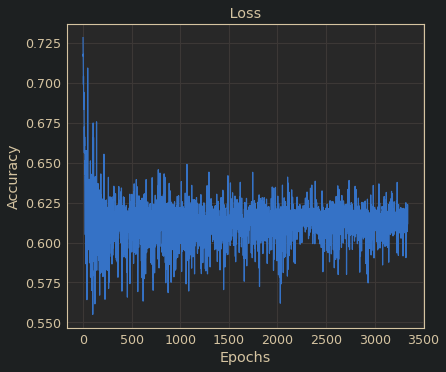

In [ ]:
#@title  train code
from torch import nn
import itertools
from torch import optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
import time

from scipy import ndimage
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"


def train(data_loader, model, optimizer, scheduler, total_epochs, save_interval, save_folder, sets):
    # settings
    batches_per_epoch = len(data_loader)
    log.info('{} epochs in total, {} batches per epoch'.format(total_epochs, batches_per_epoch))
    
    loss_seg = nn.CrossEntropyLoss()
    bce_loss_func = nn.BCEWithLogitsLoss( pos_weight=sets.bce_weight.cuda())
    
    counter=0
    best_loss=1
    losses=[]

   

    print("Current setting is:")
    print(sets)
    print("\n\n")     
    if not sets.no_cuda:
        loss_seg = loss_seg.cuda()
        
    model.train()
    train_time_sp = time.time()

    class_weights = torch.ones(sets.n_seg_classes).cuda()
    class_weights[0] = 0
    
    class_weights /= class_weights.sum()
    
    for epoch in range(total_epochs):
        log.info('Start epoch {}'.format(epoch))
        
        scheduler.step()

        #------moved the schduler to be after the optimizer------


        log.info('lr = {}'.format(scheduler.get_lr()))
        print('len data_loader = {} '.format(len(data_loader)))
        for batch_id, batch_data in enumerate(data_loader):
            dice_losses = []
            total_dice_loss = 0
            
            
            
            # getting data batch
            counter+=1
            batch_id_sp = epoch * batches_per_epoch
           
            if not sets.no_cuda: 
                volumes, mask = batch_data['image'].cuda(), batch_data['mask'].cuda()
                print('cuda')
            else:
              volumes, mask = batch_data['image'], batch_data['mask']

            print('volumes.shape ={}'.format(volumes.shape ))
            print('mask.shape ={}'.format(mask.shape ))
            mask = brats_map_label(mask, sets.n_seg_classes)
            print('mask.shape after brats map label={}'.format(mask.shape ))
            mask = torch.tensor(mask)
            mask = mask.permute(1, 0, 2,3,4)
            print('mask.shape after premute ={}'.format(mask.shape ))
            

          
           

            optimizer.zero_grad()
            out_masks = model(volumes)
            print('out_masks.shape ={}'.format(out_masks.shape ))
            

            !CUDA_LAUNCH_BLOCKING=1
            label_masks= mask

            DICE_W =0.2

           
            outputs_soft    = torch.sigmoid(out_masks)
            
            print('outputs_soft.shape ={}'.format(outputs_soft.shape ))
            
            
             

           

            print('out_masks.shape before ce loss ={}'.format(out_masks.shape ))
            print('mask.shape before ce loss={}'.format(mask.shape ))
            print('out_masks.shape before ce loss ={}'.format(out_masks.shape ))
            print('mask.shape before ce loss={}'.format(mask.shape ))
            #----- trying omthing new ----
            total_ce_loss   = bce_loss_func(out_masks.permute([0,2,3,4,1]), 
                                            # after brats_map_label(), dim 1 of mask_batch is segmantation class.
                                            # It's permuted to the last dim to align with outputs for bce loss computation.
                                            mask.permute([0,2,3,4,1]))


            
            

            
            ### calculaiting the dice loss for evry chanel
            for cls in range(1, sets.n_seg_classes):
                allcls_pred_np  = outputs_soft.data.cpu().numpy()
                allcls_gt_np    = mask.data.cpu().numpy()
                pred = allcls_pred_np[:, cls].astype(np.uint8)
                gt   = allcls_gt_np[ :, cls].astype(np.uint8)
                dice_loss = 1- metric.binary.dc(gt, pred)
                dice_losses.append(dice_loss)
                total_dice_loss = total_dice_loss + dice_loss * class_weights[cls]
            
            # calculating loss
            
            loss = (1 - DICE_W) * total_ce_loss + DICE_W * total_dice_loss
            print('total_ce_loss={}'.format(total_ce_loss))
            print('total_dice_loss={}'.format(total_dice_loss))
            losses.append(loss)
            

            optimizer.zero_grad()
            loss.backward()
            
            
            optimizer.step()

            avg_batch_time = (time.time() - train_time_sp) / (1 + batch_id_sp)
            log.info(
                    'Batch: {}-{} ({}), loss = {:.3f}, loss_seg = {:.3f}, avg_batch_time = {:.3f}'\
                    .format(epoch, batch_id, batch_id_sp, loss.item(), loss.item(), avg_batch_time))
          
            if not sets.ci_test:
                # save model
                if  counter != 0 and counter % save_interval == 0 :
                
                    model_save_path = '{}_epoch_{}_batch_{}.pth.tar'.format(save_folder, epoch, batch_id)
                    best_loss = loss
                    model_save_dir = os.path.dirname(model_save_path)
                    if not os.path.exists(model_save_dir):
                        os.makedirs(model_save_dir)
                    
                    log.info('Save checkpoints: epoch = {}, batch_id = {}'.format(epoch, batch_id)) 
                    print('saved the model in {}'.format(model_save_path))
                    sets.resume_path= model_save_path
                    torch.save({
                                'ecpoch': epoch,
                                'batch_id': batch_id,
                                'state_dict': model.state_dict(),
                                'optimizer': optimizer.state_dict()},
                                model_save_path)
                    #print('saved the model')
                            
    print('Finished training')
    xaxis= list(range(0, counter))
    plt.plot(xaxis,losses)
    plt.title(' Loss ')

    # naming the x axis
    plt.xlabel('Pa')
    # naming the y axis
    plt.ylabel('Loss')

    # function to show the plot
    plt.show()            
    if sets.ci_test:
        exit()


if __name__ == '__main__':
      
      sets =parse_opts()  

      print('passed sets')


      sets.img_list = path/'train.txt'
      sets.no_cuda = False
      sets.gpu_id = [0]
      sets.data_root = path 
      sets.pretrain_path =  path/'pretrain/resnet_10.pth'
      sets.num_workers = 0
      sets.n_seg_classes = 4
      sets.model_depth = 10
      sets.resnet_shortcut = 'B'
      sets.ci_test = False
      sets.save_intervals=10
      sets.n_epochs=10
      sets.batch_size = 1
     
      sets.input_D = 120 #14
      sets.input_H = 130 #28
      sets.input_W = 130 #28
      sets.orig_patch_size= '152,160,152'

      #-- added somthing for the test, this is taken from https://github.com/askerlee/segtran/blob/master/code/train3d.py train code
      sets.bce_weight =[0., 3, 1, 1.75]  # bg, ET, WT, TC

      #sets.bce_weight = torch.tensor(sets.bce_weight).cuda()
      sets.bce_weight = torch.tensor(sets.bce_weight).cpu()
      sets.bce_weight = sets.bce_weight * (sets.n_seg_classes - 1) / sets.bce_weight.sum()


      
      sets.save_folder = "/content/drive/My Drive/Deep Learning Final Project/trails/models/{}_{}".format( sets.model,  sets.model_depth )
    
      
 
     
    
      torch.manual_seed(sets.manual_seed)
      class Identity(nn.Module):
          def __init__(self):
            super(Identity, self).__init__()

          def forward(self, x):
              return x
      
      model, parameters = generate_model(sets)
      model.conv_seg = Identity()
      
      #for param in model.parameters():
      #    param.requires_grad = False
      #for name, param in model.named_parameters():
      #    print('name = {}'.format(name))
      #    param.requires_grad = False
      #    if name == 'module.conv_seg.6.weight':
      #      param.requires_grad = True
      #      print('{} with  grad'.format(name))

      
      
      model=OuerNewModel(model,sets)
      #print (model)
      if torch.cuda.is_available():
        model.cuda()
      
      # optimizer
      if sets.ci_test:
          params = [{'params': parameters, 'lr': sets.learning_rate}]
      else:
          params = [
                  { 'params': parameters['base_parameters'], 'lr': sets.learning_rate }, 
                  { 'params': parameters['new_parameters'], 'lr': sets.learning_rate*100 }
                  ]
      
      optimizer = torch.optim.Adam(model.parameters(),lr=sets.learning_rate)#learning_rate)
          
      scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.99)
      

      # train from resume
      if sets.resume_path:
          
          if os.path.isfile(sets.resume_path):
              print('resumed the path')
              print("=> loading checkpoint '{}'".format(sets.resume_path))
              checkpoint = torch.load(sets.resume_path)
              model.load_state_dict(checkpoint['state_dict'])
              optimizer.load_state_dict(checkpoint['optimizer'])
              print("=> loaded checkpoint '{}' (epoch {})"
                .format(sets.resume_path, checkpoint['epoch']))
              print('loaded the model')
              

      # getting data
      sets.phase = 'train'
      if sets.no_cuda:
          sets.pin_memory = False
      else:
          sets.pin_memory = True    
      
      training_dataset = BratsSet(sets,sets.data_root, sets.img_list)
      data_loader = DataLoader(training_dataset, batch_size=sets.batch_size, shuffle=True, num_workers=sets.num_workers, pin_memory=sets.pin_memory)
      

      
##############################################
      print(sets.save_folder)
      # training
      train(data_loader, model, optimizer, scheduler, total_epochs=sets.n_epochs, save_interval=sets.save_intervals, save_folder=sets.save_folder, sets=sets) 

In [ ]:
vizualize the network

**add the tset func**

randome and randome noise
cuda
volumes.shape before fowered pass =torch.Size([1, 4, 138, 168, 139])
mask.shape before fowered pass =torch.Size([1, 138, 168, 139])
mask.shape after brats map label=torch.Size([4, 1, 138, 168, 139])
mask.shape after premute =torch.Size([1, 4, 138, 168, 139])
x.shape before entry to my new layers:torch.Size([1, 4, 138, 168, 139]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 138, 168, 139]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 36, 42, 36]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 36, 42, 36])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 32, 34, 40, 34])
x_downsized1.shape : torch.Size([1, 8, 68, 83, 68])
x_downsized2.shape : torch.Size([1, 16, 33, 40, 33])
x_downsized3.shape : torch.Size([1, 32, 31, 38, 31])
x_downsized2_reshaped.shape : torch.Size([1, 16, 36, 42, 36])
x_downsized2_concatinted.shape : torch.Size([1, 32, 36, 42, 36])
x_downsized2_concatinted_up3.shape : torch.Size([1, 8, 72, 84, 72])
x_downsized1_reshaped.shape : torch.Size([1, 8, 72, 84, 72])
x_downsized1_concatinted.shape : torch.Size([1, 16, 7

"\nprint('out_masks shape after being fowerd passed={}'.format(out_masks.shape))\n(h1, w1, d1) = mask.shape[-3:]\n(h2, w2, d2) = out_masks.shape[-3:]\n\nprint('mask.shape[-3:] ={}'.format(mask.shape[-3:]))\nprint('mask.shape[-3:] ={}'.format(out_masks.shape[-3:]))\npadder1 = torch.zeros(1,4,h1-h2,w2,d2).cuda()\nout_masks= torch.cat([out_masks,padder1], dim = 2)\npadder2 = torch.zeros(1,4,h1,w1-w2,d2).cuda()\nout_masks= torch.cat([out_masks,padder2], dim = 3)\npadder3 = torch.zeros(1,4,h1,w1,d1-d2).cuda()\nout_masks= torch.cat([out_masks,padder3], dim = 4)\n     \n\nout_masks= torch.nn.functional.upsample(out_masks,mask.shape[2:])\n\nprint('out_masks shape after being fowerd passed and upsampled={}'.format(out_masks.shape))\noutputs_soft  = torch.sigmoid(out_masks)\nprint(' channel 1 max val: {}'.format(outputs_soft[0,1].max()))\nprint(' channel 2 max val: {}'.format(outputs_soft[0,2].max()))\nprint(' channel 3 max val: {}'.format(outputs_soft[0,3].max()))\nprint(' channel 0 max val: {}

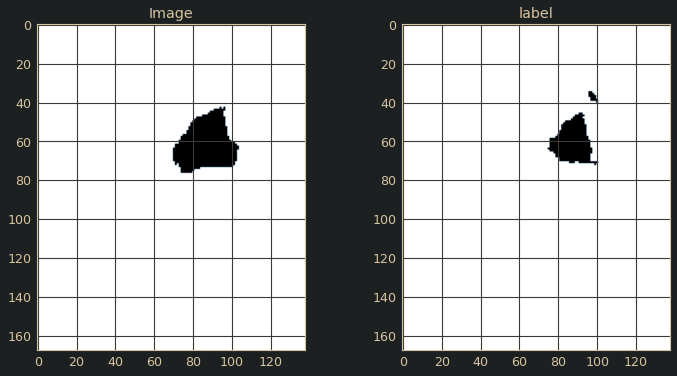

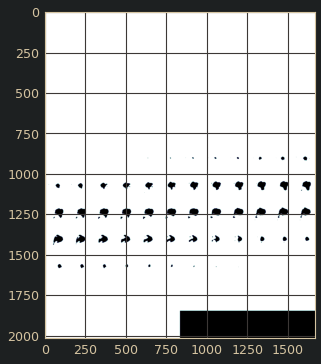

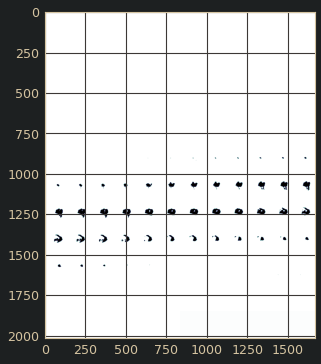

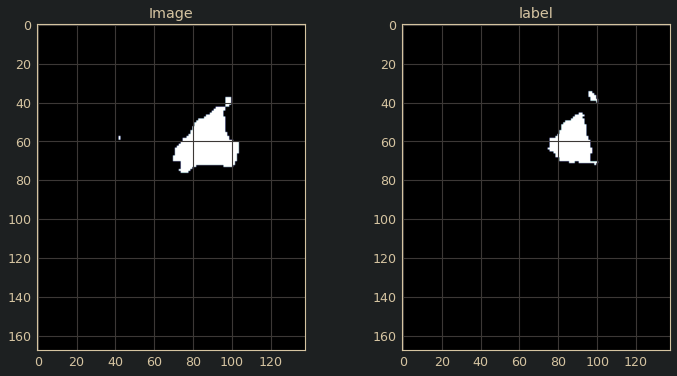

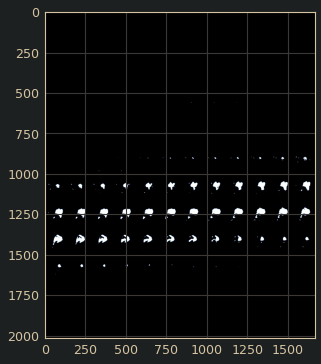

...

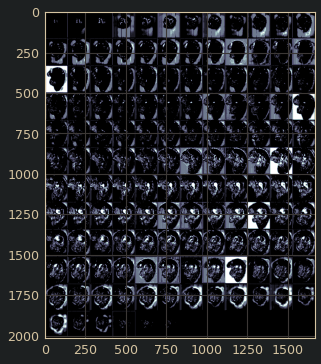

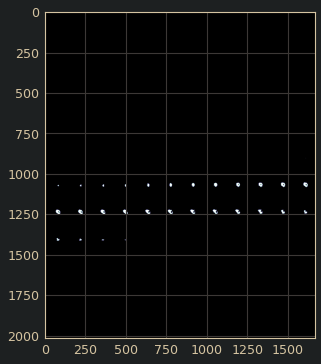

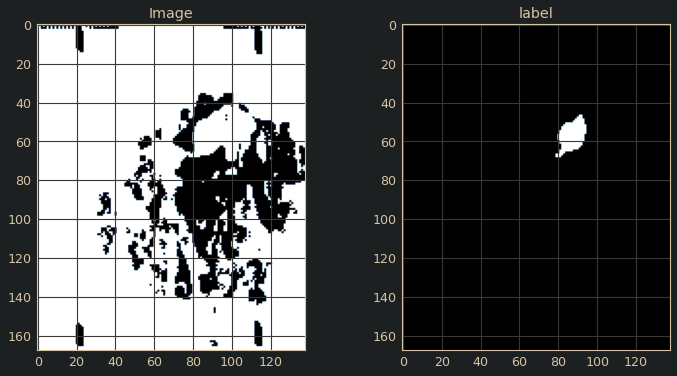

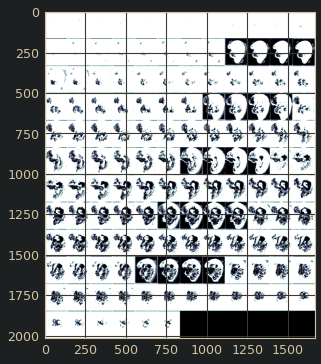

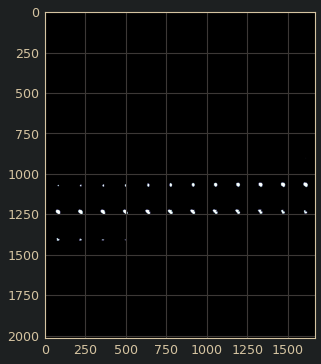

In [ ]:
      dataset_iter = iter(data_loader)
      batch_data = next(dataset_iter)
      #print('data_loader = {}'.format(data_loader))
      if not sets.no_cuda: 
          volumes, mask = batch_data['image'].cuda(), batch_data['mask'].cuda()
          print('cuda')
      else:
        volumes, mask = batch_data['image'], batch_data['mask']
      
      print('volumes.shape before fowered pass ={}'.format(volumes.shape ))
      print('mask.shape before fowered pass ={}'.format(mask.shape ))
      mask = brats_map_label(mask, sets.n_seg_classes)
      print('mask.shape after brats map label={}'.format(mask.shape ))
      mask = torch.tensor(mask)
      mask = mask.permute(1, 0, 2,3,4)
      print('mask.shape after premute ={}'.format(mask.shape ))
      optimizer.zero_grad()
      out_masks = model(volumes)
      print('out_masks.shape ={}'.format(out_masks.shape ))

      outputs_soft    = torch.sigmoid(out_masks)
     
      outputs_soft = torch.where(outputs_soft>0.5, 1, 0) 
      out_masks = outputs_soft
      print('outputs_soft.shape ={}'.format(outputs_soft.shape ))
      print('vizualize volumes and label AFTER fowerd pass channel 0:')
      vizualize_a_single_img_and_its_lable(out_masks[0,0].cpu().detach().numpy(), mask[0,0].cpu(), montage_display = True)
      print('vizualize volumes and label AFTER fowerd pass channel 1:')
      vizualize_a_single_img_and_its_lable(out_masks[0,1].cpu().detach().numpy(), mask[0,1].cpu(), montage_display = True)
      print('vizualize volumes and label AFTER fowerd pass channel 2:')
      vizualize_a_single_img_and_its_lable(out_masks[0,2].cpu().detach().numpy(), mask[0,2].cpu(), montage_display = True)
      print('vizualize volumes and label AFTER fowerd pass channel 3:')
      vizualize_a_single_img_and_its_lable(out_masks[0,3].cpu().detach().numpy(), mask[0,3].cpu(), montage_display = True)
   
   
   
         

python3: can't open file 'parsing.py': [Errno 2] No such file or directory
finished last method
Current setting is:
Namespace(batch_size=1, bce_weight=['[', '0', '.', ',', ' ', '3', ',', ' ', '1', ',', ' ', '1', '.', '7', '5', ']'], ci_test=False, data_root='/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training', gpu_id=[0], img_list=PosixPath('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training/valid.txt'), img_name='Null', input_D=56, input_H=448, input_W=448, input_patch_size='136, 152, 136', iters='100,500,1000', learning_rate=0.001, manual_seed=1, model='resnet', model_depth=10, n_epochs=200, n_seg_classes=4, new_layer_names=['conv_seg'], no_cuda=False, num_workers=4, orig_patch_size=[136, 152, 136], phase='train', pretrain_path=PosixPath('/content/drive/My Drive/Deep Learning Final Project/MICCAI_BraTS_2019_Data_Training/pretrain/resnet_10.pth'), resnet_shortcut='B', resume_path='/content/drive/My Drive/Deep Learning F

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:182: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.


returned parameters
finished loading the model
self.image_list =['HGG/BraTS19_CBICA_AUW_1', 'HGG/BraTS19_CBICA_APR_1', 'HGG/BraTS19_TMC_21360_1', 'HGG/BraTS19_CBICA_ALU_1', 'HGG/BraTS19_TCIA06_211_1', 'HGG/BraTS19_TCIA02_208_1', 'HGG/BraTS19_CBICA_AQY_1', 'HGG/BraTS19_TCIA02_377_1', 'HGG/BraTS19_TCIA03_419_1', 'HGG/BraTS19_CBICA_AOP_1', 'HGG/BraTS19_CBICA_AAP_1', 'HGG/BraTS19_CBICA_AQD_1', 'HGG/BraTS19_CBICA_AQR_1', 'HGG/BraTS19_TCIA06_184_1', 'HGG/BraTS19_TCIA08_406_1', 'HGG/BraTS19_TMC_27374_1', 'HGG/BraTS19_CBICA_ATB_1', 'HGG/BraTS19_CBICA_ATD_1', 'HGG/BraTS19_CBICA_AXJ_1', 'HGG/BraTS19_2013_18_1', 'HGG/BraTS19_TCIA08_162_1', 'HGG/BraTS19_CBICA_ABY_1', 'HGG/BraTS19_CBICA_ARF_1', 'HGG/BraTS19_TCIA02_118_1', 'HGG/BraTS19_TCIA05_478_1', 'HGG/BraTS19_CBICA_AYA_1', 'HGG/BraTS19_TCIA02_274_1', 'HGG/BraTS19_TCIA02_283_1', 'HGG/BraTS19_TMC_15477_1', 'HGG/BraTS19_CBICA_BHZ_1', 'HGG/BraTS19_2013_23_1', 'HGG/BraTS19_CBICA_AXW_1', 'HGG/BraTS19_CBICA_BKV_1', 'HGG/BraTS19_TCIA01_378_1', 'HGG/BraT

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x1_img4.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 40, 34, 34]) 
x2.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 16, 40, 34, 34])
x2_conv.shape in fowerd pass after passing the 4 images throw the pretrained and concatnted: torch.Size([1, 32, 38, 32, 32])
x_downsized1.shape : torch.Size([1, 8, 79, 63, 66])
x_downsized2.shape : torch.Size([1, 16, 38, 30, 32])
x_downsized3.shape : torch.Size([1, 32, 36, 28, 30])
x_downsized2_reshaped.shape : torch.Size([1, 16, 40, 34, 34])
x_downsized2_concatinted.shape : torch.Size([1, 32, 40, 34, 34])
x_downsized2_concatinted_up3.shape : torch.Size([1, 8, 80, 68, 68])
x_downsized1_reshaped.shape : torch.Size([1, 8, 80, 68, 68])
x_downsized1_concatinted.shape : torch.Size([1, 16, 80, 68, 68])
x_downsized1_concatinted_up1.shape : torch.Size([1, 4, 160, 136, 136])
x_downsized1_

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

vizualize volumes and label AFTER fowerd pass channel 2:
vizualiztion: display_img.shape  =  (168, 129, 141)
vizualiztion: display_label.shape  =  (168, 129, 141)
vizualize volumes and label AFTER fowerd pass channel 3:
vizualiztion: display_img.shape  =  (168, 129, 141)
vizualiztion: display_label.shape  =  (168, 129, 141)
cuda
volumes.shape =torch.Size([1, 4, 176, 138, 136])
mask.shape =torch.Size([1, 176, 138, 136])
mask.shape after brats map label=torch.Size([4, 1, 176, 138, 136])
mask.shape after premute =torch.Size([1, 4, 176, 138, 136])
x.shape before entry to my new layers:torch.Size([1, 4, 176, 138, 136]) 
x1_img1.shape before entry to my new layers:torch.Size([1, 1, 176, 138, 136]) 
x1_img1.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img2.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img3.shape in fowerd pass of till entry to pretrained resnet:torch.Size([1, 4, 44, 36, 34]) 
x1_img4.sh

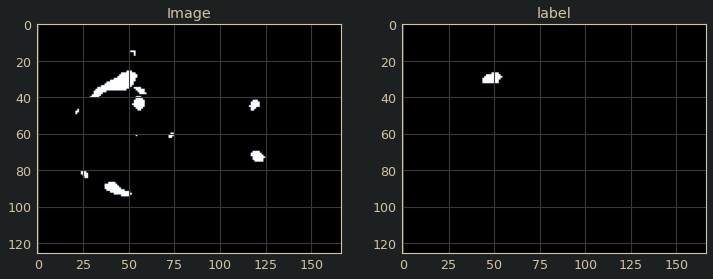

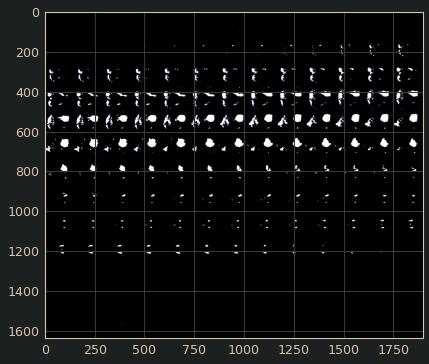

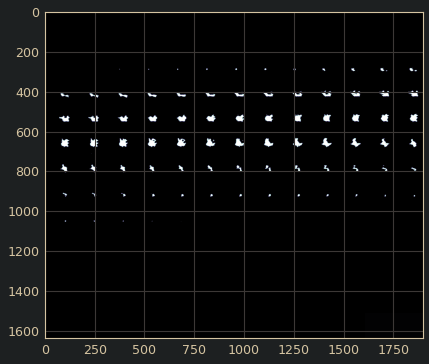

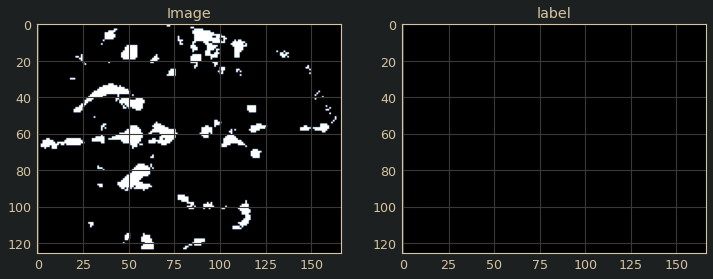

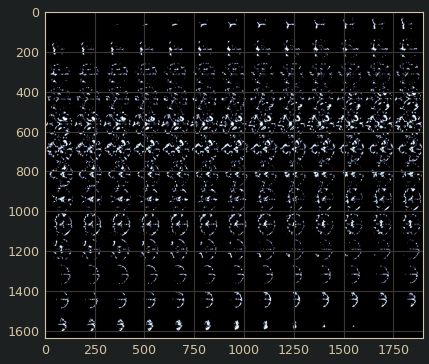

...

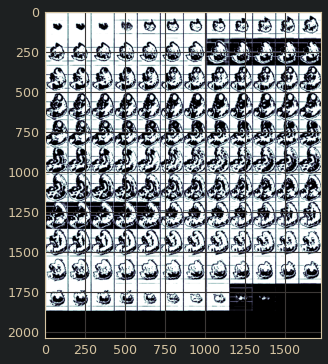

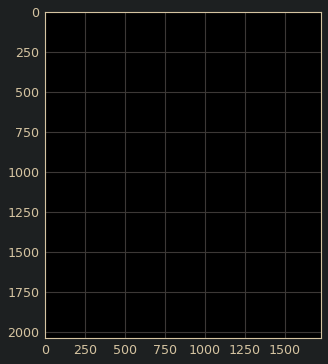

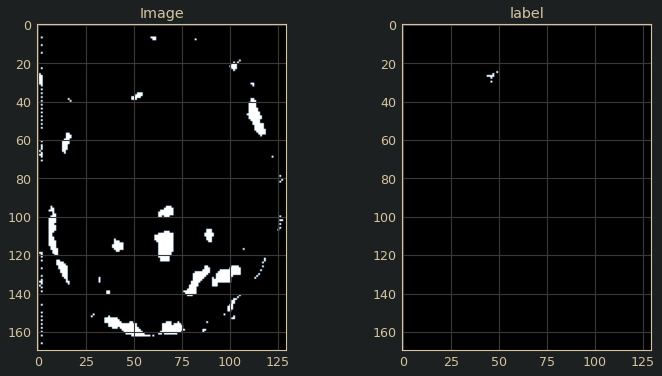

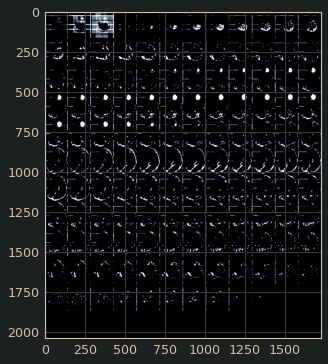

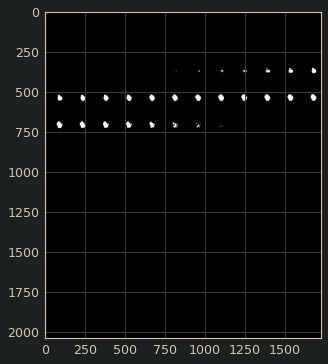

In [ ]:
#@title  test code

def test_calculate_metric(sets,iter_nums,net,db_test):
   
   
    loss1_WT=0
    loss1_ET=0
    loss1_TC=0
    loss2_WT=0
    loss2_ET=0
    loss2_TC=0
 
    counter=0
    net.cuda()
    net.eval()
    preproc_fn = None
    test_save_paths=[None]
    has_mask =    False

    for batch_id, batch_data in enumerate(data_loader):

    
        
      if not sets.no_cuda: 
                volumes, mask = batch_data['image'].cuda(), batch_data['mask'].cuda()
                print('cuda')
      else:
              volumes, mask = batch_data['image'], batch_data['mask']
      counter+=1 
      print('volumes.shape ={}'.format(volumes.shape ))
      print('mask.shape ={}'.format(mask.shape ))
      mask = brats_map_label(mask, sets.n_seg_classes)
      print('mask.shape after brats map label={}'.format(mask.shape ))
      mask = torch.tensor(mask)
      mask = mask.permute(1, 0, 2,3,4)
      print('mask.shape after premute ={}'.format(mask.shape )) 
      out_masks = model(volumes)
      print('out_masks.shape ={}'.format(out_masks.shape ))
      outputs_soft    = torch.sigmoid(out_masks)
      outputs_soft = torch.where(outputs_soft>0.5, 1, 0) 
      print('outputs_soft.shape ={}'.format(outputs_soft.shape ))
      dice_losses1 = []
      dice_losses2 = []
      total_dice_loss1 = 0
      total_dice_loss2 = 0
      for cls in range(1, sets.n_seg_classes):
                if counter!=0 and counter% sets.save_intervals ==0:
                  print('vizualize volumes and label AFTER fowerd pass channel {}:'.format(cls))
                  vizualize_a_single_img_and_its_lable(outputs_soft[0, cls].cpu().detach().numpy(), mask[0, cls].cpu().detach().numpy(), montage_display = True)
                  
                 
      loss1_WT= (loss1_WT*(counter-1)+dice_loss_indiv(outputs_soft[:, 1], mask[ :, 1]))/counter
      loss1_ET=(loss1_ET*(counter-1)+dice_loss_indiv(outputs_soft[:, 2], mask[ :, 2]))/counter
      loss1_TC=(loss1_ET*(counter-1)+dice_loss_indiv(outputs_soft[:, 3], mask[ :, 3]))/counter
      allcls_pred_np  = outputs_soft.data.cpu().numpy()
      allcls_gt_np    = mask.data.cpu().numpy()
      pred = allcls_pred_np[:, 1].astype(np.uint8)
      gt   = allcls_gt_np[ :, 1].astype(np.uint8)
      loss2_WT= (loss2_WT*(counter-1)+(1-metric.binary.dc(gt, pred)))/counter
      pred = allcls_pred_np[:, 2].astype(np.uint8)
      gt   = allcls_gt_np[ :, 2].astype(np.uint8)
      loss2_ET= (loss2_ET*(counter-1)+(1-metric.binary.dc(gt, pred)))/counter
      pred = allcls_pred_np[:, 3].astype(np.uint8)
      gt   = allcls_gt_np[ :, 3].astype(np.uint8)
      loss2_TC= (loss2_TC*(counter-1)+(1-metric.binary.dc(gt, pred)))/counter



    print('loss1_WT={}'.format(loss1_WT))
    print('loss1_TC={}'.format(loss1_TC)) 
    print('loss1_ET={}'.format(loss1_ET))
    print('loss2_WT={}'.format(loss2_WT))
    print('loss2_TC={}'.format(loss2_TC)) 
    print('loss2_ET={}'.format(loss2_ET))          
    return loss1_WT,loss1_WT,counter


if __name__ == '__main__':

    # settting
      sets = parse_opts()
      sets.target_type = "normal"
      sets.phase = 'train'
      sets.resume_path = '/content/drive/My Drive/Deep Learning Final Project/trails/models/resnet_10_epoch_3_batch_159.pth.tar'
      sets.pretrain_path =  path/'pretrain/resnet_10.pth'
      sets.img_list =   path/'valid.txt'
      sets.model_depth = 10
      sets.n_seg_classes = 4
      sets.save_intervals=10
      sets.gpu_id = [0]
      sets.orig_patch_size= [136,152,136]
      sets.no_cuda = False
      sets.iters ='100,500,1000'
      sets.input_patch_size='136, 152, 136'
      sets.batch_size = 1 

      print("Current setting is:")
      print(sets)
      print("\n\n")

     
      print('sets.resume_path={}'.format(sets.resume_path))
      checkpoint = torch.load(sets.resume_path)
      net, _ = generate_model(sets)
      net = model=OuerNewModel(net,sets)
      net.load_state_dict(checkpoint['state_dict'])
      print('finished loading the model')

      
      testing_data = BratsSet(sets,sets.data_root, sets.img_list)
      data_loader = DataLoader(testing_data, batch_size=sets.batch_size, shuffle=False, num_workers=1, pin_memory=False)
      iter_nums = [ int(i) for i in sets.iters.split(",") ]
      with torch.no_grad():
              print('kupi')
              dices1,dices2,counter = test_calculate_metric(sets,iter_nums,net,data_loader)
              